<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"></ul></div>

In [31]:
import glob

import pandas as pd

import numpy as np

from tqdm import tqdm

import matplotlib.image as mpimg
import os
import pandas as pd
from skimage import io, transform
import numpy as np
import matplotlib.pyplot as plt

In [32]:
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils
import torch.nn as nn
import torch.nn.functional as F
import torch
from torch.autograd import Variable
from torchvision.utils import save_image
from torchvision.utils import make_grid

In [33]:
img_shape = (3, 28, 28)

cuda = True if torch.cuda.is_available() else False
cuda = True if torch.cuda.is_available() else False


class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()

        self.label_emb = nn.Embedding(43,43)

        def block(in_feat, out_feat, normalize=True):
            layers = [nn.Linear(in_feat, out_feat)]
            if normalize:
                layers.append(nn.BatchNorm1d(out_feat, 0.8))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers

        self.model = nn.Sequential(
            *block(100 + 43, 128, normalize=False),
            *block(128, 256),
            *block(256, 512),
            *block(512, 1024),
            nn.Linear(1024, int(np.prod(img_shape))),
            nn.Tanh()
        )

    def forward(self, noise, labels):
        # Concatenate label embedding and image to produce input
        gen_input = torch.cat((self.label_emb(labels), noise), -1)
        img = self.model(gen_input)
        img = img.view(img.size(0), *img_shape)
        return img


class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        self.label_embedding = nn.Embedding(43,43)

        #cGAN architecture
        self.model = nn.Sequential(
            nn.Linear(43 + int(np.prod(img_shape)), 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 512),
            nn.Dropout(0.4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 256),  #nn.Linear(512, 512), 
            nn.Dropout(0.4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 1),
            nn.Sigmoid(),
        )
        

    def forward(self, img, labels):
        # Concatenate label embedding and image to produce input
        print(img.view(img.size(0), -1).size(), self.label_embedding(labels).size())
        d_in = torch.cat((img.view(img.size(0), -1), self.label_embedding(labels).view(img.size(0),43)), -1)
        validity = self.model(d_in)
        return validity

In [34]:
class Rescale(object):
    """Rescale the image in a sample to a given size.

    Args:
        output_size (tuple or int): Desired output size. If tuple, output is
            matched to output_size. If int, smaller of image edges is matched
            to output_size keeping aspect ratio the same.
    """

    def __init__(self, output_size):
        assert isinstance(output_size, (int, tuple))
        self.output_size = output_size

    def __call__(self, sample):
        image, landmarks = sample['image'], sample['labels']

        h, w = image.shape[:2]
        if isinstance(self.output_size, int):
            if h > w:
                new_h, new_w = self.output_size * h / w, self.output_size
            else:
                new_h, new_w = self.output_size, self.output_size * w / h
        else:
            new_h, new_w = self.output_size

        new_h, new_w = int(new_h), int(new_w)

        img = transform.resize(image, (new_h, new_w))

        # h and w are swapped for landmarks because for images,
        # x and y axes are axis 1 and 0 respectively

        return {'image': img, 'labels': landmarks}



class ToTensor(object):
    """Convert ndarrays in sample to Tensors."""

    def __call__(self, sample):
        image, landmarks = sample['image'], sample['labels']

        # swap color axis because
        # numpy image: H x W x C
        # torch image: C X H X W
        image = image.transpose((2, 0, 1))
        return {'image': torch.from_numpy(image),
                'labels': torch.from_numpy(landmarks)}



  

In [35]:
class custom_dataloader(Dataset):
    """Face Landmarks dataset."""

    def __init__(self, csv_file, root_dir, transform=None):
        """
        Args:
            csv_file (string): Path to the csv file with annotations.
            root_dir (string): Directory with all the images.
            transform (callable, optional): Optional transform to be applied
                on a sample.
        """
        self.road_signs = pd.read_csv(csv_file)
        self.root_dir = root_dir
        self.transform = transform

    def __len__(self):
        return len(self.road_signs)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        img_name = os.path.join(self.root_dir,
                                str(self.road_signs.iloc[idx, 0]))
        image = io.imread(img_name+".png")
        landmarks = self.road_signs.iloc[idx, 1:]
        landmarks = np.array([landmarks])
        landmarks = landmarks.astype('float').reshape(-1, 1)
        sample = {'image': image, 'labels': landmarks}

        if self.transform:
            sample = self.transform(sample)

        return sample

In [36]:
road_sign = custom_dataloader(csv_file='train-pngs/trainlabels.csv',
                                    root_dir='train-pngs/',transform=transforms.Compose([
                                               Rescale(28),ToTensor()]))




In [37]:
dataloader = torch.utils.data.DataLoader(road_sign,batch_size=30,shuffle=True)

In [38]:
adversarial_loss = torch.nn.MSELoss()

# Initialize generator and discriminator
generator = Generator()
discriminator = Discriminator()

if cuda:
    generator.cuda()
    discriminator.cuda()
    adversarial_loss.cuda()


In [39]:
optimizer_G = torch.optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5,0.999))

Tensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor

In [40]:
def sample_image(n_row, epoch,batches_done):
    """Saves a grid of generated digits ranging from 0 to n_classes"""
    # Sample noise
    z = Variable(FloatTensor(np.random.normal(0, 1, (n_row ** 2, 100))))
    # Get labels ranging from 0 to n_classes for n rows
    labels = np.array([num for _ in range(n_row) for num in range(n_row)])
    labels = Variable(LongTensor(labels))
    gen_imgs = generator(z, labels)
    save_image(gen_imgs.data, "images2/epoch%d-batch%d.png" % (epoch,batches_done), nrow=n_row, normalize=True)

FloatTensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor
LongTensor = torch.cuda.LongTensor if cuda else torch.LongTensor

In [54]:
depocherr = []
gepocherr = []

In [58]:

for epoch in range(60):
    derr = [] 
    gerr = []
    for i, (imgs) in enumerate(dataloader):

        # Adversarial ground truths
        
        valid = Variable(FloatTensor(imgs['labels'].size(0), 1).fill_(1.0), requires_grad=False)
        fake = Variable(FloatTensor(imgs['labels'].size(0), 1).fill_(0.0), requires_grad=False)

        # Configure input
        real_imgs = Variable(imgs['image'].type(FloatTensor))
        labels = Variable(imgs['labels'].type(LongTensor))
        # -----------------
        #  Train Generator
        # -----------------

        optimizer_G.zero_grad()

        # Sample noise as generator input
        z = Variable(FloatTensor(np.random.normal(0, 1, (imgs['image'].shape[0], 100))))
        gen_labels = Variable(LongTensor(np.random.randint(0, 43, imgs['image'].shape[0])))
        # Generate a batch of images
        gen_imgs = generator(z,gen_labels)

        # Loss measures generator's ability to fool the discriminator
        g_loss = adversarial_loss(discriminator(gen_imgs,gen_labels), valid)

        g_loss.backward()
        optimizer_G.step()

        # ---------------------
        #  Train Discriminator
        # ---------------------

        optimizer_D.zero_grad()

        # Measure discriminator's ability to classify real from generated samples
        d_real_loss = adversarial_loss(discriminator(real_imgs, labels),valid)
        d_fake_loss = adversarial_loss(discriminator(gen_imgs.detach(),gen_labels), fake)
        d_loss = (d_real_loss + d_fake_loss) / 2

        d_loss.backward()
        optimizer_D.step()

        print(
            "[Epoch %d/%d] [Batch %d/%d] [D loss: %f] [G loss: %f]"
            % (epoch, 200, i, len(dataloader), d_loss.item(), g_loss.item())
        )
        
        #save loss into array
        derr.append(d_loss.item())
        gerr.append(g_loss.item())

        batches_done = epoch * len(dataloader) + i
        if batches_done % 30 == 0:
            sample_image(n_row=10, epoch=epoch, batches_done=batches_done)
            torch.save(generator.state_dict(), "cGAN-2.ckpt")
        
    depocherr.append(sum(derr))
    gepocherr.append(sum(gerr))
    

plt.savefig('./cgan-plot/p2.png')

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 0/1307] [D loss: 0.108585] [G loss: 0.677038]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 1/1307] [D loss: 0.196950] [G loss: 0.506382]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 2/1307] [D loss: 0.133316] [G loss: 0.488007]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 3/1307] [D loss: 0.142454] [G loss: 0.597597]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 4/1307] [D loss: 0.17

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 40/1307] [D loss: 0.221143] [G loss: 0.402182]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 41/1307] [D loss: 0.165535] [G loss: 0.437445]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 42/1307] [D loss: 0.208937] [G loss: 0.493521]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 43/1307] [D loss: 0.126385] [G loss: 0.539456]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 44/1307] [D loss:

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 80/1307] [D loss: 0.181694] [G loss: 0.462893]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 81/1307] [D loss: 0.166587] [G loss: 0.582817]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 82/1307] [D loss: 0.184488] [G loss: 0.514124]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 83/1307] [D loss: 0.165685] [G loss: 0.442338]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 84/1307] [D loss:

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 120/1307] [D loss: 0.132838] [G loss: 0.535079]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 121/1307] [D loss: 0.204405] [G loss: 0.414541]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 122/1307] [D loss: 0.161236] [G loss: 0.468507]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 123/1307] [D loss: 0.189946] [G loss: 0.480008]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 124/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 160/1307] [D loss: 0.136877] [G loss: 0.615972]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 161/1307] [D loss: 0.128110] [G loss: 0.628490]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 162/1307] [D loss: 0.158451] [G loss: 0.608496]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 163/1307] [D loss: 0.182491] [G loss: 0.331350]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 164/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 200/1307] [D loss: 0.158411] [G loss: 0.529750]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 201/1307] [D loss: 0.173095] [G loss: 0.486616]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 202/1307] [D loss: 0.157071] [G loss: 0.471476]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 203/1307] [D loss: 0.188934] [G loss: 0.333738]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 204/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 240/1307] [D loss: 0.183046] [G loss: 0.376224]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 241/1307] [D loss: 0.147250] [G loss: 0.496839]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 242/1307] [D loss: 0.152231] [G loss: 0.617300]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 243/1307] [D loss: 0.153154] [G loss: 0.446213]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 244/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 280/1307] [D loss: 0.141749] [G loss: 0.500321]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 281/1307] [D loss: 0.141392] [G loss: 0.468793]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 282/1307] [D loss: 0.186718] [G loss: 0.439673]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 283/1307] [D loss: 0.159266] [G loss: 0.512162]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 284/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 320/1307] [D loss: 0.145978] [G loss: 0.548114]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 321/1307] [D loss: 0.172111] [G loss: 0.433760]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 322/1307] [D loss: 0.190594] [G loss: 0.453164]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 323/1307] [D loss: 0.130095] [G loss: 0.494672]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 324/1307] [D loss: 0.175724] [G loss: 0.464397]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 360/1307] [D loss: 0.136526] [G loss: 0.564428]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 361/1307] [D loss: 0.132750] [G loss: 0.588987]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 362/1307] [D loss: 0.152758] [G loss: 0.439716]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 363/1307] [D loss: 0.169959] [G loss: 0.437541]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 364/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 400/1307] [D loss: 0.182393] [G loss: 0.504818]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 401/1307] [D loss: 0.194064] [G loss: 0.528138]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 402/1307] [D loss: 0.151768] [G loss: 0.616395]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 403/1307] [D loss: 0.171148] [G loss: 0.536854]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 404/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 440/1307] [D loss: 0.181451] [G loss: 0.580918]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 441/1307] [D loss: 0.181667] [G loss: 0.488861]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 442/1307] [D loss: 0.198613] [G loss: 0.624109]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 443/1307] [D loss: 0.174628] [G loss: 0.498769]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 444/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 480/1307] [D loss: 0.142880] [G loss: 0.408638]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 481/1307] [D loss: 0.215523] [G loss: 0.505989]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 482/1307] [D loss: 0.188674] [G loss: 0.373778]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 483/1307] [D loss: 0.154951] [G loss: 0.513062]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 484/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 520/1307] [D loss: 0.161595] [G loss: 0.361264]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 521/1307] [D loss: 0.165724] [G loss: 0.453404]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 522/1307] [D loss: 0.198552] [G loss: 0.598326]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 523/1307] [D loss: 0.176500] [G loss: 0.525802]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 524/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 560/1307] [D loss: 0.198844] [G loss: 0.447930]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 561/1307] [D loss: 0.174124] [G loss: 0.595939]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 562/1307] [D loss: 0.141665] [G loss: 0.609840]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 563/1307] [D loss: 0.148498] [G loss: 0.394299]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 564/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 600/1307] [D loss: 0.174215] [G loss: 0.459810]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 601/1307] [D loss: 0.144842] [G loss: 0.371331]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 602/1307] [D loss: 0.195515] [G loss: 0.524283]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 603/1307] [D loss: 0.170064] [G loss: 0.415704]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 604/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 640/1307] [D loss: 0.170730] [G loss: 0.531318]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 641/1307] [D loss: 0.159868] [G loss: 0.597051]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 642/1307] [D loss: 0.167105] [G loss: 0.388939]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 643/1307] [D loss: 0.187224] [G loss: 0.429215]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 644/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 680/1307] [D loss: 0.119716] [G loss: 0.498475]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 681/1307] [D loss: 0.170730] [G loss: 0.491063]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 682/1307] [D loss: 0.179029] [G loss: 0.385690]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 683/1307] [D loss: 0.207360] [G loss: 0.430443]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 684/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 720/1307] [D loss: 0.117610] [G loss: 0.516301]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 721/1307] [D loss: 0.157823] [G loss: 0.554487]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 722/1307] [D loss: 0.176205] [G loss: 0.547036]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 723/1307] [D loss: 0.209538] [G loss: 0.288627]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 724/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 760/1307] [D loss: 0.172252] [G loss: 0.426912]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 761/1307] [D loss: 0.189058] [G loss: 0.397941]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 762/1307] [D loss: 0.145369] [G loss: 0.475289]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 763/1307] [D loss: 0.150777] [G loss: 0.434311]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 764/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 800/1307] [D loss: 0.146464] [G loss: 0.540103]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 801/1307] [D loss: 0.135486] [G loss: 0.425268]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 802/1307] [D loss: 0.237900] [G loss: 0.586348]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 803/1307] [D loss: 0.146069] [G loss: 0.607305]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 804/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 840/1307] [D loss: 0.185889] [G loss: 0.422253]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 841/1307] [D loss: 0.156204] [G loss: 0.486156]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 842/1307] [D loss: 0.127446] [G loss: 0.428702]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 843/1307] [D loss: 0.236643] [G loss: 0.484219]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 844/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 880/1307] [D loss: 0.130517] [G loss: 0.523039]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 881/1307] [D loss: 0.150808] [G loss: 0.476287]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 882/1307] [D loss: 0.119313] [G loss: 0.537400]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 883/1307] [D loss: 0.158261] [G loss: 0.532134]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 884/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 920/1307] [D loss: 0.149479] [G loss: 0.649886]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 921/1307] [D loss: 0.160190] [G loss: 0.392065]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 922/1307] [D loss: 0.161303] [G loss: 0.563886]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 923/1307] [D loss: 0.148550] [G loss: 0.456291]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 924/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 960/1307] [D loss: 0.142284] [G loss: 0.496932]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 961/1307] [D loss: 0.183239] [G loss: 0.467786]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 962/1307] [D loss: 0.192727] [G loss: 0.423912]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 963/1307] [D loss: 0.149702] [G loss: 0.558381]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 964/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 1000/1307] [D loss: 0.169902] [G loss: 0.424760]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 1001/1307] [D loss: 0.129134] [G loss: 0.461985]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 1002/1307] [D loss: 0.140294] [G loss: 0.507505]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 1003/1307] [D loss: 0.120184] [G loss: 0.383515]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 1004/1307] [D loss: 0.160978] [G loss: 0.604806]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 1040/1307] [D loss: 0.156000] [G loss: 0.489830]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 1041/1307] [D loss: 0.165345] [G loss: 0.647355]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 1042/1307] [D loss: 0.137580] [G loss: 0.463037]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 1043/1307] [D loss: 0.176007] [G loss: 0.378018]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 1044/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 1080/1307] [D loss: 0.172214] [G loss: 0.573287]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 1081/1307] [D loss: 0.178969] [G loss: 0.540434]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 1082/1307] [D loss: 0.135812] [G loss: 0.534445]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 1083/1307] [D loss: 0.130789] [G loss: 0.529630]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 1084/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 1120/1307] [D loss: 0.170487] [G loss: 0.559211]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 1121/1307] [D loss: 0.125941] [G loss: 0.504583]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 1122/1307] [D loss: 0.138139] [G loss: 0.543671]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 1123/1307] [D loss: 0.147446] [G loss: 0.501029]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 1124/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 1160/1307] [D loss: 0.124365] [G loss: 0.561546]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 1161/1307] [D loss: 0.198500] [G loss: 0.408592]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 1162/1307] [D loss: 0.155625] [G loss: 0.564583]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 1163/1307] [D loss: 0.169312] [G loss: 0.472521]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 1164/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 1200/1307] [D loss: 0.179628] [G loss: 0.569348]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 1201/1307] [D loss: 0.216731] [G loss: 0.313698]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 1202/1307] [D loss: 0.182935] [G loss: 0.665486]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 1203/1307] [D loss: 0.177833] [G loss: 0.573434]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 1204/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 1240/1307] [D loss: 0.168243] [G loss: 0.573865]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 1241/1307] [D loss: 0.147287] [G loss: 0.503532]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 1242/1307] [D loss: 0.167761] [G loss: 0.378496]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 1243/1307] [D loss: 0.142216] [G loss: 0.567679]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 1244/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 1280/1307] [D loss: 0.129623] [G loss: 0.467269]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 1281/1307] [D loss: 0.188056] [G loss: 0.452007]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 1282/1307] [D loss: 0.188534] [G loss: 0.566232]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 1283/1307] [D loss: 0.138625] [G loss: 0.584718]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 0/200] [Batch 1284/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 14/1307] [D loss: 0.166809] [G loss: 0.473368]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 15/1307] [D loss: 0.213390] [G loss: 0.475684]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 16/1307] [D loss: 0.135742] [G loss: 0.564153]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 17/1307] [D loss: 0.185983] [G loss: 0.448544]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 18/1307] [D loss:

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 54/1307] [D loss: 0.169144] [G loss: 0.493964]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 55/1307] [D loss: 0.161219] [G loss: 0.473463]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 56/1307] [D loss: 0.175349] [G loss: 0.448192]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 57/1307] [D loss: 0.196588] [G loss: 0.499809]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 58/1307] [D loss:

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 94/1307] [D loss: 0.175877] [G loss: 0.445904]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 95/1307] [D loss: 0.151479] [G loss: 0.536699]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 96/1307] [D loss: 0.142717] [G loss: 0.495235]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 97/1307] [D loss: 0.169471] [G loss: 0.473558]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 98/1307] [D loss:

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 134/1307] [D loss: 0.157636] [G loss: 0.429338]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 135/1307] [D loss: 0.099906] [G loss: 0.501021]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 136/1307] [D loss: 0.162745] [G loss: 0.603103]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 137/1307] [D loss: 0.147360] [G loss: 0.492344]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 138/1307] [D loss: 0.120569] [G loss: 0.607598]
torch.Siz

[Epoch 1/200] [Batch 173/1307] [D loss: 0.148654] [G loss: 0.538378]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 174/1307] [D loss: 0.147389] [G loss: 0.381834]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 175/1307] [D loss: 0.160740] [G loss: 0.465408]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 176/1307] [D loss: 0.168879] [G loss: 0.547534]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 177/1307] [D loss: 0.107438] [G loss: 0.558426]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

[Epoch 1/200] [Batch 213/1307] [D loss: 0.129872] [G loss: 0.475643]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 214/1307] [D loss: 0.132533] [G loss: 0.525959]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 215/1307] [D loss: 0.181061] [G loss: 0.482789]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 216/1307] [D loss: 0.139050] [G loss: 0.514709]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 217/1307] [D loss: 0.154763] [G loss: 0.611594]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 254/1307] [D loss: 0.135875] [G loss: 0.504612]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 255/1307] [D loss: 0.141657] [G loss: 0.607895]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 256/1307] [D loss: 0.179904] [G loss: 0.500717]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 257/1307] [D loss: 0.213305] [G loss: 0.531651]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 258/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 295/1307] [D loss: 0.153798] [G loss: 0.491299]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 296/1307] [D loss: 0.159989] [G loss: 0.560337]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 297/1307] [D loss: 0.166789] [G loss: 0.447130]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 298/1307] [D loss: 0.181717] [G loss: 0.553088]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 299/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 335/1307] [D loss: 0.106941] [G loss: 0.554239]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 336/1307] [D loss: 0.175462] [G loss: 0.344979]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 337/1307] [D loss: 0.174451] [G loss: 0.509891]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 338/1307] [D loss: 0.196207] [G loss: 0.599247]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 339/1307] [D loss: 0.154849] [G loss: 0.474758]
torch.Siz

[Epoch 1/200] [Batch 375/1307] [D loss: 0.223442] [G loss: 0.536167]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 376/1307] [D loss: 0.161119] [G loss: 0.528049]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 377/1307] [D loss: 0.185466] [G loss: 0.302104]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 378/1307] [D loss: 0.174920] [G loss: 0.370018]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 379/1307] [D loss: 0.104733] [G loss: 0.550946]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

[Epoch 1/200] [Batch 415/1307] [D loss: 0.204224] [G loss: 0.371490]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 416/1307] [D loss: 0.224172] [G loss: 0.485207]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 417/1307] [D loss: 0.163095] [G loss: 0.494387]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 418/1307] [D loss: 0.158703] [G loss: 0.550372]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 419/1307] [D loss: 0.175597] [G loss: 0.465680]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 456/1307] [D loss: 0.126124] [G loss: 0.512241]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 457/1307] [D loss: 0.213233] [G loss: 0.358288]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 458/1307] [D loss: 0.148116] [G loss: 0.570885]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 459/1307] [D loss: 0.155565] [G loss: 0.405393]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 460/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 496/1307] [D loss: 0.159402] [G loss: 0.588227]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 497/1307] [D loss: 0.131562] [G loss: 0.587654]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 498/1307] [D loss: 0.136810] [G loss: 0.445924]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 499/1307] [D loss: 0.159446] [G loss: 0.375083]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 500/1307] [D 

[Epoch 1/200] [Batch 536/1307] [D loss: 0.103417] [G loss: 0.439293]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 537/1307] [D loss: 0.129187] [G loss: 0.468555]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 538/1307] [D loss: 0.193231] [G loss: 0.637949]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 539/1307] [D loss: 0.164947] [G loss: 0.579112]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 540/1307] [D loss: 0.122048] [G loss: 0.487837]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 577/1307] [D loss: 0.183110] [G loss: 0.477994]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 578/1307] [D loss: 0.150368] [G loss: 0.540793]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 579/1307] [D loss: 0.178193] [G loss: 0.419443]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 580/1307] [D loss: 0.134648] [G loss: 0.537620]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 581/1307] [D loss: 0.167464] [G loss: 0.604887]
torch.Siz

[Epoch 1/200] [Batch 617/1307] [D loss: 0.160165] [G loss: 0.536228]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 618/1307] [D loss: 0.128746] [G loss: 0.472123]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 619/1307] [D loss: 0.211466] [G loss: 0.549931]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 620/1307] [D loss: 0.116003] [G loss: 0.532708]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 621/1307] [D loss: 0.208640] [G loss: 0.445178]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 658/1307] [D loss: 0.136538] [G loss: 0.518428]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 659/1307] [D loss: 0.160641] [G loss: 0.498794]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 660/1307] [D loss: 0.216707] [G loss: 0.593028]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 661/1307] [D loss: 0.134650] [G loss: 0.532505]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 662/1307] [D loss: 0.179155] [G loss: 0.493719]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30,

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 699/1307] [D loss: 0.121359] [G loss: 0.458473]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 700/1307] [D loss: 0.151813] [G loss: 0.648240]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 701/1307] [D loss: 0.174598] [G loss: 0.528329]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 702/1307] [D loss: 0.094524] [G loss: 0.536443]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 703/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 739/1307] [D loss: 0.166201] [G loss: 0.449231]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 740/1307] [D loss: 0.170538] [G loss: 0.491681]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 741/1307] [D loss: 0.124432] [G loss: 0.500562]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 742/1307] [D loss: 0.202874] [G loss: 0.368562]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 743/1307] [D loss: 0.179774] [G loss: 0.485174]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 780/1307] [D loss: 0.171050] [G loss: 0.580521]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 781/1307] [D loss: 0.154834] [G loss: 0.462320]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 782/1307] [D loss: 0.147393] [G loss: 0.478502]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 783/1307] [D loss: 0.142340] [G loss: 0.563252]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 784/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 820/1307] [D loss: 0.184744] [G loss: 0.443944]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 821/1307] [D loss: 0.119935] [G loss: 0.618738]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 822/1307] [D loss: 0.155538] [G loss: 0.518665]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 823/1307] [D loss: 0.175507] [G loss: 0.643808]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 824/1307] [D 

[Epoch 1/200] [Batch 859/1307] [D loss: 0.158906] [G loss: 0.410760]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 860/1307] [D loss: 0.153565] [G loss: 0.490673]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 861/1307] [D loss: 0.145237] [G loss: 0.543894]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 862/1307] [D loss: 0.169843] [G loss: 0.579582]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 863/1307] [D loss: 0.161024] [G loss: 0.508538]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 901/1307] [D loss: 0.190212] [G loss: 0.482765]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 902/1307] [D loss: 0.181196] [G loss: 0.570266]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 903/1307] [D loss: 0.181814] [G loss: 0.564383]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 904/1307] [D loss: 0.185514] [G loss: 0.323021]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 905/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 941/1307] [D loss: 0.162112] [G loss: 0.459271]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 942/1307] [D loss: 0.184178] [G loss: 0.400556]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 943/1307] [D loss: 0.179926] [G loss: 0.511935]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 944/1307] [D loss: 0.198113] [G loss: 0.471369]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 945/1307] [D 

[Epoch 1/200] [Batch 981/1307] [D loss: 0.151518] [G loss: 0.510366]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 982/1307] [D loss: 0.135265] [G loss: 0.569238]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 983/1307] [D loss: 0.151400] [G loss: 0.566563]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 984/1307] [D loss: 0.140669] [G loss: 0.550566]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 985/1307] [D loss: 0.153162] [G loss: 0.487330]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 1022/1307] [D loss: 0.128356] [G loss: 0.463500]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 1023/1307] [D loss: 0.135885] [G loss: 0.515355]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 1024/1307] [D loss: 0.206377] [G loss: 0.405524]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 1025/1307] [D loss: 0.237894] [G loss: 0.460852]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 1026/1307

[Epoch 1/200] [Batch 1061/1307] [D loss: 0.195081] [G loss: 0.549416]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 1062/1307] [D loss: 0.177373] [G loss: 0.389116]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 1063/1307] [D loss: 0.228739] [G loss: 0.471386]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 1064/1307] [D loss: 0.118105] [G loss: 0.554056]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 1065/1307] [D loss: 0.121865] [G loss: 0.559301]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 1101/1307] [D loss: 0.135158] [G loss: 0.508519]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 1102/1307] [D loss: 0.149792] [G loss: 0.545237]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 1103/1307] [D loss: 0.182184] [G loss: 0.514129]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 1104/1307] [D loss: 0.191683] [G loss: 0.528968]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 1105/1307] [D loss: 0.175991] [G loss: 0.455094]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 1142/1307] [D loss: 0.172539] [G loss: 0.438156]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 1143/1307] [D loss: 0.177120] [G loss: 0.504505]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 1144/1307] [D loss: 0.133657] [G loss: 0.527833]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 1145/1307] [D loss: 0.166653] [G loss: 0.442102]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 1146/1307

[Epoch 1/200] [Batch 1182/1307] [D loss: 0.148348] [G loss: 0.504777]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 1183/1307] [D loss: 0.191789] [G loss: 0.525434]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 1184/1307] [D loss: 0.187371] [G loss: 0.422450]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 1185/1307] [D loss: 0.151089] [G loss: 0.498711]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 1186/1307] [D loss: 0.163496] [G loss: 0.444880]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 1222/1307] [D loss: 0.164483] [G loss: 0.449905]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 1223/1307] [D loss: 0.175809] [G loss: 0.575274]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 1224/1307] [D loss: 0.108820] [G loss: 0.558103]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 1225/1307] [D loss: 0.131308] [G loss: 0.570497]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 1226/1307] [D loss: 0.193839] [G loss: 0.431906]
torc

[Epoch 1/200] [Batch 1262/1307] [D loss: 0.151539] [G loss: 0.389435]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 1263/1307] [D loss: 0.178697] [G loss: 0.432679]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 1264/1307] [D loss: 0.131956] [G loss: 0.564003]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 1265/1307] [D loss: 0.148808] [G loss: 0.493514]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 1266/1307] [D loss: 0.112003] [G loss: 0.557695]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 1302/1307] [D loss: 0.157881] [G loss: 0.590445]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 1303/1307] [D loss: 0.145107] [G loss: 0.570997]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 1304/1307] [D loss: 0.115476] [G loss: 0.455588]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 1/200] [Batch 1305/1307] [D loss: 0.164291] [G loss: 0.498070]
torch.Size([29, 2352]) torch.Size([29, 43])
torch.Size([29, 2352]) torch.Size([29, 1, 1, 43])
torch.Size([29, 2352]) torch.Size([29, 43])
[Epoch 1/200] [Batch 1306/1307] [D loss: 0.171939] [G loss: 0.569472]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 35/1307] [D loss: 0.128870] [G loss: 0.529704]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 36/1307] [D loss: 0.141412] [G loss: 0.406535]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 37/1307] [D loss: 0.101537] [G loss: 0.514370]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 38/1307] [D loss: 0.122558] [G loss: 0.541506]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 39/1307] [D loss:

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 76/1307] [D loss: 0.133651] [G loss: 0.582166]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 77/1307] [D loss: 0.165491] [G loss: 0.492925]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 78/1307] [D loss: 0.186640] [G loss: 0.536252]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 79/1307] [D loss: 0.147837] [G loss: 0.480678]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 80/1307] [D loss:

[Epoch 2/200] [Batch 116/1307] [D loss: 0.182107] [G loss: 0.627437]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 117/1307] [D loss: 0.144681] [G loss: 0.475435]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 118/1307] [D loss: 0.166198] [G loss: 0.374279]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 119/1307] [D loss: 0.131695] [G loss: 0.610197]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 120/1307] [D loss: 0.135079] [G loss: 0.583507]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 157/1307] [D loss: 0.148166] [G loss: 0.596322]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 158/1307] [D loss: 0.114510] [G loss: 0.486508]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 159/1307] [D loss: 0.184774] [G loss: 0.458234]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 160/1307] [D loss: 0.155092] [G loss: 0.516780]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 161/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 197/1307] [D loss: 0.140196] [G loss: 0.448935]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 198/1307] [D loss: 0.182320] [G loss: 0.583027]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 199/1307] [D loss: 0.161505] [G loss: 0.538347]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 200/1307] [D loss: 0.113351] [G loss: 0.516477]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 201/1307] [D loss: 0.174001] [G loss: 0.509012]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30,

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 237/1307] [D loss: 0.191445] [G loss: 0.489992]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 238/1307] [D loss: 0.203337] [G loss: 0.347847]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 239/1307] [D loss: 0.139278] [G loss: 0.474031]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 240/1307] [D loss: 0.156058] [G loss: 0.463154]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 241/1307] [D loss: 0.149768] [G loss: 0.529509]
torch.Siz

[Epoch 2/200] [Batch 277/1307] [D loss: 0.178567] [G loss: 0.536654]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 278/1307] [D loss: 0.146886] [G loss: 0.491239]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 279/1307] [D loss: 0.156061] [G loss: 0.622616]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 280/1307] [D loss: 0.118321] [G loss: 0.560326]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 281/1307] [D loss: 0.210176] [G loss: 0.324699]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 318/1307] [D loss: 0.145786] [G loss: 0.580616]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 319/1307] [D loss: 0.140072] [G loss: 0.538597]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 320/1307] [D loss: 0.199164] [G loss: 0.505650]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 321/1307] [D loss: 0.185775] [G loss: 0.559008]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 322/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 358/1307] [D loss: 0.186124] [G loss: 0.424887]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 359/1307] [D loss: 0.168176] [G loss: 0.532150]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 360/1307] [D loss: 0.185014] [G loss: 0.551925]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 361/1307] [D loss: 0.164899] [G loss: 0.574238]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 362/1307] [D loss: 0.178798] [G loss: 0.482766]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 399/1307] [D loss: 0.180018] [G loss: 0.544787]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 400/1307] [D loss: 0.177641] [G loss: 0.630401]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 401/1307] [D loss: 0.152980] [G loss: 0.496789]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 402/1307] [D loss: 0.179687] [G loss: 0.430403]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 403/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 439/1307] [D loss: 0.192859] [G loss: 0.520090]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 440/1307] [D loss: 0.157738] [G loss: 0.572289]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 441/1307] [D loss: 0.136255] [G loss: 0.532206]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 442/1307] [D loss: 0.205136] [G loss: 0.453458]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 443/1307] [D loss: 0.122290] [G loss: 0.577828]
torch.Siz

[Epoch 2/200] [Batch 478/1307] [D loss: 0.139732] [G loss: 0.484400]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 479/1307] [D loss: 0.144978] [G loss: 0.626997]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 480/1307] [D loss: 0.238342] [G loss: 0.388096]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 481/1307] [D loss: 0.152815] [G loss: 0.589359]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 482/1307] [D loss: 0.137258] [G loss: 0.598381]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 519/1307] [D loss: 0.168168] [G loss: 0.370395]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 520/1307] [D loss: 0.183778] [G loss: 0.451068]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 521/1307] [D loss: 0.134820] [G loss: 0.465068]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 522/1307] [D loss: 0.180436] [G loss: 0.386031]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 523/1307] [D loss: 0.110044] [G loss: 0.530865]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30,

[Epoch 2/200] [Batch 559/1307] [D loss: 0.184971] [G loss: 0.451975]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 560/1307] [D loss: 0.156508] [G loss: 0.662564]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 561/1307] [D loss: 0.158756] [G loss: 0.589587]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 562/1307] [D loss: 0.176767] [G loss: 0.264583]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 563/1307] [D loss: 0.173407] [G loss: 0.454193]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 600/1307] [D loss: 0.134001] [G loss: 0.412101]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 601/1307] [D loss: 0.163092] [G loss: 0.594541]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 602/1307] [D loss: 0.151698] [G loss: 0.534955]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 603/1307] [D loss: 0.172364] [G loss: 0.405368]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 604/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 640/1307] [D loss: 0.144199] [G loss: 0.449010]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 641/1307] [D loss: 0.122325] [G loss: 0.611357]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 642/1307] [D loss: 0.164289] [G loss: 0.620208]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 643/1307] [D loss: 0.206457] [G loss: 0.553973]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 644/1307] [D 

[Epoch 2/200] [Batch 680/1307] [D loss: 0.195786] [G loss: 0.479910]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 681/1307] [D loss: 0.209630] [G loss: 0.547356]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 682/1307] [D loss: 0.204683] [G loss: 0.600382]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 683/1307] [D loss: 0.153171] [G loss: 0.481194]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 684/1307] [D loss: 0.224386] [G loss: 0.419099]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 721/1307] [D loss: 0.178571] [G loss: 0.599910]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 722/1307] [D loss: 0.188634] [G loss: 0.390385]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 723/1307] [D loss: 0.210619] [G loss: 0.591213]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 724/1307] [D loss: 0.156034] [G loss: 0.467891]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 725/1307] [D loss: 0.179984] [G loss: 0.409032]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 761/1307] [D loss: 0.174929] [G loss: 0.399062]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 762/1307] [D loss: 0.151961] [G loss: 0.447103]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 763/1307] [D loss: 0.155131] [G loss: 0.572468]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 764/1307] [D loss: 0.158913] [G loss: 0.415472]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 765/1307] [D loss: 0.143608] [G loss: 0.521701]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 801/1307] [D loss: 0.202704] [G loss: 0.519531]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 802/1307] [D loss: 0.115667] [G loss: 0.543890]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 803/1307] [D loss: 0.190603] [G loss: 0.458290]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 804/1307] [D loss: 0.120143] [G loss: 0.511662]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 805/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 841/1307] [D loss: 0.160202] [G loss: 0.617100]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 842/1307] [D loss: 0.168128] [G loss: 0.416955]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 843/1307] [D loss: 0.204290] [G loss: 0.537375]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 844/1307] [D loss: 0.183344] [G loss: 0.551290]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 845/1307] [D loss: 0.197068] [G loss: 0.342979]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 881/1307] [D loss: 0.195701] [G loss: 0.381225]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 882/1307] [D loss: 0.173388] [G loss: 0.580437]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 883/1307] [D loss: 0.184079] [G loss: 0.466819]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 884/1307] [D loss: 0.185227] [G loss: 0.375502]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 885/1307] [D 

[Epoch 2/200] [Batch 920/1307] [D loss: 0.143106] [G loss: 0.556842]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 921/1307] [D loss: 0.122312] [G loss: 0.418795]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 922/1307] [D loss: 0.140269] [G loss: 0.611571]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 923/1307] [D loss: 0.143925] [G loss: 0.488962]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 924/1307] [D loss: 0.149007] [G loss: 0.405658]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 961/1307] [D loss: 0.152790] [G loss: 0.460589]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 962/1307] [D loss: 0.147230] [G loss: 0.408023]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 963/1307] [D loss: 0.165325] [G loss: 0.563659]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 964/1307] [D loss: 0.116670] [G loss: 0.496703]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 965/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 1001/1307] [D loss: 0.178765] [G loss: 0.569533]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 1002/1307] [D loss: 0.162557] [G loss: 0.533809]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 1003/1307] [D loss: 0.161446] [G loss: 0.519433]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 1004/1307] [D loss: 0.210284] [G loss: 0.418441]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 1005/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 1041/1307] [D loss: 0.123675] [G loss: 0.489114]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 1042/1307] [D loss: 0.148768] [G loss: 0.459957]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 1043/1307] [D loss: 0.134485] [G loss: 0.530515]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 1044/1307] [D loss: 0.178521] [G loss: 0.585476]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 1045/1307] [D loss: 0.181156] [G loss: 0.457397]
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 1081/1307] [D loss: 0.168349] [G loss: 0.618867]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 1082/1307] [D loss: 0.160523] [G loss: 0.545471]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 1083/1307] [D loss: 0.126328] [G loss: 0.518711]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 1084/1307] [D loss: 0.182612] [G loss: 0.335909]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 1085/1307] [D loss: 0.230562] [G loss: 0.606201]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 1121/1307] [D loss: 0.171398] [G loss: 0.492663]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 1122/1307] [D loss: 0.113289] [G loss: 0.500741]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 1123/1307] [D loss: 0.147602] [G loss: 0.511960]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 1124/1307] [D loss: 0.152189] [G loss: 0.498088]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 1125/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 1162/1307] [D loss: 0.180646] [G loss: 0.509861]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 1163/1307] [D loss: 0.190909] [G loss: 0.494942]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 1164/1307] [D loss: 0.202023] [G loss: 0.376222]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 1165/1307] [D loss: 0.181337] [G loss: 0.522794]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 1166/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 1202/1307] [D loss: 0.169788] [G loss: 0.640978]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 1203/1307] [D loss: 0.128921] [G loss: 0.541782]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 1204/1307] [D loss: 0.150579] [G loss: 0.341883]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 1205/1307] [D loss: 0.191209] [G loss: 0.575151]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 1206/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 1242/1307] [D loss: 0.160665] [G loss: 0.525854]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 1243/1307] [D loss: 0.104741] [G loss: 0.559552]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 1244/1307] [D loss: 0.154594] [G loss: 0.383420]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 1245/1307] [D loss: 0.153182] [G loss: 0.577470]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 1246/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 1282/1307] [D loss: 0.166172] [G loss: 0.535113]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 1283/1307] [D loss: 0.161836] [G loss: 0.470308]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 1284/1307] [D loss: 0.154257] [G loss: 0.523735]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 1285/1307] [D loss: 0.116862] [G loss: 0.570330]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 2/200] [Batch 1286/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 15/1307] [D loss: 0.152864] [G loss: 0.526493]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 16/1307] [D loss: 0.187033] [G loss: 0.514065]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 17/1307] [D loss: 0.115225] [G loss: 0.467078]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 18/1307] [D loss: 0.156072] [G loss: 0.583902]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 19/1307] [D loss:

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 56/1307] [D loss: 0.183812] [G loss: 0.609565]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 57/1307] [D loss: 0.169166] [G loss: 0.495406]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 58/1307] [D loss: 0.148735] [G loss: 0.357846]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 59/1307] [D loss: 0.177409] [G loss: 0.526011]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 60/1307] [D loss:

[Epoch 3/200] [Batch 95/1307] [D loss: 0.170292] [G loss: 0.545779]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 96/1307] [D loss: 0.158427] [G loss: 0.414061]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 97/1307] [D loss: 0.157014] [G loss: 0.515909]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 98/1307] [D loss: 0.185992] [G loss: 0.518069]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 99/1307] [D loss: 0.177823] [G loss: 0.449846]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 136/1307] [D loss: 0.191461] [G loss: 0.510219]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 137/1307] [D loss: 0.144544] [G loss: 0.440543]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 138/1307] [D loss: 0.151427] [G loss: 0.597086]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 139/1307] [D loss: 0.175628] [G loss: 0.610058]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 140/1307] [D loss: 0.193855] [G loss: 0.417981]
torch.Siz

[Epoch 3/200] [Batch 176/1307] [D loss: 0.165403] [G loss: 0.457133]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 177/1307] [D loss: 0.137532] [G loss: 0.507087]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 178/1307] [D loss: 0.137567] [G loss: 0.474570]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 179/1307] [D loss: 0.143623] [G loss: 0.586543]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 180/1307] [D loss: 0.150651] [G loss: 0.470367]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

[Epoch 3/200] [Batch 216/1307] [D loss: 0.137842] [G loss: 0.525696]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 217/1307] [D loss: 0.142588] [G loss: 0.616928]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 218/1307] [D loss: 0.212296] [G loss: 0.485572]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 219/1307] [D loss: 0.157183] [G loss: 0.566482]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 220/1307] [D loss: 0.122523] [G loss: 0.535066]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 256/1307] [D loss: 0.169172] [G loss: 0.388529]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 257/1307] [D loss: 0.137143] [G loss: 0.520704]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 258/1307] [D loss: 0.134841] [G loss: 0.437570]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 259/1307] [D loss: 0.180936] [G loss: 0.571243]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 260/1307] [D loss: 0.170318] [G loss: 0.386117]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 297/1307] [D loss: 0.124367] [G loss: 0.574478]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 298/1307] [D loss: 0.210681] [G loss: 0.594501]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 299/1307] [D loss: 0.167890] [G loss: 0.463071]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 300/1307] [D loss: 0.155738] [G loss: 0.537007]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 301/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 338/1307] [D loss: 0.174186] [G loss: 0.575421]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 339/1307] [D loss: 0.148285] [G loss: 0.469522]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 340/1307] [D loss: 0.141212] [G loss: 0.493927]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 341/1307] [D loss: 0.184471] [G loss: 0.566006]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 342/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 378/1307] [D loss: 0.184798] [G loss: 0.549095]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 379/1307] [D loss: 0.197536] [G loss: 0.400797]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 380/1307] [D loss: 0.131103] [G loss: 0.474991]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 381/1307] [D loss: 0.143686] [G loss: 0.541019]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 382/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 418/1307] [D loss: 0.155853] [G loss: 0.520024]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 419/1307] [D loss: 0.145672] [G loss: 0.510972]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 420/1307] [D loss: 0.141240] [G loss: 0.490554]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 421/1307] [D loss: 0.169642] [G loss: 0.439237]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 422/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 459/1307] [D loss: 0.127188] [G loss: 0.506261]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 460/1307] [D loss: 0.141855] [G loss: 0.528367]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 461/1307] [D loss: 0.163054] [G loss: 0.483436]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 462/1307] [D loss: 0.138288] [G loss: 0.599513]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 463/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 499/1307] [D loss: 0.188347] [G loss: 0.564645]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 500/1307] [D loss: 0.217653] [G loss: 0.469864]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 501/1307] [D loss: 0.180802] [G loss: 0.444293]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 502/1307] [D loss: 0.171857] [G loss: 0.501891]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 503/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 540/1307] [D loss: 0.165959] [G loss: 0.517601]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 541/1307] [D loss: 0.137005] [G loss: 0.358114]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 542/1307] [D loss: 0.150897] [G loss: 0.496096]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 543/1307] [D loss: 0.185027] [G loss: 0.593755]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 544/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 580/1307] [D loss: 0.222707] [G loss: 0.420794]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 581/1307] [D loss: 0.204200] [G loss: 0.349067]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 582/1307] [D loss: 0.182050] [G loss: 0.522313]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 583/1307] [D loss: 0.159007] [G loss: 0.398616]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 584/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 620/1307] [D loss: 0.170731] [G loss: 0.369538]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 621/1307] [D loss: 0.161260] [G loss: 0.490486]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 622/1307] [D loss: 0.158773] [G loss: 0.494290]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 623/1307] [D loss: 0.192327] [G loss: 0.566613]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 624/1307] [D loss: 0.200310] [G loss: 0.421451]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 660/1307] [D loss: 0.141204] [G loss: 0.508230]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 661/1307] [D loss: 0.164650] [G loss: 0.484467]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 662/1307] [D loss: 0.132509] [G loss: 0.510112]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 663/1307] [D loss: 0.164797] [G loss: 0.561088]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 664/1307] [D loss: 0.199049] [G loss: 0.518114]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 700/1307] [D loss: 0.144635] [G loss: 0.558639]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 701/1307] [D loss: 0.207304] [G loss: 0.482900]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 702/1307] [D loss: 0.169022] [G loss: 0.532252]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 703/1307] [D loss: 0.137398] [G loss: 0.512218]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 704/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 740/1307] [D loss: 0.210887] [G loss: 0.565465]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 741/1307] [D loss: 0.152966] [G loss: 0.449442]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 742/1307] [D loss: 0.202821] [G loss: 0.490530]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 743/1307] [D loss: 0.235303] [G loss: 0.497269]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 744/1307] [D loss: 0.192716] [G loss: 0.516008]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 780/1307] [D loss: 0.114163] [G loss: 0.528190]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 781/1307] [D loss: 0.214543] [G loss: 0.447085]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 782/1307] [D loss: 0.177544] [G loss: 0.376120]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 783/1307] [D loss: 0.187625] [G loss: 0.468949]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 784/1307] [D loss: 0.151998] [G loss: 0.544330]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30,

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 821/1307] [D loss: 0.162636] [G loss: 0.492810]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 822/1307] [D loss: 0.187176] [G loss: 0.485500]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 823/1307] [D loss: 0.229012] [G loss: 0.588040]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 824/1307] [D loss: 0.175413] [G loss: 0.482699]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 825/1307] [D loss: 0.155386] [G loss: 0.445485]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 861/1307] [D loss: 0.143894] [G loss: 0.494146]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 862/1307] [D loss: 0.138899] [G loss: 0.494647]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 863/1307] [D loss: 0.145003] [G loss: 0.498496]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 864/1307] [D loss: 0.148295] [G loss: 0.649046]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 865/1307] [D 

[Epoch 3/200] [Batch 901/1307] [D loss: 0.150287] [G loss: 0.466823]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 902/1307] [D loss: 0.155191] [G loss: 0.445195]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 903/1307] [D loss: 0.256978] [G loss: 0.687819]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 904/1307] [D loss: 0.177850] [G loss: 0.532071]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 905/1307] [D loss: 0.231343] [G loss: 0.245774]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 942/1307] [D loss: 0.115732] [G loss: 0.415102]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 943/1307] [D loss: 0.138981] [G loss: 0.600037]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 944/1307] [D loss: 0.144750] [G loss: 0.552132]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 945/1307] [D loss: 0.139354] [G loss: 0.407835]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 946/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 982/1307] [D loss: 0.143010] [G loss: 0.398585]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 983/1307] [D loss: 0.155232] [G loss: 0.430378]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 984/1307] [D loss: 0.168047] [G loss: 0.559067]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 985/1307] [D loss: 0.177139] [G loss: 0.570911]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 986/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 1022/1307] [D loss: 0.141937] [G loss: 0.552234]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 1023/1307] [D loss: 0.165324] [G loss: 0.603281]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 1024/1307] [D loss: 0.112112] [G loss: 0.547738]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 1025/1307] [D loss: 0.136703] [G loss: 0.418039]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 1026/1307] [D loss: 0.154805] [G loss: 0.701206]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 1062/1307] [D loss: 0.143828] [G loss: 0.527888]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 1063/1307] [D loss: 0.147210] [G loss: 0.551328]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 1064/1307] [D loss: 0.183037] [G loss: 0.517875]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 1065/1307] [D loss: 0.197468] [G loss: 0.547492]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 1066/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 1103/1307] [D loss: 0.189426] [G loss: 0.452185]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 1104/1307] [D loss: 0.180378] [G loss: 0.385941]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 1105/1307] [D loss: 0.190323] [G loss: 0.419129]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 1106/1307] [D loss: 0.143012] [G loss: 0.512159]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 1107/1307

[Epoch 3/200] [Batch 1143/1307] [D loss: 0.207602] [G loss: 0.550681]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 1144/1307] [D loss: 0.202399] [G loss: 0.488220]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 1145/1307] [D loss: 0.157500] [G loss: 0.364362]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 1146/1307] [D loss: 0.183656] [G loss: 0.501120]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 1147/1307] [D loss: 0.176258] [G loss: 0.356207]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 1184/1307] [D loss: 0.150172] [G loss: 0.494893]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 1185/1307] [D loss: 0.168839] [G loss: 0.496506]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 1186/1307] [D loss: 0.169580] [G loss: 0.476591]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 1187/1307] [D loss: 0.159625] [G loss: 0.468392]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 1188/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 1223/1307] [D loss: 0.163334] [G loss: 0.610849]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 1224/1307] [D loss: 0.152511] [G loss: 0.551690]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 1225/1307] [D loss: 0.149109] [G loss: 0.474307]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 1226/1307] [D loss: 0.140853] [G loss: 0.529228]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 1227/1307] [D loss: 0.137928] [G loss: 0.530241]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

[Epoch 3/200] [Batch 1262/1307] [D loss: 0.192880] [G loss: 0.345266]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 1263/1307] [D loss: 0.213217] [G loss: 0.628358]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 1264/1307] [D loss: 0.191658] [G loss: 0.544951]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 1265/1307] [D loss: 0.092385] [G loss: 0.492682]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 1266/1307] [D loss: 0.164002] [G loss: 0.377655]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 1303/1307] [D loss: 0.135832] [G loss: 0.511021]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 1304/1307] [D loss: 0.190286] [G loss: 0.462258]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 3/200] [Batch 1305/1307] [D loss: 0.151992] [G loss: 0.406287]
torch.Size([29, 2352]) torch.Size([29, 43])
torch.Size([29, 2352]) torch.Size([29, 1, 1, 43])
torch.Size([29, 2352]) torch.Size([29, 43])
[Epoch 3/200] [Batch 1306/1307] [D loss: 0.196664] [G loss: 0.418554]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 0/1307] [

[Epoch 4/200] [Batch 35/1307] [D loss: 0.139987] [G loss: 0.525194]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 36/1307] [D loss: 0.218626] [G loss: 0.479339]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 37/1307] [D loss: 0.157524] [G loss: 0.548152]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 38/1307] [D loss: 0.143288] [G loss: 0.446601]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 39/1307] [D loss: 0.168460] [G loss: 0.489767]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 77/1307] [D loss: 0.146087] [G loss: 0.497417]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 78/1307] [D loss: 0.184443] [G loss: 0.540461]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 79/1307] [D loss: 0.130233] [G loss: 0.598572]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 80/1307] [D loss: 0.174286] [G loss: 0.417271]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 81/1307] [D loss:

[Epoch 4/200] [Batch 116/1307] [D loss: 0.141646] [G loss: 0.467406]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 117/1307] [D loss: 0.132854] [G loss: 0.476264]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 118/1307] [D loss: 0.180188] [G loss: 0.450480]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 119/1307] [D loss: 0.207943] [G loss: 0.422601]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 120/1307] [D loss: 0.221056] [G loss: 0.477965]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 156/1307] [D loss: 0.175472] [G loss: 0.490220]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 157/1307] [D loss: 0.234378] [G loss: 0.310530]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 158/1307] [D loss: 0.213699] [G loss: 0.543604]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 159/1307] [D loss: 0.150482] [G loss: 0.442054]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 160/1307] [D loss: 0.166914] [G loss: 0.415259]
torch.Siz

[Epoch 4/200] [Batch 196/1307] [D loss: 0.158181] [G loss: 0.534536]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 197/1307] [D loss: 0.186295] [G loss: 0.491911]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 198/1307] [D loss: 0.149402] [G loss: 0.395117]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 199/1307] [D loss: 0.212487] [G loss: 0.469826]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 200/1307] [D loss: 0.194402] [G loss: 0.479461]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 236/1307] [D loss: 0.167648] [G loss: 0.368116]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 237/1307] [D loss: 0.144052] [G loss: 0.463834]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 238/1307] [D loss: 0.161233] [G loss: 0.608266]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 239/1307] [D loss: 0.196316] [G loss: 0.439126]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 240/1307] [D loss: 0.137506] [G loss: 0.446580]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30,

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 277/1307] [D loss: 0.191508] [G loss: 0.600112]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 278/1307] [D loss: 0.135001] [G loss: 0.580731]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 279/1307] [D loss: 0.177642] [G loss: 0.325493]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 280/1307] [D loss: 0.179968] [G loss: 0.541267]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 281/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 317/1307] [D loss: 0.175732] [G loss: 0.546763]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 318/1307] [D loss: 0.134488] [G loss: 0.449308]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 319/1307] [D loss: 0.208162] [G loss: 0.441024]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 320/1307] [D loss: 0.146308] [G loss: 0.561522]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 321/1307] [D loss: 0.154534] [G loss: 0.468670]
torch.Siz

[Epoch 4/200] [Batch 356/1307] [D loss: 0.174994] [G loss: 0.534635]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 357/1307] [D loss: 0.170668] [G loss: 0.418029]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 358/1307] [D loss: 0.122532] [G loss: 0.482997]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 359/1307] [D loss: 0.159724] [G loss: 0.561510]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 360/1307] [D loss: 0.137133] [G loss: 0.565802]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 397/1307] [D loss: 0.173142] [G loss: 0.442273]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 398/1307] [D loss: 0.210478] [G loss: 0.570552]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 399/1307] [D loss: 0.171473] [G loss: 0.548209]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 400/1307] [D loss: 0.212148] [G loss: 0.394604]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 401/1307] [D loss: 0.204082] [G loss: 0.443329]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 438/1307] [D loss: 0.196237] [G loss: 0.397642]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 439/1307] [D loss: 0.177337] [G loss: 0.446785]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 440/1307] [D loss: 0.193149] [G loss: 0.653702]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 441/1307] [D loss: 0.148715] [G loss: 0.601322]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 442/1307] [D 

[Epoch 4/200] [Batch 478/1307] [D loss: 0.200459] [G loss: 0.548623]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 479/1307] [D loss: 0.227948] [G loss: 0.424413]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 480/1307] [D loss: 0.180446] [G loss: 0.455512]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 481/1307] [D loss: 0.141392] [G loss: 0.525712]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 482/1307] [D loss: 0.185918] [G loss: 0.537143]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

[Epoch 4/200] [Batch 519/1307] [D loss: 0.178423] [G loss: 0.538838]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 520/1307] [D loss: 0.188653] [G loss: 0.367658]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 521/1307] [D loss: 0.154709] [G loss: 0.489197]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 522/1307] [D loss: 0.237422] [G loss: 0.423239]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 523/1307] [D loss: 0.201121] [G loss: 0.431989]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 560/1307] [D loss: 0.131068] [G loss: 0.615363]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 561/1307] [D loss: 0.163035] [G loss: 0.648284]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 562/1307] [D loss: 0.150313] [G loss: 0.441915]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 563/1307] [D loss: 0.160807] [G loss: 0.495640]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 564/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 600/1307] [D loss: 0.130372] [G loss: 0.548570]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 601/1307] [D loss: 0.170435] [G loss: 0.351816]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 602/1307] [D loss: 0.162085] [G loss: 0.591652]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 603/1307] [D loss: 0.155007] [G loss: 0.605337]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 604/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 640/1307] [D loss: 0.215180] [G loss: 0.410764]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 641/1307] [D loss: 0.141939] [G loss: 0.512468]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 642/1307] [D loss: 0.150250] [G loss: 0.586295]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 643/1307] [D loss: 0.178139] [G loss: 0.572306]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 644/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 680/1307] [D loss: 0.169295] [G loss: 0.455490]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 681/1307] [D loss: 0.166789] [G loss: 0.595686]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 682/1307] [D loss: 0.158943] [G loss: 0.497181]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 683/1307] [D loss: 0.197947] [G loss: 0.413336]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 684/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 720/1307] [D loss: 0.157331] [G loss: 0.445723]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 721/1307] [D loss: 0.175936] [G loss: 0.449173]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 722/1307] [D loss: 0.168124] [G loss: 0.583737]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 723/1307] [D loss: 0.176265] [G loss: 0.466530]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 724/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 760/1307] [D loss: 0.156718] [G loss: 0.443684]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 761/1307] [D loss: 0.151988] [G loss: 0.504805]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 762/1307] [D loss: 0.182784] [G loss: 0.539707]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 763/1307] [D loss: 0.147846] [G loss: 0.633240]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 764/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 800/1307] [D loss: 0.194637] [G loss: 0.585610]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 801/1307] [D loss: 0.166369] [G loss: 0.603150]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 802/1307] [D loss: 0.160565] [G loss: 0.368475]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 803/1307] [D loss: 0.164471] [G loss: 0.515106]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 804/1307] [D loss: 0.162384] [G loss: 0.506902]
torch.Siz

[Epoch 4/200] [Batch 839/1307] [D loss: 0.145059] [G loss: 0.553032]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 840/1307] [D loss: 0.142937] [G loss: 0.531399]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 841/1307] [D loss: 0.148084] [G loss: 0.405304]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 842/1307] [D loss: 0.162021] [G loss: 0.569846]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 843/1307] [D loss: 0.129404] [G loss: 0.556658]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 880/1307] [D loss: 0.171950] [G loss: 0.413796]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 881/1307] [D loss: 0.129935] [G loss: 0.501860]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 882/1307] [D loss: 0.190308] [G loss: 0.579155]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 883/1307] [D loss: 0.170382] [G loss: 0.336994]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 884/1307] [D loss: 0.193950] [G loss: 0.388942]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30,

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 921/1307] [D loss: 0.122506] [G loss: 0.620407]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 922/1307] [D loss: 0.145025] [G loss: 0.584056]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 923/1307] [D loss: 0.162287] [G loss: 0.602643]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 924/1307] [D loss: 0.144240] [G loss: 0.461079]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 925/1307] [D loss: 0.144264] [G loss: 0.497520]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 961/1307] [D loss: 0.161075] [G loss: 0.473732]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 962/1307] [D loss: 0.131504] [G loss: 0.500954]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 963/1307] [D loss: 0.138537] [G loss: 0.580947]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 964/1307] [D loss: 0.130783] [G loss: 0.519945]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 965/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 1002/1307] [D loss: 0.167559] [G loss: 0.619313]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 1003/1307] [D loss: 0.126437] [G loss: 0.505936]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 1004/1307] [D loss: 0.185953] [G loss: 0.431787]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 1005/1307] [D loss: 0.171514] [G loss: 0.633499]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 1006/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 1043/1307] [D loss: 0.170548] [G loss: 0.492720]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 1044/1307] [D loss: 0.173748] [G loss: 0.430785]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 1045/1307] [D loss: 0.156302] [G loss: 0.602695]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 1046/1307] [D loss: 0.167363] [G loss: 0.665754]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 1047/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 1083/1307] [D loss: 0.132252] [G loss: 0.531295]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 1084/1307] [D loss: 0.143758] [G loss: 0.386717]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 1085/1307] [D loss: 0.123210] [G loss: 0.550171]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 1086/1307] [D loss: 0.185703] [G loss: 0.462374]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 1087/1307] [D loss: 0.142987] [G loss: 0.552961]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 1123/1307] [D loss: 0.132342] [G loss: 0.508570]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 1124/1307] [D loss: 0.164589] [G loss: 0.371920]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 1125/1307] [D loss: 0.181050] [G loss: 0.464135]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 1126/1307] [D loss: 0.129275] [G loss: 0.550933]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 1127/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 1163/1307] [D loss: 0.187376] [G loss: 0.518085]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 1164/1307] [D loss: 0.128070] [G loss: 0.537207]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 1165/1307] [D loss: 0.174407] [G loss: 0.353002]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 1166/1307] [D loss: 0.194744] [G loss: 0.399277]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 1167/1307

[Epoch 4/200] [Batch 1202/1307] [D loss: 0.194721] [G loss: 0.346375]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 1203/1307] [D loss: 0.185126] [G loss: 0.599162]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 1204/1307] [D loss: 0.136036] [G loss: 0.512612]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 1205/1307] [D loss: 0.166382] [G loss: 0.435760]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 1206/1307] [D loss: 0.122333] [G loss: 0.543244]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 1242/1307] [D loss: 0.181566] [G loss: 0.511834]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 1243/1307] [D loss: 0.220997] [G loss: 0.696294]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 1244/1307] [D loss: 0.162367] [G loss: 0.443828]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 1245/1307] [D loss: 0.138885] [G loss: 0.525620]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 1246/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 1282/1307] [D loss: 0.132255] [G loss: 0.435456]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 1283/1307] [D loss: 0.205935] [G loss: 0.485397]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 1284/1307] [D loss: 0.190702] [G loss: 0.501368]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 1285/1307] [D loss: 0.185083] [G loss: 0.606336]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 4/200] [Batch 1286/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 15/1307] [D loss: 0.180384] [G loss: 0.462353]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 16/1307] [D loss: 0.167682] [G loss: 0.558699]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 17/1307] [D loss: 0.110779] [G loss: 0.516766]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 18/1307] [D loss: 0.226974] [G loss: 0.462535]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 19/1307] [D loss:

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 55/1307] [D loss: 0.152803] [G loss: 0.474733]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 56/1307] [D loss: 0.155163] [G loss: 0.514460]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 57/1307] [D loss: 0.171092] [G loss: 0.558430]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 58/1307] [D loss: 0.159802] [G loss: 0.551366]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 59/1307] [D loss: 0.146248] [G loss: 0.505493]
torch.Size([30

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 95/1307] [D loss: 0.177931] [G loss: 0.526598]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 96/1307] [D loss: 0.198879] [G loss: 0.538634]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 97/1307] [D loss: 0.146412] [G loss: 0.619325]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 98/1307] [D loss: 0.123873] [G loss: 0.480846]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 99/1307] [D loss:

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 135/1307] [D loss: 0.179668] [G loss: 0.402527]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 136/1307] [D loss: 0.139732] [G loss: 0.517944]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 137/1307] [D loss: 0.138188] [G loss: 0.532954]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 138/1307] [D loss: 0.134633] [G loss: 0.487154]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 139/1307] [D loss: 0.140627] [G loss: 0.623442]
torch.Siz

[Epoch 5/200] [Batch 174/1307] [D loss: 0.149102] [G loss: 0.629215]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 175/1307] [D loss: 0.152928] [G loss: 0.577179]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 176/1307] [D loss: 0.164721] [G loss: 0.464681]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 177/1307] [D loss: 0.150435] [G loss: 0.491749]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 178/1307] [D loss: 0.165751] [G loss: 0.491002]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 215/1307] [D loss: 0.170255] [G loss: 0.432716]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 216/1307] [D loss: 0.140542] [G loss: 0.476423]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 217/1307] [D loss: 0.174494] [G loss: 0.497379]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 218/1307] [D loss: 0.127085] [G loss: 0.529422]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 219/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 255/1307] [D loss: 0.146855] [G loss: 0.521319]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 256/1307] [D loss: 0.151445] [G loss: 0.379403]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 257/1307] [D loss: 0.184425] [G loss: 0.353617]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 258/1307] [D loss: 0.151037] [G loss: 0.488210]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 259/1307] [D loss: 0.194264] [G loss: 0.415684]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 296/1307] [D loss: 0.124879] [G loss: 0.566011]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 297/1307] [D loss: 0.153096] [G loss: 0.483827]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 298/1307] [D loss: 0.201809] [G loss: 0.295044]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 299/1307] [D loss: 0.158697] [G loss: 0.487584]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 300/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 336/1307] [D loss: 0.197488] [G loss: 0.594771]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 337/1307] [D loss: 0.149837] [G loss: 0.543022]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 338/1307] [D loss: 0.140263] [G loss: 0.408125]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 339/1307] [D loss: 0.159295] [G loss: 0.589317]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 340/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 376/1307] [D loss: 0.148498] [G loss: 0.586503]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 377/1307] [D loss: 0.170285] [G loss: 0.433393]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 378/1307] [D loss: 0.141170] [G loss: 0.472263]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 379/1307] [D loss: 0.214633] [G loss: 0.548764]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 380/1307] [D loss: 0.145477] [G loss: 0.532405]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 416/1307] [D loss: 0.135104] [G loss: 0.478979]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 417/1307] [D loss: 0.118201] [G loss: 0.621579]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 418/1307] [D loss: 0.174136] [G loss: 0.487427]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 419/1307] [D loss: 0.120277] [G loss: 0.590656]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 420/1307] [D loss: 0.156634] [G loss: 0.571269]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30,

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 456/1307] [D loss: 0.168471] [G loss: 0.616020]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 457/1307] [D loss: 0.169706] [G loss: 0.586371]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 458/1307] [D loss: 0.158377] [G loss: 0.467464]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 459/1307] [D loss: 0.150356] [G loss: 0.573275]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 460/1307] [D loss: 0.156834] [G loss: 0.514147]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 497/1307] [D loss: 0.198371] [G loss: 0.453649]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 498/1307] [D loss: 0.114239] [G loss: 0.650824]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 499/1307] [D loss: 0.191403] [G loss: 0.586937]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 500/1307] [D loss: 0.123757] [G loss: 0.414975]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 501/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 537/1307] [D loss: 0.161589] [G loss: 0.615550]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 538/1307] [D loss: 0.143745] [G loss: 0.373969]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 539/1307] [D loss: 0.164471] [G loss: 0.646119]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 540/1307] [D loss: 0.184030] [G loss: 0.623010]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 541/1307] [D loss: 0.209692] [G loss: 0.473668]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 578/1307] [D loss: 0.163016] [G loss: 0.455157]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 579/1307] [D loss: 0.104944] [G loss: 0.582605]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 580/1307] [D loss: 0.133926] [G loss: 0.528202]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 581/1307] [D loss: 0.145889] [G loss: 0.422475]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 582/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 618/1307] [D loss: 0.103738] [G loss: 0.589572]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 619/1307] [D loss: 0.136561] [G loss: 0.527364]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 620/1307] [D loss: 0.139816] [G loss: 0.528728]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 621/1307] [D loss: 0.166974] [G loss: 0.494688]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 622/1307] [D 

[Epoch 5/200] [Batch 658/1307] [D loss: 0.163340] [G loss: 0.385164]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 659/1307] [D loss: 0.183685] [G loss: 0.583273]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 660/1307] [D loss: 0.173033] [G loss: 0.487049]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 661/1307] [D loss: 0.148419] [G loss: 0.510322]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 662/1307] [D loss: 0.167763] [G loss: 0.559280]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 699/1307] [D loss: 0.137820] [G loss: 0.584494]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 700/1307] [D loss: 0.153278] [G loss: 0.432812]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 701/1307] [D loss: 0.146682] [G loss: 0.414978]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 702/1307] [D loss: 0.172450] [G loss: 0.583018]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 703/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 739/1307] [D loss: 0.185266] [G loss: 0.427764]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 740/1307] [D loss: 0.196567] [G loss: 0.539886]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 741/1307] [D loss: 0.137467] [G loss: 0.513794]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 742/1307] [D loss: 0.157365] [G loss: 0.537723]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 743/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 779/1307] [D loss: 0.139333] [G loss: 0.573805]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 780/1307] [D loss: 0.140482] [G loss: 0.454739]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 781/1307] [D loss: 0.144234] [G loss: 0.502325]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 782/1307] [D loss: 0.179246] [G loss: 0.517216]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 783/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 819/1307] [D loss: 0.154423] [G loss: 0.501324]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 820/1307] [D loss: 0.179340] [G loss: 0.585060]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 821/1307] [D loss: 0.139463] [G loss: 0.513815]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 822/1307] [D loss: 0.122597] [G loss: 0.483738]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 823/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 860/1307] [D loss: 0.206963] [G loss: 0.443954]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 861/1307] [D loss: 0.153610] [G loss: 0.427702]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 862/1307] [D loss: 0.142431] [G loss: 0.495411]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 863/1307] [D loss: 0.125967] [G loss: 0.492419]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 864/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 900/1307] [D loss: 0.167470] [G loss: 0.482730]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 901/1307] [D loss: 0.155243] [G loss: 0.517590]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 902/1307] [D loss: 0.162428] [G loss: 0.554815]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 903/1307] [D loss: 0.160735] [G loss: 0.499554]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 904/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 940/1307] [D loss: 0.177437] [G loss: 0.564428]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 941/1307] [D loss: 0.146728] [G loss: 0.495183]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 942/1307] [D loss: 0.155295] [G loss: 0.456830]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 943/1307] [D loss: 0.192503] [G loss: 0.453270]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 944/1307] [D loss: 0.167771] [G loss: 0.482636]
torch.Siz

[Epoch 5/200] [Batch 980/1307] [D loss: 0.140601] [G loss: 0.421044]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 981/1307] [D loss: 0.144050] [G loss: 0.499773]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 982/1307] [D loss: 0.149619] [G loss: 0.538180]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 983/1307] [D loss: 0.139998] [G loss: 0.489252]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 984/1307] [D loss: 0.132086] [G loss: 0.455398]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 1020/1307] [D loss: 0.140311] [G loss: 0.554319]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 1021/1307] [D loss: 0.160871] [G loss: 0.549216]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 1022/1307] [D loss: 0.168829] [G loss: 0.397971]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 1023/1307] [D loss: 0.197968] [G loss: 0.471507]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 1024/1307] [D loss: 0.218466] [G loss: 0.627148]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 1061/1307] [D loss: 0.164100] [G loss: 0.505554]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 1062/1307] [D loss: 0.166758] [G loss: 0.567035]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 1063/1307] [D loss: 0.180396] [G loss: 0.520335]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 1064/1307] [D loss: 0.140503] [G loss: 0.468068]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 1065/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 1101/1307] [D loss: 0.198837] [G loss: 0.431068]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 1102/1307] [D loss: 0.192028] [G loss: 0.407582]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 1103/1307] [D loss: 0.136753] [G loss: 0.514661]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 1104/1307] [D loss: 0.159102] [G loss: 0.579820]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 1105/1307

[Epoch 5/200] [Batch 1140/1307] [D loss: 0.142734] [G loss: 0.453431]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 1141/1307] [D loss: 0.182005] [G loss: 0.369926]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 1142/1307] [D loss: 0.110356] [G loss: 0.482746]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 1143/1307] [D loss: 0.153554] [G loss: 0.441065]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 1144/1307] [D loss: 0.134154] [G loss: 0.565746]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 1180/1307] [D loss: 0.173961] [G loss: 0.591403]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 1181/1307] [D loss: 0.170548] [G loss: 0.539777]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 1182/1307] [D loss: 0.228610] [G loss: 0.344804]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 1183/1307] [D loss: 0.144654] [G loss: 0.409193]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 1184/1307] [D loss: 0.138371] [G loss: 0.467112]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 1220/1307] [D loss: 0.162380] [G loss: 0.582907]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 1221/1307] [D loss: 0.175490] [G loss: 0.467646]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 1222/1307] [D loss: 0.203142] [G loss: 0.403234]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 1223/1307] [D loss: 0.150560] [G loss: 0.552725]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 1224/1307

[Epoch 5/200] [Batch 1259/1307] [D loss: 0.183320] [G loss: 0.514648]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 1260/1307] [D loss: 0.130447] [G loss: 0.576228]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 1261/1307] [D loss: 0.151406] [G loss: 0.506524]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 1262/1307] [D loss: 0.119411] [G loss: 0.442406]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 1263/1307] [D loss: 0.169197] [G loss: 0.497783]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 1300/1307] [D loss: 0.209209] [G loss: 0.515993]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 1301/1307] [D loss: 0.198751] [G loss: 0.247079]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 1302/1307] [D loss: 0.161537] [G loss: 0.473052]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 1303/1307] [D loss: 0.144718] [G loss: 0.670487]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 5/200] [Batch 1304/1307

[Epoch 6/200] [Batch 32/1307] [D loss: 0.140516] [G loss: 0.484921]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 33/1307] [D loss: 0.138598] [G loss: 0.493881]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 34/1307] [D loss: 0.127923] [G loss: 0.474241]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 35/1307] [D loss: 0.179995] [G loss: 0.457792]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 36/1307] [D loss: 0.131040] [G loss: 0.588310]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 73/1307] [D loss: 0.170617] [G loss: 0.418201]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 74/1307] [D loss: 0.181057] [G loss: 0.422334]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 75/1307] [D loss: 0.118132] [G loss: 0.546209]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 76/1307] [D loss: 0.162805] [G loss: 0.557814]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 77/1307] [D loss:

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 113/1307] [D loss: 0.127575] [G loss: 0.515947]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 114/1307] [D loss: 0.137554] [G loss: 0.511661]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 115/1307] [D loss: 0.146377] [G loss: 0.413703]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 116/1307] [D loss: 0.156356] [G loss: 0.474234]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 117/1307] [D 

[Epoch 6/200] [Batch 152/1307] [D loss: 0.194107] [G loss: 0.509767]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 153/1307] [D loss: 0.167018] [G loss: 0.416781]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 154/1307] [D loss: 0.186861] [G loss: 0.498122]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 155/1307] [D loss: 0.196996] [G loss: 0.453404]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 156/1307] [D loss: 0.114698] [G loss: 0.494098]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

[Epoch 6/200] [Batch 192/1307] [D loss: 0.189536] [G loss: 0.511836]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 193/1307] [D loss: 0.194374] [G loss: 0.576188]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 194/1307] [D loss: 0.156046] [G loss: 0.530201]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 195/1307] [D loss: 0.221268] [G loss: 0.393467]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 196/1307] [D loss: 0.184092] [G loss: 0.514983]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 233/1307] [D loss: 0.129600] [G loss: 0.567165]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 234/1307] [D loss: 0.188439] [G loss: 0.621061]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 235/1307] [D loss: 0.207673] [G loss: 0.412839]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 236/1307] [D loss: 0.146613] [G loss: 0.580320]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 237/1307] [D loss: 0.160508] [G loss: 0.440440]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30,

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 274/1307] [D loss: 0.183871] [G loss: 0.394693]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 275/1307] [D loss: 0.160802] [G loss: 0.493532]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 276/1307] [D loss: 0.192468] [G loss: 0.502648]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 277/1307] [D loss: 0.162946] [G loss: 0.451205]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 278/1307] [D loss: 0.195466] [G loss: 0.405451]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 315/1307] [D loss: 0.174578] [G loss: 0.416363]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 316/1307] [D loss: 0.141228] [G loss: 0.458370]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 317/1307] [D loss: 0.234518] [G loss: 0.421651]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 318/1307] [D loss: 0.162376] [G loss: 0.500692]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 319/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 355/1307] [D loss: 0.133011] [G loss: 0.522945]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 356/1307] [D loss: 0.165437] [G loss: 0.616205]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 357/1307] [D loss: 0.227319] [G loss: 0.352183]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 358/1307] [D loss: 0.166896] [G loss: 0.588113]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 359/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 395/1307] [D loss: 0.234015] [G loss: 0.606473]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 396/1307] [D loss: 0.150637] [G loss: 0.535832]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 397/1307] [D loss: 0.143065] [G loss: 0.441215]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 398/1307] [D loss: 0.215149] [G loss: 0.434233]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 399/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 435/1307] [D loss: 0.188879] [G loss: 0.488581]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 436/1307] [D loss: 0.177969] [G loss: 0.485363]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 437/1307] [D loss: 0.203332] [G loss: 0.482816]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 438/1307] [D loss: 0.153257] [G loss: 0.485429]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 439/1307] [D loss: 0.142780] [G loss: 0.516391]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30,

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 475/1307] [D loss: 0.185346] [G loss: 0.458164]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 476/1307] [D loss: 0.133515] [G loss: 0.420519]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 477/1307] [D loss: 0.180019] [G loss: 0.398174]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 478/1307] [D loss: 0.167225] [G loss: 0.499243]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 479/1307] [D loss: 0.145038] [G loss: 0.518749]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30,

[Epoch 6/200] [Batch 516/1307] [D loss: 0.156113] [G loss: 0.524015]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 517/1307] [D loss: 0.181812] [G loss: 0.544714]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 518/1307] [D loss: 0.180133] [G loss: 0.556248]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 519/1307] [D loss: 0.158487] [G loss: 0.515074]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 520/1307] [D loss: 0.137087] [G loss: 0.438999]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 558/1307] [D loss: 0.151617] [G loss: 0.507913]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 559/1307] [D loss: 0.204008] [G loss: 0.467983]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 560/1307] [D loss: 0.172955] [G loss: 0.524765]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 561/1307] [D loss: 0.142986] [G loss: 0.444312]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 562/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 598/1307] [D loss: 0.171573] [G loss: 0.534031]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 599/1307] [D loss: 0.156001] [G loss: 0.452060]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 600/1307] [D loss: 0.124317] [G loss: 0.604230]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 601/1307] [D loss: 0.135155] [G loss: 0.577935]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 602/1307] [D loss: 0.155491] [G loss: 0.401082]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30,

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 639/1307] [D loss: 0.136205] [G loss: 0.576321]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 640/1307] [D loss: 0.182618] [G loss: 0.486263]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 641/1307] [D loss: 0.141776] [G loss: 0.678277]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 642/1307] [D loss: 0.191058] [G loss: 0.445309]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 643/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 679/1307] [D loss: 0.133364] [G loss: 0.563833]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 680/1307] [D loss: 0.150722] [G loss: 0.513164]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 681/1307] [D loss: 0.144140] [G loss: 0.407969]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 682/1307] [D loss: 0.183802] [G loss: 0.434464]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 683/1307] [D loss: 0.166784] [G loss: 0.428445]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 719/1307] [D loss: 0.185558] [G loss: 0.496965]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 720/1307] [D loss: 0.194378] [G loss: 0.375474]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 721/1307] [D loss: 0.139445] [G loss: 0.548252]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 722/1307] [D loss: 0.168668] [G loss: 0.521107]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 723/1307] [D loss: 0.158018] [G loss: 0.454213]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 759/1307] [D loss: 0.189490] [G loss: 0.394297]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 760/1307] [D loss: 0.134233] [G loss: 0.457853]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 761/1307] [D loss: 0.146478] [G loss: 0.613718]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 762/1307] [D loss: 0.200917] [G loss: 0.447838]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 763/1307] [D 

[Epoch 6/200] [Batch 798/1307] [D loss: 0.180779] [G loss: 0.528328]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 799/1307] [D loss: 0.183555] [G loss: 0.371425]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 800/1307] [D loss: 0.168334] [G loss: 0.395024]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 801/1307] [D loss: 0.160998] [G loss: 0.575931]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 802/1307] [D loss: 0.111063] [G loss: 0.565330]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

[Epoch 6/200] [Batch 838/1307] [D loss: 0.149810] [G loss: 0.458060]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 839/1307] [D loss: 0.183407] [G loss: 0.405635]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 840/1307] [D loss: 0.153199] [G loss: 0.480082]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 841/1307] [D loss: 0.157921] [G loss: 0.546641]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 842/1307] [D loss: 0.140922] [G loss: 0.551795]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 879/1307] [D loss: 0.118153] [G loss: 0.577184]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 880/1307] [D loss: 0.155344] [G loss: 0.436091]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 881/1307] [D loss: 0.103826] [G loss: 0.525350]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 882/1307] [D loss: 0.147095] [G loss: 0.538065]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 883/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 919/1307] [D loss: 0.140239] [G loss: 0.502320]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 920/1307] [D loss: 0.126230] [G loss: 0.478880]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 921/1307] [D loss: 0.162203] [G loss: 0.525038]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 922/1307] [D loss: 0.153673] [G loss: 0.552351]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 923/1307] [D 

[Epoch 6/200] [Batch 959/1307] [D loss: 0.139950] [G loss: 0.505378]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 960/1307] [D loss: 0.192299] [G loss: 0.402942]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 961/1307] [D loss: 0.105902] [G loss: 0.508794]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 962/1307] [D loss: 0.162453] [G loss: 0.623078]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 963/1307] [D loss: 0.149176] [G loss: 0.510013]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 1000/1307] [D loss: 0.121039] [G loss: 0.496961]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 1001/1307] [D loss: 0.132948] [G loss: 0.422047]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 1002/1307] [D loss: 0.177293] [G loss: 0.384277]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 1003/1307] [D loss: 0.186542] [G loss: 0.388683]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 1004/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 1040/1307] [D loss: 0.173416] [G loss: 0.568478]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 1041/1307] [D loss: 0.164435] [G loss: 0.554807]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 1042/1307] [D loss: 0.144246] [G loss: 0.578835]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 1043/1307] [D loss: 0.124398] [G loss: 0.598314]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 1044/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 1080/1307] [D loss: 0.136218] [G loss: 0.478385]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 1081/1307] [D loss: 0.191290] [G loss: 0.565582]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 1082/1307] [D loss: 0.143184] [G loss: 0.548462]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 1083/1307] [D loss: 0.159869] [G loss: 0.512848]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 1084/1307] [D loss: 0.160805] [G loss: 0.512183]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 1121/1307] [D loss: 0.158676] [G loss: 0.595680]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 1122/1307] [D loss: 0.163598] [G loss: 0.577483]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 1123/1307] [D loss: 0.190983] [G loss: 0.449082]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 1124/1307] [D loss: 0.181157] [G loss: 0.566800]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 1125/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 1162/1307] [D loss: 0.137109] [G loss: 0.553331]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 1163/1307] [D loss: 0.189833] [G loss: 0.561921]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 1164/1307] [D loss: 0.171262] [G loss: 0.472361]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 1165/1307] [D loss: 0.182895] [G loss: 0.480544]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 1166/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 1202/1307] [D loss: 0.162525] [G loss: 0.319311]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 1203/1307] [D loss: 0.158188] [G loss: 0.568507]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 1204/1307] [D loss: 0.155173] [G loss: 0.667033]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 1205/1307] [D loss: 0.117805] [G loss: 0.606987]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 1206/1307

[Epoch 6/200] [Batch 1241/1307] [D loss: 0.184240] [G loss: 0.474003]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 1242/1307] [D loss: 0.173666] [G loss: 0.506019]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 1243/1307] [D loss: 0.187339] [G loss: 0.466851]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 1244/1307] [D loss: 0.141784] [G loss: 0.497780]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 1245/1307] [D loss: 0.171245] [G loss: 0.521765]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

[Epoch 6/200] [Batch 1281/1307] [D loss: 0.132413] [G loss: 0.439803]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 1282/1307] [D loss: 0.140000] [G loss: 0.482378]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 1283/1307] [D loss: 0.140144] [G loss: 0.580384]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 1284/1307] [D loss: 0.115769] [G loss: 0.615231]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 6/200] [Batch 1285/1307] [D loss: 0.137415] [G loss: 0.539117]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 14/1307] [D loss: 0.187881] [G loss: 0.600954]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 15/1307] [D loss: 0.135307] [G loss: 0.401264]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 16/1307] [D loss: 0.128634] [G loss: 0.389596]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 17/1307] [D loss: 0.168061] [G loss: 0.648053]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 18/1307] [D loss: 0.206237] [G loss: 0.590596]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 54/1307] [D loss: 0.156956] [G loss: 0.684266]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 55/1307] [D loss: 0.154146] [G loss: 0.376218]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 56/1307] [D loss: 0.129941] [G loss: 0.376161]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 57/1307] [D loss: 0.221414] [G loss: 0.574814]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 58/1307] [D loss: 0.211214] [G loss: 0.591769]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 94/1307] [D loss: 0.173110] [G loss: 0.581244]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 95/1307] [D loss: 0.171813] [G loss: 0.372988]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 96/1307] [D loss: 0.190449] [G loss: 0.483025]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 97/1307] [D loss: 0.163479] [G loss: 0.483048]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 98/1307] [D loss: 0.171970] [G loss: 0.531455]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 134/1307] [D loss: 0.164274] [G loss: 0.504023]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 135/1307] [D loss: 0.176876] [G loss: 0.400374]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 136/1307] [D loss: 0.165036] [G loss: 0.512322]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 137/1307] [D loss: 0.166522] [G loss: 0.567953]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 138/1307] [D loss: 0.164365] [G loss: 0.537062]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 174/1307] [D loss: 0.126165] [G loss: 0.483809]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 175/1307] [D loss: 0.177915] [G loss: 0.482774]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 176/1307] [D loss: 0.151118] [G loss: 0.471351]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 177/1307] [D loss: 0.184945] [G loss: 0.542247]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 178/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 214/1307] [D loss: 0.127295] [G loss: 0.383851]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 215/1307] [D loss: 0.154771] [G loss: 0.518173]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 216/1307] [D loss: 0.187912] [G loss: 0.556390]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 217/1307] [D loss: 0.154858] [G loss: 0.582079]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 218/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 254/1307] [D loss: 0.162143] [G loss: 0.574633]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 255/1307] [D loss: 0.150427] [G loss: 0.479330]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 256/1307] [D loss: 0.145706] [G loss: 0.417015]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 257/1307] [D loss: 0.170551] [G loss: 0.473969]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 258/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 294/1307] [D loss: 0.137923] [G loss: 0.512785]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 295/1307] [D loss: 0.186844] [G loss: 0.459524]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 296/1307] [D loss: 0.139052] [G loss: 0.456205]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 297/1307] [D loss: 0.157677] [G loss: 0.624975]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 298/1307] [D loss: 0.138423] [G loss: 0.525021]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 334/1307] [D loss: 0.121744] [G loss: 0.552588]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 335/1307] [D loss: 0.134733] [G loss: 0.452591]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 336/1307] [D loss: 0.140248] [G loss: 0.468936]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 337/1307] [D loss: 0.141368] [G loss: 0.608659]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 338/1307] [D loss: 0.113667] [G loss: 0.524770]
torch.Siz

[Epoch 7/200] [Batch 374/1307] [D loss: 0.151282] [G loss: 0.661095]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 375/1307] [D loss: 0.103028] [G loss: 0.486225]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 376/1307] [D loss: 0.121607] [G loss: 0.472704]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 377/1307] [D loss: 0.160592] [G loss: 0.580573]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 378/1307] [D loss: 0.171001] [G loss: 0.635337]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 414/1307] [D loss: 0.136734] [G loss: 0.631006]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 415/1307] [D loss: 0.131838] [G loss: 0.575522]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 416/1307] [D loss: 0.138749] [G loss: 0.473300]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 417/1307] [D loss: 0.141181] [G loss: 0.598704]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 418/1307] [D loss: 0.164443] [G loss: 0.577178]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 454/1307] [D loss: 0.165696] [G loss: 0.505342]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 455/1307] [D loss: 0.165104] [G loss: 0.505729]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 456/1307] [D loss: 0.122736] [G loss: 0.549312]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 457/1307] [D loss: 0.123166] [G loss: 0.617740]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 458/1307] [D loss: 0.163724] [G loss: 0.388394]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30,

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 495/1307] [D loss: 0.146754] [G loss: 0.545908]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 496/1307] [D loss: 0.202283] [G loss: 0.568182]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 497/1307] [D loss: 0.114040] [G loss: 0.545921]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 498/1307] [D loss: 0.136190] [G loss: 0.466131]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 499/1307] [D loss: 0.143436] [G loss: 0.591719]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 535/1307] [D loss: 0.161653] [G loss: 0.440781]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 536/1307] [D loss: 0.118538] [G loss: 0.563267]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 537/1307] [D loss: 0.144674] [G loss: 0.511805]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 538/1307] [D loss: 0.174174] [G loss: 0.478228]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 539/1307] [D loss: 0.170746] [G loss: 0.610785]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 575/1307] [D loss: 0.181336] [G loss: 0.486222]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 576/1307] [D loss: 0.139623] [G loss: 0.552243]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 577/1307] [D loss: 0.211005] [G loss: 0.588775]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 578/1307] [D loss: 0.182534] [G loss: 0.482171]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 579/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 616/1307] [D loss: 0.174004] [G loss: 0.495217]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 617/1307] [D loss: 0.136052] [G loss: 0.525157]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 618/1307] [D loss: 0.147134] [G loss: 0.439807]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 619/1307] [D loss: 0.176658] [G loss: 0.471091]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 620/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 657/1307] [D loss: 0.181306] [G loss: 0.677166]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 658/1307] [D loss: 0.172989] [G loss: 0.643358]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 659/1307] [D loss: 0.188930] [G loss: 0.443686]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 660/1307] [D loss: 0.198511] [G loss: 0.331340]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 661/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 697/1307] [D loss: 0.164017] [G loss: 0.453725]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 698/1307] [D loss: 0.094348] [G loss: 0.488723]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 699/1307] [D loss: 0.146956] [G loss: 0.525085]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 700/1307] [D loss: 0.202328] [G loss: 0.423301]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 701/1307] [D loss: 0.152011] [G loss: 0.584262]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30,

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 738/1307] [D loss: 0.190191] [G loss: 0.519386]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 739/1307] [D loss: 0.170261] [G loss: 0.532721]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 740/1307] [D loss: 0.153527] [G loss: 0.504851]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 741/1307] [D loss: 0.144250] [G loss: 0.472615]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 742/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 778/1307] [D loss: 0.127799] [G loss: 0.518828]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 779/1307] [D loss: 0.146513] [G loss: 0.524893]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 780/1307] [D loss: 0.105967] [G loss: 0.612441]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 781/1307] [D loss: 0.155228] [G loss: 0.554375]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 782/1307] [D 

[Epoch 7/200] [Batch 817/1307] [D loss: 0.173961] [G loss: 0.554237]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 818/1307] [D loss: 0.128057] [G loss: 0.510651]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 819/1307] [D loss: 0.165420] [G loss: 0.370767]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 820/1307] [D loss: 0.167312] [G loss: 0.587230]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 821/1307] [D loss: 0.180456] [G loss: 0.596296]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 858/1307] [D loss: 0.216505] [G loss: 0.291173]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 859/1307] [D loss: 0.195663] [G loss: 0.717894]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 860/1307] [D loss: 0.190698] [G loss: 0.615561]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 861/1307] [D loss: 0.148920] [G loss: 0.540296]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 862/1307] [D 

[Epoch 7/200] [Batch 897/1307] [D loss: 0.146683] [G loss: 0.543776]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 898/1307] [D loss: 0.180592] [G loss: 0.510482]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 899/1307] [D loss: 0.157554] [G loss: 0.508991]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 900/1307] [D loss: 0.126727] [G loss: 0.469743]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 901/1307] [D loss: 0.168873] [G loss: 0.580033]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

[Epoch 7/200] [Batch 937/1307] [D loss: 0.156681] [G loss: 0.445667]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 938/1307] [D loss: 0.157409] [G loss: 0.524652]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 939/1307] [D loss: 0.168113] [G loss: 0.502202]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 940/1307] [D loss: 0.136039] [G loss: 0.465547]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 941/1307] [D loss: 0.197321] [G loss: 0.371387]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 978/1307] [D loss: 0.144607] [G loss: 0.567391]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 979/1307] [D loss: 0.112352] [G loss: 0.527855]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 980/1307] [D loss: 0.152592] [G loss: 0.467680]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 981/1307] [D loss: 0.148805] [G loss: 0.457232]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 982/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 1018/1307] [D loss: 0.179987] [G loss: 0.525015]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 1019/1307] [D loss: 0.142407] [G loss: 0.511916]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 1020/1307] [D loss: 0.164259] [G loss: 0.461023]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 1021/1307] [D loss: 0.128951] [G loss: 0.410746]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 1022/1307] [D loss: 0.140696] [G loss: 0.486898]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

[Epoch 7/200] [Batch 1058/1307] [D loss: 0.149999] [G loss: 0.473280]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 1059/1307] [D loss: 0.181876] [G loss: 0.662366]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 1060/1307] [D loss: 0.132624] [G loss: 0.591789]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 1061/1307] [D loss: 0.188325] [G loss: 0.486936]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 1062/1307] [D loss: 0.163886] [G loss: 0.560616]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 1098/1307] [D loss: 0.163059] [G loss: 0.462253]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 1099/1307] [D loss: 0.137553] [G loss: 0.427703]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 1100/1307] [D loss: 0.136109] [G loss: 0.574803]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 1101/1307] [D loss: 0.142985] [G loss: 0.518692]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 1102/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 1139/1307] [D loss: 0.143453] [G loss: 0.450076]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 1140/1307] [D loss: 0.139638] [G loss: 0.352555]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 1141/1307] [D loss: 0.174678] [G loss: 0.386673]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 1142/1307] [D loss: 0.166506] [G loss: 0.631554]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 1143/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 1179/1307] [D loss: 0.159557] [G loss: 0.489056]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 1180/1307] [D loss: 0.180103] [G loss: 0.413224]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 1181/1307] [D loss: 0.172255] [G loss: 0.492572]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 1182/1307] [D loss: 0.134855] [G loss: 0.408928]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 1183/1307

[Epoch 7/200] [Batch 1218/1307] [D loss: 0.191900] [G loss: 0.558470]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 1219/1307] [D loss: 0.217299] [G loss: 0.609145]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 1220/1307] [D loss: 0.197581] [G loss: 0.432272]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 1221/1307] [D loss: 0.143752] [G loss: 0.469519]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 1222/1307] [D loss: 0.151774] [G loss: 0.519237]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 1259/1307] [D loss: 0.188483] [G loss: 0.309896]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 1260/1307] [D loss: 0.182239] [G loss: 0.501272]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 1261/1307] [D loss: 0.153225] [G loss: 0.407367]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 1262/1307] [D loss: 0.147223] [G loss: 0.495263]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 1263/1307] [D loss: 0.178677] [G loss: 0.552363]
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 1299/1307] [D loss: 0.116667] [G loss: 0.475082]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 1300/1307] [D loss: 0.180568] [G loss: 0.441972]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 1301/1307] [D loss: 0.189331] [G loss: 0.623887]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 1302/1307] [D loss: 0.182780] [G loss: 0.381370]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 7/200] [Batch 1303/1307] [D loss: 0.152447] [G loss: 0.533700]
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 32/1307] [D loss: 0.193315] [G loss: 0.405388]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 33/1307] [D loss: 0.156316] [G loss: 0.583203]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 34/1307] [D loss: 0.178069] [G loss: 0.509269]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 35/1307] [D loss: 0.148840] [G loss: 0.464642]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 36/1307] [D loss: 0.174321] [G loss: 0.531107]
torch.Size([30

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 72/1307] [D loss: 0.135229] [G loss: 0.523735]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 73/1307] [D loss: 0.129029] [G loss: 0.515167]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 74/1307] [D loss: 0.190925] [G loss: 0.417105]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 75/1307] [D loss: 0.156862] [G loss: 0.538500]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 76/1307] [D loss: 0.172204] [G loss: 0.449629]
torch.Size([30

[Epoch 8/200] [Batch 112/1307] [D loss: 0.134092] [G loss: 0.592973]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 113/1307] [D loss: 0.154731] [G loss: 0.540844]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 114/1307] [D loss: 0.195114] [G loss: 0.428514]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 115/1307] [D loss: 0.144399] [G loss: 0.547551]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 116/1307] [D loss: 0.188649] [G loss: 0.576317]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 152/1307] [D loss: 0.167044] [G loss: 0.472106]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 153/1307] [D loss: 0.175297] [G loss: 0.424842]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 154/1307] [D loss: 0.126941] [G loss: 0.527910]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 155/1307] [D loss: 0.155424] [G loss: 0.516217]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 156/1307] [D loss: 0.172489] [G loss: 0.418276]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30,

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 192/1307] [D loss: 0.171427] [G loss: 0.453669]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 193/1307] [D loss: 0.159572] [G loss: 0.488630]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 194/1307] [D loss: 0.211338] [G loss: 0.420911]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 195/1307] [D loss: 0.155916] [G loss: 0.427962]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 196/1307] [D loss: 0.165702] [G loss: 0.536857]
torch.Siz

[Epoch 8/200] [Batch 232/1307] [D loss: 0.145024] [G loss: 0.476055]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 233/1307] [D loss: 0.219324] [G loss: 0.472666]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 234/1307] [D loss: 0.205901] [G loss: 0.549518]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 235/1307] [D loss: 0.117019] [G loss: 0.552206]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 236/1307] [D loss: 0.122086] [G loss: 0.410299]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 273/1307] [D loss: 0.163953] [G loss: 0.408804]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 274/1307] [D loss: 0.176980] [G loss: 0.465016]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 275/1307] [D loss: 0.186586] [G loss: 0.449633]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 276/1307] [D loss: 0.147634] [G loss: 0.508735]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 277/1307] [D loss: 0.143714] [G loss: 0.466245]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 313/1307] [D loss: 0.205891] [G loss: 0.436118]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 314/1307] [D loss: 0.151899] [G loss: 0.529463]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 315/1307] [D loss: 0.158155] [G loss: 0.423769]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 316/1307] [D loss: 0.170177] [G loss: 0.550833]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 317/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 353/1307] [D loss: 0.128391] [G loss: 0.423838]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 354/1307] [D loss: 0.153842] [G loss: 0.401792]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 355/1307] [D loss: 0.123757] [G loss: 0.511650]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 356/1307] [D loss: 0.194687] [G loss: 0.514600]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 357/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 393/1307] [D loss: 0.150696] [G loss: 0.495340]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 394/1307] [D loss: 0.148129] [G loss: 0.419462]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 395/1307] [D loss: 0.173020] [G loss: 0.464495]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 396/1307] [D loss: 0.136599] [G loss: 0.697826]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 397/1307] [D loss: 0.176344] [G loss: 0.551532]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 433/1307] [D loss: 0.144215] [G loss: 0.497136]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 434/1307] [D loss: 0.204770] [G loss: 0.478741]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 435/1307] [D loss: 0.131453] [G loss: 0.596298]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 436/1307] [D loss: 0.134142] [G loss: 0.565490]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 437/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 473/1307] [D loss: 0.168963] [G loss: 0.447938]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 474/1307] [D loss: 0.137989] [G loss: 0.476768]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 475/1307] [D loss: 0.207906] [G loss: 0.442092]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 476/1307] [D loss: 0.193592] [G loss: 0.545114]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 477/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 513/1307] [D loss: 0.118632] [G loss: 0.590342]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 514/1307] [D loss: 0.151913] [G loss: 0.596878]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 515/1307] [D loss: 0.163943] [G loss: 0.514870]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 516/1307] [D loss: 0.151477] [G loss: 0.499725]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 517/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 553/1307] [D loss: 0.183108] [G loss: 0.463084]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 554/1307] [D loss: 0.186101] [G loss: 0.468659]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 555/1307] [D loss: 0.167398] [G loss: 0.457014]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 556/1307] [D loss: 0.165388] [G loss: 0.491529]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 557/1307] [D loss: 0.179084] [G loss: 0.585238]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 593/1307] [D loss: 0.118996] [G loss: 0.436857]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 594/1307] [D loss: 0.138128] [G loss: 0.563272]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 595/1307] [D loss: 0.142061] [G loss: 0.599503]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 596/1307] [D loss: 0.143144] [G loss: 0.641705]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 597/1307] [D loss: 0.110360] [G loss: 0.534887]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30,

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 633/1307] [D loss: 0.149613] [G loss: 0.580980]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 634/1307] [D loss: 0.170334] [G loss: 0.606847]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 635/1307] [D loss: 0.127177] [G loss: 0.575919]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 636/1307] [D loss: 0.152191] [G loss: 0.401914]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 637/1307] [D loss: 0.187128] [G loss: 0.383265]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30,

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 673/1307] [D loss: 0.189065] [G loss: 0.510798]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 674/1307] [D loss: 0.171538] [G loss: 0.450868]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 675/1307] [D loss: 0.217464] [G loss: 0.610868]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 676/1307] [D loss: 0.154121] [G loss: 0.439564]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 677/1307] [D loss: 0.150432] [G loss: 0.438000]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 713/1307] [D loss: 0.166457] [G loss: 0.426176]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 714/1307] [D loss: 0.151190] [G loss: 0.505664]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 715/1307] [D loss: 0.161144] [G loss: 0.497051]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 716/1307] [D loss: 0.151450] [G loss: 0.450959]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 717/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 753/1307] [D loss: 0.206298] [G loss: 0.628317]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 754/1307] [D loss: 0.153052] [G loss: 0.564996]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 755/1307] [D loss: 0.117996] [G loss: 0.419883]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 756/1307] [D loss: 0.199808] [G loss: 0.590446]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 757/1307] [D loss: 0.171967] [G loss: 0.608641]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 793/1307] [D loss: 0.129642] [G loss: 0.522268]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 794/1307] [D loss: 0.205502] [G loss: 0.550778]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 795/1307] [D loss: 0.193235] [G loss: 0.379070]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 796/1307] [D loss: 0.143741] [G loss: 0.455558]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 797/1307] [D loss: 0.148078] [G loss: 0.572242]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 833/1307] [D loss: 0.147990] [G loss: 0.529551]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 834/1307] [D loss: 0.160718] [G loss: 0.392579]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 835/1307] [D loss: 0.145960] [G loss: 0.446079]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 836/1307] [D loss: 0.234997] [G loss: 0.466610]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 837/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 873/1307] [D loss: 0.161909] [G loss: 0.553983]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 874/1307] [D loss: 0.136317] [G loss: 0.501822]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 875/1307] [D loss: 0.149279] [G loss: 0.607273]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 876/1307] [D loss: 0.139544] [G loss: 0.490997]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 877/1307] [D 

[Epoch 8/200] [Batch 913/1307] [D loss: 0.140230] [G loss: 0.464156]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 914/1307] [D loss: 0.152633] [G loss: 0.471470]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 915/1307] [D loss: 0.163828] [G loss: 0.524909]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 916/1307] [D loss: 0.124014] [G loss: 0.566450]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 917/1307] [D loss: 0.147327] [G loss: 0.370067]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 954/1307] [D loss: 0.146204] [G loss: 0.521026]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 955/1307] [D loss: 0.102680] [G loss: 0.568835]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 956/1307] [D loss: 0.162761] [G loss: 0.612972]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 957/1307] [D loss: 0.180209] [G loss: 0.482147]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 958/1307] [D loss: 0.145567] [G loss: 0.464994]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 994/1307] [D loss: 0.148485] [G loss: 0.489929]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 995/1307] [D loss: 0.202053] [G loss: 0.479382]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 996/1307] [D loss: 0.126787] [G loss: 0.576306]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 997/1307] [D loss: 0.160188] [G loss: 0.517802]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 998/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 1034/1307] [D loss: 0.198677] [G loss: 0.595633]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 1035/1307] [D loss: 0.150171] [G loss: 0.524498]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 1036/1307] [D loss: 0.193126] [G loss: 0.468720]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 1037/1307] [D loss: 0.129845] [G loss: 0.476857]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 1038/1307] [D loss: 0.110946] [G loss: 0.611512]
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 1074/1307] [D loss: 0.149136] [G loss: 0.437167]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 1075/1307] [D loss: 0.128391] [G loss: 0.661130]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 1076/1307] [D loss: 0.128094] [G loss: 0.663180]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 1077/1307] [D loss: 0.194201] [G loss: 0.615750]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 1078/1307] [D loss: 0.208678] [G loss: 0.517111]
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 1114/1307] [D loss: 0.136354] [G loss: 0.427794]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 1115/1307] [D loss: 0.135815] [G loss: 0.519645]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 1116/1307] [D loss: 0.167730] [G loss: 0.561100]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 1117/1307] [D loss: 0.149944] [G loss: 0.533428]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 1118/1307] [D loss: 0.199607] [G loss: 0.515116]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 1154/1307] [D loss: 0.185644] [G loss: 0.458693]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 1155/1307] [D loss: 0.166705] [G loss: 0.510439]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 1156/1307] [D loss: 0.154087] [G loss: 0.491643]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 1157/1307] [D loss: 0.146665] [G loss: 0.537955]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 1158/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 1195/1307] [D loss: 0.143904] [G loss: 0.446941]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 1196/1307] [D loss: 0.163565] [G loss: 0.358294]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 1197/1307] [D loss: 0.140394] [G loss: 0.465273]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 1198/1307] [D loss: 0.130411] [G loss: 0.465794]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 1199/1307

[Epoch 8/200] [Batch 1234/1307] [D loss: 0.119890] [G loss: 0.451515]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 1235/1307] [D loss: 0.163784] [G loss: 0.550260]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 1236/1307] [D loss: 0.232675] [G loss: 0.364249]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 1237/1307] [D loss: 0.139909] [G loss: 0.434315]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 1238/1307] [D loss: 0.173944] [G loss: 0.562541]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 1275/1307] [D loss: 0.175302] [G loss: 0.513303]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 1276/1307] [D loss: 0.146634] [G loss: 0.506916]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 1277/1307] [D loss: 0.176512] [G loss: 0.631739]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 1278/1307] [D loss: 0.153995] [G loss: 0.512061]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 8/200] [Batch 1279/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 8/1307] [D loss: 0.141740] [G loss: 0.594740]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 9/1307] [D loss: 0.143274] [G loss: 0.531465]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 10/1307] [D loss: 0.101363] [G loss: 0.554156]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 11/1307] [D loss: 0.155499] [G loss: 0.486926]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 12/1307] [D loss: 0.173587] [G loss: 0.615434]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352])

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 49/1307] [D loss: 0.149138] [G loss: 0.635344]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 50/1307] [D loss: 0.161333] [G loss: 0.625628]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 51/1307] [D loss: 0.149282] [G loss: 0.505133]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 52/1307] [D loss: 0.169298] [G loss: 0.407134]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 53/1307] [D loss:

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 89/1307] [D loss: 0.129710] [G loss: 0.492169]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 90/1307] [D loss: 0.119480] [G loss: 0.508519]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 91/1307] [D loss: 0.147682] [G loss: 0.504300]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 92/1307] [D loss: 0.176483] [G loss: 0.551995]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 93/1307] [D loss:

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 129/1307] [D loss: 0.209080] [G loss: 0.437566]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 130/1307] [D loss: 0.172502] [G loss: 0.613975]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 131/1307] [D loss: 0.168733] [G loss: 0.593287]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 132/1307] [D loss: 0.190294] [G loss: 0.528211]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 133/1307] [D loss: 0.164062] [G loss: 0.413262]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 170/1307] [D loss: 0.176451] [G loss: 0.486426]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 171/1307] [D loss: 0.143944] [G loss: 0.552211]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 172/1307] [D loss: 0.158232] [G loss: 0.467565]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 173/1307] [D loss: 0.193428] [G loss: 0.398876]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 174/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 211/1307] [D loss: 0.145175] [G loss: 0.429290]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 212/1307] [D loss: 0.142865] [G loss: 0.513120]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 213/1307] [D loss: 0.098502] [G loss: 0.531696]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 214/1307] [D loss: 0.149090] [G loss: 0.425028]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 215/1307] [D 

[Epoch 9/200] [Batch 251/1307] [D loss: 0.171544] [G loss: 0.373938]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 252/1307] [D loss: 0.153366] [G loss: 0.465553]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 253/1307] [D loss: 0.126649] [G loss: 0.511155]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 254/1307] [D loss: 0.173580] [G loss: 0.468629]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 255/1307] [D loss: 0.171925] [G loss: 0.476911]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 292/1307] [D loss: 0.195649] [G loss: 0.497776]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 293/1307] [D loss: 0.201854] [G loss: 0.525500]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 294/1307] [D loss: 0.135518] [G loss: 0.533682]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 295/1307] [D loss: 0.170057] [G loss: 0.427527]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 296/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 332/1307] [D loss: 0.162245] [G loss: 0.548588]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 333/1307] [D loss: 0.130846] [G loss: 0.463092]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 334/1307] [D loss: 0.162029] [G loss: 0.531081]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 335/1307] [D loss: 0.157293] [G loss: 0.460447]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 336/1307] [D loss: 0.156692] [G loss: 0.468659]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30,

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 373/1307] [D loss: 0.176853] [G loss: 0.463260]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 374/1307] [D loss: 0.140148] [G loss: 0.391549]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 375/1307] [D loss: 0.149136] [G loss: 0.513645]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 376/1307] [D loss: 0.187831] [G loss: 0.484666]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 377/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 414/1307] [D loss: 0.109926] [G loss: 0.526658]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 415/1307] [D loss: 0.185335] [G loss: 0.469655]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 416/1307] [D loss: 0.168805] [G loss: 0.572837]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 417/1307] [D loss: 0.207826] [G loss: 0.632214]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 418/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 454/1307] [D loss: 0.165115] [G loss: 0.365499]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 455/1307] [D loss: 0.215400] [G loss: 0.563756]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 456/1307] [D loss: 0.134233] [G loss: 0.600358]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 457/1307] [D loss: 0.136347] [G loss: 0.441141]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 458/1307] [D loss: 0.111261] [G loss: 0.562446]
torch.Siz

[Epoch 9/200] [Batch 494/1307] [D loss: 0.140000] [G loss: 0.463881]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 495/1307] [D loss: 0.173158] [G loss: 0.618376]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 496/1307] [D loss: 0.110276] [G loss: 0.477955]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 497/1307] [D loss: 0.185087] [G loss: 0.432371]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 498/1307] [D loss: 0.177781] [G loss: 0.538234]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 535/1307] [D loss: 0.155342] [G loss: 0.596947]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 536/1307] [D loss: 0.088791] [G loss: 0.499760]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 537/1307] [D loss: 0.148930] [G loss: 0.642531]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 538/1307] [D loss: 0.165505] [G loss: 0.445096]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 539/1307] [D 

[Epoch 9/200] [Batch 574/1307] [D loss: 0.125494] [G loss: 0.555102]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 575/1307] [D loss: 0.154797] [G loss: 0.599508]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 576/1307] [D loss: 0.131207] [G loss: 0.655055]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 577/1307] [D loss: 0.138958] [G loss: 0.520532]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 578/1307] [D loss: 0.213698] [G loss: 0.459315]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 614/1307] [D loss: 0.159028] [G loss: 0.574420]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 615/1307] [D loss: 0.173836] [G loss: 0.596149]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 616/1307] [D loss: 0.149231] [G loss: 0.562872]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 617/1307] [D loss: 0.127297] [G loss: 0.513733]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 618/1307] [D loss: 0.177009] [G loss: 0.501551]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30,

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 654/1307] [D loss: 0.180542] [G loss: 0.557676]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 655/1307] [D loss: 0.175613] [G loss: 0.652057]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 656/1307] [D loss: 0.175044] [G loss: 0.344010]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 657/1307] [D loss: 0.142104] [G loss: 0.481142]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 658/1307] [D loss: 0.107837] [G loss: 0.507018]
torch.Siz

[Epoch 9/200] [Batch 694/1307] [D loss: 0.195341] [G loss: 0.452978]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 695/1307] [D loss: 0.156484] [G loss: 0.462427]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 696/1307] [D loss: 0.163845] [G loss: 0.381278]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 697/1307] [D loss: 0.157881] [G loss: 0.496383]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 698/1307] [D loss: 0.175182] [G loss: 0.636712]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 734/1307] [D loss: 0.143326] [G loss: 0.415963]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 735/1307] [D loss: 0.169175] [G loss: 0.478660]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 736/1307] [D loss: 0.113879] [G loss: 0.596062]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 737/1307] [D loss: 0.145151] [G loss: 0.514110]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 738/1307] [D loss: 0.133402] [G loss: 0.444410]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 774/1307] [D loss: 0.141455] [G loss: 0.499433]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 775/1307] [D loss: 0.171553] [G loss: 0.611809]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 776/1307] [D loss: 0.125490] [G loss: 0.533293]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 777/1307] [D loss: 0.149040] [G loss: 0.460310]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 778/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 814/1307] [D loss: 0.147851] [G loss: 0.417864]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 815/1307] [D loss: 0.142080] [G loss: 0.517882]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 816/1307] [D loss: 0.160423] [G loss: 0.520430]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 817/1307] [D loss: 0.139398] [G loss: 0.583897]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 818/1307] [D 

[Epoch 9/200] [Batch 853/1307] [D loss: 0.236009] [G loss: 0.564480]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 854/1307] [D loss: 0.144451] [G loss: 0.430518]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 855/1307] [D loss: 0.173806] [G loss: 0.423702]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 856/1307] [D loss: 0.154317] [G loss: 0.448436]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 857/1307] [D loss: 0.146558] [G loss: 0.538495]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 894/1307] [D loss: 0.135743] [G loss: 0.645422]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 895/1307] [D loss: 0.184642] [G loss: 0.468827]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 896/1307] [D loss: 0.087928] [G loss: 0.506773]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 897/1307] [D loss: 0.164101] [G loss: 0.587954]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 898/1307] [D loss: 0.160894] [G loss: 0.618525]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 934/1307] [D loss: 0.155453] [G loss: 0.567201]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 935/1307] [D loss: 0.175034] [G loss: 0.539768]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 936/1307] [D loss: 0.150056] [G loss: 0.565750]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 937/1307] [D loss: 0.157209] [G loss: 0.487765]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 938/1307] [D loss: 0.155398] [G loss: 0.458229]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 975/1307] [D loss: 0.162854] [G loss: 0.566742]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 976/1307] [D loss: 0.178898] [G loss: 0.507361]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 977/1307] [D loss: 0.124536] [G loss: 0.492160]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 978/1307] [D loss: 0.159800] [G loss: 0.442976]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 979/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 1015/1307] [D loss: 0.175859] [G loss: 0.352285]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 1016/1307] [D loss: 0.158042] [G loss: 0.513903]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 1017/1307] [D loss: 0.142306] [G loss: 0.481783]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 1018/1307] [D loss: 0.220115] [G loss: 0.537209]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 1019/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 1056/1307] [D loss: 0.124618] [G loss: 0.402929]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 1057/1307] [D loss: 0.160331] [G loss: 0.538537]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 1058/1307] [D loss: 0.164833] [G loss: 0.544403]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 1059/1307] [D loss: 0.165399] [G loss: 0.523299]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 1060/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 1096/1307] [D loss: 0.127989] [G loss: 0.671665]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 1097/1307] [D loss: 0.171377] [G loss: 0.606833]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 1098/1307] [D loss: 0.185290] [G loss: 0.422187]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 1099/1307] [D loss: 0.171383] [G loss: 0.455480]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 1100/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 1136/1307] [D loss: 0.147389] [G loss: 0.458808]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 1137/1307] [D loss: 0.222426] [G loss: 0.488279]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 1138/1307] [D loss: 0.135532] [G loss: 0.512265]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 1139/1307] [D loss: 0.120303] [G loss: 0.480975]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 1140/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 1177/1307] [D loss: 0.174823] [G loss: 0.500852]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 1178/1307] [D loss: 0.211640] [G loss: 0.519603]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 1179/1307] [D loss: 0.170026] [G loss: 0.465741]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 1180/1307] [D loss: 0.137996] [G loss: 0.413038]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 1181/1307

[Epoch 9/200] [Batch 1216/1307] [D loss: 0.160977] [G loss: 0.404083]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 1217/1307] [D loss: 0.112513] [G loss: 0.572390]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 1218/1307] [D loss: 0.181039] [G loss: 0.639247]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 1219/1307] [D loss: 0.139278] [G loss: 0.560664]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 1220/1307] [D loss: 0.181254] [G loss: 0.337539]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 1256/1307] [D loss: 0.143932] [G loss: 0.564582]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 1257/1307] [D loss: 0.224642] [G loss: 0.399756]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 1258/1307] [D loss: 0.170761] [G loss: 0.508848]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 1259/1307] [D loss: 0.169568] [G loss: 0.640356]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 1260/1307] [D loss: 0.129749] [G loss: 0.465998]
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 1296/1307] [D loss: 0.153262] [G loss: 0.481174]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 1297/1307] [D loss: 0.136279] [G loss: 0.630931]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 1298/1307] [D loss: 0.146647] [G loss: 0.571523]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 1299/1307] [D loss: 0.149739] [G loss: 0.445821]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 9/200] [Batch 1300/1307] [D loss: 0.184548] [G loss: 0.461388]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 30/1307] [D loss: 0.159425] [G loss: 0.438967]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 31/1307] [D loss: 0.137882] [G loss: 0.598183]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 32/1307] [D loss: 0.160545] [G loss: 0.548652]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 33/1307] [D loss: 0.135538] [G loss: 0.495285]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 34/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 70/1307] [D loss: 0.170379] [G loss: 0.550943]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 71/1307] [D loss: 0.158422] [G loss: 0.469660]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 72/1307] [D loss: 0.147328] [G loss: 0.494719]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 73/1307] [D loss: 0.141667] [G loss: 0.534336]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 74/1307] [D loss: 0.170511] [G loss: 0.492078]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 110/1307] [D loss: 0.191777] [G loss: 0.477008]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 111/1307] [D loss: 0.147923] [G loss: 0.532013]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 112/1307] [D loss: 0.133734] [G loss: 0.514744]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 113/1307] [D loss: 0.132954] [G loss: 0.508698]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 114/1307] [D loss: 0.135183] [G loss: 0.577537]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 150/1307] [D loss: 0.180939] [G loss: 0.451465]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 151/1307] [D loss: 0.175717] [G loss: 0.620028]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 152/1307] [D loss: 0.172067] [G loss: 0.471887]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 153/1307] [D loss: 0.102593] [G loss: 0.490332]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 154/1307] [D loss: 0.184241] [G loss: 0.447884]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

[Epoch 10/200] [Batch 190/1307] [D loss: 0.206621] [G loss: 0.470957]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 191/1307] [D loss: 0.173857] [G loss: 0.517096]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 192/1307] [D loss: 0.152229] [G loss: 0.493908]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 193/1307] [D loss: 0.120259] [G loss: 0.494045]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 194/1307] [D loss: 0.110057] [G loss: 0.550682]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

[Epoch 10/200] [Batch 230/1307] [D loss: 0.153301] [G loss: 0.594347]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 231/1307] [D loss: 0.168362] [G loss: 0.662293]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 232/1307] [D loss: 0.152666] [G loss: 0.588139]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 233/1307] [D loss: 0.154873] [G loss: 0.472360]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 234/1307] [D loss: 0.171632] [G loss: 0.467675]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 271/1307] [D loss: 0.158634] [G loss: 0.462394]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 272/1307] [D loss: 0.212925] [G loss: 0.423471]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 273/1307] [D loss: 0.163256] [G loss: 0.479548]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 274/1307] [D loss: 0.178819] [G loss: 0.590636]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 275/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 311/1307] [D loss: 0.193939] [G loss: 0.583757]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 312/1307] [D loss: 0.128025] [G loss: 0.559872]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 313/1307] [D loss: 0.207563] [G loss: 0.567366]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 314/1307] [D loss: 0.167058] [G loss: 0.444799]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 315/1307] [D loss: 0.134292] [G loss: 0.561208]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 351/1307] [D loss: 0.208918] [G loss: 0.420098]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 352/1307] [D loss: 0.158873] [G loss: 0.562334]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 353/1307] [D loss: 0.143397] [G loss: 0.600955]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 354/1307] [D loss: 0.188104] [G loss: 0.449423]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 355/1307

[Epoch 10/200] [Batch 391/1307] [D loss: 0.218419] [G loss: 0.392869]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 392/1307] [D loss: 0.131240] [G loss: 0.489370]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 393/1307] [D loss: 0.172129] [G loss: 0.528395]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 394/1307] [D loss: 0.181881] [G loss: 0.393498]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 395/1307] [D loss: 0.160345] [G loss: 0.488836]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 432/1307] [D loss: 0.153862] [G loss: 0.609060]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 433/1307] [D loss: 0.182115] [G loss: 0.577752]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 434/1307] [D loss: 0.183422] [G loss: 0.568751]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 435/1307] [D loss: 0.149266] [G loss: 0.455443]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 436/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 473/1307] [D loss: 0.144660] [G loss: 0.587850]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 474/1307] [D loss: 0.173061] [G loss: 0.493524]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 475/1307] [D loss: 0.146403] [G loss: 0.536165]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 476/1307] [D loss: 0.091199] [G loss: 0.540396]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 477/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 513/1307] [D loss: 0.134040] [G loss: 0.585304]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 514/1307] [D loss: 0.179644] [G loss: 0.504630]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 515/1307] [D loss: 0.124729] [G loss: 0.550501]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 516/1307] [D loss: 0.165384] [G loss: 0.503833]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 517/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 553/1307] [D loss: 0.139507] [G loss: 0.478642]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 554/1307] [D loss: 0.172223] [G loss: 0.418553]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 555/1307] [D loss: 0.156481] [G loss: 0.542165]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 556/1307] [D loss: 0.138510] [G loss: 0.585774]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 557/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 593/1307] [D loss: 0.143554] [G loss: 0.591113]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 594/1307] [D loss: 0.146632] [G loss: 0.388552]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 595/1307] [D loss: 0.189494] [G loss: 0.466622]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 596/1307] [D loss: 0.149206] [G loss: 0.577384]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 597/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 633/1307] [D loss: 0.162589] [G loss: 0.615831]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 634/1307] [D loss: 0.166165] [G loss: 0.605947]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 635/1307] [D loss: 0.178435] [G loss: 0.409743]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 636/1307] [D loss: 0.128857] [G loss: 0.446565]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 637/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 674/1307] [D loss: 0.158632] [G loss: 0.401466]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 675/1307] [D loss: 0.129592] [G loss: 0.561097]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 676/1307] [D loss: 0.146709] [G loss: 0.533472]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 677/1307] [D loss: 0.152193] [G loss: 0.536087]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 678/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 714/1307] [D loss: 0.172907] [G loss: 0.457943]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 715/1307] [D loss: 0.119159] [G loss: 0.432639]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 716/1307] [D loss: 0.163490] [G loss: 0.560286]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 717/1307] [D loss: 0.120929] [G loss: 0.529481]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 718/1307] [D loss: 0.142704] [G loss: 0.480149]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 755/1307] [D loss: 0.135241] [G loss: 0.516745]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 756/1307] [D loss: 0.178316] [G loss: 0.546281]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 757/1307] [D loss: 0.157939] [G loss: 0.534764]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 758/1307] [D loss: 0.157812] [G loss: 0.553513]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 759/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 795/1307] [D loss: 0.131728] [G loss: 0.375567]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 796/1307] [D loss: 0.186431] [G loss: 0.510795]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 797/1307] [D loss: 0.105750] [G loss: 0.497786]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 798/1307] [D loss: 0.125078] [G loss: 0.494466]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 799/1307] [D loss: 0.137652] [G loss: 0.483518]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 835/1307] [D loss: 0.136543] [G loss: 0.506348]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 836/1307] [D loss: 0.188627] [G loss: 0.504441]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 837/1307] [D loss: 0.156016] [G loss: 0.631323]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 838/1307] [D loss: 0.148180] [G loss: 0.591698]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 839/1307] [D loss: 0.177240] [G loss: 0.567694]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 875/1307] [D loss: 0.188866] [G loss: 0.315956]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 876/1307] [D loss: 0.170830] [G loss: 0.523203]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 877/1307] [D loss: 0.153280] [G loss: 0.487774]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 878/1307] [D loss: 0.172298] [G loss: 0.571469]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 879/1307] [D loss: 0.120274] [G loss: 0.428254]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 915/1307] [D loss: 0.170193] [G loss: 0.467199]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 916/1307] [D loss: 0.106079] [G loss: 0.520564]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 917/1307] [D loss: 0.136808] [G loss: 0.394947]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 918/1307] [D loss: 0.122121] [G loss: 0.522437]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 919/1307] [D loss: 0.119829] [G loss: 0.571958]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 955/1307] [D loss: 0.175004] [G loss: 0.471879]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 956/1307] [D loss: 0.190492] [G loss: 0.462525]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 957/1307] [D loss: 0.175877] [G loss: 0.497718]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 958/1307] [D loss: 0.147953] [G loss: 0.525191]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 959/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 996/1307] [D loss: 0.161605] [G loss: 0.619158]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 997/1307] [D loss: 0.097205] [G loss: 0.514298]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 998/1307] [D loss: 0.122450] [G loss: 0.430305]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 999/1307] [D loss: 0.155959] [G loss: 0.541115]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 1000/130

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 1036/1307] [D loss: 0.173841] [G loss: 0.552973]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 1037/1307] [D loss: 0.195416] [G loss: 0.505937]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 1038/1307] [D loss: 0.168020] [G loss: 0.456732]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 1039/1307] [D loss: 0.146053] [G loss: 0.471681]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 1040

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 1076/1307] [D loss: 0.156211] [G loss: 0.547876]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 1077/1307] [D loss: 0.181388] [G loss: 0.404773]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 1078/1307] [D loss: 0.173076] [G loss: 0.486374]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 1079/1307] [D loss: 0.103166] [G loss: 0.478688]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 1080

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 1117/1307] [D loss: 0.164626] [G loss: 0.491456]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 1118/1307] [D loss: 0.203395] [G loss: 0.529875]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 1119/1307] [D loss: 0.111143] [G loss: 0.505725]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 1120/1307] [D loss: 0.191948] [G loss: 0.427166]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 1121

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 1157/1307] [D loss: 0.192853] [G loss: 0.556206]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 1158/1307] [D loss: 0.181447] [G loss: 0.458618]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 1159/1307] [D loss: 0.181760] [G loss: 0.433924]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 1160/1307] [D loss: 0.147851] [G loss: 0.532765]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 1161

[Epoch 10/200] [Batch 1197/1307] [D loss: 0.146872] [G loss: 0.602988]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 1198/1307] [D loss: 0.143259] [G loss: 0.565512]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 1199/1307] [D loss: 0.097140] [G loss: 0.498046]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 1200/1307] [D loss: 0.181949] [G loss: 0.543242]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 1201/1307] [D loss: 0.150279] [G loss: 0.484395]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 1237/1307] [D loss: 0.187671] [G loss: 0.563035]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 1238/1307] [D loss: 0.177385] [G loss: 0.566966]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 1239/1307] [D loss: 0.161508] [G loss: 0.416183]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 1240/1307] [D loss: 0.138365] [G loss: 0.630895]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 1241/1307] [D loss: 0.175220] [G loss: 0.552699]

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 1277/1307] [D loss: 0.146639] [G loss: 0.562581]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 1278/1307] [D loss: 0.170148] [G loss: 0.549116]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 1279/1307] [D loss: 0.130371] [G loss: 0.531697]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 1280/1307] [D loss: 0.151258] [G loss: 0.420793]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 10/200] [Batch 1281/1307] [D loss: 0.149365] [G loss: 0.540882]

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 10/1307] [D loss: 0.184846] [G loss: 0.423253]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 11/1307] [D loss: 0.163857] [G loss: 0.537558]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 12/1307] [D loss: 0.164086] [G loss: 0.614243]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 13/1307] [D loss: 0.123166] [G loss: 0.496452]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 14/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 51/1307] [D loss: 0.127238] [G loss: 0.583732]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 52/1307] [D loss: 0.139749] [G loss: 0.528897]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 53/1307] [D loss: 0.187085] [G loss: 0.636955]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 54/1307] [D loss: 0.197416] [G loss: 0.525654]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 55/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 91/1307] [D loss: 0.146243] [G loss: 0.575765]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 92/1307] [D loss: 0.110258] [G loss: 0.435279]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 93/1307] [D loss: 0.119467] [G loss: 0.497609]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 94/1307] [D loss: 0.146443] [G loss: 0.593367]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 95/1307] [D loss: 0.153073] [G loss: 0.471019]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30,

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 132/1307] [D loss: 0.151297] [G loss: 0.519628]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 133/1307] [D loss: 0.116599] [G loss: 0.627609]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 134/1307] [D loss: 0.150878] [G loss: 0.519373]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 135/1307] [D loss: 0.187232] [G loss: 0.442870]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 136/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 173/1307] [D loss: 0.169515] [G loss: 0.451500]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 174/1307] [D loss: 0.151733] [G loss: 0.471628]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 175/1307] [D loss: 0.157441] [G loss: 0.541123]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 176/1307] [D loss: 0.181470] [G loss: 0.433223]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 177/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 213/1307] [D loss: 0.163135] [G loss: 0.510300]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 214/1307] [D loss: 0.136224] [G loss: 0.547947]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 215/1307] [D loss: 0.130489] [G loss: 0.562755]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 216/1307] [D loss: 0.130235] [G loss: 0.504503]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 217/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 252/1307] [D loss: 0.168497] [G loss: 0.631814]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 253/1307] [D loss: 0.154099] [G loss: 0.443198]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 254/1307] [D loss: 0.150000] [G loss: 0.450561]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 255/1307] [D loss: 0.186006] [G loss: 0.578993]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 256/1307] [D loss: 0.156403] [G loss: 0.411194]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 292/1307] [D loss: 0.110468] [G loss: 0.513905]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 293/1307] [D loss: 0.143192] [G loss: 0.457530]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 294/1307] [D loss: 0.130450] [G loss: 0.588556]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 295/1307] [D loss: 0.170624] [G loss: 0.591876]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 296/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 332/1307] [D loss: 0.168735] [G loss: 0.465158]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 333/1307] [D loss: 0.143392] [G loss: 0.468870]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 334/1307] [D loss: 0.098058] [G loss: 0.545289]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 335/1307] [D loss: 0.143285] [G loss: 0.527856]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 336/1307

[Epoch 11/200] [Batch 371/1307] [D loss: 0.164409] [G loss: 0.608434]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 372/1307] [D loss: 0.129466] [G loss: 0.602467]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 373/1307] [D loss: 0.189017] [G loss: 0.455521]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 374/1307] [D loss: 0.150971] [G loss: 0.355185]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 375/1307] [D loss: 0.126196] [G loss: 0.536097]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 412/1307] [D loss: 0.169136] [G loss: 0.381716]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 413/1307] [D loss: 0.117422] [G loss: 0.603322]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 414/1307] [D loss: 0.159620] [G loss: 0.626770]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 415/1307] [D loss: 0.155914] [G loss: 0.569450]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 416/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 451/1307] [D loss: 0.128633] [G loss: 0.423745]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 452/1307] [D loss: 0.165838] [G loss: 0.363105]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 453/1307] [D loss: 0.153885] [G loss: 0.552545]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 454/1307] [D loss: 0.123288] [G loss: 0.626581]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 455/1307] [D loss: 0.172827] [G loss: 0.483559]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 491/1307] [D loss: 0.164910] [G loss: 0.491363]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 492/1307] [D loss: 0.157349] [G loss: 0.523064]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 493/1307] [D loss: 0.182166] [G loss: 0.470908]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 494/1307] [D loss: 0.132203] [G loss: 0.517191]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 495/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 531/1307] [D loss: 0.150356] [G loss: 0.449784]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 532/1307] [D loss: 0.141201] [G loss: 0.519432]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 533/1307] [D loss: 0.156400] [G loss: 0.430405]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 534/1307] [D loss: 0.163758] [G loss: 0.563891]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 535/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 572/1307] [D loss: 0.135793] [G loss: 0.571284]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 573/1307] [D loss: 0.129249] [G loss: 0.577851]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 574/1307] [D loss: 0.156763] [G loss: 0.572536]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 575/1307] [D loss: 0.160764] [G loss: 0.425445]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 576/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 612/1307] [D loss: 0.197633] [G loss: 0.454256]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 613/1307] [D loss: 0.171058] [G loss: 0.530925]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 614/1307] [D loss: 0.137261] [G loss: 0.598566]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 615/1307] [D loss: 0.227521] [G loss: 0.467768]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 616/1307] [D loss: 0.170668] [G loss: 0.449627]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

[Epoch 11/200] [Batch 652/1307] [D loss: 0.147026] [G loss: 0.475178]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 653/1307] [D loss: 0.188683] [G loss: 0.603972]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 654/1307] [D loss: 0.182622] [G loss: 0.476431]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 655/1307] [D loss: 0.158821] [G loss: 0.529526]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 656/1307] [D loss: 0.139026] [G loss: 0.431187]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

[Epoch 11/200] [Batch 692/1307] [D loss: 0.166015] [G loss: 0.451288]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 693/1307] [D loss: 0.230352] [G loss: 0.454129]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 694/1307] [D loss: 0.196734] [G loss: 0.503726]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 695/1307] [D loss: 0.166116] [G loss: 0.532132]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 696/1307] [D loss: 0.135484] [G loss: 0.429467]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 733/1307] [D loss: 0.153624] [G loss: 0.618886]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 734/1307] [D loss: 0.147115] [G loss: 0.416214]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 735/1307] [D loss: 0.152021] [G loss: 0.459299]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 736/1307] [D loss: 0.185621] [G loss: 0.524940]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 737/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 774/1307] [D loss: 0.130895] [G loss: 0.468511]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 775/1307] [D loss: 0.202677] [G loss: 0.576510]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 776/1307] [D loss: 0.153712] [G loss: 0.582543]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 777/1307] [D loss: 0.148803] [G loss: 0.510015]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 778/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 815/1307] [D loss: 0.152998] [G loss: 0.542739]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 816/1307] [D loss: 0.188689] [G loss: 0.491468]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 817/1307] [D loss: 0.149809] [G loss: 0.390558]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 818/1307] [D loss: 0.188256] [G loss: 0.585029]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 819/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 854/1307] [D loss: 0.188247] [G loss: 0.420465]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 855/1307] [D loss: 0.129777] [G loss: 0.463233]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 856/1307] [D loss: 0.170625] [G loss: 0.419095]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 857/1307] [D loss: 0.197135] [G loss: 0.527452]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 858/1307] [D loss: 0.131300] [G loss: 0.532730]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 894/1307] [D loss: 0.121289] [G loss: 0.504477]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 895/1307] [D loss: 0.172428] [G loss: 0.525387]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 896/1307] [D loss: 0.135636] [G loss: 0.552352]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 897/1307] [D loss: 0.167534] [G loss: 0.576061]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 898/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 935/1307] [D loss: 0.148646] [G loss: 0.509654]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 936/1307] [D loss: 0.195139] [G loss: 0.494427]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 937/1307] [D loss: 0.148052] [G loss: 0.493770]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 938/1307] [D loss: 0.143703] [G loss: 0.534769]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 939/1307

[Epoch 11/200] [Batch 974/1307] [D loss: 0.137024] [G loss: 0.511888]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 975/1307] [D loss: 0.190336] [G loss: 0.413394]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 976/1307] [D loss: 0.193092] [G loss: 0.580287]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 977/1307] [D loss: 0.177256] [G loss: 0.586533]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 978/1307] [D loss: 0.170076] [G loss: 0.546002]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 1014/1307] [D loss: 0.121898] [G loss: 0.521717]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 1015/1307] [D loss: 0.171870] [G loss: 0.599932]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 1016/1307] [D loss: 0.187569] [G loss: 0.575540]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 1017/1307] [D loss: 0.141335] [G loss: 0.543352]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 1018/1307] [D loss: 0.153344] [G loss: 0.654946]

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 1054/1307] [D loss: 0.138899] [G loss: 0.430752]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 1055/1307] [D loss: 0.147220] [G loss: 0.438848]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 1056/1307] [D loss: 0.169344] [G loss: 0.576096]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 1057/1307] [D loss: 0.128768] [G loss: 0.559120]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 1058

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 1094/1307] [D loss: 0.134585] [G loss: 0.375613]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 1095/1307] [D loss: 0.187100] [G loss: 0.464161]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 1096/1307] [D loss: 0.121984] [G loss: 0.507634]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 1097/1307] [D loss: 0.170452] [G loss: 0.582556]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 1098

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 1134/1307] [D loss: 0.189724] [G loss: 0.668831]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 1135/1307] [D loss: 0.133049] [G loss: 0.473442]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 1136/1307] [D loss: 0.148487] [G loss: 0.530250]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 1137/1307] [D loss: 0.148943] [G loss: 0.525799]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 1138

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 1174/1307] [D loss: 0.174175] [G loss: 0.408545]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 1175/1307] [D loss: 0.172163] [G loss: 0.570496]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 1176/1307] [D loss: 0.164012] [G loss: 0.485605]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 1177/1307] [D loss: 0.157035] [G loss: 0.468186]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 1178

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 1214/1307] [D loss: 0.157808] [G loss: 0.457564]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 1215/1307] [D loss: 0.150091] [G loss: 0.452905]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 1216/1307] [D loss: 0.084202] [G loss: 0.590162]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 1217/1307] [D loss: 0.141348] [G loss: 0.649755]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 1218

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 1254/1307] [D loss: 0.149694] [G loss: 0.453206]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 1255/1307] [D loss: 0.172934] [G loss: 0.539173]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 1256/1307] [D loss: 0.134407] [G loss: 0.539599]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 1257/1307] [D loss: 0.160669] [G loss: 0.565900]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 1258

[Epoch 11/200] [Batch 1294/1307] [D loss: 0.209125] [G loss: 0.623407]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 1295/1307] [D loss: 0.134254] [G loss: 0.640946]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 1296/1307] [D loss: 0.174933] [G loss: 0.325237]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 1297/1307] [D loss: 0.178746] [G loss: 0.520217]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 11/200] [Batch 1298/1307] [D loss: 0.149277] [G loss: 0.523109]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 28/1307] [D loss: 0.179195] [G loss: 0.443243]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 29/1307] [D loss: 0.140827] [G loss: 0.553193]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 30/1307] [D loss: 0.162495] [G loss: 0.572094]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 31/1307] [D loss: 0.170610] [G loss: 0.497362]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 32/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 69/1307] [D loss: 0.157738] [G loss: 0.532562]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 70/1307] [D loss: 0.193502] [G loss: 0.573150]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 71/1307] [D loss: 0.166071] [G loss: 0.500476]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 72/1307] [D loss: 0.120533] [G loss: 0.589104]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 73/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 109/1307] [D loss: 0.179533] [G loss: 0.635587]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 110/1307] [D loss: 0.215502] [G loss: 0.447673]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 111/1307] [D loss: 0.155246] [G loss: 0.553775]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 112/1307] [D loss: 0.175235] [G loss: 0.511284]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 113/1307] [D loss: 0.137397] [G loss: 0.488566]
torc

[Epoch 12/200] [Batch 149/1307] [D loss: 0.149541] [G loss: 0.531890]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 150/1307] [D loss: 0.173639] [G loss: 0.490557]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 151/1307] [D loss: 0.142340] [G loss: 0.468425]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 152/1307] [D loss: 0.180616] [G loss: 0.518870]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 153/1307] [D loss: 0.128366] [G loss: 0.474320]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 191/1307] [D loss: 0.190501] [G loss: 0.546997]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 192/1307] [D loss: 0.183264] [G loss: 0.578056]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 193/1307] [D loss: 0.194405] [G loss: 0.462875]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 194/1307] [D loss: 0.160342] [G loss: 0.423076]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 195/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 232/1307] [D loss: 0.124132] [G loss: 0.566746]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 233/1307] [D loss: 0.162536] [G loss: 0.432155]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 234/1307] [D loss: 0.157773] [G loss: 0.524945]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 235/1307] [D loss: 0.179173] [G loss: 0.527821]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 236/1307

[Epoch 12/200] [Batch 271/1307] [D loss: 0.163493] [G loss: 0.443414]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 272/1307] [D loss: 0.204029] [G loss: 0.495500]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 273/1307] [D loss: 0.240982] [G loss: 0.601991]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 274/1307] [D loss: 0.203335] [G loss: 0.599891]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 275/1307] [D loss: 0.164580] [G loss: 0.462174]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 312/1307] [D loss: 0.159673] [G loss: 0.420005]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 313/1307] [D loss: 0.174526] [G loss: 0.505944]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 314/1307] [D loss: 0.193942] [G loss: 0.625529]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 315/1307] [D loss: 0.146906] [G loss: 0.435716]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 316/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 351/1307] [D loss: 0.188892] [G loss: 0.501653]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 352/1307] [D loss: 0.107210] [G loss: 0.537854]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 353/1307] [D loss: 0.150376] [G loss: 0.470010]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 354/1307] [D loss: 0.099047] [G loss: 0.515477]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 355/1307] [D loss: 0.144198] [G loss: 0.543698]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 391/1307] [D loss: 0.180287] [G loss: 0.592813]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 392/1307] [D loss: 0.119398] [G loss: 0.525987]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 393/1307] [D loss: 0.133016] [G loss: 0.590226]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 394/1307] [D loss: 0.217853] [G loss: 0.336910]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 395/1307] [D loss: 0.124216] [G loss: 0.565225]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 432/1307] [D loss: 0.161785] [G loss: 0.546095]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 433/1307] [D loss: 0.152644] [G loss: 0.582521]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 434/1307] [D loss: 0.180979] [G loss: 0.415352]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 435/1307] [D loss: 0.171346] [G loss: 0.480070]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 436/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 472/1307] [D loss: 0.131238] [G loss: 0.513025]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 473/1307] [D loss: 0.159500] [G loss: 0.478318]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 474/1307] [D loss: 0.102898] [G loss: 0.485901]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 475/1307] [D loss: 0.237912] [G loss: 0.532673]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 476/1307

[Epoch 12/200] [Batch 512/1307] [D loss: 0.198888] [G loss: 0.632584]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 513/1307] [D loss: 0.122698] [G loss: 0.540965]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 514/1307] [D loss: 0.167770] [G loss: 0.453701]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 515/1307] [D loss: 0.177579] [G loss: 0.462423]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 516/1307] [D loss: 0.164391] [G loss: 0.488706]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

[Epoch 12/200] [Batch 552/1307] [D loss: 0.142348] [G loss: 0.544107]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 553/1307] [D loss: 0.205098] [G loss: 0.348118]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 554/1307] [D loss: 0.147026] [G loss: 0.524010]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 555/1307] [D loss: 0.166343] [G loss: 0.606323]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 556/1307] [D loss: 0.170595] [G loss: 0.416179]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

[Epoch 12/200] [Batch 592/1307] [D loss: 0.166778] [G loss: 0.511307]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 593/1307] [D loss: 0.149476] [G loss: 0.543532]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 594/1307] [D loss: 0.155623] [G loss: 0.555181]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 595/1307] [D loss: 0.185912] [G loss: 0.418920]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 596/1307] [D loss: 0.167061] [G loss: 0.470264]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 632/1307] [D loss: 0.105665] [G loss: 0.560139]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 633/1307] [D loss: 0.127649] [G loss: 0.617590]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 634/1307] [D loss: 0.193191] [G loss: 0.402980]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 635/1307] [D loss: 0.125503] [G loss: 0.577612]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 636/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 672/1307] [D loss: 0.189527] [G loss: 0.469459]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 673/1307] [D loss: 0.162466] [G loss: 0.569788]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 674/1307] [D loss: 0.125993] [G loss: 0.443725]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 675/1307] [D loss: 0.180561] [G loss: 0.498831]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 676/1307] [D loss: 0.165568] [G loss: 0.497966]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 713/1307] [D loss: 0.160513] [G loss: 0.379960]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 714/1307] [D loss: 0.123718] [G loss: 0.574999]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 715/1307] [D loss: 0.161110] [G loss: 0.533133]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 716/1307] [D loss: 0.130717] [G loss: 0.558354]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 717/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 753/1307] [D loss: 0.136470] [G loss: 0.547984]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 754/1307] [D loss: 0.114625] [G loss: 0.507745]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 755/1307] [D loss: 0.174720] [G loss: 0.448927]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 756/1307] [D loss: 0.167066] [G loss: 0.395936]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 757/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 792/1307] [D loss: 0.140609] [G loss: 0.467689]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 793/1307] [D loss: 0.134834] [G loss: 0.402378]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 794/1307] [D loss: 0.161143] [G loss: 0.419700]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 795/1307] [D loss: 0.196672] [G loss: 0.483691]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 796/1307] [D loss: 0.149424] [G loss: 0.563374]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 832/1307] [D loss: 0.123614] [G loss: 0.605835]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 833/1307] [D loss: 0.140980] [G loss: 0.550069]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 834/1307] [D loss: 0.155954] [G loss: 0.543387]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 835/1307] [D loss: 0.151768] [G loss: 0.514632]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 836/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 873/1307] [D loss: 0.113851] [G loss: 0.656511]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 874/1307] [D loss: 0.159389] [G loss: 0.474655]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 875/1307] [D loss: 0.147201] [G loss: 0.479745]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 876/1307] [D loss: 0.157855] [G loss: 0.524630]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 877/1307

[Epoch 12/200] [Batch 912/1307] [D loss: 0.100164] [G loss: 0.475955]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 913/1307] [D loss: 0.130527] [G loss: 0.524681]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 914/1307] [D loss: 0.117461] [G loss: 0.570012]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 915/1307] [D loss: 0.190829] [G loss: 0.515125]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 916/1307] [D loss: 0.148003] [G loss: 0.520509]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 953/1307] [D loss: 0.174153] [G loss: 0.560947]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 954/1307] [D loss: 0.155559] [G loss: 0.438888]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 955/1307] [D loss: 0.122189] [G loss: 0.484333]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 956/1307] [D loss: 0.136065] [G loss: 0.507540]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 957/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 993/1307] [D loss: 0.187795] [G loss: 0.547170]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 994/1307] [D loss: 0.149022] [G loss: 0.450252]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 995/1307] [D loss: 0.145419] [G loss: 0.610971]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 996/1307] [D loss: 0.149857] [G loss: 0.491539]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 997/1307

[Epoch 12/200] [Batch 1032/1307] [D loss: 0.141061] [G loss: 0.552492]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 1033/1307] [D loss: 0.154596] [G loss: 0.542979]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 1034/1307] [D loss: 0.221047] [G loss: 0.564766]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 1035/1307] [D loss: 0.175631] [G loss: 0.431952]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 1036/1307] [D loss: 0.167002] [G loss: 0.454217]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 1072/1307] [D loss: 0.165669] [G loss: 0.527259]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 1073/1307] [D loss: 0.137081] [G loss: 0.523644]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 1074/1307] [D loss: 0.125095] [G loss: 0.497539]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 1075/1307] [D loss: 0.142226] [G loss: 0.518507]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 1076

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 1113/1307] [D loss: 0.153533] [G loss: 0.589539]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 1114/1307] [D loss: 0.140932] [G loss: 0.547586]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 1115/1307] [D loss: 0.086921] [G loss: 0.534045]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 1116/1307] [D loss: 0.140734] [G loss: 0.451490]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 1117

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 1153/1307] [D loss: 0.142518] [G loss: 0.566067]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 1154/1307] [D loss: 0.178428] [G loss: 0.467202]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 1155/1307] [D loss: 0.165279] [G loss: 0.463709]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 1156/1307] [D loss: 0.137899] [G loss: 0.515070]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 1157/1307] [D loss: 0.117574] [G loss: 0.544785]

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 1193/1307] [D loss: 0.157352] [G loss: 0.568373]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 1194/1307] [D loss: 0.158639] [G loss: 0.561770]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 1195/1307] [D loss: 0.169750] [G loss: 0.402877]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 1196/1307] [D loss: 0.135871] [G loss: 0.600764]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 1197

[Epoch 12/200] [Batch 1232/1307] [D loss: 0.149005] [G loss: 0.512365]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 1233/1307] [D loss: 0.153289] [G loss: 0.525292]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 1234/1307] [D loss: 0.147674] [G loss: 0.422867]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 1235/1307] [D loss: 0.151992] [G loss: 0.626791]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 1236/1307] [D loss: 0.156458] [G loss: 0.601237]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 1272/1307] [D loss: 0.157321] [G loss: 0.486574]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 1273/1307] [D loss: 0.179162] [G loss: 0.436736]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 1274/1307] [D loss: 0.139328] [G loss: 0.475888]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 1275/1307] [D loss: 0.174940] [G loss: 0.537056]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 12/200] [Batch 1276

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 5/1307] [D loss: 0.142913] [G loss: 0.498817]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 6/1307] [D loss: 0.150652] [G loss: 0.410426]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 7/1307] [D loss: 0.168767] [G loss: 0.600751]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 8/1307] [D loss: 0.145868] [G loss: 0.492577]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 9/1307] [D loss:

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 45/1307] [D loss: 0.179720] [G loss: 0.391734]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 46/1307] [D loss: 0.127428] [G loss: 0.536918]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 47/1307] [D loss: 0.158133] [G loss: 0.432730]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 48/1307] [D loss: 0.178767] [G loss: 0.521978]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 49/1307] [D loss: 0.183570] [G loss: 0.616880]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 86/1307] [D loss: 0.170698] [G loss: 0.528968]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 87/1307] [D loss: 0.172623] [G loss: 0.436451]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 88/1307] [D loss: 0.145713] [G loss: 0.593209]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 89/1307] [D loss: 0.136546] [G loss: 0.525816]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 90/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 126/1307] [D loss: 0.160787] [G loss: 0.451519]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 127/1307] [D loss: 0.139864] [G loss: 0.568570]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 128/1307] [D loss: 0.159805] [G loss: 0.416681]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 129/1307] [D loss: 0.160562] [G loss: 0.674300]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 130/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 166/1307] [D loss: 0.135326] [G loss: 0.550130]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 167/1307] [D loss: 0.110882] [G loss: 0.596405]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 168/1307] [D loss: 0.157494] [G loss: 0.564683]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 169/1307] [D loss: 0.141016] [G loss: 0.485327]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 170/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 206/1307] [D loss: 0.123073] [G loss: 0.566997]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 207/1307] [D loss: 0.095134] [G loss: 0.527820]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 208/1307] [D loss: 0.155215] [G loss: 0.511272]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 209/1307] [D loss: 0.121032] [G loss: 0.669508]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 210/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 246/1307] [D loss: 0.117637] [G loss: 0.497911]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 247/1307] [D loss: 0.154315] [G loss: 0.427163]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 248/1307] [D loss: 0.176081] [G loss: 0.583572]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 249/1307] [D loss: 0.191660] [G loss: 0.574401]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 250/1307] [D loss: 0.133381] [G loss: 0.677068]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 286/1307] [D loss: 0.135271] [G loss: 0.645941]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 287/1307] [D loss: 0.153484] [G loss: 0.470686]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 288/1307] [D loss: 0.170161] [G loss: 0.464404]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 289/1307] [D loss: 0.160459] [G loss: 0.634268]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 290/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 326/1307] [D loss: 0.149122] [G loss: 0.579921]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 327/1307] [D loss: 0.158806] [G loss: 0.617591]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 328/1307] [D loss: 0.183782] [G loss: 0.382023]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 329/1307] [D loss: 0.112580] [G loss: 0.562848]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 330/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 366/1307] [D loss: 0.135790] [G loss: 0.613265]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 367/1307] [D loss: 0.142024] [G loss: 0.508291]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 368/1307] [D loss: 0.142310] [G loss: 0.506979]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 369/1307] [D loss: 0.210862] [G loss: 0.680882]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 370/1307] [D loss: 0.145524] [G loss: 0.541917]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 406/1307] [D loss: 0.146468] [G loss: 0.531642]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 407/1307] [D loss: 0.132072] [G loss: 0.539591]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 408/1307] [D loss: 0.146883] [G loss: 0.493882]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 409/1307] [D loss: 0.176476] [G loss: 0.535807]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 410/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 446/1307] [D loss: 0.148504] [G loss: 0.572712]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 447/1307] [D loss: 0.162655] [G loss: 0.512321]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 448/1307] [D loss: 0.134085] [G loss: 0.432340]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 449/1307] [D loss: 0.151087] [G loss: 0.435338]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 450/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 486/1307] [D loss: 0.120948] [G loss: 0.501146]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 487/1307] [D loss: 0.129976] [G loss: 0.528824]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 488/1307] [D loss: 0.135722] [G loss: 0.513284]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 489/1307] [D loss: 0.126285] [G loss: 0.498089]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 490/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 526/1307] [D loss: 0.113722] [G loss: 0.572666]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 527/1307] [D loss: 0.173933] [G loss: 0.558013]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 528/1307] [D loss: 0.114465] [G loss: 0.522227]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 529/1307] [D loss: 0.097979] [G loss: 0.494678]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 530/1307] [D loss: 0.125380] [G loss: 0.457718]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 566/1307] [D loss: 0.113160] [G loss: 0.599616]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 567/1307] [D loss: 0.218099] [G loss: 0.482385]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 568/1307] [D loss: 0.138714] [G loss: 0.639532]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 569/1307] [D loss: 0.129517] [G loss: 0.696786]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 570/1307

[Epoch 13/200] [Batch 605/1307] [D loss: 0.103541] [G loss: 0.528775]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 606/1307] [D loss: 0.181386] [G loss: 0.546579]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 607/1307] [D loss: 0.159428] [G loss: 0.520372]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 608/1307] [D loss: 0.132839] [G loss: 0.613549]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 609/1307] [D loss: 0.112429] [G loss: 0.584767]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 646/1307] [D loss: 0.178589] [G loss: 0.692885]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 647/1307] [D loss: 0.115293] [G loss: 0.596712]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 648/1307] [D loss: 0.190654] [G loss: 0.393463]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 649/1307] [D loss: 0.082909] [G loss: 0.651669]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 650/1307

[Epoch 13/200] [Batch 685/1307] [D loss: 0.186796] [G loss: 0.584089]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 686/1307] [D loss: 0.119291] [G loss: 0.576797]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 687/1307] [D loss: 0.163114] [G loss: 0.578220]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 688/1307] [D loss: 0.119917] [G loss: 0.586637]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 689/1307] [D loss: 0.124434] [G loss: 0.478051]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 726/1307] [D loss: 0.161486] [G loss: 0.585424]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 727/1307] [D loss: 0.154113] [G loss: 0.597369]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 728/1307] [D loss: 0.114906] [G loss: 0.547273]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 729/1307] [D loss: 0.159137] [G loss: 0.606550]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 730/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 766/1307] [D loss: 0.215450] [G loss: 0.659539]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 767/1307] [D loss: 0.122689] [G loss: 0.437299]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 768/1307] [D loss: 0.186787] [G loss: 0.514675]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 769/1307] [D loss: 0.143483] [G loss: 0.560363]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 770/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 806/1307] [D loss: 0.116614] [G loss: 0.518364]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 807/1307] [D loss: 0.118813] [G loss: 0.507480]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 808/1307] [D loss: 0.162662] [G loss: 0.491616]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 809/1307] [D loss: 0.166790] [G loss: 0.547652]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 810/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 847/1307] [D loss: 0.117965] [G loss: 0.496505]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 848/1307] [D loss: 0.105747] [G loss: 0.522064]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 849/1307] [D loss: 0.204643] [G loss: 0.531137]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 850/1307] [D loss: 0.154448] [G loss: 0.498382]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 851/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 887/1307] [D loss: 0.152438] [G loss: 0.593808]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 888/1307] [D loss: 0.121861] [G loss: 0.452837]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 889/1307] [D loss: 0.126060] [G loss: 0.495623]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 890/1307] [D loss: 0.188288] [G loss: 0.433535]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 891/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 927/1307] [D loss: 0.117219] [G loss: 0.492702]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 928/1307] [D loss: 0.183248] [G loss: 0.542977]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 929/1307] [D loss: 0.141830] [G loss: 0.464439]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 930/1307] [D loss: 0.252906] [G loss: 0.434117]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 931/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 967/1307] [D loss: 0.136583] [G loss: 0.509453]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 968/1307] [D loss: 0.143612] [G loss: 0.611817]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 969/1307] [D loss: 0.192644] [G loss: 0.569809]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 970/1307] [D loss: 0.173090] [G loss: 0.539273]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 971/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 1007/1307] [D loss: 0.174988] [G loss: 0.543448]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 1008/1307] [D loss: 0.116106] [G loss: 0.450478]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 1009/1307] [D loss: 0.148380] [G loss: 0.522957]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 1010/1307] [D loss: 0.155447] [G loss: 0.481170]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 1011

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 1047/1307] [D loss: 0.129361] [G loss: 0.441691]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 1048/1307] [D loss: 0.191505] [G loss: 0.475504]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 1049/1307] [D loss: 0.185208] [G loss: 0.521684]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 1050/1307] [D loss: 0.125392] [G loss: 0.546168]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 1051/1307] [D loss: 0.132285] [G loss: 0.415743]
torch.Size([30, 2352]) torch.Size([30, 43])
torch

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 1087/1307] [D loss: 0.188447] [G loss: 0.351619]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 1088/1307] [D loss: 0.206901] [G loss: 0.668168]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 1089/1307] [D loss: 0.146752] [G loss: 0.628599]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 1090/1307] [D loss: 0.146728] [G loss: 0.520664]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 1091

[Epoch 13/200] [Batch 1126/1307] [D loss: 0.130581] [G loss: 0.555320]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 1127/1307] [D loss: 0.176446] [G loss: 0.527809]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 1128/1307] [D loss: 0.168449] [G loss: 0.532622]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 1129/1307] [D loss: 0.177806] [G loss: 0.494126]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 1130/1307] [D loss: 0.155660] [G loss: 0.524693]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 1167/1307] [D loss: 0.145688] [G loss: 0.467433]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 1168/1307] [D loss: 0.152268] [G loss: 0.540387]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 1169/1307] [D loss: 0.133173] [G loss: 0.601752]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 1170/1307] [D loss: 0.168897] [G loss: 0.489724]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 1171

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 1207/1307] [D loss: 0.152197] [G loss: 0.448375]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 1208/1307] [D loss: 0.149278] [G loss: 0.708937]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 1209/1307] [D loss: 0.171797] [G loss: 0.555679]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 1210/1307] [D loss: 0.162692] [G loss: 0.506810]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 1211/1307] [D loss: 0.118355] [G loss: 0.524829]

[Epoch 13/200] [Batch 1247/1307] [D loss: 0.120870] [G loss: 0.601350]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 1248/1307] [D loss: 0.148475] [G loss: 0.637918]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 1249/1307] [D loss: 0.154267] [G loss: 0.534209]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 1250/1307] [D loss: 0.112348] [G loss: 0.430414]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 1251/1307] [D loss: 0.152409] [G loss: 0.474192]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 1287/1307] [D loss: 0.139113] [G loss: 0.521649]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 1288/1307] [D loss: 0.152722] [G loss: 0.517651]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 1289/1307] [D loss: 0.141382] [G loss: 0.491213]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 1290/1307] [D loss: 0.139301] [G loss: 0.482780]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 13/200] [Batch 1291/1307] [D loss: 0.125056] [G loss: 0.583357]

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 20/1307] [D loss: 0.154623] [G loss: 0.449469]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 21/1307] [D loss: 0.154516] [G loss: 0.562991]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 22/1307] [D loss: 0.158647] [G loss: 0.534225]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 23/1307] [D loss: 0.192188] [G loss: 0.478359]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 24/1307] [D loss: 0.111891] [G loss: 0.576389]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 61/1307] [D loss: 0.140059] [G loss: 0.492447]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 62/1307] [D loss: 0.122004] [G loss: 0.539761]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 63/1307] [D loss: 0.129071] [G loss: 0.620367]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 64/1307] [D loss: 0.155051] [G loss: 0.544306]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 65/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 101/1307] [D loss: 0.122683] [G loss: 0.398581]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 102/1307] [D loss: 0.227288] [G loss: 0.552971]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 103/1307] [D loss: 0.123616] [G loss: 0.622844]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 104/1307] [D loss: 0.157477] [G loss: 0.467691]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 105/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 141/1307] [D loss: 0.190391] [G loss: 0.499711]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 142/1307] [D loss: 0.167752] [G loss: 0.565403]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 143/1307] [D loss: 0.150156] [G loss: 0.578658]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 144/1307] [D loss: 0.215545] [G loss: 0.520600]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 145/1307] [D loss: 0.128524] [G loss: 0.540513]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 181/1307] [D loss: 0.170720] [G loss: 0.533869]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 182/1307] [D loss: 0.235813] [G loss: 0.536853]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 183/1307] [D loss: 0.146726] [G loss: 0.516339]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 184/1307] [D loss: 0.109663] [G loss: 0.485910]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 185/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 220/1307] [D loss: 0.166814] [G loss: 0.450027]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 221/1307] [D loss: 0.186403] [G loss: 0.400414]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 222/1307] [D loss: 0.183103] [G loss: 0.500898]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 223/1307] [D loss: 0.115023] [G loss: 0.562070]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 224/1307] [D loss: 0.176490] [G loss: 0.468805]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 261/1307] [D loss: 0.173306] [G loss: 0.489893]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 262/1307] [D loss: 0.171258] [G loss: 0.448758]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 263/1307] [D loss: 0.101064] [G loss: 0.540100]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 264/1307] [D loss: 0.140306] [G loss: 0.480679]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 265/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 300/1307] [D loss: 0.133180] [G loss: 0.511280]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 301/1307] [D loss: 0.132421] [G loss: 0.571145]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 302/1307] [D loss: 0.157923] [G loss: 0.511010]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 303/1307] [D loss: 0.154371] [G loss: 0.466638]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 304/1307] [D loss: 0.174215] [G loss: 0.529909]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

[Epoch 14/200] [Batch 340/1307] [D loss: 0.176604] [G loss: 0.511079]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 341/1307] [D loss: 0.157560] [G loss: 0.509437]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 342/1307] [D loss: 0.101522] [G loss: 0.573836]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 343/1307] [D loss: 0.148081] [G loss: 0.478844]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 344/1307] [D loss: 0.156148] [G loss: 0.503004]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 381/1307] [D loss: 0.170678] [G loss: 0.612846]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 382/1307] [D loss: 0.161564] [G loss: 0.532294]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 383/1307] [D loss: 0.168239] [G loss: 0.454468]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 384/1307] [D loss: 0.152690] [G loss: 0.491400]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 385/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 421/1307] [D loss: 0.111084] [G loss: 0.551283]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 422/1307] [D loss: 0.158078] [G loss: 0.605682]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 423/1307] [D loss: 0.118264] [G loss: 0.544976]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 424/1307] [D loss: 0.202638] [G loss: 0.545532]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 425/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 462/1307] [D loss: 0.129863] [G loss: 0.477102]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 463/1307] [D loss: 0.180397] [G loss: 0.359952]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 464/1307] [D loss: 0.137934] [G loss: 0.625753]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 465/1307] [D loss: 0.157926] [G loss: 0.597873]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 466/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 502/1307] [D loss: 0.164903] [G loss: 0.459973]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 503/1307] [D loss: 0.152432] [G loss: 0.525068]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 504/1307] [D loss: 0.144623] [G loss: 0.571305]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 505/1307] [D loss: 0.152010] [G loss: 0.557711]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 506/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 542/1307] [D loss: 0.127232] [G loss: 0.481957]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 543/1307] [D loss: 0.143432] [G loss: 0.584213]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 544/1307] [D loss: 0.120815] [G loss: 0.535696]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 545/1307] [D loss: 0.174858] [G loss: 0.488830]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 546/1307

[Epoch 14/200] [Batch 581/1307] [D loss: 0.137639] [G loss: 0.369948]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 582/1307] [D loss: 0.148580] [G loss: 0.458434]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 583/1307] [D loss: 0.167229] [G loss: 0.559038]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 584/1307] [D loss: 0.174987] [G loss: 0.413878]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 585/1307] [D loss: 0.188901] [G loss: 0.398261]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 623/1307] [D loss: 0.181272] [G loss: 0.647137]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 624/1307] [D loss: 0.179333] [G loss: 0.489596]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 625/1307] [D loss: 0.150072] [G loss: 0.359835]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 626/1307] [D loss: 0.157733] [G loss: 0.522256]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 627/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 663/1307] [D loss: 0.162569] [G loss: 0.473304]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 664/1307] [D loss: 0.102778] [G loss: 0.555217]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 665/1307] [D loss: 0.161454] [G loss: 0.557773]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 666/1307] [D loss: 0.161471] [G loss: 0.447050]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 667/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 703/1307] [D loss: 0.167632] [G loss: 0.464265]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 704/1307] [D loss: 0.168948] [G loss: 0.396677]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 705/1307] [D loss: 0.117619] [G loss: 0.559131]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 706/1307] [D loss: 0.148852] [G loss: 0.484088]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 707/1307] [D loss: 0.185674] [G loss: 0.505968]
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 743/1307] [D loss: 0.168162] [G loss: 0.641244]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 744/1307] [D loss: 0.148363] [G loss: 0.568690]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 745/1307] [D loss: 0.168023] [G loss: 0.423926]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 746/1307] [D loss: 0.160597] [G loss: 0.415214]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 747/1307] [D loss: 0.112607] [G loss: 0.465597]
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 783/1307] [D loss: 0.131533] [G loss: 0.592235]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 784/1307] [D loss: 0.152486] [G loss: 0.454242]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 785/1307] [D loss: 0.197446] [G loss: 0.447809]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 786/1307] [D loss: 0.142494] [G loss: 0.463893]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 787/1307] [D loss: 0.157526] [G loss: 0.450168]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 823/1307] [D loss: 0.151874] [G loss: 0.477768]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 824/1307] [D loss: 0.117477] [G loss: 0.470123]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 825/1307] [D loss: 0.166232] [G loss: 0.555395]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 826/1307] [D loss: 0.159907] [G loss: 0.550020]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 827/1307

[Epoch 14/200] [Batch 863/1307] [D loss: 0.117476] [G loss: 0.568968]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 864/1307] [D loss: 0.133297] [G loss: 0.573700]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 865/1307] [D loss: 0.166735] [G loss: 0.525964]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 866/1307] [D loss: 0.193430] [G loss: 0.490082]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 867/1307] [D loss: 0.156483] [G loss: 0.616547]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 904/1307] [D loss: 0.161393] [G loss: 0.555989]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 905/1307] [D loss: 0.143322] [G loss: 0.561293]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 906/1307] [D loss: 0.184999] [G loss: 0.519045]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 907/1307] [D loss: 0.159018] [G loss: 0.512290]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 908/1307] [D loss: 0.135751] [G loss: 0.580953]
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 944/1307] [D loss: 0.153873] [G loss: 0.465274]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 945/1307] [D loss: 0.169952] [G loss: 0.543863]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 946/1307] [D loss: 0.155843] [G loss: 0.635372]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 947/1307] [D loss: 0.162635] [G loss: 0.511621]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 948/1307] [D loss: 0.171616] [G loss: 0.529869]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 984/1307] [D loss: 0.189041] [G loss: 0.414436]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 985/1307] [D loss: 0.153778] [G loss: 0.559758]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 986/1307] [D loss: 0.134674] [G loss: 0.519706]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 987/1307] [D loss: 0.169429] [G loss: 0.462470]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 988/1307] [D loss: 0.130461] [G loss: 0.513333]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 1024/1307] [D loss: 0.166512] [G loss: 0.508083]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 1025/1307] [D loss: 0.143416] [G loss: 0.525774]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 1026/1307] [D loss: 0.156364] [G loss: 0.503916]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 1027/1307] [D loss: 0.162281] [G loss: 0.505581]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 1028/1307] [D loss: 0.179926] [G loss: 0.640561]

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 1064/1307] [D loss: 0.189280] [G loss: 0.560726]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 1065/1307] [D loss: 0.207410] [G loss: 0.459422]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 1066/1307] [D loss: 0.172244] [G loss: 0.522980]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 1067/1307] [D loss: 0.201692] [G loss: 0.496111]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 1068/1307] [D loss: 0.186364] [G loss: 0.451223]
torch.Size([30, 2352]) torch.Size([30, 43])
torch

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 1105/1307] [D loss: 0.153614] [G loss: 0.440733]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 1106/1307] [D loss: 0.176314] [G loss: 0.530155]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 1107/1307] [D loss: 0.192374] [G loss: 0.518793]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 1108/1307] [D loss: 0.202835] [G loss: 0.645944]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 1109

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 1145/1307] [D loss: 0.149784] [G loss: 0.515151]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 1146/1307] [D loss: 0.164922] [G loss: 0.455266]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 1147/1307] [D loss: 0.136597] [G loss: 0.443185]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 1148/1307] [D loss: 0.120456] [G loss: 0.599371]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 1149/1307] [D loss: 0.173151] [G loss: 0.667839]

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 1185/1307] [D loss: 0.098250] [G loss: 0.520695]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 1186/1307] [D loss: 0.191421] [G loss: 0.570502]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 1187/1307] [D loss: 0.158459] [G loss: 0.603880]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 1188/1307] [D loss: 0.151826] [G loss: 0.497525]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 1189

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 1224/1307] [D loss: 0.118066] [G loss: 0.512754]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 1225/1307] [D loss: 0.146802] [G loss: 0.554920]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 1226/1307] [D loss: 0.136259] [G loss: 0.475822]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 1227/1307] [D loss: 0.096761] [G loss: 0.582871]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 1228/1307] [D loss: 0.157383] [G loss: 0.429687]

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 1265/1307] [D loss: 0.123027] [G loss: 0.640831]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 1266/1307] [D loss: 0.098708] [G loss: 0.596315]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 1267/1307] [D loss: 0.161249] [G loss: 0.531326]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 1268/1307] [D loss: 0.148549] [G loss: 0.388160]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 1269

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 14/200] [Batch 1305/1307] [D loss: 0.157034] [G loss: 0.470462]
torch.Size([29, 2352]) torch.Size([29, 43])
torch.Size([29, 2352]) torch.Size([29, 1, 1, 43])
torch.Size([29, 2352]) torch.Size([29, 43])
[Epoch 14/200] [Batch 1306/1307] [D loss: 0.138819] [G loss: 0.629388]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 0/1307] [D loss: 0.102816] [G loss: 0.536940]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 1/1307] [D loss: 0.129771] [G loss: 0.583370]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 2/1307] [D

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 38/1307] [D loss: 0.168959] [G loss: 0.640641]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 39/1307] [D loss: 0.184786] [G loss: 0.525616]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 40/1307] [D loss: 0.129813] [G loss: 0.545701]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 41/1307] [D loss: 0.138396] [G loss: 0.480225]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 42/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 78/1307] [D loss: 0.166528] [G loss: 0.607173]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 79/1307] [D loss: 0.113456] [G loss: 0.560773]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 80/1307] [D loss: 0.114636] [G loss: 0.511874]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 81/1307] [D loss: 0.201998] [G loss: 0.544491]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 82/1307] [D 

[Epoch 15/200] [Batch 118/1307] [D loss: 0.119063] [G loss: 0.534565]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 119/1307] [D loss: 0.133793] [G loss: 0.499901]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 120/1307] [D loss: 0.142767] [G loss: 0.635558]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 121/1307] [D loss: 0.148378] [G loss: 0.564660]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 122/1307] [D loss: 0.132695] [G loss: 0.552846]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 159/1307] [D loss: 0.167421] [G loss: 0.499981]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 160/1307] [D loss: 0.154248] [G loss: 0.466461]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 161/1307] [D loss: 0.139226] [G loss: 0.505282]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 162/1307] [D loss: 0.175946] [G loss: 0.558901]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 163/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 199/1307] [D loss: 0.196193] [G loss: 0.525665]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 200/1307] [D loss: 0.125321] [G loss: 0.604317]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 201/1307] [D loss: 0.201967] [G loss: 0.433295]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 202/1307] [D loss: 0.203199] [G loss: 0.474560]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 203/1307] [D loss: 0.240361] [G loss: 0.594791]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 239/1307] [D loss: 0.128706] [G loss: 0.459818]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 240/1307] [D loss: 0.117689] [G loss: 0.581783]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 241/1307] [D loss: 0.163725] [G loss: 0.417200]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 242/1307] [D loss: 0.087679] [G loss: 0.537800]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 243/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 279/1307] [D loss: 0.178640] [G loss: 0.375141]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 280/1307] [D loss: 0.137351] [G loss: 0.511465]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 281/1307] [D loss: 0.141251] [G loss: 0.578705]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 282/1307] [D loss: 0.149273] [G loss: 0.469161]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 283/1307] [D loss: 0.111133] [G loss: 0.579384]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 319/1307] [D loss: 0.140670] [G loss: 0.476080]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 320/1307] [D loss: 0.147690] [G loss: 0.566971]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 321/1307] [D loss: 0.144055] [G loss: 0.571467]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 322/1307] [D loss: 0.128885] [G loss: 0.439506]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 323/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 359/1307] [D loss: 0.148636] [G loss: 0.572846]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 360/1307] [D loss: 0.153270] [G loss: 0.596477]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 361/1307] [D loss: 0.140745] [G loss: 0.406466]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 362/1307] [D loss: 0.139789] [G loss: 0.537189]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 363/1307] [D loss: 0.158598] [G loss: 0.445887]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 399/1307] [D loss: 0.207723] [G loss: 0.502506]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 400/1307] [D loss: 0.155126] [G loss: 0.585687]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 401/1307] [D loss: 0.164451] [G loss: 0.525075]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 402/1307] [D loss: 0.137089] [G loss: 0.523747]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 403/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 439/1307] [D loss: 0.145493] [G loss: 0.506460]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 440/1307] [D loss: 0.112486] [G loss: 0.558341]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 441/1307] [D loss: 0.189983] [G loss: 0.577193]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 442/1307] [D loss: 0.151105] [G loss: 0.447764]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 443/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 479/1307] [D loss: 0.120646] [G loss: 0.562721]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 480/1307] [D loss: 0.134421] [G loss: 0.543182]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 481/1307] [D loss: 0.175927] [G loss: 0.426915]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 482/1307] [D loss: 0.157355] [G loss: 0.539319]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 483/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 519/1307] [D loss: 0.138518] [G loss: 0.560908]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 520/1307] [D loss: 0.179339] [G loss: 0.485768]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 521/1307] [D loss: 0.158995] [G loss: 0.527831]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 522/1307] [D loss: 0.095763] [G loss: 0.554975]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 523/1307] [D loss: 0.111627] [G loss: 0.577711]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 559/1307] [D loss: 0.141573] [G loss: 0.472011]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 560/1307] [D loss: 0.116047] [G loss: 0.555722]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 561/1307] [D loss: 0.229116] [G loss: 0.581636]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 562/1307] [D loss: 0.217747] [G loss: 0.367745]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 563/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 599/1307] [D loss: 0.124313] [G loss: 0.565657]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 600/1307] [D loss: 0.185979] [G loss: 0.468838]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 601/1307] [D loss: 0.171577] [G loss: 0.654502]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 602/1307] [D loss: 0.147743] [G loss: 0.646863]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 603/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 640/1307] [D loss: 0.125741] [G loss: 0.406033]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 641/1307] [D loss: 0.176699] [G loss: 0.585710]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 642/1307] [D loss: 0.141117] [G loss: 0.507888]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 643/1307] [D loss: 0.137869] [G loss: 0.544593]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 644/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 680/1307] [D loss: 0.148557] [G loss: 0.499496]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 681/1307] [D loss: 0.176974] [G loss: 0.487169]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 682/1307] [D loss: 0.185847] [G loss: 0.582891]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 683/1307] [D loss: 0.126458] [G loss: 0.610156]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 684/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 719/1307] [D loss: 0.172096] [G loss: 0.517002]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 720/1307] [D loss: 0.168462] [G loss: 0.436329]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 721/1307] [D loss: 0.150903] [G loss: 0.456277]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 722/1307] [D loss: 0.142725] [G loss: 0.524711]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 723/1307] [D loss: 0.148557] [G loss: 0.600118]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 759/1307] [D loss: 0.185195] [G loss: 0.627428]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 760/1307] [D loss: 0.176588] [G loss: 0.519876]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 761/1307] [D loss: 0.131891] [G loss: 0.491345]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 762/1307] [D loss: 0.129769] [G loss: 0.518727]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 763/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 799/1307] [D loss: 0.187364] [G loss: 0.568327]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 800/1307] [D loss: 0.150996] [G loss: 0.529752]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 801/1307] [D loss: 0.163905] [G loss: 0.546840]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 802/1307] [D loss: 0.164809] [G loss: 0.490727]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 803/1307] [D loss: 0.137420] [G loss: 0.586672]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 839/1307] [D loss: 0.139976] [G loss: 0.612804]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 840/1307] [D loss: 0.170309] [G loss: 0.586822]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 841/1307] [D loss: 0.142863] [G loss: 0.591580]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 842/1307] [D loss: 0.139060] [G loss: 0.397565]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 843/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 878/1307] [D loss: 0.123699] [G loss: 0.552118]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 879/1307] [D loss: 0.142414] [G loss: 0.510577]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 880/1307] [D loss: 0.155046] [G loss: 0.549031]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 881/1307] [D loss: 0.110225] [G loss: 0.626812]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 882/1307] [D loss: 0.170754] [G loss: 0.583070]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 918/1307] [D loss: 0.131001] [G loss: 0.479149]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 919/1307] [D loss: 0.126590] [G loss: 0.550755]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 920/1307] [D loss: 0.212557] [G loss: 0.502263]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 921/1307] [D loss: 0.146558] [G loss: 0.512659]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 922/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 958/1307] [D loss: 0.156889] [G loss: 0.652146]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 959/1307] [D loss: 0.183803] [G loss: 0.626817]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 960/1307] [D loss: 0.150759] [G loss: 0.413553]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 961/1307] [D loss: 0.189592] [G loss: 0.390950]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 962/1307

[Epoch 15/200] [Batch 998/1307] [D loss: 0.108947] [G loss: 0.580055]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 999/1307] [D loss: 0.165763] [G loss: 0.489274]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 1000/1307] [D loss: 0.123444] [G loss: 0.540687]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 1001/1307] [D loss: 0.134282] [G loss: 0.416361]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 1002/1307] [D loss: 0.175760] [G loss: 0.596410]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
t

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 1038/1307] [D loss: 0.130170] [G loss: 0.471819]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 1039/1307] [D loss: 0.157275] [G loss: 0.376363]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 1040/1307] [D loss: 0.147201] [G loss: 0.603261]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 1041/1307] [D loss: 0.162984] [G loss: 0.655057]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 1042

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 1078/1307] [D loss: 0.139188] [G loss: 0.454006]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 1079/1307] [D loss: 0.150617] [G loss: 0.567442]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 1080/1307] [D loss: 0.150859] [G loss: 0.616585]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 1081/1307] [D loss: 0.106176] [G loss: 0.560209]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 1082/1307] [D loss: 0.140016] [G loss: 0.560909]

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 1119/1307] [D loss: 0.135287] [G loss: 0.517143]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 1120/1307] [D loss: 0.126557] [G loss: 0.474125]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 1121/1307] [D loss: 0.126934] [G loss: 0.587370]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 1122/1307] [D loss: 0.163529] [G loss: 0.458180]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 1123

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 1159/1307] [D loss: 0.099069] [G loss: 0.605642]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 1160/1307] [D loss: 0.119967] [G loss: 0.440352]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 1161/1307] [D loss: 0.127771] [G loss: 0.633123]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 1162/1307] [D loss: 0.127684] [G loss: 0.643078]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 1163/1307] [D loss: 0.183378] [G loss: 0.427107]

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 1200/1307] [D loss: 0.123314] [G loss: 0.556059]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 1201/1307] [D loss: 0.128141] [G loss: 0.542264]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 1202/1307] [D loss: 0.190339] [G loss: 0.388431]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 1203/1307] [D loss: 0.115679] [G loss: 0.589749]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 1204

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 1239/1307] [D loss: 0.124021] [G loss: 0.553855]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 1240/1307] [D loss: 0.118881] [G loss: 0.454499]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 1241/1307] [D loss: 0.112639] [G loss: 0.521673]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 1242/1307] [D loss: 0.177549] [G loss: 0.610706]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 1243/1307] [D loss: 0.070256] [G loss: 0.530899]
torch.Size([30, 2352]) torch.Size([30, 43])
torch

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 1279/1307] [D loss: 0.142768] [G loss: 0.630132]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 1280/1307] [D loss: 0.143699] [G loss: 0.495586]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 1281/1307] [D loss: 0.162572] [G loss: 0.523373]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 1282/1307] [D loss: 0.149997] [G loss: 0.456779]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 15/200] [Batch 1283/1307] [D loss: 0.198921] [G loss: 0.566656]

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 12/1307] [D loss: 0.146676] [G loss: 0.597061]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 13/1307] [D loss: 0.176479] [G loss: 0.621006]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 14/1307] [D loss: 0.154616] [G loss: 0.436477]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 15/1307] [D loss: 0.160766] [G loss: 0.581694]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 16/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 53/1307] [D loss: 0.118308] [G loss: 0.504591]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 54/1307] [D loss: 0.163900] [G loss: 0.488263]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 55/1307] [D loss: 0.135092] [G loss: 0.504119]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 56/1307] [D loss: 0.119314] [G loss: 0.628208]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 57/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 93/1307] [D loss: 0.172955] [G loss: 0.570350]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 94/1307] [D loss: 0.187192] [G loss: 0.478427]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 95/1307] [D loss: 0.099891] [G loss: 0.529465]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 96/1307] [D loss: 0.141177] [G loss: 0.538020]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 97/1307] [D loss: 0.119485] [G loss: 0.541831]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 134/1307] [D loss: 0.212667] [G loss: 0.534975]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 135/1307] [D loss: 0.139721] [G loss: 0.436923]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 136/1307] [D loss: 0.194011] [G loss: 0.661471]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 137/1307] [D loss: 0.174074] [G loss: 0.635719]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 138/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 174/1307] [D loss: 0.116009] [G loss: 0.485593]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 175/1307] [D loss: 0.143319] [G loss: 0.676416]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 176/1307] [D loss: 0.096145] [G loss: 0.572122]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 177/1307] [D loss: 0.119505] [G loss: 0.454896]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 178/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 214/1307] [D loss: 0.119694] [G loss: 0.503823]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 215/1307] [D loss: 0.084612] [G loss: 0.524906]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 216/1307] [D loss: 0.183654] [G loss: 0.532643]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 217/1307] [D loss: 0.154451] [G loss: 0.517952]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 218/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 254/1307] [D loss: 0.184228] [G loss: 0.518887]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 255/1307] [D loss: 0.163838] [G loss: 0.489887]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 256/1307] [D loss: 0.177782] [G loss: 0.382727]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 257/1307] [D loss: 0.142239] [G loss: 0.442376]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 258/1307] [D loss: 0.178736] [G loss: 0.626246]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 295/1307] [D loss: 0.145175] [G loss: 0.527001]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 296/1307] [D loss: 0.210067] [G loss: 0.334777]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 297/1307] [D loss: 0.080860] [G loss: 0.590206]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 298/1307] [D loss: 0.109439] [G loss: 0.631917]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 299/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 336/1307] [D loss: 0.183517] [G loss: 0.657452]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 337/1307] [D loss: 0.126338] [G loss: 0.383463]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 338/1307] [D loss: 0.169565] [G loss: 0.515431]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 339/1307] [D loss: 0.188907] [G loss: 0.493389]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 340/1307

[Epoch 16/200] [Batch 376/1307] [D loss: 0.151449] [G loss: 0.490359]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 377/1307] [D loss: 0.118102] [G loss: 0.545459]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 378/1307] [D loss: 0.144773] [G loss: 0.496451]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 379/1307] [D loss: 0.209822] [G loss: 0.404478]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 380/1307] [D loss: 0.111939] [G loss: 0.609861]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 418/1307] [D loss: 0.163123] [G loss: 0.611999]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 419/1307] [D loss: 0.118617] [G loss: 0.483971]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 420/1307] [D loss: 0.190337] [G loss: 0.378968]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 421/1307] [D loss: 0.136679] [G loss: 0.617585]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 422/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 458/1307] [D loss: 0.133088] [G loss: 0.493744]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 459/1307] [D loss: 0.191153] [G loss: 0.590160]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 460/1307] [D loss: 0.129771] [G loss: 0.570584]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 461/1307] [D loss: 0.161135] [G loss: 0.534380]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 462/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 498/1307] [D loss: 0.200716] [G loss: 0.504734]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 499/1307] [D loss: 0.149015] [G loss: 0.595457]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 500/1307] [D loss: 0.183016] [G loss: 0.353352]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 501/1307] [D loss: 0.146752] [G loss: 0.431494]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 502/1307

[Epoch 16/200] [Batch 538/1307] [D loss: 0.155577] [G loss: 0.552056]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 539/1307] [D loss: 0.155644] [G loss: 0.503208]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 540/1307] [D loss: 0.136914] [G loss: 0.532866]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 541/1307] [D loss: 0.172461] [G loss: 0.478518]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 542/1307] [D loss: 0.201408] [G loss: 0.565498]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 578/1307] [D loss: 0.171642] [G loss: 0.488642]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 579/1307] [D loss: 0.127091] [G loss: 0.564985]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 580/1307] [D loss: 0.119562] [G loss: 0.506601]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 581/1307] [D loss: 0.159507] [G loss: 0.491807]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 582/1307] [D loss: 0.188272] [G loss: 0.524914]
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 618/1307] [D loss: 0.157352] [G loss: 0.530326]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 619/1307] [D loss: 0.145210] [G loss: 0.491855]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 620/1307] [D loss: 0.178049] [G loss: 0.605294]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 621/1307] [D loss: 0.131521] [G loss: 0.554880]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 622/1307] [D loss: 0.179556] [G loss: 0.479596]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 658/1307] [D loss: 0.186300] [G loss: 0.483159]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 659/1307] [D loss: 0.141808] [G loss: 0.612224]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 660/1307] [D loss: 0.143042] [G loss: 0.613129]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 661/1307] [D loss: 0.121810] [G loss: 0.459000]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 662/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 698/1307] [D loss: 0.166702] [G loss: 0.552482]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 699/1307] [D loss: 0.208867] [G loss: 0.423981]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 700/1307] [D loss: 0.198981] [G loss: 0.484622]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 701/1307] [D loss: 0.141321] [G loss: 0.552358]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 702/1307] [D loss: 0.176022] [G loss: 0.489304]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 739/1307] [D loss: 0.206866] [G loss: 0.346165]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 740/1307] [D loss: 0.155856] [G loss: 0.574501]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 741/1307] [D loss: 0.180153] [G loss: 0.593375]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 742/1307] [D loss: 0.122508] [G loss: 0.460744]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 743/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 779/1307] [D loss: 0.158920] [G loss: 0.529017]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 780/1307] [D loss: 0.204408] [G loss: 0.650814]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 781/1307] [D loss: 0.177726] [G loss: 0.557702]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 782/1307] [D loss: 0.136175] [G loss: 0.417738]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 783/1307] [D loss: 0.160140] [G loss: 0.456379]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 820/1307] [D loss: 0.167431] [G loss: 0.485606]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 821/1307] [D loss: 0.137620] [G loss: 0.635251]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 822/1307] [D loss: 0.176490] [G loss: 0.563581]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 823/1307] [D loss: 0.140269] [G loss: 0.532896]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 824/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 860/1307] [D loss: 0.144588] [G loss: 0.590058]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 861/1307] [D loss: 0.138302] [G loss: 0.554338]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 862/1307] [D loss: 0.139112] [G loss: 0.503449]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 863/1307] [D loss: 0.184450] [G loss: 0.559839]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 864/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 901/1307] [D loss: 0.207446] [G loss: 0.402397]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 902/1307] [D loss: 0.151152] [G loss: 0.617704]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 903/1307] [D loss: 0.140217] [G loss: 0.703960]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 904/1307] [D loss: 0.155779] [G loss: 0.621324]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 905/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 941/1307] [D loss: 0.203931] [G loss: 0.518565]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 942/1307] [D loss: 0.143050] [G loss: 0.688017]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 943/1307] [D loss: 0.127642] [G loss: 0.564650]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 944/1307] [D loss: 0.144936] [G loss: 0.439578]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 945/1307] [D loss: 0.174423] [G loss: 0.527435]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 982/1307] [D loss: 0.132762] [G loss: 0.559649]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 983/1307] [D loss: 0.107299] [G loss: 0.499813]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 984/1307] [D loss: 0.158991] [G loss: 0.575609]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 985/1307] [D loss: 0.167042] [G loss: 0.624909]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 986/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 1022/1307] [D loss: 0.118655] [G loss: 0.593824]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 1023/1307] [D loss: 0.174790] [G loss: 0.483447]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 1024/1307] [D loss: 0.128668] [G loss: 0.580768]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 1025/1307] [D loss: 0.171339] [G loss: 0.624271]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 1026

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 1063/1307] [D loss: 0.160289] [G loss: 0.424262]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 1064/1307] [D loss: 0.123287] [G loss: 0.542118]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 1065/1307] [D loss: 0.136914] [G loss: 0.615738]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 1066/1307] [D loss: 0.153115] [G loss: 0.633173]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 1067

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 1104/1307] [D loss: 0.169984] [G loss: 0.575257]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 1105/1307] [D loss: 0.183312] [G loss: 0.662517]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 1106/1307] [D loss: 0.179518] [G loss: 0.595401]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 1107/1307] [D loss: 0.129497] [G loss: 0.462920]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 1108

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 1144/1307] [D loss: 0.113883] [G loss: 0.505790]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 1145/1307] [D loss: 0.185362] [G loss: 0.546575]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 1146/1307] [D loss: 0.144936] [G loss: 0.531403]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 1147/1307] [D loss: 0.142343] [G loss: 0.583714]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 1148

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 1184/1307] [D loss: 0.176334] [G loss: 0.658543]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 1185/1307] [D loss: 0.161667] [G loss: 0.562736]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 1186/1307] [D loss: 0.189870] [G loss: 0.497115]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 1187/1307] [D loss: 0.115740] [G loss: 0.463189]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 1188

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 1225/1307] [D loss: 0.113324] [G loss: 0.516624]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 1226/1307] [D loss: 0.165126] [G loss: 0.545318]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 1227/1307] [D loss: 0.192670] [G loss: 0.451953]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 1228/1307] [D loss: 0.157726] [G loss: 0.521647]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 1229

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 1265/1307] [D loss: 0.140239] [G loss: 0.559287]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 1266/1307] [D loss: 0.166625] [G loss: 0.511585]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 1267/1307] [D loss: 0.117705] [G loss: 0.533198]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 1268/1307] [D loss: 0.146142] [G loss: 0.409781]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 1269

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 16/200] [Batch 1305/1307] [D loss: 0.169999] [G loss: 0.517843]
torch.Size([29, 2352]) torch.Size([29, 43])
torch.Size([29, 2352]) torch.Size([29, 1, 1, 43])
torch.Size([29, 2352]) torch.Size([29, 43])
[Epoch 16/200] [Batch 1306/1307] [D loss: 0.164978] [G loss: 0.474806]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 0/1307] [D loss: 0.118023] [G loss: 0.507223]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 1/1307] [D loss: 0.149174] [G loss: 0.401952]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 2/1307] [D

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 39/1307] [D loss: 0.190729] [G loss: 0.435464]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 40/1307] [D loss: 0.142332] [G loss: 0.580613]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 41/1307] [D loss: 0.132368] [G loss: 0.572087]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 42/1307] [D loss: 0.098256] [G loss: 0.555712]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 43/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 79/1307] [D loss: 0.178015] [G loss: 0.551407]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 80/1307] [D loss: 0.185476] [G loss: 0.417704]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 81/1307] [D loss: 0.120598] [G loss: 0.598127]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 82/1307] [D loss: 0.142227] [G loss: 0.517849]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 83/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 120/1307] [D loss: 0.151562] [G loss: 0.429281]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 121/1307] [D loss: 0.132532] [G loss: 0.516313]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 122/1307] [D loss: 0.140384] [G loss: 0.575629]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 123/1307] [D loss: 0.172049] [G loss: 0.429119]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 124/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 160/1307] [D loss: 0.196727] [G loss: 0.576821]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 161/1307] [D loss: 0.135297] [G loss: 0.540827]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 162/1307] [D loss: 0.132972] [G loss: 0.462399]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 163/1307] [D loss: 0.120072] [G loss: 0.412397]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 164/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 200/1307] [D loss: 0.136313] [G loss: 0.611245]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 201/1307] [D loss: 0.181013] [G loss: 0.443197]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 202/1307] [D loss: 0.179469] [G loss: 0.462336]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 203/1307] [D loss: 0.148147] [G loss: 0.437414]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 204/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 241/1307] [D loss: 0.179126] [G loss: 0.599726]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 242/1307] [D loss: 0.162828] [G loss: 0.460951]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 243/1307] [D loss: 0.115534] [G loss: 0.623587]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 244/1307] [D loss: 0.164476] [G loss: 0.531309]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 245/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 281/1307] [D loss: 0.129880] [G loss: 0.615617]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 282/1307] [D loss: 0.195353] [G loss: 0.481948]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 283/1307] [D loss: 0.154249] [G loss: 0.409317]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 284/1307] [D loss: 0.123445] [G loss: 0.585316]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 285/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 322/1307] [D loss: 0.170471] [G loss: 0.330637]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 323/1307] [D loss: 0.162948] [G loss: 0.456338]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 324/1307] [D loss: 0.146266] [G loss: 0.593590]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 325/1307] [D loss: 0.162849] [G loss: 0.628407]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 326/1307

[Epoch 17/200] [Batch 362/1307] [D loss: 0.120537] [G loss: 0.612363]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 363/1307] [D loss: 0.111452] [G loss: 0.660904]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 364/1307] [D loss: 0.129446] [G loss: 0.545107]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 365/1307] [D loss: 0.110262] [G loss: 0.547458]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 366/1307] [D loss: 0.161170] [G loss: 0.514689]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 402/1307] [D loss: 0.136678] [G loss: 0.626530]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 403/1307] [D loss: 0.111052] [G loss: 0.573843]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 404/1307] [D loss: 0.101660] [G loss: 0.560565]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 405/1307] [D loss: 0.152018] [G loss: 0.514803]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 406/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 442/1307] [D loss: 0.128970] [G loss: 0.603788]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 443/1307] [D loss: 0.147635] [G loss: 0.499142]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 444/1307] [D loss: 0.128281] [G loss: 0.559132]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 445/1307] [D loss: 0.136461] [G loss: 0.587094]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 446/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 482/1307] [D loss: 0.160458] [G loss: 0.586354]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 483/1307] [D loss: 0.110830] [G loss: 0.617840]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 484/1307] [D loss: 0.175057] [G loss: 0.556260]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 485/1307] [D loss: 0.128932] [G loss: 0.522849]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 486/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 522/1307] [D loss: 0.131370] [G loss: 0.553981]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 523/1307] [D loss: 0.120255] [G loss: 0.527376]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 524/1307] [D loss: 0.132995] [G loss: 0.602311]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 525/1307] [D loss: 0.149122] [G loss: 0.613016]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 526/1307] [D loss: 0.171515] [G loss: 0.507458]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 562/1307] [D loss: 0.166335] [G loss: 0.548656]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 563/1307] [D loss: 0.168586] [G loss: 0.452479]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 564/1307] [D loss: 0.150150] [G loss: 0.594563]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 565/1307] [D loss: 0.141147] [G loss: 0.384891]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 566/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 602/1307] [D loss: 0.144891] [G loss: 0.561361]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 603/1307] [D loss: 0.162862] [G loss: 0.384833]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 604/1307] [D loss: 0.198651] [G loss: 0.608119]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 605/1307] [D loss: 0.154162] [G loss: 0.535237]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 606/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 642/1307] [D loss: 0.140289] [G loss: 0.453065]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 643/1307] [D loss: 0.086542] [G loss: 0.490719]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 644/1307] [D loss: 0.186817] [G loss: 0.508344]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 645/1307] [D loss: 0.126404] [G loss: 0.546863]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 646/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 682/1307] [D loss: 0.173664] [G loss: 0.579350]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 683/1307] [D loss: 0.193828] [G loss: 0.346283]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 684/1307] [D loss: 0.156915] [G loss: 0.582742]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 685/1307] [D loss: 0.145438] [G loss: 0.585168]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 686/1307

[Epoch 17/200] [Batch 722/1307] [D loss: 0.160411] [G loss: 0.489856]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 723/1307] [D loss: 0.148551] [G loss: 0.599881]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 724/1307] [D loss: 0.187656] [G loss: 0.469335]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 725/1307] [D loss: 0.110985] [G loss: 0.501207]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 726/1307] [D loss: 0.182908] [G loss: 0.507719]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 764/1307] [D loss: 0.161992] [G loss: 0.567798]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 765/1307] [D loss: 0.121912] [G loss: 0.509663]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 766/1307] [D loss: 0.165077] [G loss: 0.547190]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 767/1307] [D loss: 0.154977] [G loss: 0.531756]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 768/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 805/1307] [D loss: 0.092320] [G loss: 0.567801]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 806/1307] [D loss: 0.166314] [G loss: 0.504803]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 807/1307] [D loss: 0.138010] [G loss: 0.523264]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 808/1307] [D loss: 0.139108] [G loss: 0.547124]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 809/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 845/1307] [D loss: 0.148169] [G loss: 0.499001]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 846/1307] [D loss: 0.147243] [G loss: 0.433063]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 847/1307] [D loss: 0.140457] [G loss: 0.573560]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 848/1307] [D loss: 0.140592] [G loss: 0.531758]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 849/1307] [D loss: 0.139751] [G loss: 0.456214]
torc

[Epoch 17/200] [Batch 885/1307] [D loss: 0.098928] [G loss: 0.578437]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 886/1307] [D loss: 0.134822] [G loss: 0.527135]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 887/1307] [D loss: 0.169395] [G loss: 0.553133]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 888/1307] [D loss: 0.138262] [G loss: 0.610349]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 889/1307] [D loss: 0.166164] [G loss: 0.498246]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

[Epoch 17/200] [Batch 926/1307] [D loss: 0.135550] [G loss: 0.569086]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 927/1307] [D loss: 0.160587] [G loss: 0.535087]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 928/1307] [D loss: 0.117948] [G loss: 0.403503]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 929/1307] [D loss: 0.109642] [G loss: 0.564861]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 930/1307] [D loss: 0.119638] [G loss: 0.585230]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 968/1307] [D loss: 0.153894] [G loss: 0.511236]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 969/1307] [D loss: 0.158688] [G loss: 0.545352]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 970/1307] [D loss: 0.176336] [G loss: 0.518834]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 971/1307] [D loss: 0.140633] [G loss: 0.586127]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 972/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 1009/1307] [D loss: 0.142448] [G loss: 0.555193]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 1010/1307] [D loss: 0.223253] [G loss: 0.425034]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 1011/1307] [D loss: 0.133375] [G loss: 0.500884]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 1012/1307] [D loss: 0.110183] [G loss: 0.541492]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 1013

[Epoch 17/200] [Batch 1048/1307] [D loss: 0.138469] [G loss: 0.578035]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 1049/1307] [D loss: 0.136929] [G loss: 0.670857]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 1050/1307] [D loss: 0.142489] [G loss: 0.503663]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 1051/1307] [D loss: 0.176198] [G loss: 0.530272]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 1052/1307] [D loss: 0.145328] [G loss: 0.528166]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 1088/1307] [D loss: 0.180957] [G loss: 0.488099]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 1089/1307] [D loss: 0.182488] [G loss: 0.410652]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 1090/1307] [D loss: 0.169436] [G loss: 0.543034]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 1091/1307] [D loss: 0.159579] [G loss: 0.505727]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 1092

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 1128/1307] [D loss: 0.118106] [G loss: 0.530491]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 1129/1307] [D loss: 0.150806] [G loss: 0.566410]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 1130/1307] [D loss: 0.176729] [G loss: 0.579463]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 1131/1307] [D loss: 0.168083] [G loss: 0.507955]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 1132/1307] [D loss: 0.144489] [G loss: 0.487994]
torch.Size([30, 2352]) torch.Size([30, 43])
torch

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 1168/1307] [D loss: 0.151316] [G loss: 0.572029]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 1169/1307] [D loss: 0.135266] [G loss: 0.576941]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 1170/1307] [D loss: 0.153771] [G loss: 0.543411]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 1171/1307] [D loss: 0.156090] [G loss: 0.585287]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 1172

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 1208/1307] [D loss: 0.117718] [G loss: 0.544830]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 1209/1307] [D loss: 0.192745] [G loss: 0.679570]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 1210/1307] [D loss: 0.161745] [G loss: 0.627178]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 1211/1307] [D loss: 0.210925] [G loss: 0.364928]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 1212

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 1248/1307] [D loss: 0.121670] [G loss: 0.564264]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 1249/1307] [D loss: 0.142578] [G loss: 0.551744]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 1250/1307] [D loss: 0.160636] [G loss: 0.585942]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 1251/1307] [D loss: 0.114569] [G loss: 0.494388]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 1252/1307] [D loss: 0.128073] [G loss: 0.504556]

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 1288/1307] [D loss: 0.161016] [G loss: 0.466803]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 1289/1307] [D loss: 0.147324] [G loss: 0.457661]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 1290/1307] [D loss: 0.145450] [G loss: 0.609105]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 1291/1307] [D loss: 0.140953] [G loss: 0.450074]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 17/200] [Batch 1292

[Epoch 18/200] [Batch 21/1307] [D loss: 0.126366] [G loss: 0.575766]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 22/1307] [D loss: 0.150821] [G loss: 0.487249]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 23/1307] [D loss: 0.155465] [G loss: 0.340659]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 24/1307] [D loss: 0.223645] [G loss: 0.607310]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 25/1307] [D loss: 0.159227] [G loss: 0.589900]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 62/1307] [D loss: 0.111393] [G loss: 0.589735]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 63/1307] [D loss: 0.125576] [G loss: 0.560182]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 64/1307] [D loss: 0.155109] [G loss: 0.509024]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 65/1307] [D loss: 0.148571] [G loss: 0.498546]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 66/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 103/1307] [D loss: 0.123809] [G loss: 0.519202]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 104/1307] [D loss: 0.131743] [G loss: 0.628680]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 105/1307] [D loss: 0.161162] [G loss: 0.511174]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 106/1307] [D loss: 0.144045] [G loss: 0.641539]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 107/1307

[Epoch 18/200] [Batch 143/1307] [D loss: 0.113103] [G loss: 0.623508]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 144/1307] [D loss: 0.180889] [G loss: 0.488754]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 145/1307] [D loss: 0.165892] [G loss: 0.599286]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 146/1307] [D loss: 0.159123] [G loss: 0.533989]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 147/1307] [D loss: 0.156434] [G loss: 0.511329]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

[Epoch 18/200] [Batch 183/1307] [D loss: 0.162986] [G loss: 0.375109]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 184/1307] [D loss: 0.111333] [G loss: 0.509028]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 185/1307] [D loss: 0.126126] [G loss: 0.513203]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 186/1307] [D loss: 0.131831] [G loss: 0.595060]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 187/1307] [D loss: 0.121201] [G loss: 0.556830]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 225/1307] [D loss: 0.173940] [G loss: 0.536379]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 226/1307] [D loss: 0.201279] [G loss: 0.513702]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 227/1307] [D loss: 0.125111] [G loss: 0.541141]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 228/1307] [D loss: 0.153443] [G loss: 0.507659]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 229/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 264/1307] [D loss: 0.149562] [G loss: 0.545022]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 265/1307] [D loss: 0.115913] [G loss: 0.488318]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 266/1307] [D loss: 0.166505] [G loss: 0.366601]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 267/1307] [D loss: 0.111188] [G loss: 0.629380]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 268/1307] [D loss: 0.100838] [G loss: 0.690271]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 304/1307] [D loss: 0.181332] [G loss: 0.481898]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 305/1307] [D loss: 0.186113] [G loss: 0.633319]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 306/1307] [D loss: 0.118188] [G loss: 0.469840]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 307/1307] [D loss: 0.131677] [G loss: 0.469762]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 308/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 344/1307] [D loss: 0.159377] [G loss: 0.509079]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 345/1307] [D loss: 0.170024] [G loss: 0.426492]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 346/1307] [D loss: 0.162274] [G loss: 0.555176]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 347/1307] [D loss: 0.165546] [G loss: 0.563919]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 348/1307

[Epoch 18/200] [Batch 384/1307] [D loss: 0.120939] [G loss: 0.554643]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 385/1307] [D loss: 0.169034] [G loss: 0.491484]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 386/1307] [D loss: 0.147376] [G loss: 0.437946]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 387/1307] [D loss: 0.180202] [G loss: 0.540084]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 388/1307] [D loss: 0.182176] [G loss: 0.466635]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 425/1307] [D loss: 0.125387] [G loss: 0.528165]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 426/1307] [D loss: 0.160684] [G loss: 0.469468]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 427/1307] [D loss: 0.147521] [G loss: 0.519308]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 428/1307] [D loss: 0.153487] [G loss: 0.522486]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 429/1307

[Epoch 18/200] [Batch 464/1307] [D loss: 0.162023] [G loss: 0.368077]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 465/1307] [D loss: 0.171583] [G loss: 0.597248]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 466/1307] [D loss: 0.174983] [G loss: 0.547951]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 467/1307] [D loss: 0.141865] [G loss: 0.440953]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 468/1307] [D loss: 0.202079] [G loss: 0.483723]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 505/1307] [D loss: 0.149101] [G loss: 0.543423]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 506/1307] [D loss: 0.164903] [G loss: 0.594824]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 507/1307] [D loss: 0.238453] [G loss: 0.598492]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 508/1307] [D loss: 0.115020] [G loss: 0.433269]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 509/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 545/1307] [D loss: 0.164523] [G loss: 0.511074]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 546/1307] [D loss: 0.175853] [G loss: 0.462551]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 547/1307] [D loss: 0.163131] [G loss: 0.412519]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 548/1307] [D loss: 0.156475] [G loss: 0.398684]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 549/1307] [D loss: 0.175860] [G loss: 0.448533]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 585/1307] [D loss: 0.169130] [G loss: 0.591421]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 586/1307] [D loss: 0.169083] [G loss: 0.517948]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 587/1307] [D loss: 0.153327] [G loss: 0.513953]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 588/1307] [D loss: 0.160451] [G loss: 0.512090]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 589/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 625/1307] [D loss: 0.177582] [G loss: 0.529198]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 626/1307] [D loss: 0.166337] [G loss: 0.426450]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 627/1307] [D loss: 0.149053] [G loss: 0.472690]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 628/1307] [D loss: 0.128981] [G loss: 0.569275]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 629/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 666/1307] [D loss: 0.195089] [G loss: 0.650884]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 667/1307] [D loss: 0.133916] [G loss: 0.611101]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 668/1307] [D loss: 0.151451] [G loss: 0.505898]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 669/1307] [D loss: 0.152468] [G loss: 0.536626]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 670/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 706/1307] [D loss: 0.117136] [G loss: 0.564076]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 707/1307] [D loss: 0.188693] [G loss: 0.393185]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 708/1307] [D loss: 0.139823] [G loss: 0.471108]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 709/1307] [D loss: 0.131506] [G loss: 0.449447]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 710/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 746/1307] [D loss: 0.135626] [G loss: 0.527800]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 747/1307] [D loss: 0.167033] [G loss: 0.576922]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 748/1307] [D loss: 0.125761] [G loss: 0.500047]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 749/1307] [D loss: 0.164543] [G loss: 0.517925]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 750/1307] [D loss: 0.183047] [G loss: 0.463425]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 786/1307] [D loss: 0.146447] [G loss: 0.550812]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 787/1307] [D loss: 0.101400] [G loss: 0.644859]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 788/1307] [D loss: 0.147992] [G loss: 0.578200]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 789/1307] [D loss: 0.170829] [G loss: 0.447400]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 790/1307] [D loss: 0.143810] [G loss: 0.499819]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 827/1307] [D loss: 0.167649] [G loss: 0.565779]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 828/1307] [D loss: 0.111011] [G loss: 0.505052]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 829/1307] [D loss: 0.197080] [G loss: 0.490387]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 830/1307] [D loss: 0.167896] [G loss: 0.540624]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 831/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 866/1307] [D loss: 0.160544] [G loss: 0.556865]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 867/1307] [D loss: 0.178736] [G loss: 0.538029]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 868/1307] [D loss: 0.184973] [G loss: 0.538521]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 869/1307] [D loss: 0.114994] [G loss: 0.468815]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 870/1307] [D loss: 0.225882] [G loss: 0.341183]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 906/1307] [D loss: 0.172806] [G loss: 0.388335]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 907/1307] [D loss: 0.146904] [G loss: 0.497350]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 908/1307] [D loss: 0.156339] [G loss: 0.579382]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 909/1307] [D loss: 0.165075] [G loss: 0.437100]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 910/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 946/1307] [D loss: 0.142386] [G loss: 0.515071]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 947/1307] [D loss: 0.164570] [G loss: 0.443549]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 948/1307] [D loss: 0.180110] [G loss: 0.531226]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 949/1307] [D loss: 0.110972] [G loss: 0.553858]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 950/1307

[Epoch 18/200] [Batch 986/1307] [D loss: 0.129889] [G loss: 0.446757]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 987/1307] [D loss: 0.121361] [G loss: 0.558793]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 988/1307] [D loss: 0.137754] [G loss: 0.564061]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 989/1307] [D loss: 0.101441] [G loss: 0.586267]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 990/1307] [D loss: 0.126517] [G loss: 0.459223]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 1026/1307] [D loss: 0.178744] [G loss: 0.644239]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 1027/1307] [D loss: 0.131680] [G loss: 0.611920]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 1028/1307] [D loss: 0.096000] [G loss: 0.631917]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 1029/1307] [D loss: 0.155927] [G loss: 0.443531]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 1030/1307] [D loss: 0.111044] [G loss: 0.601090]
torch.Size([30, 2352]) torch.Size([30, 43])
torch

[Epoch 18/200] [Batch 1065/1307] [D loss: 0.171118] [G loss: 0.469385]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 1066/1307] [D loss: 0.147296] [G loss: 0.491638]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 1067/1307] [D loss: 0.133152] [G loss: 0.574139]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 1068/1307] [D loss: 0.167122] [G loss: 0.455600]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 1069/1307] [D loss: 0.115926] [G loss: 0.545873]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 1105/1307] [D loss: 0.134041] [G loss: 0.617695]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 1106/1307] [D loss: 0.074080] [G loss: 0.684290]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 1107/1307] [D loss: 0.140986] [G loss: 0.434592]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 1108/1307] [D loss: 0.152403] [G loss: 0.512873]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 1109

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 1144/1307] [D loss: 0.169753] [G loss: 0.470004]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 1145/1307] [D loss: 0.127408] [G loss: 0.498242]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 1146/1307] [D loss: 0.101002] [G loss: 0.639257]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 1147/1307] [D loss: 0.199115] [G loss: 0.525380]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 1148/1307] [D loss: 0.116765] [G loss: 0.577227]

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 1185/1307] [D loss: 0.165168] [G loss: 0.546648]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 1186/1307] [D loss: 0.136631] [G loss: 0.510380]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 1187/1307] [D loss: 0.164576] [G loss: 0.543994]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 1188/1307] [D loss: 0.193628] [G loss: 0.544456]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 1189

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 1225/1307] [D loss: 0.159176] [G loss: 0.456909]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 1226/1307] [D loss: 0.157846] [G loss: 0.538467]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 1227/1307] [D loss: 0.172616] [G loss: 0.606737]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 1228/1307] [D loss: 0.151139] [G loss: 0.507384]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 1229/1307] [D loss: 0.209697] [G loss: 0.438379]

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 1265/1307] [D loss: 0.256185] [G loss: 0.425220]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 1266/1307] [D loss: 0.173461] [G loss: 0.429724]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 1267/1307] [D loss: 0.117001] [G loss: 0.537338]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 1268/1307] [D loss: 0.213546] [G loss: 0.606652]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 1269

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 1304/1307] [D loss: 0.142831] [G loss: 0.483173]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 18/200] [Batch 1305/1307] [D loss: 0.219670] [G loss: 0.450570]
torch.Size([29, 2352]) torch.Size([29, 43])
torch.Size([29, 2352]) torch.Size([29, 1, 1, 43])
torch.Size([29, 2352]) torch.Size([29, 43])
[Epoch 18/200] [Batch 1306/1307] [D loss: 0.189344] [G loss: 0.507236]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 0/1307] [D loss: 0.096989] [G loss: 0.559729]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 1/1307] [D loss: 0.146276] [G loss: 0.491618]
torch

[Epoch 19/200] [Batch 36/1307] [D loss: 0.133335] [G loss: 0.469113]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 37/1307] [D loss: 0.154232] [G loss: 0.414316]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 38/1307] [D loss: 0.166228] [G loss: 0.475851]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 39/1307] [D loss: 0.191514] [G loss: 0.635615]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 40/1307] [D loss: 0.182045] [G loss: 0.426984]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 77/1307] [D loss: 0.185778] [G loss: 0.418913]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 78/1307] [D loss: 0.155435] [G loss: 0.554399]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 79/1307] [D loss: 0.137207] [G loss: 0.601815]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 80/1307] [D loss: 0.136960] [G loss: 0.494234]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 81/1307] [D 

[Epoch 19/200] [Batch 117/1307] [D loss: 0.179552] [G loss: 0.533562]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 118/1307] [D loss: 0.163246] [G loss: 0.372696]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 119/1307] [D loss: 0.258178] [G loss: 0.382745]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 120/1307] [D loss: 0.153341] [G loss: 0.592949]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 121/1307] [D loss: 0.201151] [G loss: 0.548777]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 158/1307] [D loss: 0.150838] [G loss: 0.549181]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 159/1307] [D loss: 0.204458] [G loss: 0.474086]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 160/1307] [D loss: 0.157067] [G loss: 0.506231]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 161/1307] [D loss: 0.108893] [G loss: 0.455665]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 162/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 198/1307] [D loss: 0.168022] [G loss: 0.413548]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 199/1307] [D loss: 0.138161] [G loss: 0.572430]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 200/1307] [D loss: 0.105335] [G loss: 0.566322]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 201/1307] [D loss: 0.175454] [G loss: 0.536713]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 202/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 238/1307] [D loss: 0.127017] [G loss: 0.544184]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 239/1307] [D loss: 0.122966] [G loss: 0.506407]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 240/1307] [D loss: 0.181212] [G loss: 0.598030]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 241/1307] [D loss: 0.130678] [G loss: 0.495781]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 242/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 278/1307] [D loss: 0.140885] [G loss: 0.571944]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 279/1307] [D loss: 0.139834] [G loss: 0.457663]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 280/1307] [D loss: 0.173877] [G loss: 0.620826]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 281/1307] [D loss: 0.147083] [G loss: 0.484654]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 282/1307

[Epoch 19/200] [Batch 318/1307] [D loss: 0.169674] [G loss: 0.512903]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 319/1307] [D loss: 0.131704] [G loss: 0.595159]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 320/1307] [D loss: 0.163961] [G loss: 0.568770]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 321/1307] [D loss: 0.151105] [G loss: 0.534090]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 322/1307] [D loss: 0.131291] [G loss: 0.522783]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 359/1307] [D loss: 0.161690] [G loss: 0.478594]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 360/1307] [D loss: 0.127811] [G loss: 0.550480]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 361/1307] [D loss: 0.150733] [G loss: 0.523571]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 362/1307] [D loss: 0.149476] [G loss: 0.554989]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 363/1307

[Epoch 19/200] [Batch 399/1307] [D loss: 0.107172] [G loss: 0.498319]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 400/1307] [D loss: 0.150996] [G loss: 0.601397]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 401/1307] [D loss: 0.167247] [G loss: 0.512973]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 402/1307] [D loss: 0.126617] [G loss: 0.581477]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 403/1307] [D loss: 0.127532] [G loss: 0.526373]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 441/1307] [D loss: 0.153551] [G loss: 0.509678]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 442/1307] [D loss: 0.147761] [G loss: 0.508012]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 443/1307] [D loss: 0.165360] [G loss: 0.508375]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 444/1307] [D loss: 0.170136] [G loss: 0.574769]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 445/1307

[Epoch 19/200] [Batch 481/1307] [D loss: 0.178025] [G loss: 0.536628]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 482/1307] [D loss: 0.157776] [G loss: 0.611029]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 483/1307] [D loss: 0.141506] [G loss: 0.439008]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 484/1307] [D loss: 0.135233] [G loss: 0.498782]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 485/1307] [D loss: 0.157074] [G loss: 0.620244]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

[Epoch 19/200] [Batch 522/1307] [D loss: 0.100296] [G loss: 0.544552]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 523/1307] [D loss: 0.121960] [G loss: 0.466406]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 524/1307] [D loss: 0.140756] [G loss: 0.494692]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 525/1307] [D loss: 0.137075] [G loss: 0.567247]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 526/1307] [D loss: 0.102089] [G loss: 0.544629]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 563/1307] [D loss: 0.150341] [G loss: 0.571770]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 564/1307] [D loss: 0.146219] [G loss: 0.533397]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 565/1307] [D loss: 0.182607] [G loss: 0.467869]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 566/1307] [D loss: 0.147346] [G loss: 0.452128]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 567/1307] [D loss: 0.173535] [G loss: 0.446200]
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 603/1307] [D loss: 0.163791] [G loss: 0.574943]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 604/1307] [D loss: 0.149237] [G loss: 0.448371]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 605/1307] [D loss: 0.144709] [G loss: 0.450488]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 606/1307] [D loss: 0.149586] [G loss: 0.592684]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 607/1307] [D loss: 0.117088] [G loss: 0.563300]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 643/1307] [D loss: 0.185586] [G loss: 0.523505]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 644/1307] [D loss: 0.183175] [G loss: 0.499859]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 645/1307] [D loss: 0.157628] [G loss: 0.537290]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 646/1307] [D loss: 0.162925] [G loss: 0.601527]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 647/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 683/1307] [D loss: 0.140123] [G loss: 0.557340]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 684/1307] [D loss: 0.155953] [G loss: 0.543165]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 685/1307] [D loss: 0.149752] [G loss: 0.478010]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 686/1307] [D loss: 0.120689] [G loss: 0.612749]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 687/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 723/1307] [D loss: 0.127392] [G loss: 0.668236]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 724/1307] [D loss: 0.115440] [G loss: 0.520638]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 725/1307] [D loss: 0.174032] [G loss: 0.385314]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 726/1307] [D loss: 0.113083] [G loss: 0.551976]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 727/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 764/1307] [D loss: 0.111873] [G loss: 0.628024]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 765/1307] [D loss: 0.100722] [G loss: 0.558624]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 766/1307] [D loss: 0.166718] [G loss: 0.420798]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 767/1307] [D loss: 0.202989] [G loss: 0.347278]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 768/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 805/1307] [D loss: 0.138520] [G loss: 0.485922]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 806/1307] [D loss: 0.098770] [G loss: 0.557952]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 807/1307] [D loss: 0.161798] [G loss: 0.520328]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 808/1307] [D loss: 0.132746] [G loss: 0.478441]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 809/1307

[Epoch 19/200] [Batch 844/1307] [D loss: 0.194256] [G loss: 0.463977]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 845/1307] [D loss: 0.187865] [G loss: 0.490168]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 846/1307] [D loss: 0.120157] [G loss: 0.658787]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 847/1307] [D loss: 0.197787] [G loss: 0.596677]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 848/1307] [D loss: 0.134735] [G loss: 0.483846]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 884/1307] [D loss: 0.165781] [G loss: 0.413227]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 885/1307] [D loss: 0.166765] [G loss: 0.485684]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 886/1307] [D loss: 0.161881] [G loss: 0.582450]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 887/1307] [D loss: 0.146338] [G loss: 0.617586]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 888/1307] [D loss: 0.116049] [G loss: 0.462725]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 924/1307] [D loss: 0.148966] [G loss: 0.547017]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 925/1307] [D loss: 0.121826] [G loss: 0.558145]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 926/1307] [D loss: 0.155271] [G loss: 0.542169]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 927/1307] [D loss: 0.138021] [G loss: 0.575589]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 928/1307] [D loss: 0.116083] [G loss: 0.548164]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

[Epoch 19/200] [Batch 963/1307] [D loss: 0.106525] [G loss: 0.584354]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 964/1307] [D loss: 0.104940] [G loss: 0.518308]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 965/1307] [D loss: 0.178751] [G loss: 0.485107]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 966/1307] [D loss: 0.173316] [G loss: 0.434396]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 967/1307] [D loss: 0.123635] [G loss: 0.612888]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

[Epoch 19/200] [Batch 1004/1307] [D loss: 0.143462] [G loss: 0.528793]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 1005/1307] [D loss: 0.199413] [G loss: 0.516386]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 1006/1307] [D loss: 0.138833] [G loss: 0.498729]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 1007/1307] [D loss: 0.183637] [G loss: 0.458355]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 1008/1307] [D loss: 0.139067] [G loss: 0.433522]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 1044/1307] [D loss: 0.198179] [G loss: 0.457793]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 1045/1307] [D loss: 0.110602] [G loss: 0.670901]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 1046/1307] [D loss: 0.180734] [G loss: 0.692596]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 1047/1307] [D loss: 0.138493] [G loss: 0.626537]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 1048/1307] [D loss: 0.159057] [G loss: 0.461013]

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 1085/1307] [D loss: 0.143332] [G loss: 0.543469]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 1086/1307] [D loss: 0.121230] [G loss: 0.513232]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 1087/1307] [D loss: 0.160727] [G loss: 0.587634]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 1088/1307] [D loss: 0.116336] [G loss: 0.591507]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 1089

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 1125/1307] [D loss: 0.145241] [G loss: 0.608006]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 1126/1307] [D loss: 0.140115] [G loss: 0.554350]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 1127/1307] [D loss: 0.210386] [G loss: 0.357958]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 1128/1307] [D loss: 0.206284] [G loss: 0.521983]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 1129

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 1165/1307] [D loss: 0.135664] [G loss: 0.462180]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 1166/1307] [D loss: 0.123287] [G loss: 0.509594]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 1167/1307] [D loss: 0.110938] [G loss: 0.482099]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 1168/1307] [D loss: 0.138426] [G loss: 0.658764]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 1169

[Epoch 19/200] [Batch 1205/1307] [D loss: 0.140708] [G loss: 0.474020]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 1206/1307] [D loss: 0.152242] [G loss: 0.512193]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 1207/1307] [D loss: 0.106953] [G loss: 0.552170]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 1208/1307] [D loss: 0.106927] [G loss: 0.584733]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 1209/1307] [D loss: 0.169690] [G loss: 0.482096]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 1245/1307] [D loss: 0.138097] [G loss: 0.455627]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 1246/1307] [D loss: 0.147247] [G loss: 0.596564]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 1247/1307] [D loss: 0.153149] [G loss: 0.476078]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 1248/1307] [D loss: 0.162007] [G loss: 0.528440]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 1249

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 1285/1307] [D loss: 0.137938] [G loss: 0.529230]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 1286/1307] [D loss: 0.117835] [G loss: 0.578759]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 1287/1307] [D loss: 0.174489] [G loss: 0.511514]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 1288/1307] [D loss: 0.113967] [G loss: 0.569929]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 19/200] [Batch 1289

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 18/1307] [D loss: 0.148845] [G loss: 0.576420]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 19/1307] [D loss: 0.191438] [G loss: 0.554445]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 20/1307] [D loss: 0.136005] [G loss: 0.551185]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 21/1307] [D loss: 0.158045] [G loss: 0.451032]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 22/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 59/1307] [D loss: 0.137789] [G loss: 0.386978]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 60/1307] [D loss: 0.143336] [G loss: 0.484189]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 61/1307] [D loss: 0.149470] [G loss: 0.553470]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 62/1307] [D loss: 0.226923] [G loss: 0.475299]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 63/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 100/1307] [D loss: 0.138810] [G loss: 0.558934]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 101/1307] [D loss: 0.122428] [G loss: 0.592292]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 102/1307] [D loss: 0.095955] [G loss: 0.511171]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 103/1307] [D loss: 0.150576] [G loss: 0.424419]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 104/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 140/1307] [D loss: 0.188399] [G loss: 0.579065]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 141/1307] [D loss: 0.234954] [G loss: 0.493141]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 142/1307] [D loss: 0.197517] [G loss: 0.668946]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 143/1307] [D loss: 0.109668] [G loss: 0.519987]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 144/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 180/1307] [D loss: 0.158955] [G loss: 0.596350]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 181/1307] [D loss: 0.175464] [G loss: 0.556339]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 182/1307] [D loss: 0.145429] [G loss: 0.428632]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 183/1307] [D loss: 0.120468] [G loss: 0.509672]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 184/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 221/1307] [D loss: 0.148187] [G loss: 0.611572]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 222/1307] [D loss: 0.164057] [G loss: 0.569245]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 223/1307] [D loss: 0.125177] [G loss: 0.565468]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 224/1307] [D loss: 0.191961] [G loss: 0.466825]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 225/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 261/1307] [D loss: 0.129582] [G loss: 0.572753]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 262/1307] [D loss: 0.116040] [G loss: 0.609255]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 263/1307] [D loss: 0.164267] [G loss: 0.452737]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 264/1307] [D loss: 0.102368] [G loss: 0.509031]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 265/1307] [D loss: 0.144118] [G loss: 0.567973]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 302/1307] [D loss: 0.134294] [G loss: 0.446448]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 303/1307] [D loss: 0.141429] [G loss: 0.586085]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 304/1307] [D loss: 0.112522] [G loss: 0.520833]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 305/1307] [D loss: 0.153498] [G loss: 0.529978]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 306/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 342/1307] [D loss: 0.134989] [G loss: 0.523682]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 343/1307] [D loss: 0.149136] [G loss: 0.579358]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 344/1307] [D loss: 0.144685] [G loss: 0.565949]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 345/1307] [D loss: 0.159798] [G loss: 0.493392]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 346/1307] [D loss: 0.151480] [G loss: 0.482819]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

[Epoch 20/200] [Batch 382/1307] [D loss: 0.158758] [G loss: 0.553602]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 383/1307] [D loss: 0.144205] [G loss: 0.539923]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 384/1307] [D loss: 0.167973] [G loss: 0.523068]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 385/1307] [D loss: 0.146386] [G loss: 0.465728]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 386/1307] [D loss: 0.155124] [G loss: 0.449154]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 423/1307] [D loss: 0.214368] [G loss: 0.493615]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 424/1307] [D loss: 0.147014] [G loss: 0.472248]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 425/1307] [D loss: 0.207176] [G loss: 0.420028]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 426/1307] [D loss: 0.167660] [G loss: 0.402746]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 427/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 463/1307] [D loss: 0.150314] [G loss: 0.531428]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 464/1307] [D loss: 0.155459] [G loss: 0.511204]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 465/1307] [D loss: 0.176687] [G loss: 0.370066]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 466/1307] [D loss: 0.204764] [G loss: 0.540373]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 467/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 504/1307] [D loss: 0.168411] [G loss: 0.519898]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 505/1307] [D loss: 0.173902] [G loss: 0.543154]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 506/1307] [D loss: 0.131677] [G loss: 0.497452]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 507/1307] [D loss: 0.125119] [G loss: 0.637237]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 508/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 544/1307] [D loss: 0.132597] [G loss: 0.559433]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 545/1307] [D loss: 0.105172] [G loss: 0.567235]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 546/1307] [D loss: 0.113996] [G loss: 0.477044]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 547/1307] [D loss: 0.190256] [G loss: 0.456001]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 548/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 584/1307] [D loss: 0.112728] [G loss: 0.593213]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 585/1307] [D loss: 0.192480] [G loss: 0.542293]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 586/1307] [D loss: 0.155063] [G loss: 0.652206]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 587/1307] [D loss: 0.116841] [G loss: 0.599736]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 588/1307] [D loss: 0.138451] [G loss: 0.431680]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 624/1307] [D loss: 0.178938] [G loss: 0.603595]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 625/1307] [D loss: 0.163334] [G loss: 0.490594]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 626/1307] [D loss: 0.158523] [G loss: 0.469439]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 627/1307] [D loss: 0.151147] [G loss: 0.622356]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 628/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 664/1307] [D loss: 0.145213] [G loss: 0.588700]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 665/1307] [D loss: 0.136063] [G loss: 0.537938]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 666/1307] [D loss: 0.126605] [G loss: 0.520218]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 667/1307] [D loss: 0.199418] [G loss: 0.456808]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 668/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 705/1307] [D loss: 0.176846] [G loss: 0.469861]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 706/1307] [D loss: 0.125071] [G loss: 0.578970]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 707/1307] [D loss: 0.170800] [G loss: 0.561472]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 708/1307] [D loss: 0.121869] [G loss: 0.611047]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 709/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 745/1307] [D loss: 0.186004] [G loss: 0.335589]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 746/1307] [D loss: 0.159074] [G loss: 0.576537]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 747/1307] [D loss: 0.137621] [G loss: 0.574569]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 748/1307] [D loss: 0.121209] [G loss: 0.540093]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 749/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 786/1307] [D loss: 0.153346] [G loss: 0.403192]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 787/1307] [D loss: 0.117260] [G loss: 0.648535]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 788/1307] [D loss: 0.173200] [G loss: 0.678347]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 789/1307] [D loss: 0.126167] [G loss: 0.634039]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 790/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 827/1307] [D loss: 0.193481] [G loss: 0.445290]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 828/1307] [D loss: 0.075434] [G loss: 0.590703]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 829/1307] [D loss: 0.173736] [G loss: 0.640370]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 830/1307] [D loss: 0.143850] [G loss: 0.432653]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 831/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 867/1307] [D loss: 0.170467] [G loss: 0.510300]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 868/1307] [D loss: 0.159871] [G loss: 0.339709]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 869/1307] [D loss: 0.153261] [G loss: 0.584337]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 870/1307] [D loss: 0.206406] [G loss: 0.586003]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 871/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 907/1307] [D loss: 0.107318] [G loss: 0.503360]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 908/1307] [D loss: 0.164712] [G loss: 0.463119]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 909/1307] [D loss: 0.114410] [G loss: 0.474251]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 910/1307] [D loss: 0.169689] [G loss: 0.467718]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 911/1307] [D loss: 0.136542] [G loss: 0.498568]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 948/1307] [D loss: 0.146809] [G loss: 0.584673]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 949/1307] [D loss: 0.226876] [G loss: 0.443117]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 950/1307] [D loss: 0.182113] [G loss: 0.490608]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 951/1307] [D loss: 0.154954] [G loss: 0.576794]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 952/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 988/1307] [D loss: 0.156076] [G loss: 0.473356]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 989/1307] [D loss: 0.180229] [G loss: 0.390561]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 990/1307] [D loss: 0.150102] [G loss: 0.591749]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 991/1307] [D loss: 0.162610] [G loss: 0.664252]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 992/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 1028/1307] [D loss: 0.153206] [G loss: 0.629495]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 1029/1307] [D loss: 0.193091] [G loss: 0.505342]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 1030/1307] [D loss: 0.141949] [G loss: 0.648178]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 1031/1307] [D loss: 0.185831] [G loss: 0.473521]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 1032

[Epoch 20/200] [Batch 1067/1307] [D loss: 0.157581] [G loss: 0.484594]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 1068/1307] [D loss: 0.154150] [G loss: 0.599336]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 1069/1307] [D loss: 0.084003] [G loss: 0.584548]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 1070/1307] [D loss: 0.206702] [G loss: 0.673660]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 1071/1307] [D loss: 0.221595] [G loss: 0.438705]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 1107/1307] [D loss: 0.123105] [G loss: 0.502577]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 1108/1307] [D loss: 0.140964] [G loss: 0.492498]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 1109/1307] [D loss: 0.126807] [G loss: 0.512240]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 1110/1307] [D loss: 0.162422] [G loss: 0.491833]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 1111

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 1146/1307] [D loss: 0.139891] [G loss: 0.625982]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 1147/1307] [D loss: 0.178772] [G loss: 0.517864]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 1148/1307] [D loss: 0.154297] [G loss: 0.495315]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 1149/1307] [D loss: 0.126382] [G loss: 0.562417]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 1150/1307] [D loss: 0.163248] [G loss: 0.521038]

[Epoch 20/200] [Batch 1185/1307] [D loss: 0.154941] [G loss: 0.551307]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 1186/1307] [D loss: 0.173102] [G loss: 0.597163]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 1187/1307] [D loss: 0.147125] [G loss: 0.426851]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 1188/1307] [D loss: 0.095420] [G loss: 0.586070]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 1189/1307] [D loss: 0.117918] [G loss: 0.584060]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

[Epoch 20/200] [Batch 1224/1307] [D loss: 0.262005] [G loss: 0.523994]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 1225/1307] [D loss: 0.142465] [G loss: 0.651073]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 1226/1307] [D loss: 0.187855] [G loss: 0.575203]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 1227/1307] [D loss: 0.109942] [G loss: 0.479066]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 1228/1307] [D loss: 0.143574] [G loss: 0.548655]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 1265/1307] [D loss: 0.172683] [G loss: 0.483314]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 1266/1307] [D loss: 0.181409] [G loss: 0.536131]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 1267/1307] [D loss: 0.140200] [G loss: 0.552661]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 1268/1307] [D loss: 0.162878] [G loss: 0.500278]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 1269

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 1304/1307] [D loss: 0.122859] [G loss: 0.501166]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 20/200] [Batch 1305/1307] [D loss: 0.109250] [G loss: 0.502917]
torch.Size([29, 2352]) torch.Size([29, 43])
torch.Size([29, 2352]) torch.Size([29, 1, 1, 43])
torch.Size([29, 2352]) torch.Size([29, 43])
[Epoch 20/200] [Batch 1306/1307] [D loss: 0.136136] [G loss: 0.628757]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 0/1307] [D loss: 0.200705] [G loss: 0.576926]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 1/1307] [D loss: 0.114557] [G loss: 0.488379]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size(

[Epoch 21/200] [Batch 37/1307] [D loss: 0.156128] [G loss: 0.629651]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 38/1307] [D loss: 0.158330] [G loss: 0.592451]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 39/1307] [D loss: 0.151657] [G loss: 0.550052]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 40/1307] [D loss: 0.124303] [G loss: 0.431597]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 41/1307] [D loss: 0.154968] [G loss: 0.598559]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 77/1307] [D loss: 0.165129] [G loss: 0.547990]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 78/1307] [D loss: 0.093180] [G loss: 0.579482]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 79/1307] [D loss: 0.130803] [G loss: 0.445801]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 80/1307] [D loss: 0.145209] [G loss: 0.523561]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 81/1307] [D loss: 0.136502] [G loss: 0.638953]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 118/1307] [D loss: 0.107903] [G loss: 0.576947]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 119/1307] [D loss: 0.110271] [G loss: 0.495532]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 120/1307] [D loss: 0.108371] [G loss: 0.517018]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 121/1307] [D loss: 0.117421] [G loss: 0.564746]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 122/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 158/1307] [D loss: 0.183980] [G loss: 0.457855]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 159/1307] [D loss: 0.164997] [G loss: 0.639347]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 160/1307] [D loss: 0.185983] [G loss: 0.539063]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 161/1307] [D loss: 0.186113] [G loss: 0.500391]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 162/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 198/1307] [D loss: 0.147027] [G loss: 0.631692]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 199/1307] [D loss: 0.177223] [G loss: 0.506628]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 200/1307] [D loss: 0.123498] [G loss: 0.510784]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 201/1307] [D loss: 0.130519] [G loss: 0.545896]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 202/1307] [D loss: 0.112359] [G loss: 0.628308]
torc

[Epoch 21/200] [Batch 238/1307] [D loss: 0.152747] [G loss: 0.431763]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 239/1307] [D loss: 0.146056] [G loss: 0.651906]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 240/1307] [D loss: 0.142493] [G loss: 0.544980]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 241/1307] [D loss: 0.162611] [G loss: 0.565304]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 242/1307] [D loss: 0.163233] [G loss: 0.503120]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 278/1307] [D loss: 0.134605] [G loss: 0.621659]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 279/1307] [D loss: 0.125279] [G loss: 0.451127]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 280/1307] [D loss: 0.187727] [G loss: 0.420007]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 281/1307] [D loss: 0.157989] [G loss: 0.643406]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 282/1307] [D loss: 0.148473] [G loss: 0.689590]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 318/1307] [D loss: 0.169406] [G loss: 0.595868]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 319/1307] [D loss: 0.111693] [G loss: 0.509684]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 320/1307] [D loss: 0.130672] [G loss: 0.638135]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 321/1307] [D loss: 0.155839] [G loss: 0.553426]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 322/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 358/1307] [D loss: 0.156835] [G loss: 0.670213]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 359/1307] [D loss: 0.145625] [G loss: 0.595095]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 360/1307] [D loss: 0.118542] [G loss: 0.449258]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 361/1307] [D loss: 0.113603] [G loss: 0.509070]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 362/1307] [D loss: 0.133766] [G loss: 0.635097]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 398/1307] [D loss: 0.151835] [G loss: 0.479966]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 399/1307] [D loss: 0.155057] [G loss: 0.600752]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 400/1307] [D loss: 0.114894] [G loss: 0.529425]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 401/1307] [D loss: 0.170158] [G loss: 0.548481]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 402/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 438/1307] [D loss: 0.132997] [G loss: 0.602111]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 439/1307] [D loss: 0.145205] [G loss: 0.456237]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 440/1307] [D loss: 0.170399] [G loss: 0.480637]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 441/1307] [D loss: 0.116973] [G loss: 0.606139]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 442/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 478/1307] [D loss: 0.147292] [G loss: 0.455817]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 479/1307] [D loss: 0.182543] [G loss: 0.436554]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 480/1307] [D loss: 0.164389] [G loss: 0.552142]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 481/1307] [D loss: 0.148217] [G loss: 0.626849]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 482/1307] [D loss: 0.197570] [G loss: 0.504353]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 519/1307] [D loss: 0.192339] [G loss: 0.495552]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 520/1307] [D loss: 0.186903] [G loss: 0.513249]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 521/1307] [D loss: 0.180402] [G loss: 0.574252]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 522/1307] [D loss: 0.177001] [G loss: 0.639748]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 523/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 559/1307] [D loss: 0.203263] [G loss: 0.657456]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 560/1307] [D loss: 0.171848] [G loss: 0.483839]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 561/1307] [D loss: 0.166817] [G loss: 0.599482]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 562/1307] [D loss: 0.147801] [G loss: 0.589877]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 563/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 600/1307] [D loss: 0.186574] [G loss: 0.464248]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 601/1307] [D loss: 0.148167] [G loss: 0.593762]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 602/1307] [D loss: 0.121088] [G loss: 0.602822]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 603/1307] [D loss: 0.180314] [G loss: 0.546438]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 604/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 640/1307] [D loss: 0.097821] [G loss: 0.478679]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 641/1307] [D loss: 0.120082] [G loss: 0.477384]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 642/1307] [D loss: 0.141987] [G loss: 0.594261]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 643/1307] [D loss: 0.178149] [G loss: 0.457353]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 644/1307] [D loss: 0.117903] [G loss: 0.566569]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 681/1307] [D loss: 0.131958] [G loss: 0.600727]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 682/1307] [D loss: 0.146494] [G loss: 0.524761]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 683/1307] [D loss: 0.149717] [G loss: 0.565909]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 684/1307] [D loss: 0.169939] [G loss: 0.548312]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 685/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 720/1307] [D loss: 0.173926] [G loss: 0.585653]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 721/1307] [D loss: 0.181716] [G loss: 0.576788]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 722/1307] [D loss: 0.136505] [G loss: 0.599616]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 723/1307] [D loss: 0.160605] [G loss: 0.475588]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 724/1307] [D loss: 0.136227] [G loss: 0.434036]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

[Epoch 21/200] [Batch 760/1307] [D loss: 0.183739] [G loss: 0.541471]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 761/1307] [D loss: 0.108517] [G loss: 0.592255]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 762/1307] [D loss: 0.131073] [G loss: 0.573469]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 763/1307] [D loss: 0.138574] [G loss: 0.609489]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 764/1307] [D loss: 0.136363] [G loss: 0.545348]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 802/1307] [D loss: 0.220264] [G loss: 0.483629]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 803/1307] [D loss: 0.113558] [G loss: 0.536079]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 804/1307] [D loss: 0.131144] [G loss: 0.503726]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 805/1307] [D loss: 0.184369] [G loss: 0.554675]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 806/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 842/1307] [D loss: 0.156670] [G loss: 0.489510]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 843/1307] [D loss: 0.088727] [G loss: 0.589944]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 844/1307] [D loss: 0.150636] [G loss: 0.522068]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 845/1307] [D loss: 0.143550] [G loss: 0.542314]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 846/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 882/1307] [D loss: 0.149070] [G loss: 0.674543]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 883/1307] [D loss: 0.131077] [G loss: 0.580536]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 884/1307] [D loss: 0.117959] [G loss: 0.584752]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 885/1307] [D loss: 0.086480] [G loss: 0.533165]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 886/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 922/1307] [D loss: 0.175175] [G loss: 0.577443]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 923/1307] [D loss: 0.169086] [G loss: 0.580507]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 924/1307] [D loss: 0.131538] [G loss: 0.459662]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 925/1307] [D loss: 0.135248] [G loss: 0.548414]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 926/1307] [D loss: 0.131190] [G loss: 0.668363]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 962/1307] [D loss: 0.187319] [G loss: 0.636295]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 963/1307] [D loss: 0.114743] [G loss: 0.529362]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 964/1307] [D loss: 0.152690] [G loss: 0.440156]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 965/1307] [D loss: 0.097845] [G loss: 0.626669]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 966/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 1002/1307] [D loss: 0.209496] [G loss: 0.419061]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 1003/1307] [D loss: 0.144517] [G loss: 0.592629]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 1004/1307] [D loss: 0.148955] [G loss: 0.590186]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 1005/1307] [D loss: 0.153978] [G loss: 0.499820]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 1006

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 1042/1307] [D loss: 0.094189] [G loss: 0.478896]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 1043/1307] [D loss: 0.115984] [G loss: 0.601271]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 1044/1307] [D loss: 0.123929] [G loss: 0.567665]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 1045/1307] [D loss: 0.161041] [G loss: 0.579766]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 1046

[Epoch 21/200] [Batch 1082/1307] [D loss: 0.166425] [G loss: 0.526747]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 1083/1307] [D loss: 0.233886] [G loss: 0.579903]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 1084/1307] [D loss: 0.109789] [G loss: 0.555167]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 1085/1307] [D loss: 0.149653] [G loss: 0.536250]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 1086/1307] [D loss: 0.179529] [G loss: 0.387043]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 1123/1307] [D loss: 0.136853] [G loss: 0.550510]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 1124/1307] [D loss: 0.138175] [G loss: 0.559722]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 1125/1307] [D loss: 0.172288] [G loss: 0.444617]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 1126/1307] [D loss: 0.145931] [G loss: 0.552422]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 1127

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 1163/1307] [D loss: 0.138527] [G loss: 0.531330]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 1164/1307] [D loss: 0.140318] [G loss: 0.553445]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 1165/1307] [D loss: 0.093644] [G loss: 0.620237]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 1166/1307] [D loss: 0.163706] [G loss: 0.556519]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 1167

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 1202/1307] [D loss: 0.141614] [G loss: 0.537272]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 1203/1307] [D loss: 0.215184] [G loss: 0.753701]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 1204/1307] [D loss: 0.132048] [G loss: 0.647030]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 1205/1307] [D loss: 0.199085] [G loss: 0.341115]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 1206/1307] [D loss: 0.131256] [G loss: 0.533323]

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 1242/1307] [D loss: 0.183007] [G loss: 0.554064]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 1243/1307] [D loss: 0.215004] [G loss: 0.520477]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 1244/1307] [D loss: 0.173769] [G loss: 0.599880]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 1245/1307] [D loss: 0.172178] [G loss: 0.492035]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 1246

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 1282/1307] [D loss: 0.205928] [G loss: 0.564668]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 1283/1307] [D loss: 0.145991] [G loss: 0.465140]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 1284/1307] [D loss: 0.179421] [G loss: 0.557313]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 1285/1307] [D loss: 0.145264] [G loss: 0.633156]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 21/200] [Batch 1286

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 14/1307] [D loss: 0.119570] [G loss: 0.481347]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 15/1307] [D loss: 0.164697] [G loss: 0.653739]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 16/1307] [D loss: 0.165661] [G loss: 0.623798]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 17/1307] [D loss: 0.169820] [G loss: 0.457613]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 18/1307] [D loss: 0.141976] [G loss: 0.595300]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30,

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 56/1307] [D loss: 0.120246] [G loss: 0.517527]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 57/1307] [D loss: 0.151718] [G loss: 0.551136]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 58/1307] [D loss: 0.123545] [G loss: 0.520387]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 59/1307] [D loss: 0.161780] [G loss: 0.625818]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 60/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 96/1307] [D loss: 0.158470] [G loss: 0.552648]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 97/1307] [D loss: 0.076072] [G loss: 0.624280]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 98/1307] [D loss: 0.098909] [G loss: 0.601010]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 99/1307] [D loss: 0.108169] [G loss: 0.652873]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 100/1307] [D loss: 0.111358] [G loss: 0.560040]
torch.Si

[Epoch 22/200] [Batch 135/1307] [D loss: 0.157425] [G loss: 0.434153]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 136/1307] [D loss: 0.178075] [G loss: 0.661638]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 137/1307] [D loss: 0.119402] [G loss: 0.563806]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 138/1307] [D loss: 0.146617] [G loss: 0.515048]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 139/1307] [D loss: 0.116053] [G loss: 0.509768]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 176/1307] [D loss: 0.173990] [G loss: 0.649552]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 177/1307] [D loss: 0.118249] [G loss: 0.618723]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 178/1307] [D loss: 0.168236] [G loss: 0.471029]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 179/1307] [D loss: 0.149614] [G loss: 0.385197]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 180/1307] [D loss: 0.111993] [G loss: 0.554886]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 217/1307] [D loss: 0.139675] [G loss: 0.609427]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 218/1307] [D loss: 0.176090] [G loss: 0.424021]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 219/1307] [D loss: 0.134684] [G loss: 0.378129]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 220/1307] [D loss: 0.168909] [G loss: 0.540924]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 221/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 257/1307] [D loss: 0.140040] [G loss: 0.531643]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 258/1307] [D loss: 0.170804] [G loss: 0.580035]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 259/1307] [D loss: 0.175928] [G loss: 0.568417]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 260/1307] [D loss: 0.134257] [G loss: 0.599432]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 261/1307] [D loss: 0.132360] [G loss: 0.413571]
torc

[Epoch 22/200] [Batch 297/1307] [D loss: 0.202229] [G loss: 0.627666]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 298/1307] [D loss: 0.155683] [G loss: 0.551780]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 299/1307] [D loss: 0.198912] [G loss: 0.507637]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 300/1307] [D loss: 0.134951] [G loss: 0.471845]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 301/1307] [D loss: 0.148723] [G loss: 0.518816]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 337/1307] [D loss: 0.126612] [G loss: 0.441798]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 338/1307] [D loss: 0.186265] [G loss: 0.651322]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 339/1307] [D loss: 0.146192] [G loss: 0.560248]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 340/1307] [D loss: 0.189633] [G loss: 0.406211]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 341/1307] [D loss: 0.152131] [G loss: 0.572497]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 377/1307] [D loss: 0.149325] [G loss: 0.525762]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 378/1307] [D loss: 0.163850] [G loss: 0.662300]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 379/1307] [D loss: 0.141917] [G loss: 0.495904]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 380/1307] [D loss: 0.145502] [G loss: 0.445618]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 381/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 417/1307] [D loss: 0.137417] [G loss: 0.569550]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 418/1307] [D loss: 0.196990] [G loss: 0.524282]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 419/1307] [D loss: 0.123824] [G loss: 0.540220]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 420/1307] [D loss: 0.168271] [G loss: 0.506378]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 421/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 458/1307] [D loss: 0.135142] [G loss: 0.473069]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 459/1307] [D loss: 0.142765] [G loss: 0.565284]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 460/1307] [D loss: 0.153307] [G loss: 0.480261]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 461/1307] [D loss: 0.146833] [G loss: 0.405652]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 462/1307

[Epoch 22/200] [Batch 498/1307] [D loss: 0.165170] [G loss: 0.607829]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 499/1307] [D loss: 0.166334] [G loss: 0.547411]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 500/1307] [D loss: 0.137751] [G loss: 0.547287]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 501/1307] [D loss: 0.140289] [G loss: 0.449000]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 502/1307] [D loss: 0.149442] [G loss: 0.547375]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 538/1307] [D loss: 0.135221] [G loss: 0.507099]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 539/1307] [D loss: 0.186928] [G loss: 0.653695]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 540/1307] [D loss: 0.189278] [G loss: 0.521020]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 541/1307] [D loss: 0.163828] [G loss: 0.385751]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 542/1307] [D loss: 0.157561] [G loss: 0.411117]
torc

[Epoch 22/200] [Batch 578/1307] [D loss: 0.169527] [G loss: 0.478645]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 579/1307] [D loss: 0.142290] [G loss: 0.530801]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 580/1307] [D loss: 0.151991] [G loss: 0.493189]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 581/1307] [D loss: 0.158486] [G loss: 0.490292]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 582/1307] [D loss: 0.147757] [G loss: 0.598992]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 619/1307] [D loss: 0.170001] [G loss: 0.508691]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 620/1307] [D loss: 0.168564] [G loss: 0.550057]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 621/1307] [D loss: 0.140567] [G loss: 0.518842]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 622/1307] [D loss: 0.149781] [G loss: 0.465114]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 623/1307

[Epoch 22/200] [Batch 659/1307] [D loss: 0.120916] [G loss: 0.502784]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 660/1307] [D loss: 0.135634] [G loss: 0.580342]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 661/1307] [D loss: 0.151910] [G loss: 0.645592]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 662/1307] [D loss: 0.128080] [G loss: 0.465354]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 663/1307] [D loss: 0.127518] [G loss: 0.489424]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 700/1307] [D loss: 0.138815] [G loss: 0.584607]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 701/1307] [D loss: 0.138009] [G loss: 0.426562]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 702/1307] [D loss: 0.160324] [G loss: 0.457539]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 703/1307] [D loss: 0.130889] [G loss: 0.612730]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 704/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 740/1307] [D loss: 0.152989] [G loss: 0.599035]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 741/1307] [D loss: 0.174783] [G loss: 0.415668]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 742/1307] [D loss: 0.173366] [G loss: 0.548780]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 743/1307] [D loss: 0.131546] [G loss: 0.528931]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 744/1307

[Epoch 22/200] [Batch 780/1307] [D loss: 0.131821] [G loss: 0.637850]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 781/1307] [D loss: 0.167465] [G loss: 0.438285]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 782/1307] [D loss: 0.162022] [G loss: 0.514233]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 783/1307] [D loss: 0.133621] [G loss: 0.564725]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 784/1307] [D loss: 0.106000] [G loss: 0.570248]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 821/1307] [D loss: 0.122448] [G loss: 0.550670]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 822/1307] [D loss: 0.180537] [G loss: 0.417520]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 823/1307] [D loss: 0.135932] [G loss: 0.494547]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 824/1307] [D loss: 0.136702] [G loss: 0.572399]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 825/1307] [D loss: 0.108843] [G loss: 0.542041]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 861/1307] [D loss: 0.171595] [G loss: 0.540201]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 862/1307] [D loss: 0.138260] [G loss: 0.463900]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 863/1307] [D loss: 0.131408] [G loss: 0.695464]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 864/1307] [D loss: 0.187043] [G loss: 0.551812]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 865/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 902/1307] [D loss: 0.155589] [G loss: 0.503144]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 903/1307] [D loss: 0.175545] [G loss: 0.573064]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 904/1307] [D loss: 0.198295] [G loss: 0.525232]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 905/1307] [D loss: 0.146739] [G loss: 0.475807]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 906/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 943/1307] [D loss: 0.208596] [G loss: 0.464427]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 944/1307] [D loss: 0.141844] [G loss: 0.573373]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 945/1307] [D loss: 0.148549] [G loss: 0.608185]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 946/1307] [D loss: 0.127271] [G loss: 0.568232]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 947/1307

[Epoch 22/200] [Batch 983/1307] [D loss: 0.163433] [G loss: 0.472160]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 984/1307] [D loss: 0.120044] [G loss: 0.584329]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 985/1307] [D loss: 0.146265] [G loss: 0.548175]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 986/1307] [D loss: 0.156426] [G loss: 0.579625]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 987/1307] [D loss: 0.169349] [G loss: 0.431114]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 1023/1307] [D loss: 0.195154] [G loss: 0.643539]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 1024/1307] [D loss: 0.149153] [G loss: 0.532384]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 1025/1307] [D loss: 0.158733] [G loss: 0.523747]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 1026/1307] [D loss: 0.159838] [G loss: 0.457949]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 1027

[Epoch 22/200] [Batch 1062/1307] [D loss: 0.146148] [G loss: 0.482557]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 1063/1307] [D loss: 0.159290] [G loss: 0.505940]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 1064/1307] [D loss: 0.183806] [G loss: 0.410691]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 1065/1307] [D loss: 0.144024] [G loss: 0.453018]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 1066/1307] [D loss: 0.208936] [G loss: 0.512251]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

[Epoch 22/200] [Batch 1101/1307] [D loss: 0.149206] [G loss: 0.463733]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 1102/1307] [D loss: 0.185465] [G loss: 0.455916]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 1103/1307] [D loss: 0.135753] [G loss: 0.533607]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 1104/1307] [D loss: 0.142075] [G loss: 0.466617]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 1105/1307] [D loss: 0.133932] [G loss: 0.545284]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

[Epoch 22/200] [Batch 1141/1307] [D loss: 0.167508] [G loss: 0.402539]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 1142/1307] [D loss: 0.158396] [G loss: 0.605322]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 1143/1307] [D loss: 0.177010] [G loss: 0.581784]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 1144/1307] [D loss: 0.164829] [G loss: 0.476263]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 1145/1307] [D loss: 0.169767] [G loss: 0.372450]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 1181/1307] [D loss: 0.142361] [G loss: 0.516258]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 1182/1307] [D loss: 0.133736] [G loss: 0.439546]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 1183/1307] [D loss: 0.103309] [G loss: 0.518670]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 1184/1307] [D loss: 0.170377] [G loss: 0.562133]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 1185

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 1220/1307] [D loss: 0.135484] [G loss: 0.593663]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 1221/1307] [D loss: 0.145404] [G loss: 0.522473]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 1222/1307] [D loss: 0.193038] [G loss: 0.469389]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 1223/1307] [D loss: 0.120557] [G loss: 0.557768]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 1224/1307] [D loss: 0.178063] [G loss: 0.545491]
torch.Size([30, 2352]) torch.Size([30, 43])
torch

[Epoch 22/200] [Batch 1259/1307] [D loss: 0.144660] [G loss: 0.442691]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 1260/1307] [D loss: 0.082759] [G loss: 0.540502]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 1261/1307] [D loss: 0.073421] [G loss: 0.543500]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 1262/1307] [D loss: 0.109570] [G loss: 0.671446]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 1263/1307] [D loss: 0.157713] [G loss: 0.592716]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 1300/1307] [D loss: 0.095045] [G loss: 0.464877]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 1301/1307] [D loss: 0.120932] [G loss: 0.532955]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 1302/1307] [D loss: 0.132687] [G loss: 0.611122]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 1303/1307] [D loss: 0.170458] [G loss: 0.465539]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 22/200] [Batch 1304

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 33/1307] [D loss: 0.153874] [G loss: 0.573448]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 34/1307] [D loss: 0.140862] [G loss: 0.690778]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 35/1307] [D loss: 0.189649] [G loss: 0.639145]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 36/1307] [D loss: 0.160299] [G loss: 0.431231]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 37/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 73/1307] [D loss: 0.154754] [G loss: 0.521525]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 74/1307] [D loss: 0.158940] [G loss: 0.568721]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 75/1307] [D loss: 0.172410] [G loss: 0.494985]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 76/1307] [D loss: 0.110788] [G loss: 0.559397]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 77/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 113/1307] [D loss: 0.138649] [G loss: 0.582158]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 114/1307] [D loss: 0.138219] [G loss: 0.520908]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 115/1307] [D loss: 0.120736] [G loss: 0.524412]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 116/1307] [D loss: 0.138025] [G loss: 0.569197]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 117/1307] [D loss: 0.184635] [G loss: 0.600805]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 153/1307] [D loss: 0.179962] [G loss: 0.537449]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 154/1307] [D loss: 0.123507] [G loss: 0.458928]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 155/1307] [D loss: 0.138580] [G loss: 0.611548]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 156/1307] [D loss: 0.132295] [G loss: 0.596815]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 157/1307] [D loss: 0.139687] [G loss: 0.417927]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 194/1307] [D loss: 0.143839] [G loss: 0.463645]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 195/1307] [D loss: 0.119306] [G loss: 0.571829]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 196/1307] [D loss: 0.138744] [G loss: 0.657458]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 197/1307] [D loss: 0.125979] [G loss: 0.574089]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 198/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 233/1307] [D loss: 0.159500] [G loss: 0.674104]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 234/1307] [D loss: 0.134523] [G loss: 0.610157]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 235/1307] [D loss: 0.146840] [G loss: 0.481473]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 236/1307] [D loss: 0.174088] [G loss: 0.533644]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 237/1307] [D loss: 0.174884] [G loss: 0.512852]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 274/1307] [D loss: 0.104743] [G loss: 0.529360]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 275/1307] [D loss: 0.122458] [G loss: 0.542945]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 276/1307] [D loss: 0.131158] [G loss: 0.652610]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 277/1307] [D loss: 0.131995] [G loss: 0.521540]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 278/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 314/1307] [D loss: 0.163144] [G loss: 0.535768]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 315/1307] [D loss: 0.146957] [G loss: 0.386641]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 316/1307] [D loss: 0.134781] [G loss: 0.643398]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 317/1307] [D loss: 0.110862] [G loss: 0.584937]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 318/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 355/1307] [D loss: 0.136919] [G loss: 0.470314]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 356/1307] [D loss: 0.142778] [G loss: 0.590999]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 357/1307] [D loss: 0.124823] [G loss: 0.456249]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 358/1307] [D loss: 0.125137] [G loss: 0.545147]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 359/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 395/1307] [D loss: 0.149650] [G loss: 0.588580]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 396/1307] [D loss: 0.154003] [G loss: 0.492092]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 397/1307] [D loss: 0.126513] [G loss: 0.542449]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 398/1307] [D loss: 0.120900] [G loss: 0.570216]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 399/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 436/1307] [D loss: 0.179484] [G loss: 0.469903]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 437/1307] [D loss: 0.206964] [G loss: 0.473695]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 438/1307] [D loss: 0.155436] [G loss: 0.623076]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 439/1307] [D loss: 0.126371] [G loss: 0.540552]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 440/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 476/1307] [D loss: 0.155115] [G loss: 0.613873]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 477/1307] [D loss: 0.139910] [G loss: 0.434546]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 478/1307] [D loss: 0.139566] [G loss: 0.543600]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 479/1307] [D loss: 0.105497] [G loss: 0.492489]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 480/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 516/1307] [D loss: 0.156557] [G loss: 0.533084]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 517/1307] [D loss: 0.197864] [G loss: 0.560179]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 518/1307] [D loss: 0.125867] [G loss: 0.517573]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 519/1307] [D loss: 0.171401] [G loss: 0.591817]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 520/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 556/1307] [D loss: 0.148728] [G loss: 0.476336]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 557/1307] [D loss: 0.183134] [G loss: 0.461883]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 558/1307] [D loss: 0.160179] [G loss: 0.443769]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 559/1307] [D loss: 0.132207] [G loss: 0.647415]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 560/1307] [D loss: 0.143579] [G loss: 0.637969]
torc

[Epoch 23/200] [Batch 596/1307] [D loss: 0.162031] [G loss: 0.603294]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 597/1307] [D loss: 0.135063] [G loss: 0.483239]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 598/1307] [D loss: 0.120863] [G loss: 0.555653]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 599/1307] [D loss: 0.171815] [G loss: 0.460759]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 600/1307] [D loss: 0.133071] [G loss: 0.531237]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 637/1307] [D loss: 0.132503] [G loss: 0.466728]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 638/1307] [D loss: 0.213487] [G loss: 0.565411]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 639/1307] [D loss: 0.148814] [G loss: 0.522669]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 640/1307] [D loss: 0.193378] [G loss: 0.469489]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 641/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 678/1307] [D loss: 0.147297] [G loss: 0.451408]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 679/1307] [D loss: 0.144862] [G loss: 0.502293]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 680/1307] [D loss: 0.166699] [G loss: 0.493309]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 681/1307] [D loss: 0.153125] [G loss: 0.450730]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 682/1307

[Epoch 23/200] [Batch 717/1307] [D loss: 0.103948] [G loss: 0.500085]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 718/1307] [D loss: 0.145437] [G loss: 0.567373]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 719/1307] [D loss: 0.162152] [G loss: 0.557175]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 720/1307] [D loss: 0.178266] [G loss: 0.436572]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 721/1307] [D loss: 0.184403] [G loss: 0.394660]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 758/1307] [D loss: 0.119490] [G loss: 0.415585]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 759/1307] [D loss: 0.174542] [G loss: 0.514388]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 760/1307] [D loss: 0.125648] [G loss: 0.601157]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 761/1307] [D loss: 0.149607] [G loss: 0.537648]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 762/1307

[Epoch 23/200] [Batch 797/1307] [D loss: 0.131277] [G loss: 0.560193]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 798/1307] [D loss: 0.169858] [G loss: 0.579299]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 799/1307] [D loss: 0.135776] [G loss: 0.515319]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 800/1307] [D loss: 0.136810] [G loss: 0.488579]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 801/1307] [D loss: 0.151572] [G loss: 0.597600]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 839/1307] [D loss: 0.140294] [G loss: 0.584654]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 840/1307] [D loss: 0.170524] [G loss: 0.580369]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 841/1307] [D loss: 0.138146] [G loss: 0.430488]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 842/1307] [D loss: 0.160137] [G loss: 0.496744]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 843/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 879/1307] [D loss: 0.139545] [G loss: 0.603078]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 880/1307] [D loss: 0.144491] [G loss: 0.496209]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 881/1307] [D loss: 0.181407] [G loss: 0.634843]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 882/1307] [D loss: 0.151300] [G loss: 0.542815]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 883/1307] [D loss: 0.136385] [G loss: 0.552772]
torc

[Epoch 23/200] [Batch 919/1307] [D loss: 0.120009] [G loss: 0.558204]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 920/1307] [D loss: 0.137809] [G loss: 0.509818]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 921/1307] [D loss: 0.172393] [G loss: 0.490789]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 922/1307] [D loss: 0.130766] [G loss: 0.518676]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 923/1307] [D loss: 0.148628] [G loss: 0.543890]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 960/1307] [D loss: 0.169064] [G loss: 0.559281]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 961/1307] [D loss: 0.162285] [G loss: 0.565151]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 962/1307] [D loss: 0.189306] [G loss: 0.316145]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 963/1307] [D loss: 0.127231] [G loss: 0.462829]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 964/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 1001/1307] [D loss: 0.176006] [G loss: 0.583671]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 1002/1307] [D loss: 0.111411] [G loss: 0.518718]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 1003/1307] [D loss: 0.175536] [G loss: 0.403942]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 1004/1307] [D loss: 0.135762] [G loss: 0.519299]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 1005

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 1042/1307] [D loss: 0.169396] [G loss: 0.395188]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 1043/1307] [D loss: 0.152712] [G loss: 0.612721]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 1044/1307] [D loss: 0.118620] [G loss: 0.522865]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 1045/1307] [D loss: 0.088178] [G loss: 0.609900]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 1046

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 1082/1307] [D loss: 0.147094] [G loss: 0.614960]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 1083/1307] [D loss: 0.154753] [G loss: 0.551443]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 1084/1307] [D loss: 0.156596] [G loss: 0.522779]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 1085/1307] [D loss: 0.144977] [G loss: 0.591137]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 1086

[Epoch 23/200] [Batch 1121/1307] [D loss: 0.126795] [G loss: 0.564769]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 1122/1307] [D loss: 0.139487] [G loss: 0.428676]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 1123/1307] [D loss: 0.174326] [G loss: 0.624889]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 1124/1307] [D loss: 0.116808] [G loss: 0.616197]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 1125/1307] [D loss: 0.141947] [G loss: 0.458410]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

[Epoch 23/200] [Batch 1160/1307] [D loss: 0.200071] [G loss: 0.501959]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 1161/1307] [D loss: 0.172611] [G loss: 0.438476]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 1162/1307] [D loss: 0.100228] [G loss: 0.518880]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 1163/1307] [D loss: 0.164337] [G loss: 0.623313]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 1164/1307] [D loss: 0.184679] [G loss: 0.631531]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 1200/1307] [D loss: 0.118614] [G loss: 0.587711]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 1201/1307] [D loss: 0.165025] [G loss: 0.471533]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 1202/1307] [D loss: 0.161690] [G loss: 0.650111]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 1203/1307] [D loss: 0.177462] [G loss: 0.455725]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 1204

[Epoch 23/200] [Batch 1239/1307] [D loss: 0.164919] [G loss: 0.605079]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 1240/1307] [D loss: 0.157390] [G loss: 0.615871]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 1241/1307] [D loss: 0.161983] [G loss: 0.327161]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 1242/1307] [D loss: 0.173184] [G loss: 0.664400]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 1243/1307] [D loss: 0.168670] [G loss: 0.653017]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

[Epoch 23/200] [Batch 1279/1307] [D loss: 0.128677] [G loss: 0.528735]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 1280/1307] [D loss: 0.112496] [G loss: 0.509518]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 1281/1307] [D loss: 0.140064] [G loss: 0.602787]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 1282/1307] [D loss: 0.130473] [G loss: 0.554020]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 23/200] [Batch 1283/1307] [D loss: 0.137914] [G loss: 0.557644]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 12/1307] [D loss: 0.146615] [G loss: 0.566810]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 13/1307] [D loss: 0.154108] [G loss: 0.580206]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 14/1307] [D loss: 0.120548] [G loss: 0.619900]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 15/1307] [D loss: 0.151871] [G loss: 0.541415]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 16/1307] [D loss: 0.152869] [G loss: 0.535574]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 53/1307] [D loss: 0.105931] [G loss: 0.602544]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 54/1307] [D loss: 0.130959] [G loss: 0.505928]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 55/1307] [D loss: 0.167201] [G loss: 0.571268]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 56/1307] [D loss: 0.123107] [G loss: 0.634053]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 57/1307] [D 

[Epoch 24/200] [Batch 92/1307] [D loss: 0.192745] [G loss: 0.629791]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 93/1307] [D loss: 0.118648] [G loss: 0.540367]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 94/1307] [D loss: 0.146719] [G loss: 0.529635]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 95/1307] [D loss: 0.110509] [G loss: 0.561494]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 96/1307] [D loss: 0.154621] [G loss: 0.478099]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 133/1307] [D loss: 0.184781] [G loss: 0.450576]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 134/1307] [D loss: 0.153019] [G loss: 0.624553]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 135/1307] [D loss: 0.210267] [G loss: 0.644386]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 136/1307] [D loss: 0.129771] [G loss: 0.526990]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 137/1307] [D loss: 0.137314] [G loss: 0.574817]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 173/1307] [D loss: 0.157554] [G loss: 0.498715]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 174/1307] [D loss: 0.150997] [G loss: 0.483858]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 175/1307] [D loss: 0.198831] [G loss: 0.705598]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 176/1307] [D loss: 0.133070] [G loss: 0.612929]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 177/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 213/1307] [D loss: 0.128791] [G loss: 0.535934]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 214/1307] [D loss: 0.175614] [G loss: 0.560161]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 215/1307] [D loss: 0.144790] [G loss: 0.571122]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 216/1307] [D loss: 0.168896] [G loss: 0.410909]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 217/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 253/1307] [D loss: 0.114454] [G loss: 0.617328]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 254/1307] [D loss: 0.190893] [G loss: 0.602996]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 255/1307] [D loss: 0.120317] [G loss: 0.459552]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 256/1307] [D loss: 0.142337] [G loss: 0.522454]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 257/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 293/1307] [D loss: 0.150554] [G loss: 0.548857]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 294/1307] [D loss: 0.175773] [G loss: 0.583644]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 295/1307] [D loss: 0.147394] [G loss: 0.505199]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 296/1307] [D loss: 0.215271] [G loss: 0.354106]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 297/1307] [D loss: 0.251771] [G loss: 0.671427]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 333/1307] [D loss: 0.117893] [G loss: 0.455654]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 334/1307] [D loss: 0.145280] [G loss: 0.564228]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 335/1307] [D loss: 0.180907] [G loss: 0.515208]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 336/1307] [D loss: 0.134805] [G loss: 0.536594]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 337/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 373/1307] [D loss: 0.158753] [G loss: 0.486758]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 374/1307] [D loss: 0.126889] [G loss: 0.574827]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 375/1307] [D loss: 0.154407] [G loss: 0.575545]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 376/1307] [D loss: 0.189221] [G loss: 0.555816]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 377/1307] [D loss: 0.123629] [G loss: 0.436379]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 413/1307] [D loss: 0.110520] [G loss: 0.531134]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 414/1307] [D loss: 0.186961] [G loss: 0.598487]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 415/1307] [D loss: 0.146405] [G loss: 0.529070]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 416/1307] [D loss: 0.120395] [G loss: 0.529272]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 417/1307] [D loss: 0.138789] [G loss: 0.507379]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 453/1307] [D loss: 0.175672] [G loss: 0.643241]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 454/1307] [D loss: 0.149267] [G loss: 0.672812]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 455/1307] [D loss: 0.212538] [G loss: 0.406238]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 456/1307] [D loss: 0.141016] [G loss: 0.522487]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 457/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 493/1307] [D loss: 0.143949] [G loss: 0.594459]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 494/1307] [D loss: 0.131015] [G loss: 0.545541]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 495/1307] [D loss: 0.166144] [G loss: 0.520720]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 496/1307] [D loss: 0.143901] [G loss: 0.454786]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 497/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 533/1307] [D loss: 0.200295] [G loss: 0.533776]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 534/1307] [D loss: 0.219710] [G loss: 0.343108]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 535/1307] [D loss: 0.151328] [G loss: 0.503473]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 536/1307] [D loss: 0.163553] [G loss: 0.613969]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 537/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 573/1307] [D loss: 0.108568] [G loss: 0.513541]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 574/1307] [D loss: 0.178861] [G loss: 0.521162]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 575/1307] [D loss: 0.140503] [G loss: 0.566604]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 576/1307] [D loss: 0.190339] [G loss: 0.451702]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 577/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 613/1307] [D loss: 0.113874] [G loss: 0.487322]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 614/1307] [D loss: 0.167153] [G loss: 0.568253]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 615/1307] [D loss: 0.106620] [G loss: 0.442785]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 616/1307] [D loss: 0.177480] [G loss: 0.490822]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 617/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 653/1307] [D loss: 0.124625] [G loss: 0.575655]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 654/1307] [D loss: 0.165495] [G loss: 0.603809]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 655/1307] [D loss: 0.104243] [G loss: 0.490920]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 656/1307] [D loss: 0.124931] [G loss: 0.442322]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 657/1307

[Epoch 24/200] [Batch 693/1307] [D loss: 0.142147] [G loss: 0.381691]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 694/1307] [D loss: 0.127243] [G loss: 0.488214]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 695/1307] [D loss: 0.119946] [G loss: 0.630938]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 696/1307] [D loss: 0.114188] [G loss: 0.647490]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 697/1307] [D loss: 0.117569] [G loss: 0.488867]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 734/1307] [D loss: 0.114799] [G loss: 0.595470]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 735/1307] [D loss: 0.179145] [G loss: 0.597567]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 736/1307] [D loss: 0.153722] [G loss: 0.495573]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 737/1307] [D loss: 0.135094] [G loss: 0.515795]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 738/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 774/1307] [D loss: 0.175380] [G loss: 0.595145]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 775/1307] [D loss: 0.175716] [G loss: 0.461331]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 776/1307] [D loss: 0.132149] [G loss: 0.518895]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 777/1307] [D loss: 0.223905] [G loss: 0.420332]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 778/1307

[Epoch 24/200] [Batch 813/1307] [D loss: 0.122734] [G loss: 0.566552]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 814/1307] [D loss: 0.142363] [G loss: 0.464122]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 815/1307] [D loss: 0.142260] [G loss: 0.549989]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 816/1307] [D loss: 0.103397] [G loss: 0.574212]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 817/1307] [D loss: 0.144620] [G loss: 0.612868]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 853/1307] [D loss: 0.211662] [G loss: 0.505266]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 854/1307] [D loss: 0.193107] [G loss: 0.408531]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 855/1307] [D loss: 0.152402] [G loss: 0.591456]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 856/1307] [D loss: 0.175972] [G loss: 0.450732]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 857/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 893/1307] [D loss: 0.125211] [G loss: 0.578704]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 894/1307] [D loss: 0.169008] [G loss: 0.617871]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 895/1307] [D loss: 0.170897] [G loss: 0.510604]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 896/1307] [D loss: 0.166896] [G loss: 0.643032]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 897/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 934/1307] [D loss: 0.117160] [G loss: 0.541116]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 935/1307] [D loss: 0.154148] [G loss: 0.577107]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 936/1307] [D loss: 0.135453] [G loss: 0.353670]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 937/1307] [D loss: 0.231115] [G loss: 0.581902]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 938/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 974/1307] [D loss: 0.167684] [G loss: 0.500664]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 975/1307] [D loss: 0.168001] [G loss: 0.476429]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 976/1307] [D loss: 0.171193] [G loss: 0.515953]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 977/1307] [D loss: 0.150679] [G loss: 0.676992]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 978/1307] [D loss: 0.142391] [G loss: 0.540827]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

[Epoch 24/200] [Batch 1013/1307] [D loss: 0.149899] [G loss: 0.374817]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 1014/1307] [D loss: 0.116037] [G loss: 0.554117]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 1015/1307] [D loss: 0.208745] [G loss: 0.590769]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 1016/1307] [D loss: 0.170330] [G loss: 0.641640]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 1017/1307] [D loss: 0.128081] [G loss: 0.473176]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 1053/1307] [D loss: 0.181411] [G loss: 0.531573]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 1054/1307] [D loss: 0.167874] [G loss: 0.533874]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 1055/1307] [D loss: 0.193491] [G loss: 0.455914]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 1056/1307] [D loss: 0.166864] [G loss: 0.626038]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 1057/1307] [D loss: 0.152731] [G loss: 0.520181]

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 1093/1307] [D loss: 0.116950] [G loss: 0.580091]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 1094/1307] [D loss: 0.136113] [G loss: 0.560688]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 1095/1307] [D loss: 0.152828] [G loss: 0.501768]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 1096/1307] [D loss: 0.168858] [G loss: 0.599900]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 1097

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 1133/1307] [D loss: 0.115716] [G loss: 0.433284]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 1134/1307] [D loss: 0.139474] [G loss: 0.626996]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 1135/1307] [D loss: 0.183027] [G loss: 0.593532]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 1136/1307] [D loss: 0.134759] [G loss: 0.561258]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 1137/1307] [D loss: 0.120431] [G loss: 0.542420]

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 1173/1307] [D loss: 0.130695] [G loss: 0.612925]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 1174/1307] [D loss: 0.110629] [G loss: 0.568034]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 1175/1307] [D loss: 0.112831] [G loss: 0.570281]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 1176/1307] [D loss: 0.171361] [G loss: 0.439861]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 1177/1307] [D loss: 0.151717] [G loss: 0.428832]
torch.Size([30, 2352]) torch.Size([30, 43])
torch

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 1213/1307] [D loss: 0.168699] [G loss: 0.570592]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 1214/1307] [D loss: 0.127269] [G loss: 0.401929]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 1215/1307] [D loss: 0.173092] [G loss: 0.623185]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 1216/1307] [D loss: 0.152340] [G loss: 0.591275]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 1217

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 1253/1307] [D loss: 0.107170] [G loss: 0.623680]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 1254/1307] [D loss: 0.133595] [G loss: 0.583821]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 1255/1307] [D loss: 0.101945] [G loss: 0.614955]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 1256/1307] [D loss: 0.109980] [G loss: 0.561383]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 1257

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 1293/1307] [D loss: 0.098491] [G loss: 0.577322]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 1294/1307] [D loss: 0.117548] [G loss: 0.676695]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 1295/1307] [D loss: 0.134837] [G loss: 0.653446]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 1296/1307] [D loss: 0.139137] [G loss: 0.633482]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 24/200] [Batch 1297

[Epoch 25/200] [Batch 25/1307] [D loss: 0.152897] [G loss: 0.564902]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 26/1307] [D loss: 0.148180] [G loss: 0.541593]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 27/1307] [D loss: 0.160194] [G loss: 0.486642]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 28/1307] [D loss: 0.154229] [G loss: 0.557488]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 29/1307] [D loss: 0.129894] [G loss: 0.547755]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 66/1307] [D loss: 0.102666] [G loss: 0.555750]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 67/1307] [D loss: 0.143969] [G loss: 0.662108]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 68/1307] [D loss: 0.188346] [G loss: 0.376187]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 69/1307] [D loss: 0.146825] [G loss: 0.446049]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 70/1307] [D loss: 0.168630] [G loss: 0.570454]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30,

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 106/1307] [D loss: 0.153171] [G loss: 0.538671]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 107/1307] [D loss: 0.108875] [G loss: 0.572080]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 108/1307] [D loss: 0.138881] [G loss: 0.531064]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 109/1307] [D loss: 0.162306] [G loss: 0.471348]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 110/1307] [D loss: 0.098275] [G loss: 0.619119]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 147/1307] [D loss: 0.153009] [G loss: 0.644205]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 148/1307] [D loss: 0.179226] [G loss: 0.442780]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 149/1307] [D loss: 0.142895] [G loss: 0.473780]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 150/1307] [D loss: 0.113568] [G loss: 0.638596]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 151/1307

[Epoch 25/200] [Batch 187/1307] [D loss: 0.078533] [G loss: 0.560944]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 188/1307] [D loss: 0.190413] [G loss: 0.525645]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 189/1307] [D loss: 0.161733] [G loss: 0.522925]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 190/1307] [D loss: 0.141672] [G loss: 0.446062]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 191/1307] [D loss: 0.182420] [G loss: 0.505396]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 227/1307] [D loss: 0.146807] [G loss: 0.523200]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 228/1307] [D loss: 0.097747] [G loss: 0.464498]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 229/1307] [D loss: 0.141932] [G loss: 0.534308]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 230/1307] [D loss: 0.130380] [G loss: 0.577330]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 231/1307] [D loss: 0.154677] [G loss: 0.440982]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 267/1307] [D loss: 0.109092] [G loss: 0.611936]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 268/1307] [D loss: 0.107723] [G loss: 0.624836]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 269/1307] [D loss: 0.159426] [G loss: 0.511775]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 270/1307] [D loss: 0.171169] [G loss: 0.386093]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 271/1307] [D loss: 0.182442] [G loss: 0.677139]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 307/1307] [D loss: 0.178354] [G loss: 0.619627]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 308/1307] [D loss: 0.112842] [G loss: 0.495434]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 309/1307] [D loss: 0.161168] [G loss: 0.455328]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 310/1307] [D loss: 0.149031] [G loss: 0.579456]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 311/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 347/1307] [D loss: 0.110366] [G loss: 0.556319]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 348/1307] [D loss: 0.152352] [G loss: 0.420754]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 349/1307] [D loss: 0.151965] [G loss: 0.669486]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 350/1307] [D loss: 0.136888] [G loss: 0.638989]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 351/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 387/1307] [D loss: 0.122148] [G loss: 0.490034]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 388/1307] [D loss: 0.125037] [G loss: 0.611611]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 389/1307] [D loss: 0.200179] [G loss: 0.516355]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 390/1307] [D loss: 0.138911] [G loss: 0.554174]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 391/1307] [D loss: 0.153463] [G loss: 0.481250]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 427/1307] [D loss: 0.133419] [G loss: 0.578074]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 428/1307] [D loss: 0.158090] [G loss: 0.553201]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 429/1307] [D loss: 0.150664] [G loss: 0.566642]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 430/1307] [D loss: 0.138111] [G loss: 0.561623]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 431/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 467/1307] [D loss: 0.153357] [G loss: 0.511550]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 468/1307] [D loss: 0.093312] [G loss: 0.553635]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 469/1307] [D loss: 0.163041] [G loss: 0.407602]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 470/1307] [D loss: 0.122936] [G loss: 0.549631]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 471/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 507/1307] [D loss: 0.185273] [G loss: 0.458795]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 508/1307] [D loss: 0.112456] [G loss: 0.640155]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 509/1307] [D loss: 0.207925] [G loss: 0.418342]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 510/1307] [D loss: 0.170724] [G loss: 0.589592]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 511/1307] [D loss: 0.132024] [G loss: 0.624391]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 548/1307] [D loss: 0.184187] [G loss: 0.495030]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 549/1307] [D loss: 0.138781] [G loss: 0.567607]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 550/1307] [D loss: 0.148156] [G loss: 0.559863]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 551/1307] [D loss: 0.182684] [G loss: 0.619310]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 552/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 588/1307] [D loss: 0.195206] [G loss: 0.538306]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 589/1307] [D loss: 0.202026] [G loss: 0.484300]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 590/1307] [D loss: 0.143857] [G loss: 0.608965]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 591/1307] [D loss: 0.130409] [G loss: 0.427651]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 592/1307

[Epoch 25/200] [Batch 627/1307] [D loss: 0.121485] [G loss: 0.459328]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 628/1307] [D loss: 0.184289] [G loss: 0.646993]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 629/1307] [D loss: 0.142550] [G loss: 0.562281]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 630/1307] [D loss: 0.154499] [G loss: 0.594888]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 631/1307] [D loss: 0.151492] [G loss: 0.602817]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 668/1307] [D loss: 0.155188] [G loss: 0.504766]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 669/1307] [D loss: 0.125392] [G loss: 0.517728]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 670/1307] [D loss: 0.168523] [G loss: 0.423408]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 671/1307] [D loss: 0.125996] [G loss: 0.585254]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 672/1307] [D loss: 0.155712] [G loss: 0.612257]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 709/1307] [D loss: 0.154213] [G loss: 0.396353]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 710/1307] [D loss: 0.121576] [G loss: 0.481732]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 711/1307] [D loss: 0.166955] [G loss: 0.520808]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 712/1307] [D loss: 0.101498] [G loss: 0.596361]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 713/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 749/1307] [D loss: 0.162497] [G loss: 0.586365]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 750/1307] [D loss: 0.126828] [G loss: 0.642394]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 751/1307] [D loss: 0.136375] [G loss: 0.542400]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 752/1307] [D loss: 0.125156] [G loss: 0.538883]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 753/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 789/1307] [D loss: 0.144070] [G loss: 0.541381]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 790/1307] [D loss: 0.178721] [G loss: 0.545431]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 791/1307] [D loss: 0.144684] [G loss: 0.488096]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 792/1307] [D loss: 0.219804] [G loss: 0.313922]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 793/1307] [D loss: 0.154813] [G loss: 0.530000]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 830/1307] [D loss: 0.156294] [G loss: 0.666374]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 831/1307] [D loss: 0.111663] [G loss: 0.516080]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 832/1307] [D loss: 0.107520] [G loss: 0.523019]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 833/1307] [D loss: 0.156989] [G loss: 0.539475]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 834/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 869/1307] [D loss: 0.126540] [G loss: 0.490942]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 870/1307] [D loss: 0.174339] [G loss: 0.645515]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 871/1307] [D loss: 0.132470] [G loss: 0.643493]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 872/1307] [D loss: 0.162077] [G loss: 0.529456]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 873/1307] [D loss: 0.155005] [G loss: 0.617265]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

[Epoch 25/200] [Batch 909/1307] [D loss: 0.160010] [G loss: 0.542901]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 910/1307] [D loss: 0.179458] [G loss: 0.478798]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 911/1307] [D loss: 0.145657] [G loss: 0.579846]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 912/1307] [D loss: 0.158840] [G loss: 0.510532]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 913/1307] [D loss: 0.166108] [G loss: 0.446535]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 950/1307] [D loss: 0.134024] [G loss: 0.502385]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 951/1307] [D loss: 0.172985] [G loss: 0.569972]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 952/1307] [D loss: 0.163860] [G loss: 0.477831]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 953/1307] [D loss: 0.126323] [G loss: 0.585723]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 954/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 990/1307] [D loss: 0.146262] [G loss: 0.529818]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 991/1307] [D loss: 0.165156] [G loss: 0.572366]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 992/1307] [D loss: 0.101682] [G loss: 0.592652]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 993/1307] [D loss: 0.139515] [G loss: 0.565390]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 994/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 1029/1307] [D loss: 0.163540] [G loss: 0.562555]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 1030/1307] [D loss: 0.133691] [G loss: 0.572295]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 1031/1307] [D loss: 0.143824] [G loss: 0.373502]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 1032/1307] [D loss: 0.157610] [G loss: 0.631766]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 1033/1307] [D loss: 0.141689] [G loss: 0.590410]

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 1068/1307] [D loss: 0.191086] [G loss: 0.445180]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 1069/1307] [D loss: 0.178136] [G loss: 0.635321]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 1070/1307] [D loss: 0.166215] [G loss: 0.610351]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 1071/1307] [D loss: 0.188573] [G loss: 0.561921]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 1072/1307] [D loss: 0.148222] [G loss: 0.524805]
torch.Size([30, 2352]) torch.Size([30, 43])
torch

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 1108/1307] [D loss: 0.147714] [G loss: 0.440391]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 1109/1307] [D loss: 0.153004] [G loss: 0.620144]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 1110/1307] [D loss: 0.156671] [G loss: 0.538768]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 1111/1307] [D loss: 0.163931] [G loss: 0.504397]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 1112

[Epoch 25/200] [Batch 1147/1307] [D loss: 0.184681] [G loss: 0.489324]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 1148/1307] [D loss: 0.144884] [G loss: 0.593377]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 1149/1307] [D loss: 0.137342] [G loss: 0.568301]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 1150/1307] [D loss: 0.181128] [G loss: 0.467356]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 1151/1307] [D loss: 0.145047] [G loss: 0.415381]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 1187/1307] [D loss: 0.139037] [G loss: 0.388162]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 1188/1307] [D loss: 0.128365] [G loss: 0.483111]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 1189/1307] [D loss: 0.098824] [G loss: 0.533627]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 1190/1307] [D loss: 0.131750] [G loss: 0.444626]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 1191/1307] [D loss: 0.166620] [G loss: 0.512567]

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 1228/1307] [D loss: 0.107902] [G loss: 0.577467]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 1229/1307] [D loss: 0.097732] [G loss: 0.567679]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 1230/1307] [D loss: 0.146890] [G loss: 0.519222]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 1231/1307] [D loss: 0.120527] [G loss: 0.641349]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 1232

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 1268/1307] [D loss: 0.117841] [G loss: 0.500952]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 1269/1307] [D loss: 0.137039] [G loss: 0.522524]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 1270/1307] [D loss: 0.132083] [G loss: 0.537930]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 1271/1307] [D loss: 0.124692] [G loss: 0.499143]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 25/200] [Batch 1272/1307] [D loss: 0.141665] [G loss: 0.425089]

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 1/1307] [D loss: 0.122318] [G loss: 0.614264]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 2/1307] [D loss: 0.144582] [G loss: 0.540701]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 3/1307] [D loss: 0.114321] [G loss: 0.586122]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 4/1307] [D loss: 0.146075] [G loss: 0.367161]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 5/1307] [D loss:

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 41/1307] [D loss: 0.116072] [G loss: 0.586867]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 42/1307] [D loss: 0.139370] [G loss: 0.637725]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 43/1307] [D loss: 0.157014] [G loss: 0.610195]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 44/1307] [D loss: 0.123693] [G loss: 0.558259]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 45/1307] [D 

[Epoch 26/200] [Batch 80/1307] [D loss: 0.135503] [G loss: 0.625807]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 81/1307] [D loss: 0.078243] [G loss: 0.561722]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 82/1307] [D loss: 0.166656] [G loss: 0.546519]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 83/1307] [D loss: 0.221740] [G loss: 0.426901]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 84/1307] [D loss: 0.171376] [G loss: 0.581820]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

[Epoch 26/200] [Batch 121/1307] [D loss: 0.142501] [G loss: 0.535269]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 122/1307] [D loss: 0.147227] [G loss: 0.569297]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 123/1307] [D loss: 0.141650] [G loss: 0.572887]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 124/1307] [D loss: 0.150260] [G loss: 0.558936]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 125/1307] [D loss: 0.146787] [G loss: 0.473744]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 162/1307] [D loss: 0.144276] [G loss: 0.567543]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 163/1307] [D loss: 0.138151] [G loss: 0.573062]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 164/1307] [D loss: 0.105123] [G loss: 0.575878]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 165/1307] [D loss: 0.141058] [G loss: 0.508495]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 166/1307] [D loss: 0.134915] [G loss: 0.468444]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 203/1307] [D loss: 0.142743] [G loss: 0.490718]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 204/1307] [D loss: 0.075055] [G loss: 0.631853]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 205/1307] [D loss: 0.110933] [G loss: 0.639225]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 206/1307] [D loss: 0.162972] [G loss: 0.530907]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 207/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 243/1307] [D loss: 0.141086] [G loss: 0.489751]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 244/1307] [D loss: 0.184663] [G loss: 0.540102]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 245/1307] [D loss: 0.188250] [G loss: 0.618765]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 246/1307] [D loss: 0.201562] [G loss: 0.452863]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 247/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 284/1307] [D loss: 0.143291] [G loss: 0.530664]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 285/1307] [D loss: 0.154099] [G loss: 0.551561]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 286/1307] [D loss: 0.131857] [G loss: 0.572254]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 287/1307] [D loss: 0.112471] [G loss: 0.482497]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 288/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 325/1307] [D loss: 0.129155] [G loss: 0.561260]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 326/1307] [D loss: 0.159463] [G loss: 0.552028]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 327/1307] [D loss: 0.155033] [G loss: 0.589848]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 328/1307] [D loss: 0.118795] [G loss: 0.502450]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 329/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 364/1307] [D loss: 0.136766] [G loss: 0.557175]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 365/1307] [D loss: 0.103599] [G loss: 0.617134]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 366/1307] [D loss: 0.084157] [G loss: 0.567475]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 367/1307] [D loss: 0.113796] [G loss: 0.575025]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 368/1307] [D loss: 0.153622] [G loss: 0.549493]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 404/1307] [D loss: 0.137943] [G loss: 0.483228]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 405/1307] [D loss: 0.144592] [G loss: 0.629752]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 406/1307] [D loss: 0.200617] [G loss: 0.558754]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 407/1307] [D loss: 0.143304] [G loss: 0.531905]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 408/1307] [D loss: 0.152886] [G loss: 0.526203]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 445/1307] [D loss: 0.173124] [G loss: 0.549168]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 446/1307] [D loss: 0.134584] [G loss: 0.564156]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 447/1307] [D loss: 0.117234] [G loss: 0.529229]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 448/1307] [D loss: 0.150880] [G loss: 0.568088]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 449/1307

[Epoch 26/200] [Batch 484/1307] [D loss: 0.175336] [G loss: 0.489723]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 485/1307] [D loss: 0.184028] [G loss: 0.509092]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 486/1307] [D loss: 0.132553] [G loss: 0.412771]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 487/1307] [D loss: 0.144325] [G loss: 0.591879]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 488/1307] [D loss: 0.141886] [G loss: 0.577358]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 526/1307] [D loss: 0.143895] [G loss: 0.615135]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 527/1307] [D loss: 0.150200] [G loss: 0.495544]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 528/1307] [D loss: 0.154294] [G loss: 0.549756]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 529/1307] [D loss: 0.174057] [G loss: 0.493734]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 530/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 567/1307] [D loss: 0.115483] [G loss: 0.673515]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 568/1307] [D loss: 0.177875] [G loss: 0.454411]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 569/1307] [D loss: 0.086954] [G loss: 0.592056]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 570/1307] [D loss: 0.150985] [G loss: 0.621717]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 571/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 608/1307] [D loss: 0.157646] [G loss: 0.514032]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 609/1307] [D loss: 0.154964] [G loss: 0.528030]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 610/1307] [D loss: 0.135722] [G loss: 0.549621]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 611/1307] [D loss: 0.148896] [G loss: 0.488874]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 612/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 649/1307] [D loss: 0.168107] [G loss: 0.445144]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 650/1307] [D loss: 0.117040] [G loss: 0.558092]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 651/1307] [D loss: 0.132248] [G loss: 0.455005]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 652/1307] [D loss: 0.098137] [G loss: 0.590009]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 653/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 689/1307] [D loss: 0.162401] [G loss: 0.493803]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 690/1307] [D loss: 0.163281] [G loss: 0.572141]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 691/1307] [D loss: 0.127195] [G loss: 0.502527]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 692/1307] [D loss: 0.122411] [G loss: 0.573634]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 693/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 729/1307] [D loss: 0.114157] [G loss: 0.615329]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 730/1307] [D loss: 0.166061] [G loss: 0.441518]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 731/1307] [D loss: 0.171085] [G loss: 0.573461]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 732/1307] [D loss: 0.113849] [G loss: 0.662030]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 733/1307] [D loss: 0.200877] [G loss: 0.527384]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

[Epoch 26/200] [Batch 769/1307] [D loss: 0.128014] [G loss: 0.506381]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 770/1307] [D loss: 0.201856] [G loss: 0.550578]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 771/1307] [D loss: 0.179679] [G loss: 0.505720]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 772/1307] [D loss: 0.179562] [G loss: 0.576074]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 773/1307] [D loss: 0.206667] [G loss: 0.537800]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 811/1307] [D loss: 0.150525] [G loss: 0.468535]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 812/1307] [D loss: 0.124753] [G loss: 0.511580]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 813/1307] [D loss: 0.136743] [G loss: 0.491276]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 814/1307] [D loss: 0.139413] [G loss: 0.491522]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 815/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 851/1307] [D loss: 0.154600] [G loss: 0.518806]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 852/1307] [D loss: 0.151993] [G loss: 0.490571]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 853/1307] [D loss: 0.179336] [G loss: 0.404658]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 854/1307] [D loss: 0.173258] [G loss: 0.542805]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 855/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 890/1307] [D loss: 0.149652] [G loss: 0.522771]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 891/1307] [D loss: 0.151765] [G loss: 0.586865]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 892/1307] [D loss: 0.153765] [G loss: 0.551752]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 893/1307] [D loss: 0.217757] [G loss: 0.511810]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 894/1307] [D loss: 0.125403] [G loss: 0.498261]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 930/1307] [D loss: 0.128358] [G loss: 0.572205]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 931/1307] [D loss: 0.102667] [G loss: 0.685849]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 932/1307] [D loss: 0.144901] [G loss: 0.641554]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 933/1307] [D loss: 0.155049] [G loss: 0.587378]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 934/1307] [D loss: 0.131990] [G loss: 0.514521]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 971/1307] [D loss: 0.161774] [G loss: 0.510311]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 972/1307] [D loss: 0.145213] [G loss: 0.584635]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 973/1307] [D loss: 0.124988] [G loss: 0.566398]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 974/1307] [D loss: 0.150944] [G loss: 0.601738]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 975/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 1011/1307] [D loss: 0.142320] [G loss: 0.401707]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 1012/1307] [D loss: 0.161255] [G loss: 0.571117]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 1013/1307] [D loss: 0.217698] [G loss: 0.552181]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 1014/1307] [D loss: 0.139141] [G loss: 0.566952]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 1015

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 1051/1307] [D loss: 0.158170] [G loss: 0.509414]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 1052/1307] [D loss: 0.129255] [G loss: 0.533852]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 1053/1307] [D loss: 0.137419] [G loss: 0.532612]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 1054/1307] [D loss: 0.206675] [G loss: 0.473683]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 1055/1307] [D loss: 0.186249] [G loss: 0.461263]

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 1090/1307] [D loss: 0.135400] [G loss: 0.518888]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 1091/1307] [D loss: 0.171472] [G loss: 0.610316]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 1092/1307] [D loss: 0.186040] [G loss: 0.594523]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 1093/1307] [D loss: 0.132642] [G loss: 0.501380]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 1094/1307] [D loss: 0.164333] [G loss: 0.405005]
torch.Size([30, 2352]) torch.Size([30, 43])
torch

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 1130/1307] [D loss: 0.175087] [G loss: 0.393732]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 1131/1307] [D loss: 0.189312] [G loss: 0.501006]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 1132/1307] [D loss: 0.174884] [G loss: 0.683268]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 1133/1307] [D loss: 0.214569] [G loss: 0.599931]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 1134

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 1170/1307] [D loss: 0.128252] [G loss: 0.607787]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 1171/1307] [D loss: 0.157429] [G loss: 0.559546]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 1172/1307] [D loss: 0.114158] [G loss: 0.597190]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 1173/1307] [D loss: 0.129989] [G loss: 0.599152]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 1174/1307] [D loss: 0.127160] [G loss: 0.536327]

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 1211/1307] [D loss: 0.132400] [G loss: 0.499073]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 1212/1307] [D loss: 0.163625] [G loss: 0.537019]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 1213/1307] [D loss: 0.143306] [G loss: 0.566567]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 1214/1307] [D loss: 0.127287] [G loss: 0.550176]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 1215

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 1250/1307] [D loss: 0.120560] [G loss: 0.551666]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 1251/1307] [D loss: 0.112960] [G loss: 0.491082]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 1252/1307] [D loss: 0.243487] [G loss: 0.458454]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 1253/1307] [D loss: 0.160028] [G loss: 0.420409]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 1254/1307] [D loss: 0.121292] [G loss: 0.607291]

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 1290/1307] [D loss: 0.125620] [G loss: 0.564224]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 1291/1307] [D loss: 0.140472] [G loss: 0.521151]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 1292/1307] [D loss: 0.114207] [G loss: 0.600241]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 1293/1307] [D loss: 0.161193] [G loss: 0.475434]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 26/200] [Batch 1294

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 24/1307] [D loss: 0.185041] [G loss: 0.549354]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 25/1307] [D loss: 0.102381] [G loss: 0.557382]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 26/1307] [D loss: 0.191597] [G loss: 0.598569]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 27/1307] [D loss: 0.138870] [G loss: 0.567676]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 28/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 64/1307] [D loss: 0.156209] [G loss: 0.633816]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 65/1307] [D loss: 0.169978] [G loss: 0.473071]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 66/1307] [D loss: 0.144721] [G loss: 0.485329]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 67/1307] [D loss: 0.157628] [G loss: 0.625670]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 68/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 104/1307] [D loss: 0.143927] [G loss: 0.633143]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 105/1307] [D loss: 0.146335] [G loss: 0.604864]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 106/1307] [D loss: 0.124014] [G loss: 0.575767]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 107/1307] [D loss: 0.107946] [G loss: 0.458806]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 108/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 145/1307] [D loss: 0.159035] [G loss: 0.655682]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 146/1307] [D loss: 0.148139] [G loss: 0.663206]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 147/1307] [D loss: 0.187304] [G loss: 0.590455]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 148/1307] [D loss: 0.124864] [G loss: 0.446376]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 149/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 186/1307] [D loss: 0.135294] [G loss: 0.574315]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 187/1307] [D loss: 0.138212] [G loss: 0.539581]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 188/1307] [D loss: 0.135688] [G loss: 0.489385]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 189/1307] [D loss: 0.119236] [G loss: 0.642493]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 190/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 226/1307] [D loss: 0.141562] [G loss: 0.625930]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 227/1307] [D loss: 0.123183] [G loss: 0.564283]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 228/1307] [D loss: 0.094383] [G loss: 0.646383]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 229/1307] [D loss: 0.133021] [G loss: 0.616685]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 230/1307] [D loss: 0.172026] [G loss: 0.650741]
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 266/1307] [D loss: 0.174696] [G loss: 0.541601]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 267/1307] [D loss: 0.171730] [G loss: 0.561637]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 268/1307] [D loss: 0.148742] [G loss: 0.533732]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 269/1307] [D loss: 0.194804] [G loss: 0.540800]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 270/1307] [D loss: 0.121820] [G loss: 0.636570]
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 306/1307] [D loss: 0.154251] [G loss: 0.584357]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 307/1307] [D loss: 0.236015] [G loss: 0.714921]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 308/1307] [D loss: 0.126632] [G loss: 0.570794]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 309/1307] [D loss: 0.161848] [G loss: 0.438373]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 310/1307] [D loss: 0.188291] [G loss: 0.413616]
torc

[Epoch 27/200] [Batch 346/1307] [D loss: 0.139868] [G loss: 0.571909]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 347/1307] [D loss: 0.152658] [G loss: 0.497101]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 348/1307] [D loss: 0.218097] [G loss: 0.460749]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 349/1307] [D loss: 0.165187] [G loss: 0.502839]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 350/1307] [D loss: 0.169108] [G loss: 0.655751]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 386/1307] [D loss: 0.101666] [G loss: 0.711803]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 387/1307] [D loss: 0.167322] [G loss: 0.557828]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 388/1307] [D loss: 0.171000] [G loss: 0.407947]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 389/1307] [D loss: 0.161180] [G loss: 0.573222]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 390/1307] [D loss: 0.169187] [G loss: 0.558461]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 426/1307] [D loss: 0.173381] [G loss: 0.519015]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 427/1307] [D loss: 0.151169] [G loss: 0.608547]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 428/1307] [D loss: 0.176116] [G loss: 0.494248]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 429/1307] [D loss: 0.139081] [G loss: 0.516969]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 430/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 466/1307] [D loss: 0.132680] [G loss: 0.525626]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 467/1307] [D loss: 0.146744] [G loss: 0.402236]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 468/1307] [D loss: 0.145512] [G loss: 0.504787]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 469/1307] [D loss: 0.144579] [G loss: 0.599174]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 470/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 506/1307] [D loss: 0.159728] [G loss: 0.529192]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 507/1307] [D loss: 0.133253] [G loss: 0.573112]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 508/1307] [D loss: 0.136836] [G loss: 0.581647]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 509/1307] [D loss: 0.158786] [G loss: 0.449700]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 510/1307] [D loss: 0.141066] [G loss: 0.546480]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 547/1307] [D loss: 0.135548] [G loss: 0.465233]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 548/1307] [D loss: 0.108168] [G loss: 0.584823]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 549/1307] [D loss: 0.125695] [G loss: 0.639470]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 550/1307] [D loss: 0.146303] [G loss: 0.510170]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 551/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 587/1307] [D loss: 0.167564] [G loss: 0.452472]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 588/1307] [D loss: 0.134853] [G loss: 0.644918]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 589/1307] [D loss: 0.124170] [G loss: 0.623943]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 590/1307] [D loss: 0.118802] [G loss: 0.569560]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 591/1307] [D loss: 0.173416] [G loss: 0.585997]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 627/1307] [D loss: 0.158910] [G loss: 0.561898]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 628/1307] [D loss: 0.140904] [G loss: 0.569613]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 629/1307] [D loss: 0.112930] [G loss: 0.501742]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 630/1307] [D loss: 0.172010] [G loss: 0.537733]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 631/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 667/1307] [D loss: 0.114964] [G loss: 0.654326]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 668/1307] [D loss: 0.117207] [G loss: 0.643986]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 669/1307] [D loss: 0.126968] [G loss: 0.511887]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 670/1307] [D loss: 0.111566] [G loss: 0.534347]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 671/1307] [D loss: 0.163303] [G loss: 0.537923]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 707/1307] [D loss: 0.180369] [G loss: 0.490860]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 708/1307] [D loss: 0.157362] [G loss: 0.546730]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 709/1307] [D loss: 0.151783] [G loss: 0.445637]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 710/1307] [D loss: 0.175589] [G loss: 0.627820]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 711/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 748/1307] [D loss: 0.163922] [G loss: 0.468088]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 749/1307] [D loss: 0.140570] [G loss: 0.526216]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 750/1307] [D loss: 0.155807] [G loss: 0.598361]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 751/1307] [D loss: 0.121948] [G loss: 0.451987]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 752/1307

[Epoch 27/200] [Batch 788/1307] [D loss: 0.153637] [G loss: 0.481434]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 789/1307] [D loss: 0.191854] [G loss: 0.546167]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 790/1307] [D loss: 0.123140] [G loss: 0.464714]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 791/1307] [D loss: 0.147400] [G loss: 0.428681]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 792/1307] [D loss: 0.125823] [G loss: 0.570058]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 829/1307] [D loss: 0.149473] [G loss: 0.574407]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 830/1307] [D loss: 0.151431] [G loss: 0.562664]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 831/1307] [D loss: 0.181429] [G loss: 0.474196]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 832/1307] [D loss: 0.173741] [G loss: 0.491541]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 833/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 869/1307] [D loss: 0.121619] [G loss: 0.593000]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 870/1307] [D loss: 0.147692] [G loss: 0.598763]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 871/1307] [D loss: 0.105813] [G loss: 0.558671]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 872/1307] [D loss: 0.152687] [G loss: 0.508735]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 873/1307] [D loss: 0.133275] [G loss: 0.524800]
torc

[Epoch 27/200] [Batch 909/1307] [D loss: 0.150185] [G loss: 0.512466]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 910/1307] [D loss: 0.125609] [G loss: 0.508102]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 911/1307] [D loss: 0.142146] [G loss: 0.497360]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 912/1307] [D loss: 0.135072] [G loss: 0.649559]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 913/1307] [D loss: 0.170567] [G loss: 0.580969]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 950/1307] [D loss: 0.130906] [G loss: 0.526144]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 951/1307] [D loss: 0.182919] [G loss: 0.603567]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 952/1307] [D loss: 0.161805] [G loss: 0.702351]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 953/1307] [D loss: 0.124924] [G loss: 0.643717]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 954/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 990/1307] [D loss: 0.156006] [G loss: 0.534378]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 991/1307] [D loss: 0.195647] [G loss: 0.513854]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 992/1307] [D loss: 0.155485] [G loss: 0.353231]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 993/1307] [D loss: 0.199019] [G loss: 0.302954]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 994/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 1029/1307] [D loss: 0.130250] [G loss: 0.543762]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 1030/1307] [D loss: 0.186803] [G loss: 0.484801]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 1031/1307] [D loss: 0.175429] [G loss: 0.490565]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 1032/1307] [D loss: 0.129395] [G loss: 0.520783]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 1033/1307] [D loss: 0.165823] [G loss: 0.487709]

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 1068/1307] [D loss: 0.184119] [G loss: 0.431462]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 1069/1307] [D loss: 0.137114] [G loss: 0.524558]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 1070/1307] [D loss: 0.134868] [G loss: 0.515141]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 1071/1307] [D loss: 0.132466] [G loss: 0.453858]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 1072/1307] [D loss: 0.099343] [G loss: 0.523406]
torch.Size([30, 2352]) torch.Size([30, 43])
torch

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 1108/1307] [D loss: 0.127364] [G loss: 0.533462]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 1109/1307] [D loss: 0.208760] [G loss: 0.500056]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 1110/1307] [D loss: 0.166247] [G loss: 0.540499]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 1111/1307] [D loss: 0.115405] [G loss: 0.547776]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 1112/1307] [D loss: 0.132649] [G loss: 0.480430]
torch.Size([30, 2352]) torch.Size([30, 43])
torch

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 1148/1307] [D loss: 0.179909] [G loss: 0.428922]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 1149/1307] [D loss: 0.201508] [G loss: 0.437765]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 1150/1307] [D loss: 0.179951] [G loss: 0.641857]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 1151/1307] [D loss: 0.177391] [G loss: 0.628301]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 1152/1307] [D loss: 0.137951] [G loss: 0.584498]

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 1188/1307] [D loss: 0.128110] [G loss: 0.560557]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 1189/1307] [D loss: 0.174652] [G loss: 0.594425]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 1190/1307] [D loss: 0.221974] [G loss: 0.629525]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 1191/1307] [D loss: 0.163102] [G loss: 0.521486]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 1192/1307] [D loss: 0.175951] [G loss: 0.639199]

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 1228/1307] [D loss: 0.138995] [G loss: 0.581966]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 1229/1307] [D loss: 0.117789] [G loss: 0.500190]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 1230/1307] [D loss: 0.154225] [G loss: 0.575585]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 1231/1307] [D loss: 0.133937] [G loss: 0.617805]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 1232

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 1268/1307] [D loss: 0.151435] [G loss: 0.556390]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 1269/1307] [D loss: 0.131962] [G loss: 0.455809]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 1270/1307] [D loss: 0.133041] [G loss: 0.582400]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 1271/1307] [D loss: 0.164670] [G loss: 0.575902]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 27/200] [Batch 1272/1307] [D loss: 0.109453] [G loss: 0.508444]

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 2/1307] [D loss: 0.158303] [G loss: 0.661700]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 3/1307] [D loss: 0.117514] [G loss: 0.638809]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 4/1307] [D loss: 0.129351] [G loss: 0.630289]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 5/1307] [D loss: 0.196942] [G loss: 0.429758]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 6/1307] [D loss:

[Epoch 28/200] [Batch 41/1307] [D loss: 0.175830] [G loss: 0.493828]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 42/1307] [D loss: 0.139851] [G loss: 0.552484]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 43/1307] [D loss: 0.184413] [G loss: 0.556096]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 44/1307] [D loss: 0.148365] [G loss: 0.716607]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 45/1307] [D loss: 0.132748] [G loss: 0.546892]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 82/1307] [D loss: 0.125334] [G loss: 0.531681]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 83/1307] [D loss: 0.132457] [G loss: 0.562998]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 84/1307] [D loss: 0.125327] [G loss: 0.589802]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 85/1307] [D loss: 0.166672] [G loss: 0.508589]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 86/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 123/1307] [D loss: 0.181176] [G loss: 0.565234]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 124/1307] [D loss: 0.134654] [G loss: 0.603555]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 125/1307] [D loss: 0.121405] [G loss: 0.519672]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 126/1307] [D loss: 0.185421] [G loss: 0.467753]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 127/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 164/1307] [D loss: 0.133882] [G loss: 0.491567]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 165/1307] [D loss: 0.148434] [G loss: 0.542680]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 166/1307] [D loss: 0.153844] [G loss: 0.557004]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 167/1307] [D loss: 0.163902] [G loss: 0.514090]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 168/1307

[Epoch 28/200] [Batch 204/1307] [D loss: 0.150240] [G loss: 0.434037]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 205/1307] [D loss: 0.124942] [G loss: 0.685558]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 206/1307] [D loss: 0.137692] [G loss: 0.644153]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 207/1307] [D loss: 0.135166] [G loss: 0.516916]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 208/1307] [D loss: 0.164043] [G loss: 0.421243]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 245/1307] [D loss: 0.197746] [G loss: 0.500508]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 246/1307] [D loss: 0.113735] [G loss: 0.489601]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 247/1307] [D loss: 0.202814] [G loss: 0.516169]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 248/1307] [D loss: 0.145747] [G loss: 0.522210]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 249/1307

[Epoch 28/200] [Batch 284/1307] [D loss: 0.111925] [G loss: 0.471788]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 285/1307] [D loss: 0.192052] [G loss: 0.437790]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 286/1307] [D loss: 0.173281] [G loss: 0.635723]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 287/1307] [D loss: 0.120183] [G loss: 0.623144]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 288/1307] [D loss: 0.120069] [G loss: 0.491986]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 325/1307] [D loss: 0.108103] [G loss: 0.529521]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 326/1307] [D loss: 0.172964] [G loss: 0.559694]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 327/1307] [D loss: 0.136467] [G loss: 0.563240]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 328/1307] [D loss: 0.131147] [G loss: 0.526170]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 329/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 364/1307] [D loss: 0.178588] [G loss: 0.571130]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 365/1307] [D loss: 0.168809] [G loss: 0.558030]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 366/1307] [D loss: 0.114290] [G loss: 0.557392]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 367/1307] [D loss: 0.145230] [G loss: 0.494227]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 368/1307] [D loss: 0.157392] [G loss: 0.615466]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 404/1307] [D loss: 0.169099] [G loss: 0.499931]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 405/1307] [D loss: 0.159848] [G loss: 0.485729]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 406/1307] [D loss: 0.134549] [G loss: 0.487862]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 407/1307] [D loss: 0.165000] [G loss: 0.600119]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 408/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 445/1307] [D loss: 0.164580] [G loss: 0.606879]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 446/1307] [D loss: 0.133397] [G loss: 0.609652]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 447/1307] [D loss: 0.162210] [G loss: 0.487901]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 448/1307] [D loss: 0.111680] [G loss: 0.525454]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 449/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 485/1307] [D loss: 0.157356] [G loss: 0.533151]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 486/1307] [D loss: 0.174292] [G loss: 0.375984]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 487/1307] [D loss: 0.171414] [G loss: 0.541082]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 488/1307] [D loss: 0.160738] [G loss: 0.619744]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 489/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 526/1307] [D loss: 0.139745] [G loss: 0.557254]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 527/1307] [D loss: 0.129353] [G loss: 0.437313]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 528/1307] [D loss: 0.175651] [G loss: 0.424063]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 529/1307] [D loss: 0.146235] [G loss: 0.632030]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 530/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 566/1307] [D loss: 0.156739] [G loss: 0.548445]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 567/1307] [D loss: 0.134463] [G loss: 0.502936]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 568/1307] [D loss: 0.127490] [G loss: 0.562388]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 569/1307] [D loss: 0.145152] [G loss: 0.590890]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 570/1307] [D loss: 0.129159] [G loss: 0.446554]
torc

[Epoch 28/200] [Batch 605/1307] [D loss: 0.144612] [G loss: 0.611396]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 606/1307] [D loss: 0.127219] [G loss: 0.471653]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 607/1307] [D loss: 0.140028] [G loss: 0.541793]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 608/1307] [D loss: 0.155974] [G loss: 0.520450]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 609/1307] [D loss: 0.153273] [G loss: 0.511094]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 646/1307] [D loss: 0.150853] [G loss: 0.551004]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 647/1307] [D loss: 0.146516] [G loss: 0.491547]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 648/1307] [D loss: 0.130641] [G loss: 0.505197]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 649/1307] [D loss: 0.127273] [G loss: 0.582354]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 650/1307] [D loss: 0.141530] [G loss: 0.551582]
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 686/1307] [D loss: 0.148538] [G loss: 0.630995]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 687/1307] [D loss: 0.116051] [G loss: 0.574917]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 688/1307] [D loss: 0.121137] [G loss: 0.636914]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 689/1307] [D loss: 0.146480] [G loss: 0.505216]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 690/1307] [D loss: 0.143185] [G loss: 0.569190]
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 726/1307] [D loss: 0.144292] [G loss: 0.617374]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 727/1307] [D loss: 0.160798] [G loss: 0.592862]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 728/1307] [D loss: 0.177404] [G loss: 0.489423]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 729/1307] [D loss: 0.176582] [G loss: 0.519828]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 730/1307] [D loss: 0.132500] [G loss: 0.602178]
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 766/1307] [D loss: 0.146658] [G loss: 0.508963]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 767/1307] [D loss: 0.190985] [G loss: 0.514241]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 768/1307] [D loss: 0.103273] [G loss: 0.561709]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 769/1307] [D loss: 0.151792] [G loss: 0.510876]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 770/1307] [D loss: 0.131685] [G loss: 0.442776]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 807/1307] [D loss: 0.174058] [G loss: 0.432647]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 808/1307] [D loss: 0.126324] [G loss: 0.561753]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 809/1307] [D loss: 0.155427] [G loss: 0.502126]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 810/1307] [D loss: 0.138983] [G loss: 0.469180]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 811/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 846/1307] [D loss: 0.125208] [G loss: 0.544424]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 847/1307] [D loss: 0.179731] [G loss: 0.626256]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 848/1307] [D loss: 0.128123] [G loss: 0.524871]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 849/1307] [D loss: 0.196020] [G loss: 0.504260]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 850/1307] [D loss: 0.141736] [G loss: 0.465728]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 886/1307] [D loss: 0.146080] [G loss: 0.556362]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 887/1307] [D loss: 0.148662] [G loss: 0.406829]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 888/1307] [D loss: 0.121857] [G loss: 0.537818]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 889/1307] [D loss: 0.124461] [G loss: 0.563598]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 890/1307] [D loss: 0.135141] [G loss: 0.567641]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 926/1307] [D loss: 0.157281] [G loss: 0.387060]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 927/1307] [D loss: 0.168169] [G loss: 0.508683]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 928/1307] [D loss: 0.180186] [G loss: 0.629970]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 929/1307] [D loss: 0.120475] [G loss: 0.519449]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 930/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 967/1307] [D loss: 0.222056] [G loss: 0.676702]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 968/1307] [D loss: 0.172453] [G loss: 0.518520]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 969/1307] [D loss: 0.204989] [G loss: 0.436667]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 970/1307] [D loss: 0.150001] [G loss: 0.574651]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 971/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 1008/1307] [D loss: 0.120042] [G loss: 0.514230]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 1009/1307] [D loss: 0.160305] [G loss: 0.638375]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 1010/1307] [D loss: 0.138631] [G loss: 0.636299]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 1011/1307] [D loss: 0.140728] [G loss: 0.614173]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 1012

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 1048/1307] [D loss: 0.158580] [G loss: 0.594701]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 1049/1307] [D loss: 0.180069] [G loss: 0.622946]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 1050/1307] [D loss: 0.190263] [G loss: 0.512297]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 1051/1307] [D loss: 0.143530] [G loss: 0.469698]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 1052

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 1088/1307] [D loss: 0.148898] [G loss: 0.456412]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 1089/1307] [D loss: 0.128516] [G loss: 0.643018]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 1090/1307] [D loss: 0.136591] [G loss: 0.610744]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 1091/1307] [D loss: 0.109481] [G loss: 0.536172]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 1092/1307] [D loss: 0.123515] [G loss: 0.529347]
torch.Size([30, 2352]) torch.Size([30, 43])
torch

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 1128/1307] [D loss: 0.172129] [G loss: 0.659517]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 1129/1307] [D loss: 0.152280] [G loss: 0.544713]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 1130/1307] [D loss: 0.164943] [G loss: 0.396325]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 1131/1307] [D loss: 0.133699] [G loss: 0.480420]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 1132

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 1168/1307] [D loss: 0.107106] [G loss: 0.557194]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 1169/1307] [D loss: 0.131850] [G loss: 0.640579]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 1170/1307] [D loss: 0.140421] [G loss: 0.538424]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 1171/1307] [D loss: 0.136287] [G loss: 0.499500]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 1172

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 1208/1307] [D loss: 0.195364] [G loss: 0.586266]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 1209/1307] [D loss: 0.181214] [G loss: 0.571114]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 1210/1307] [D loss: 0.119764] [G loss: 0.507662]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 1211/1307] [D loss: 0.145453] [G loss: 0.498997]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 1212

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 1247/1307] [D loss: 0.102001] [G loss: 0.570721]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 1248/1307] [D loss: 0.126451] [G loss: 0.524730]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 1249/1307] [D loss: 0.170267] [G loss: 0.490362]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 1250/1307] [D loss: 0.142203] [G loss: 0.581751]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 1251/1307] [D loss: 0.136701] [G loss: 0.617239]

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 1287/1307] [D loss: 0.146194] [G loss: 0.438642]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 1288/1307] [D loss: 0.138371] [G loss: 0.554711]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 1289/1307] [D loss: 0.158522] [G loss: 0.693716]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 1290/1307] [D loss: 0.163205] [G loss: 0.541827]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 28/200] [Batch 1291/1307] [D loss: 0.133730] [G loss: 0.484922]

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 21/1307] [D loss: 0.201554] [G loss: 0.474847]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 22/1307] [D loss: 0.142239] [G loss: 0.492775]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 23/1307] [D loss: 0.146561] [G loss: 0.415294]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 24/1307] [D loss: 0.144896] [G loss: 0.489684]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 25/1307] [D 

[Epoch 29/200] [Batch 60/1307] [D loss: 0.158193] [G loss: 0.598969]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 61/1307] [D loss: 0.155781] [G loss: 0.613052]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 62/1307] [D loss: 0.190989] [G loss: 0.464831]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 63/1307] [D loss: 0.133157] [G loss: 0.574608]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 64/1307] [D loss: 0.158200] [G loss: 0.342015]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 101/1307] [D loss: 0.167656] [G loss: 0.593851]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 102/1307] [D loss: 0.135747] [G loss: 0.445049]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 103/1307] [D loss: 0.159753] [G loss: 0.480657]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 104/1307] [D loss: 0.187297] [G loss: 0.417923]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 105/1307

[Epoch 29/200] [Batch 141/1307] [D loss: 0.175703] [G loss: 0.557693]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 142/1307] [D loss: 0.160860] [G loss: 0.593234]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 143/1307] [D loss: 0.228288] [G loss: 0.356800]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 144/1307] [D loss: 0.133394] [G loss: 0.529820]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 145/1307] [D loss: 0.171918] [G loss: 0.488728]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

[Epoch 29/200] [Batch 181/1307] [D loss: 0.129492] [G loss: 0.523150]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 182/1307] [D loss: 0.126932] [G loss: 0.506056]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 183/1307] [D loss: 0.192581] [G loss: 0.454887]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 184/1307] [D loss: 0.152472] [G loss: 0.584855]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 185/1307] [D loss: 0.193712] [G loss: 0.611928]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 222/1307] [D loss: 0.172569] [G loss: 0.522939]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 223/1307] [D loss: 0.138724] [G loss: 0.580610]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 224/1307] [D loss: 0.140826] [G loss: 0.536128]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 225/1307] [D loss: 0.230520] [G loss: 0.356201]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 226/1307

[Epoch 29/200] [Batch 262/1307] [D loss: 0.119190] [G loss: 0.583373]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 263/1307] [D loss: 0.184877] [G loss: 0.576172]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 264/1307] [D loss: 0.130365] [G loss: 0.415255]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 265/1307] [D loss: 0.137709] [G loss: 0.611742]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 266/1307] [D loss: 0.109746] [G loss: 0.498372]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 303/1307] [D loss: 0.151870] [G loss: 0.525075]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 304/1307] [D loss: 0.108751] [G loss: 0.555317]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 305/1307] [D loss: 0.134516] [G loss: 0.589823]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 306/1307] [D loss: 0.168934] [G loss: 0.508446]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 307/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 343/1307] [D loss: 0.155330] [G loss: 0.523183]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 344/1307] [D loss: 0.130963] [G loss: 0.508536]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 345/1307] [D loss: 0.147923] [G loss: 0.539181]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 346/1307] [D loss: 0.114179] [G loss: 0.610876]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 347/1307

[Epoch 29/200] [Batch 382/1307] [D loss: 0.205658] [G loss: 0.506404]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 383/1307] [D loss: 0.150605] [G loss: 0.463081]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 384/1307] [D loss: 0.142711] [G loss: 0.587976]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 385/1307] [D loss: 0.130730] [G loss: 0.475039]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 386/1307] [D loss: 0.083684] [G loss: 0.563266]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 423/1307] [D loss: 0.118556] [G loss: 0.594104]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 424/1307] [D loss: 0.132497] [G loss: 0.637303]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 425/1307] [D loss: 0.186159] [G loss: 0.518926]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 426/1307] [D loss: 0.142402] [G loss: 0.537390]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 427/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 463/1307] [D loss: 0.170579] [G loss: 0.542394]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 464/1307] [D loss: 0.110236] [G loss: 0.594586]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 465/1307] [D loss: 0.109331] [G loss: 0.598454]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 466/1307] [D loss: 0.126497] [G loss: 0.497603]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 467/1307] [D loss: 0.167471] [G loss: 0.440904]
torc

[Epoch 29/200] [Batch 503/1307] [D loss: 0.129442] [G loss: 0.647483]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 504/1307] [D loss: 0.118549] [G loss: 0.577528]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 505/1307] [D loss: 0.130836] [G loss: 0.578541]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 506/1307] [D loss: 0.136080] [G loss: 0.567869]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 507/1307] [D loss: 0.191266] [G loss: 0.589783]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 544/1307] [D loss: 0.229977] [G loss: 0.320788]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 545/1307] [D loss: 0.145956] [G loss: 0.580141]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 546/1307] [D loss: 0.169689] [G loss: 0.529825]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 547/1307] [D loss: 0.148484] [G loss: 0.523213]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 548/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 584/1307] [D loss: 0.125628] [G loss: 0.539669]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 585/1307] [D loss: 0.129210] [G loss: 0.495859]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 586/1307] [D loss: 0.121177] [G loss: 0.511088]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 587/1307] [D loss: 0.179347] [G loss: 0.478131]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 588/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 624/1307] [D loss: 0.171125] [G loss: 0.550503]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 625/1307] [D loss: 0.124403] [G loss: 0.503830]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 626/1307] [D loss: 0.161871] [G loss: 0.349831]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 627/1307] [D loss: 0.104785] [G loss: 0.595987]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 628/1307] [D loss: 0.088675] [G loss: 0.541332]
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 664/1307] [D loss: 0.134563] [G loss: 0.630322]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 665/1307] [D loss: 0.138922] [G loss: 0.477062]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 666/1307] [D loss: 0.106604] [G loss: 0.570112]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 667/1307] [D loss: 0.110324] [G loss: 0.587193]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 668/1307] [D loss: 0.113235] [G loss: 0.668741]
torc

[Epoch 29/200] [Batch 703/1307] [D loss: 0.151991] [G loss: 0.574215]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 704/1307] [D loss: 0.165732] [G loss: 0.587787]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 705/1307] [D loss: 0.164124] [G loss: 0.437545]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 706/1307] [D loss: 0.124053] [G loss: 0.417505]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 707/1307] [D loss: 0.122134] [G loss: 0.518785]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 743/1307] [D loss: 0.131890] [G loss: 0.528798]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 744/1307] [D loss: 0.128456] [G loss: 0.690538]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 745/1307] [D loss: 0.170763] [G loss: 0.650326]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 746/1307] [D loss: 0.207270] [G loss: 0.373256]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 747/1307] [D loss: 0.157816] [G loss: 0.469907]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 784/1307] [D loss: 0.117365] [G loss: 0.546975]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 785/1307] [D loss: 0.083835] [G loss: 0.536889]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 786/1307] [D loss: 0.158579] [G loss: 0.436645]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 787/1307] [D loss: 0.182814] [G loss: 0.629728]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 788/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 825/1307] [D loss: 0.164182] [G loss: 0.452117]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 826/1307] [D loss: 0.156893] [G loss: 0.515187]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 827/1307] [D loss: 0.129263] [G loss: 0.497297]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 828/1307] [D loss: 0.173682] [G loss: 0.483692]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 829/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 865/1307] [D loss: 0.129703] [G loss: 0.495747]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 866/1307] [D loss: 0.127837] [G loss: 0.526402]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 867/1307] [D loss: 0.149165] [G loss: 0.490086]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 868/1307] [D loss: 0.122689] [G loss: 0.541147]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 869/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 905/1307] [D loss: 0.166099] [G loss: 0.592294]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 906/1307] [D loss: 0.118586] [G loss: 0.473802]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 907/1307] [D loss: 0.148175] [G loss: 0.572645]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 908/1307] [D loss: 0.143610] [G loss: 0.500350]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 909/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 945/1307] [D loss: 0.162840] [G loss: 0.550549]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 946/1307] [D loss: 0.110378] [G loss: 0.581142]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 947/1307] [D loss: 0.160217] [G loss: 0.531473]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 948/1307] [D loss: 0.110007] [G loss: 0.509126]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 949/1307] [D loss: 0.136829] [G loss: 0.534032]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 985/1307] [D loss: 0.137071] [G loss: 0.621963]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 986/1307] [D loss: 0.141199] [G loss: 0.450255]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 987/1307] [D loss: 0.142586] [G loss: 0.480310]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 988/1307] [D loss: 0.155800] [G loss: 0.463906]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 989/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 1025/1307] [D loss: 0.130051] [G loss: 0.615164]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 1026/1307] [D loss: 0.184900] [G loss: 0.441793]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 1027/1307] [D loss: 0.125076] [G loss: 0.598472]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 1028/1307] [D loss: 0.200861] [G loss: 0.654120]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 1029

[Epoch 29/200] [Batch 1065/1307] [D loss: 0.114212] [G loss: 0.465258]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 1066/1307] [D loss: 0.174234] [G loss: 0.660618]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 1067/1307] [D loss: 0.139121] [G loss: 0.626630]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 1068/1307] [D loss: 0.153075] [G loss: 0.505954]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 1069/1307] [D loss: 0.191080] [G loss: 0.454941]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 1105/1307] [D loss: 0.174776] [G loss: 0.429699]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 1106/1307] [D loss: 0.198793] [G loss: 0.455854]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 1107/1307] [D loss: 0.128512] [G loss: 0.706200]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 1108/1307] [D loss: 0.160254] [G loss: 0.643013]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 1109/1307] [D loss: 0.121713] [G loss: 0.542939]

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 1145/1307] [D loss: 0.124906] [G loss: 0.463304]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 1146/1307] [D loss: 0.147027] [G loss: 0.581097]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 1147/1307] [D loss: 0.156588] [G loss: 0.631462]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 1148/1307] [D loss: 0.203382] [G loss: 0.524104]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 1149/1307] [D loss: 0.152181] [G loss: 0.398222]

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 1186/1307] [D loss: 0.169917] [G loss: 0.516963]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 1187/1307] [D loss: 0.154298] [G loss: 0.634945]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 1188/1307] [D loss: 0.146890] [G loss: 0.518121]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 1189/1307] [D loss: 0.118859] [G loss: 0.477153]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 1190

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 1227/1307] [D loss: 0.086108] [G loss: 0.551924]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 1228/1307] [D loss: 0.121665] [G loss: 0.560609]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 1229/1307] [D loss: 0.161611] [G loss: 0.616914]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 1230/1307] [D loss: 0.136614] [G loss: 0.466239]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 1231

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 1266/1307] [D loss: 0.104907] [G loss: 0.633230]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 1267/1307] [D loss: 0.098530] [G loss: 0.579465]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 1268/1307] [D loss: 0.158914] [G loss: 0.506332]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 1269/1307] [D loss: 0.201318] [G loss: 0.548553]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 29/200] [Batch 1270/1307] [D loss: 0.149013] [G loss: 0.548176]

torch.Size([29, 2352]) torch.Size([29, 43])
torch.Size([29, 2352]) torch.Size([29, 1, 1, 43])
torch.Size([29, 2352]) torch.Size([29, 43])
[Epoch 29/200] [Batch 1306/1307] [D loss: 0.221941] [G loss: 0.490263]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 0/1307] [D loss: 0.206250] [G loss: 0.600676]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 1/1307] [D loss: 0.122642] [G loss: 0.656011]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 2/1307] [D loss: 0.129820] [G loss: 0.599084]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 3/1307] [D lo

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 40/1307] [D loss: 0.121308] [G loss: 0.631294]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 41/1307] [D loss: 0.100796] [G loss: 0.486598]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 42/1307] [D loss: 0.127871] [G loss: 0.614722]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 43/1307] [D loss: 0.181277] [G loss: 0.577391]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 44/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 80/1307] [D loss: 0.137403] [G loss: 0.497795]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 81/1307] [D loss: 0.170089] [G loss: 0.429994]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 82/1307] [D loss: 0.099509] [G loss: 0.547332]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 83/1307] [D loss: 0.106132] [G loss: 0.515290]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 84/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 121/1307] [D loss: 0.133750] [G loss: 0.488111]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 122/1307] [D loss: 0.170131] [G loss: 0.414453]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 123/1307] [D loss: 0.107581] [G loss: 0.598666]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 124/1307] [D loss: 0.156408] [G loss: 0.590558]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 125/1307

[Epoch 30/200] [Batch 161/1307] [D loss: 0.190666] [G loss: 0.675270]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 162/1307] [D loss: 0.087087] [G loss: 0.488753]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 163/1307] [D loss: 0.154773] [G loss: 0.440462]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 164/1307] [D loss: 0.156188] [G loss: 0.601626]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 165/1307] [D loss: 0.115436] [G loss: 0.595917]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

[Epoch 30/200] [Batch 201/1307] [D loss: 0.181212] [G loss: 0.580680]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 202/1307] [D loss: 0.167667] [G loss: 0.469340]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 203/1307] [D loss: 0.163662] [G loss: 0.553693]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 204/1307] [D loss: 0.159811] [G loss: 0.425416]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 205/1307] [D loss: 0.158782] [G loss: 0.494006]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 242/1307] [D loss: 0.132031] [G loss: 0.459228]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 243/1307] [D loss: 0.169366] [G loss: 0.597013]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 244/1307] [D loss: 0.165052] [G loss: 0.577119]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 245/1307] [D loss: 0.101462] [G loss: 0.554553]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 246/1307

[Epoch 30/200] [Batch 282/1307] [D loss: 0.176091] [G loss: 0.513474]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 283/1307] [D loss: 0.180822] [G loss: 0.520923]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 284/1307] [D loss: 0.107364] [G loss: 0.449677]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 285/1307] [D loss: 0.154352] [G loss: 0.538447]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 286/1307] [D loss: 0.180728] [G loss: 0.521108]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 322/1307] [D loss: 0.174451] [G loss: 0.486951]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 323/1307] [D loss: 0.134630] [G loss: 0.457982]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 324/1307] [D loss: 0.197374] [G loss: 0.506528]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 325/1307] [D loss: 0.168040] [G loss: 0.410271]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 326/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 362/1307] [D loss: 0.147157] [G loss: 0.451327]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 363/1307] [D loss: 0.172036] [G loss: 0.581410]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 364/1307] [D loss: 0.127743] [G loss: 0.581385]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 365/1307] [D loss: 0.148285] [G loss: 0.490416]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 366/1307

[Epoch 30/200] [Batch 401/1307] [D loss: 0.102254] [G loss: 0.524570]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 402/1307] [D loss: 0.206478] [G loss: 0.408901]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 403/1307] [D loss: 0.140796] [G loss: 0.449484]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 404/1307] [D loss: 0.150813] [G loss: 0.600762]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 405/1307] [D loss: 0.146794] [G loss: 0.536084]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 442/1307] [D loss: 0.177209] [G loss: 0.443868]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 443/1307] [D loss: 0.098601] [G loss: 0.519812]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 444/1307] [D loss: 0.157572] [G loss: 0.499689]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 445/1307] [D loss: 0.155472] [G loss: 0.583009]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 446/1307] [D loss: 0.142653] [G loss: 0.497773]
torc

[Epoch 30/200] [Batch 482/1307] [D loss: 0.128911] [G loss: 0.519881]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 483/1307] [D loss: 0.172850] [G loss: 0.613300]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 484/1307] [D loss: 0.095453] [G loss: 0.536312]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 485/1307] [D loss: 0.187021] [G loss: 0.466943]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 486/1307] [D loss: 0.168861] [G loss: 0.717612]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 522/1307] [D loss: 0.189427] [G loss: 0.501702]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 523/1307] [D loss: 0.124975] [G loss: 0.504818]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 524/1307] [D loss: 0.206441] [G loss: 0.556933]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 525/1307] [D loss: 0.153646] [G loss: 0.490573]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 526/1307] [D loss: 0.167381] [G loss: 0.550815]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

[Epoch 30/200] [Batch 562/1307] [D loss: 0.162322] [G loss: 0.365243]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 563/1307] [D loss: 0.098930] [G loss: 0.562076]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 564/1307] [D loss: 0.191894] [G loss: 0.642039]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 565/1307] [D loss: 0.139453] [G loss: 0.597129]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 566/1307] [D loss: 0.199182] [G loss: 0.392488]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 602/1307] [D loss: 0.150687] [G loss: 0.557448]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 603/1307] [D loss: 0.164316] [G loss: 0.679152]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 604/1307] [D loss: 0.134405] [G loss: 0.590179]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 605/1307] [D loss: 0.118942] [G loss: 0.502423]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 606/1307] [D loss: 0.161699] [G loss: 0.505566]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

[Epoch 30/200] [Batch 642/1307] [D loss: 0.123291] [G loss: 0.517819]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 643/1307] [D loss: 0.166448] [G loss: 0.648766]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 644/1307] [D loss: 0.170757] [G loss: 0.550974]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 645/1307] [D loss: 0.153202] [G loss: 0.508314]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 646/1307] [D loss: 0.203849] [G loss: 0.376519]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

[Epoch 30/200] [Batch 683/1307] [D loss: 0.163210] [G loss: 0.497272]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 684/1307] [D loss: 0.144882] [G loss: 0.475713]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 685/1307] [D loss: 0.167385] [G loss: 0.523498]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 686/1307] [D loss: 0.160738] [G loss: 0.508824]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 687/1307] [D loss: 0.161389] [G loss: 0.520621]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 724/1307] [D loss: 0.124979] [G loss: 0.518825]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 725/1307] [D loss: 0.144000] [G loss: 0.588488]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 726/1307] [D loss: 0.168389] [G loss: 0.659291]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 727/1307] [D loss: 0.173436] [G loss: 0.518432]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 728/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 764/1307] [D loss: 0.202859] [G loss: 0.558459]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 765/1307] [D loss: 0.168185] [G loss: 0.581511]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 766/1307] [D loss: 0.133064] [G loss: 0.597261]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 767/1307] [D loss: 0.144209] [G loss: 0.572285]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 768/1307] [D loss: 0.173000] [G loss: 0.471399]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 804/1307] [D loss: 0.150512] [G loss: 0.483260]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 805/1307] [D loss: 0.136289] [G loss: 0.566014]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 806/1307] [D loss: 0.110160] [G loss: 0.595339]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 807/1307] [D loss: 0.144589] [G loss: 0.497646]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 808/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 844/1307] [D loss: 0.127793] [G loss: 0.599418]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 845/1307] [D loss: 0.115653] [G loss: 0.503194]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 846/1307] [D loss: 0.106258] [G loss: 0.623085]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 847/1307] [D loss: 0.169272] [G loss: 0.661262]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 848/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 885/1307] [D loss: 0.133755] [G loss: 0.560048]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 886/1307] [D loss: 0.159199] [G loss: 0.521014]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 887/1307] [D loss: 0.142895] [G loss: 0.408076]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 888/1307] [D loss: 0.161304] [G loss: 0.656048]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 889/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 925/1307] [D loss: 0.127047] [G loss: 0.630318]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 926/1307] [D loss: 0.100257] [G loss: 0.501403]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 927/1307] [D loss: 0.154276] [G loss: 0.581265]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 928/1307] [D loss: 0.156491] [G loss: 0.706153]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 929/1307

[Epoch 30/200] [Batch 965/1307] [D loss: 0.134850] [G loss: 0.462047]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 966/1307] [D loss: 0.094485] [G loss: 0.623758]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 967/1307] [D loss: 0.109552] [G loss: 0.613168]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 968/1307] [D loss: 0.101248] [G loss: 0.560918]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 969/1307] [D loss: 0.132522] [G loss: 0.643196]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

[Epoch 30/200] [Batch 1005/1307] [D loss: 0.183600] [G loss: 0.396192]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 1006/1307] [D loss: 0.114433] [G loss: 0.605870]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 1007/1307] [D loss: 0.121864] [G loss: 0.586228]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 1008/1307] [D loss: 0.190739] [G loss: 0.710557]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 1009/1307] [D loss: 0.170597] [G loss: 0.517591]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

[Epoch 30/200] [Batch 1044/1307] [D loss: 0.164494] [G loss: 0.647266]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 1045/1307] [D loss: 0.171974] [G loss: 0.370208]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 1046/1307] [D loss: 0.094022] [G loss: 0.581840]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 1047/1307] [D loss: 0.150521] [G loss: 0.511930]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 1048/1307] [D loss: 0.137453] [G loss: 0.630620]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 1085/1307] [D loss: 0.159667] [G loss: 0.583802]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 1086/1307] [D loss: 0.110378] [G loss: 0.602762]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 1087/1307] [D loss: 0.206335] [G loss: 0.492895]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 1088/1307] [D loss: 0.166107] [G loss: 0.450757]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 1089

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 1125/1307] [D loss: 0.167438] [G loss: 0.562566]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 1126/1307] [D loss: 0.244584] [G loss: 0.695993]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 1127/1307] [D loss: 0.157826] [G loss: 0.523944]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 1128/1307] [D loss: 0.124921] [G loss: 0.452904]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 1129

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 1166/1307] [D loss: 0.227223] [G loss: 0.600533]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 1167/1307] [D loss: 0.148101] [G loss: 0.551733]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 1168/1307] [D loss: 0.207574] [G loss: 0.641919]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 1169/1307] [D loss: 0.205212] [G loss: 0.414017]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 1170

[Epoch 30/200] [Batch 1205/1307] [D loss: 0.131515] [G loss: 0.511165]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 1206/1307] [D loss: 0.116733] [G loss: 0.536981]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 1207/1307] [D loss: 0.129373] [G loss: 0.490844]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 1208/1307] [D loss: 0.142148] [G loss: 0.616924]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 1209/1307] [D loss: 0.162616] [G loss: 0.562782]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

[Epoch 30/200] [Batch 1245/1307] [D loss: 0.187859] [G loss: 0.476091]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 1246/1307] [D loss: 0.134530] [G loss: 0.570049]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 1247/1307] [D loss: 0.160803] [G loss: 0.608164]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 1248/1307] [D loss: 0.141402] [G loss: 0.625942]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 1249/1307] [D loss: 0.166430] [G loss: 0.541838]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 1285/1307] [D loss: 0.171789] [G loss: 0.506226]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 1286/1307] [D loss: 0.148026] [G loss: 0.492963]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 1287/1307] [D loss: 0.134660] [G loss: 0.594839]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 1288/1307] [D loss: 0.155710] [G loss: 0.559753]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 30/200] [Batch 1289

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 19/1307] [D loss: 0.131882] [G loss: 0.535093]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 20/1307] [D loss: 0.131195] [G loss: 0.574278]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 21/1307] [D loss: 0.124013] [G loss: 0.458968]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 22/1307] [D loss: 0.162193] [G loss: 0.561503]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 23/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 59/1307] [D loss: 0.106178] [G loss: 0.637712]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 60/1307] [D loss: 0.142490] [G loss: 0.626684]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 61/1307] [D loss: 0.147285] [G loss: 0.457150]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 62/1307] [D loss: 0.175953] [G loss: 0.512849]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 63/1307] [D 

[Epoch 31/200] [Batch 98/1307] [D loss: 0.143606] [G loss: 0.596246]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 99/1307] [D loss: 0.104335] [G loss: 0.512794]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 100/1307] [D loss: 0.167127] [G loss: 0.466750]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 101/1307] [D loss: 0.205857] [G loss: 0.622254]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 102/1307] [D loss: 0.145079] [G loss: 0.598648]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 139/1307] [D loss: 0.133769] [G loss: 0.480578]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 140/1307] [D loss: 0.122306] [G loss: 0.622702]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 141/1307] [D loss: 0.140553] [G loss: 0.480828]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 142/1307] [D loss: 0.099165] [G loss: 0.516601]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 143/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 180/1307] [D loss: 0.140922] [G loss: 0.645200]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 181/1307] [D loss: 0.117985] [G loss: 0.583516]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 182/1307] [D loss: 0.116831] [G loss: 0.495709]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 183/1307] [D loss: 0.191011] [G loss: 0.535367]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 184/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 220/1307] [D loss: 0.124775] [G loss: 0.583032]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 221/1307] [D loss: 0.151222] [G loss: 0.553059]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 222/1307] [D loss: 0.143098] [G loss: 0.509909]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 223/1307] [D loss: 0.153451] [G loss: 0.486048]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 224/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 260/1307] [D loss: 0.163024] [G loss: 0.466371]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 261/1307] [D loss: 0.125208] [G loss: 0.591711]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 262/1307] [D loss: 0.171132] [G loss: 0.550758]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 263/1307] [D loss: 0.089234] [G loss: 0.563288]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 264/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 300/1307] [D loss: 0.140060] [G loss: 0.487868]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 301/1307] [D loss: 0.093443] [G loss: 0.564652]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 302/1307] [D loss: 0.212716] [G loss: 0.644195]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 303/1307] [D loss: 0.129465] [G loss: 0.563160]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 304/1307] [D loss: 0.185131] [G loss: 0.410011]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 340/1307] [D loss: 0.174614] [G loss: 0.604070]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 341/1307] [D loss: 0.158094] [G loss: 0.639380]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 342/1307] [D loss: 0.152481] [G loss: 0.364357]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 343/1307] [D loss: 0.089902] [G loss: 0.541996]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 344/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 380/1307] [D loss: 0.182665] [G loss: 0.520202]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 381/1307] [D loss: 0.173474] [G loss: 0.419594]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 382/1307] [D loss: 0.156520] [G loss: 0.469550]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 383/1307] [D loss: 0.108554] [G loss: 0.598546]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 384/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 420/1307] [D loss: 0.128195] [G loss: 0.524336]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 421/1307] [D loss: 0.176948] [G loss: 0.368809]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 422/1307] [D loss: 0.162773] [G loss: 0.483821]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 423/1307] [D loss: 0.189906] [G loss: 0.634378]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 424/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 460/1307] [D loss: 0.154413] [G loss: 0.514164]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 461/1307] [D loss: 0.150091] [G loss: 0.482108]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 462/1307] [D loss: 0.157191] [G loss: 0.538678]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 463/1307] [D loss: 0.121029] [G loss: 0.595800]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 464/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 500/1307] [D loss: 0.179000] [G loss: 0.636493]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 501/1307] [D loss: 0.123661] [G loss: 0.642854]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 502/1307] [D loss: 0.156644] [G loss: 0.600187]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 503/1307] [D loss: 0.196417] [G loss: 0.389619]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 504/1307

[Epoch 31/200] [Batch 540/1307] [D loss: 0.139300] [G loss: 0.384408]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 541/1307] [D loss: 0.115139] [G loss: 0.583748]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 542/1307] [D loss: 0.152170] [G loss: 0.612834]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 543/1307] [D loss: 0.140730] [G loss: 0.564070]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 544/1307] [D loss: 0.131968] [G loss: 0.459227]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 580/1307] [D loss: 0.127902] [G loss: 0.543517]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 581/1307] [D loss: 0.136716] [G loss: 0.524704]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 582/1307] [D loss: 0.126953] [G loss: 0.548136]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 583/1307] [D loss: 0.097477] [G loss: 0.568040]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 584/1307] [D loss: 0.170539] [G loss: 0.636617]
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 620/1307] [D loss: 0.171639] [G loss: 0.478868]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 621/1307] [D loss: 0.122807] [G loss: 0.523252]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 622/1307] [D loss: 0.188299] [G loss: 0.510647]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 623/1307] [D loss: 0.145104] [G loss: 0.426549]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 624/1307] [D loss: 0.134034] [G loss: 0.549937]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 660/1307] [D loss: 0.106709] [G loss: 0.593247]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 661/1307] [D loss: 0.171907] [G loss: 0.413625]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 662/1307] [D loss: 0.160751] [G loss: 0.543447]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 663/1307] [D loss: 0.134594] [G loss: 0.493405]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 664/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 700/1307] [D loss: 0.159705] [G loss: 0.651549]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 701/1307] [D loss: 0.163282] [G loss: 0.563795]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 702/1307] [D loss: 0.142857] [G loss: 0.517728]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 703/1307] [D loss: 0.113403] [G loss: 0.576795]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 704/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 740/1307] [D loss: 0.148691] [G loss: 0.451238]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 741/1307] [D loss: 0.145400] [G loss: 0.533433]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 742/1307] [D loss: 0.107150] [G loss: 0.479024]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 743/1307] [D loss: 0.133586] [G loss: 0.540002]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 744/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 781/1307] [D loss: 0.149027] [G loss: 0.671890]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 782/1307] [D loss: 0.152515] [G loss: 0.530634]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 783/1307] [D loss: 0.163559] [G loss: 0.528091]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 784/1307] [D loss: 0.128656] [G loss: 0.530158]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 785/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 822/1307] [D loss: 0.147525] [G loss: 0.492196]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 823/1307] [D loss: 0.094375] [G loss: 0.559458]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 824/1307] [D loss: 0.175251] [G loss: 0.583246]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 825/1307] [D loss: 0.103794] [G loss: 0.631332]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 826/1307

[Epoch 31/200] [Batch 862/1307] [D loss: 0.081887] [G loss: 0.466749]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 863/1307] [D loss: 0.163087] [G loss: 0.554188]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 864/1307] [D loss: 0.171112] [G loss: 0.690130]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 865/1307] [D loss: 0.131261] [G loss: 0.547003]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 866/1307] [D loss: 0.177315] [G loss: 0.436633]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 903/1307] [D loss: 0.143060] [G loss: 0.578359]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 904/1307] [D loss: 0.203301] [G loss: 0.468779]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 905/1307] [D loss: 0.116518] [G loss: 0.488065]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 906/1307] [D loss: 0.181836] [G loss: 0.528004]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 907/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 942/1307] [D loss: 0.121051] [G loss: 0.542998]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 943/1307] [D loss: 0.128330] [G loss: 0.498892]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 944/1307] [D loss: 0.166872] [G loss: 0.486239]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 945/1307] [D loss: 0.168702] [G loss: 0.507676]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 946/1307] [D loss: 0.150173] [G loss: 0.632206]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 983/1307] [D loss: 0.216026] [G loss: 0.388349]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 984/1307] [D loss: 0.195665] [G loss: 0.374248]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 985/1307] [D loss: 0.144295] [G loss: 0.582169]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 986/1307] [D loss: 0.157709] [G loss: 0.744116]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 987/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 1023/1307] [D loss: 0.113502] [G loss: 0.511721]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 1024/1307] [D loss: 0.145438] [G loss: 0.522265]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 1025/1307] [D loss: 0.106433] [G loss: 0.620084]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 1026/1307] [D loss: 0.140965] [G loss: 0.523305]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 1027/1307] [D loss: 0.180077] [G loss: 0.523525]
torch.Size([30, 2352]) torch.Size([30, 43])
torch

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 1064/1307] [D loss: 0.190043] [G loss: 0.484726]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 1065/1307] [D loss: 0.155016] [G loss: 0.473354]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 1066/1307] [D loss: 0.121633] [G loss: 0.564239]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 1067/1307] [D loss: 0.161104] [G loss: 0.548141]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 1068

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 1105/1307] [D loss: 0.113417] [G loss: 0.521427]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 1106/1307] [D loss: 0.136659] [G loss: 0.525781]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 1107/1307] [D loss: 0.109539] [G loss: 0.684685]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 1108/1307] [D loss: 0.232504] [G loss: 0.492054]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 1109

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 1144/1307] [D loss: 0.142533] [G loss: 0.529891]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 1145/1307] [D loss: 0.153024] [G loss: 0.477434]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 1146/1307] [D loss: 0.117442] [G loss: 0.513641]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 1147/1307] [D loss: 0.129046] [G loss: 0.576862]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 1148/1307] [D loss: 0.140297] [G loss: 0.527211]

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 1184/1307] [D loss: 0.123870] [G loss: 0.457836]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 1185/1307] [D loss: 0.170107] [G loss: 0.523500]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 1186/1307] [D loss: 0.185039] [G loss: 0.455615]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 1187/1307] [D loss: 0.106792] [G loss: 0.572950]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 1188

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 1225/1307] [D loss: 0.108577] [G loss: 0.632704]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 1226/1307] [D loss: 0.168454] [G loss: 0.506526]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 1227/1307] [D loss: 0.128596] [G loss: 0.596432]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 1228/1307] [D loss: 0.130764] [G loss: 0.499349]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 1229

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 1266/1307] [D loss: 0.165398] [G loss: 0.467988]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 1267/1307] [D loss: 0.146984] [G loss: 0.558764]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 1268/1307] [D loss: 0.163130] [G loss: 0.633406]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 1269/1307] [D loss: 0.110275] [G loss: 0.536481]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 31/200] [Batch 1270

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 0/1307] [D loss: 0.176035] [G loss: 0.561929]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 1/1307] [D loss: 0.175885] [G loss: 0.532905]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 2/1307] [D loss: 0.177346] [G loss: 0.515982]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 3/1307] [D loss: 0.136148] [G loss: 0.641245]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 4/1307] [D loss:

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 40/1307] [D loss: 0.187034] [G loss: 0.522898]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 41/1307] [D loss: 0.212178] [G loss: 0.483268]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 42/1307] [D loss: 0.097452] [G loss: 0.474162]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 43/1307] [D loss: 0.177595] [G loss: 0.559576]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 44/1307] [D loss: 0.167668] [G loss: 0.470133]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30,

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 81/1307] [D loss: 0.141338] [G loss: 0.674367]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 82/1307] [D loss: 0.160843] [G loss: 0.582050]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 83/1307] [D loss: 0.113901] [G loss: 0.611480]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 84/1307] [D loss: 0.088545] [G loss: 0.596138]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 85/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 121/1307] [D loss: 0.166686] [G loss: 0.441456]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 122/1307] [D loss: 0.139290] [G loss: 0.552993]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 123/1307] [D loss: 0.129975] [G loss: 0.522262]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 124/1307] [D loss: 0.182666] [G loss: 0.547189]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 125/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 161/1307] [D loss: 0.184341] [G loss: 0.466192]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 162/1307] [D loss: 0.133169] [G loss: 0.503138]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 163/1307] [D loss: 0.103059] [G loss: 0.566543]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 164/1307] [D loss: 0.103968] [G loss: 0.480127]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 165/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 201/1307] [D loss: 0.109071] [G loss: 0.588671]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 202/1307] [D loss: 0.101153] [G loss: 0.483477]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 203/1307] [D loss: 0.135498] [G loss: 0.602448]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 204/1307] [D loss: 0.131352] [G loss: 0.646228]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 205/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 241/1307] [D loss: 0.170781] [G loss: 0.483642]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 242/1307] [D loss: 0.172292] [G loss: 0.672766]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 243/1307] [D loss: 0.167568] [G loss: 0.525663]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 244/1307] [D loss: 0.094113] [G loss: 0.517959]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 245/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 282/1307] [D loss: 0.106285] [G loss: 0.694354]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 283/1307] [D loss: 0.126360] [G loss: 0.545279]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 284/1307] [D loss: 0.131316] [G loss: 0.583337]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 285/1307] [D loss: 0.166229] [G loss: 0.596792]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 286/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 322/1307] [D loss: 0.166352] [G loss: 0.654911]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 323/1307] [D loss: 0.142574] [G loss: 0.449721]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 324/1307] [D loss: 0.171678] [G loss: 0.595395]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 325/1307] [D loss: 0.203636] [G loss: 0.520896]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 326/1307] [D loss: 0.192399] [G loss: 0.662470]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 362/1307] [D loss: 0.097133] [G loss: 0.596526]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 363/1307] [D loss: 0.123604] [G loss: 0.630743]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 364/1307] [D loss: 0.117788] [G loss: 0.571607]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 365/1307] [D loss: 0.147049] [G loss: 0.537621]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 366/1307

[Epoch 32/200] [Batch 401/1307] [D loss: 0.167332] [G loss: 0.555595]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 402/1307] [D loss: 0.144249] [G loss: 0.586552]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 403/1307] [D loss: 0.165314] [G loss: 0.489570]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 404/1307] [D loss: 0.140058] [G loss: 0.585632]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 405/1307] [D loss: 0.178959] [G loss: 0.659673]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 442/1307] [D loss: 0.135702] [G loss: 0.517276]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 443/1307] [D loss: 0.140453] [G loss: 0.611935]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 444/1307] [D loss: 0.180282] [G loss: 0.514412]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 445/1307] [D loss: 0.177852] [G loss: 0.494206]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 446/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 482/1307] [D loss: 0.168947] [G loss: 0.437423]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 483/1307] [D loss: 0.134239] [G loss: 0.562385]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 484/1307] [D loss: 0.137092] [G loss: 0.520512]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 485/1307] [D loss: 0.171530] [G loss: 0.599067]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 486/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 522/1307] [D loss: 0.152216] [G loss: 0.662561]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 523/1307] [D loss: 0.104820] [G loss: 0.546202]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 524/1307] [D loss: 0.163553] [G loss: 0.508699]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 525/1307] [D loss: 0.212439] [G loss: 0.633496]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 526/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 562/1307] [D loss: 0.121625] [G loss: 0.532190]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 563/1307] [D loss: 0.156684] [G loss: 0.550931]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 564/1307] [D loss: 0.108542] [G loss: 0.521455]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 565/1307] [D loss: 0.170479] [G loss: 0.454479]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 566/1307

[Epoch 32/200] [Batch 601/1307] [D loss: 0.165452] [G loss: 0.651636]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 602/1307] [D loss: 0.122458] [G loss: 0.530348]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 603/1307] [D loss: 0.192434] [G loss: 0.453849]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 604/1307] [D loss: 0.155152] [G loss: 0.605406]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 605/1307] [D loss: 0.111136] [G loss: 0.572347]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

[Epoch 32/200] [Batch 641/1307] [D loss: 0.177869] [G loss: 0.454344]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 642/1307] [D loss: 0.098795] [G loss: 0.628827]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 643/1307] [D loss: 0.111455] [G loss: 0.597565]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 644/1307] [D loss: 0.141608] [G loss: 0.624680]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 645/1307] [D loss: 0.153351] [G loss: 0.616969]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 682/1307] [D loss: 0.223866] [G loss: 0.351031]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 683/1307] [D loss: 0.170928] [G loss: 0.591012]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 684/1307] [D loss: 0.189331] [G loss: 0.685952]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 685/1307] [D loss: 0.150269] [G loss: 0.614964]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 686/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 721/1307] [D loss: 0.131163] [G loss: 0.592765]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 722/1307] [D loss: 0.185542] [G loss: 0.455566]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 723/1307] [D loss: 0.113619] [G loss: 0.500299]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 724/1307] [D loss: 0.142023] [G loss: 0.548109]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 725/1307] [D loss: 0.148083] [G loss: 0.537224]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 761/1307] [D loss: 0.205244] [G loss: 0.503322]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 762/1307] [D loss: 0.126163] [G loss: 0.567447]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 763/1307] [D loss: 0.157571] [G loss: 0.551860]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 764/1307] [D loss: 0.159261] [G loss: 0.487402]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 765/1307] [D loss: 0.198112] [G loss: 0.569072]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 801/1307] [D loss: 0.149347] [G loss: 0.489644]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 802/1307] [D loss: 0.184824] [G loss: 0.433244]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 803/1307] [D loss: 0.172825] [G loss: 0.513429]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 804/1307] [D loss: 0.201306] [G loss: 0.482998]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 805/1307] [D loss: 0.144896] [G loss: 0.640737]
torc

[Epoch 32/200] [Batch 841/1307] [D loss: 0.160384] [G loss: 0.651637]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 842/1307] [D loss: 0.138777] [G loss: 0.624454]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 843/1307] [D loss: 0.140167] [G loss: 0.426743]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 844/1307] [D loss: 0.194047] [G loss: 0.552567]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 845/1307] [D loss: 0.148146] [G loss: 0.481178]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 882/1307] [D loss: 0.120152] [G loss: 0.502519]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 883/1307] [D loss: 0.147646] [G loss: 0.503895]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 884/1307] [D loss: 0.140235] [G loss: 0.511274]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 885/1307] [D loss: 0.184947] [G loss: 0.508899]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 886/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 923/1307] [D loss: 0.129617] [G loss: 0.488672]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 924/1307] [D loss: 0.151379] [G loss: 0.492780]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 925/1307] [D loss: 0.145454] [G loss: 0.619387]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 926/1307] [D loss: 0.128379] [G loss: 0.537179]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 927/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 964/1307] [D loss: 0.150549] [G loss: 0.563932]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 965/1307] [D loss: 0.144612] [G loss: 0.505252]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 966/1307] [D loss: 0.160627] [G loss: 0.534011]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 967/1307] [D loss: 0.115512] [G loss: 0.613898]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 968/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 1004/1307] [D loss: 0.090518] [G loss: 0.663632]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 1005/1307] [D loss: 0.193521] [G loss: 0.675340]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 1006/1307] [D loss: 0.131803] [G loss: 0.722398]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 1007/1307] [D loss: 0.176396] [G loss: 0.506061]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 1008

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 1044/1307] [D loss: 0.115027] [G loss: 0.512195]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 1045/1307] [D loss: 0.154606] [G loss: 0.437449]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 1046/1307] [D loss: 0.119026] [G loss: 0.577076]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 1047/1307] [D loss: 0.177112] [G loss: 0.654419]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 1048/1307] [D loss: 0.210990] [G loss: 0.586637]

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 1084/1307] [D loss: 0.134320] [G loss: 0.485392]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 1085/1307] [D loss: 0.112588] [G loss: 0.594312]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 1086/1307] [D loss: 0.128265] [G loss: 0.609435]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 1087/1307] [D loss: 0.154806] [G loss: 0.571854]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 1088

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 1123/1307] [D loss: 0.159022] [G loss: 0.654664]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 1124/1307] [D loss: 0.161753] [G loss: 0.635272]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 1125/1307] [D loss: 0.148088] [G loss: 0.458818]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 1126/1307] [D loss: 0.100895] [G loss: 0.511540]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 1127/1307] [D loss: 0.141869] [G loss: 0.403885]
torch.Size([30, 2352]) torch.Size([30, 43])
torch

[Epoch 32/200] [Batch 1162/1307] [D loss: 0.138366] [G loss: 0.660076]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 1163/1307] [D loss: 0.142459] [G loss: 0.452484]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 1164/1307] [D loss: 0.167516] [G loss: 0.365972]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 1165/1307] [D loss: 0.210617] [G loss: 0.631394]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 1166/1307] [D loss: 0.138987] [G loss: 0.538487]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

[Epoch 32/200] [Batch 1202/1307] [D loss: 0.139165] [G loss: 0.654519]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 1203/1307] [D loss: 0.153002] [G loss: 0.561671]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 1204/1307] [D loss: 0.153878] [G loss: 0.412413]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 1205/1307] [D loss: 0.132246] [G loss: 0.531675]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 1206/1307] [D loss: 0.138478] [G loss: 0.564507]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 1242/1307] [D loss: 0.113000] [G loss: 0.580344]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 1243/1307] [D loss: 0.087461] [G loss: 0.567567]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 1244/1307] [D loss: 0.177146] [G loss: 0.648446]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 1245/1307] [D loss: 0.141417] [G loss: 0.629331]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 1246/1307] [D loss: 0.131384] [G loss: 0.548568]

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 1282/1307] [D loss: 0.148828] [G loss: 0.588187]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 1283/1307] [D loss: 0.209110] [G loss: 0.492626]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 1284/1307] [D loss: 0.123271] [G loss: 0.543998]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 1285/1307] [D loss: 0.167604] [G loss: 0.570310]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 32/200] [Batch 1286

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 15/1307] [D loss: 0.160108] [G loss: 0.619006]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 16/1307] [D loss: 0.086229] [G loss: 0.554817]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 17/1307] [D loss: 0.146414] [G loss: 0.621686]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 18/1307] [D loss: 0.105910] [G loss: 0.495217]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 19/1307] [D loss: 0.100627] [G loss: 0.605652]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30,

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 56/1307] [D loss: 0.178755] [G loss: 0.558083]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 57/1307] [D loss: 0.168390] [G loss: 0.548249]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 58/1307] [D loss: 0.128690] [G loss: 0.541135]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 59/1307] [D loss: 0.124355] [G loss: 0.500959]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 60/1307] [D loss: 0.150345] [G loss: 0.615599]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 97/1307] [D loss: 0.103439] [G loss: 0.610973]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 98/1307] [D loss: 0.129759] [G loss: 0.572365]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 99/1307] [D loss: 0.049311] [G loss: 0.630820]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 100/1307] [D loss: 0.188178] [G loss: 0.479960]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 101/1307] [

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 137/1307] [D loss: 0.151372] [G loss: 0.642800]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 138/1307] [D loss: 0.116018] [G loss: 0.616822]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 139/1307] [D loss: 0.122902] [G loss: 0.631781]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 140/1307] [D loss: 0.155075] [G loss: 0.493722]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 141/1307] [D loss: 0.170890] [G loss: 0.563458]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 177/1307] [D loss: 0.151498] [G loss: 0.449901]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 178/1307] [D loss: 0.165741] [G loss: 0.388685]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 179/1307] [D loss: 0.167837] [G loss: 0.685726]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 180/1307] [D loss: 0.182068] [G loss: 0.554846]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 181/1307] [D loss: 0.145062] [G loss: 0.559130]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 217/1307] [D loss: 0.165256] [G loss: 0.533460]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 218/1307] [D loss: 0.115322] [G loss: 0.580770]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 219/1307] [D loss: 0.183621] [G loss: 0.516561]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 220/1307] [D loss: 0.200577] [G loss: 0.545012]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 221/1307] [D loss: 0.164639] [G loss: 0.587907]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 257/1307] [D loss: 0.113550] [G loss: 0.509287]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 258/1307] [D loss: 0.137550] [G loss: 0.544635]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 259/1307] [D loss: 0.120424] [G loss: 0.600759]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 260/1307] [D loss: 0.113147] [G loss: 0.583584]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 261/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 296/1307] [D loss: 0.133949] [G loss: 0.589976]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 297/1307] [D loss: 0.148322] [G loss: 0.628895]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 298/1307] [D loss: 0.164942] [G loss: 0.529018]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 299/1307] [D loss: 0.174808] [G loss: 0.503263]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 300/1307] [D loss: 0.129700] [G loss: 0.557473]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

[Epoch 33/200] [Batch 335/1307] [D loss: 0.148344] [G loss: 0.564307]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 336/1307] [D loss: 0.108993] [G loss: 0.500681]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 337/1307] [D loss: 0.147256] [G loss: 0.645294]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 338/1307] [D loss: 0.090037] [G loss: 0.705961]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 339/1307] [D loss: 0.106156] [G loss: 0.644661]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 376/1307] [D loss: 0.160615] [G loss: 0.589530]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 377/1307] [D loss: 0.135423] [G loss: 0.550662]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 378/1307] [D loss: 0.151126] [G loss: 0.587234]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 379/1307] [D loss: 0.154010] [G loss: 0.542152]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 380/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 417/1307] [D loss: 0.101362] [G loss: 0.596733]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 418/1307] [D loss: 0.107919] [G loss: 0.634029]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 419/1307] [D loss: 0.079826] [G loss: 0.582530]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 420/1307] [D loss: 0.105636] [G loss: 0.530925]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 421/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 457/1307] [D loss: 0.156083] [G loss: 0.579845]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 458/1307] [D loss: 0.146896] [G loss: 0.593255]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 459/1307] [D loss: 0.143096] [G loss: 0.449648]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 460/1307] [D loss: 0.138411] [G loss: 0.519551]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 461/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 497/1307] [D loss: 0.161470] [G loss: 0.562550]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 498/1307] [D loss: 0.130200] [G loss: 0.550411]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 499/1307] [D loss: 0.100156] [G loss: 0.650428]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 500/1307] [D loss: 0.162308] [G loss: 0.572241]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 501/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 537/1307] [D loss: 0.137879] [G loss: 0.584132]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 538/1307] [D loss: 0.206109] [G loss: 0.667464]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 539/1307] [D loss: 0.149566] [G loss: 0.562678]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 540/1307] [D loss: 0.153553] [G loss: 0.471400]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 541/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 578/1307] [D loss: 0.139485] [G loss: 0.447112]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 579/1307] [D loss: 0.102763] [G loss: 0.597144]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 580/1307] [D loss: 0.127765] [G loss: 0.563976]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 581/1307] [D loss: 0.164362] [G loss: 0.509701]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 582/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 619/1307] [D loss: 0.177498] [G loss: 0.587175]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 620/1307] [D loss: 0.148068] [G loss: 0.487740]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 621/1307] [D loss: 0.203011] [G loss: 0.409572]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 622/1307] [D loss: 0.204649] [G loss: 0.715604]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 623/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 660/1307] [D loss: 0.137011] [G loss: 0.659488]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 661/1307] [D loss: 0.176360] [G loss: 0.615811]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 662/1307] [D loss: 0.154313] [G loss: 0.516869]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 663/1307] [D loss: 0.129194] [G loss: 0.508185]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 664/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 700/1307] [D loss: 0.162803] [G loss: 0.660094]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 701/1307] [D loss: 0.142789] [G loss: 0.493800]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 702/1307] [D loss: 0.130746] [G loss: 0.595236]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 703/1307] [D loss: 0.154794] [G loss: 0.580524]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 704/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 740/1307] [D loss: 0.146595] [G loss: 0.561575]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 741/1307] [D loss: 0.110386] [G loss: 0.586776]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 742/1307] [D loss: 0.190883] [G loss: 0.582761]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 743/1307] [D loss: 0.193038] [G loss: 0.508455]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 744/1307

[Epoch 33/200] [Batch 780/1307] [D loss: 0.173591] [G loss: 0.561541]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 781/1307] [D loss: 0.203148] [G loss: 0.601814]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 782/1307] [D loss: 0.217552] [G loss: 0.549575]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 783/1307] [D loss: 0.134784] [G loss: 0.604238]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 784/1307] [D loss: 0.134893] [G loss: 0.560622]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 820/1307] [D loss: 0.163739] [G loss: 0.491510]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 821/1307] [D loss: 0.123985] [G loss: 0.631110]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 822/1307] [D loss: 0.191497] [G loss: 0.613153]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 823/1307] [D loss: 0.187232] [G loss: 0.529899]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 824/1307] [D loss: 0.127117] [G loss: 0.462802]
torc

[Epoch 33/200] [Batch 859/1307] [D loss: 0.190824] [G loss: 0.506656]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 860/1307] [D loss: 0.176967] [G loss: 0.536656]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 861/1307] [D loss: 0.185694] [G loss: 0.471000]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 862/1307] [D loss: 0.169278] [G loss: 0.584032]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 863/1307] [D loss: 0.137642] [G loss: 0.635470]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 900/1307] [D loss: 0.163443] [G loss: 0.542287]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 901/1307] [D loss: 0.150241] [G loss: 0.549727]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 902/1307] [D loss: 0.138177] [G loss: 0.663826]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 903/1307] [D loss: 0.173432] [G loss: 0.571282]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 904/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 940/1307] [D loss: 0.137577] [G loss: 0.621507]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 941/1307] [D loss: 0.142617] [G loss: 0.511188]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 942/1307] [D loss: 0.193714] [G loss: 0.646018]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 943/1307] [D loss: 0.167909] [G loss: 0.613341]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 944/1307

[Epoch 33/200] [Batch 980/1307] [D loss: 0.149314] [G loss: 0.457984]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 981/1307] [D loss: 0.132654] [G loss: 0.639662]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 982/1307] [D loss: 0.140522] [G loss: 0.521189]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 983/1307] [D loss: 0.177368] [G loss: 0.527099]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 984/1307] [D loss: 0.107502] [G loss: 0.680857]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 1020/1307] [D loss: 0.202965] [G loss: 0.637333]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 1021/1307] [D loss: 0.180693] [G loss: 0.521554]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 1022/1307] [D loss: 0.162506] [G loss: 0.509728]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 1023/1307] [D loss: 0.166491] [G loss: 0.525438]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 1024

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 1060/1307] [D loss: 0.109062] [G loss: 0.564535]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 1061/1307] [D loss: 0.112502] [G loss: 0.720181]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 1062/1307] [D loss: 0.184797] [G loss: 0.516799]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 1063/1307] [D loss: 0.182153] [G loss: 0.449217]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 1064/1307] [D loss: 0.136003] [G loss: 0.608879]

[Epoch 33/200] [Batch 1100/1307] [D loss: 0.138502] [G loss: 0.521681]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 1101/1307] [D loss: 0.136233] [G loss: 0.490603]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 1102/1307] [D loss: 0.164401] [G loss: 0.446700]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 1103/1307] [D loss: 0.132930] [G loss: 0.598580]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 1104/1307] [D loss: 0.104409] [G loss: 0.554671]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 1141/1307] [D loss: 0.138775] [G loss: 0.576704]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 1142/1307] [D loss: 0.156672] [G loss: 0.690188]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 1143/1307] [D loss: 0.119602] [G loss: 0.570622]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 1144/1307] [D loss: 0.157391] [G loss: 0.363998]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 1145

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 1182/1307] [D loss: 0.222741] [G loss: 0.334132]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 1183/1307] [D loss: 0.126983] [G loss: 0.549159]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 1184/1307] [D loss: 0.152006] [G loss: 0.675039]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 1185/1307] [D loss: 0.097754] [G loss: 0.553075]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 1186

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 1223/1307] [D loss: 0.113859] [G loss: 0.577185]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 1224/1307] [D loss: 0.138196] [G loss: 0.519202]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 1225/1307] [D loss: 0.145542] [G loss: 0.557177]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 1226/1307] [D loss: 0.156812] [G loss: 0.550238]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 1227

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 1262/1307] [D loss: 0.175132] [G loss: 0.600966]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 1263/1307] [D loss: 0.109238] [G loss: 0.564931]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 1264/1307] [D loss: 0.161393] [G loss: 0.671688]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 1265/1307] [D loss: 0.161981] [G loss: 0.544796]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 1266/1307] [D loss: 0.185398] [G loss: 0.330709]

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 1302/1307] [D loss: 0.137875] [G loss: 0.602614]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 1303/1307] [D loss: 0.178391] [G loss: 0.477218]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 1304/1307] [D loss: 0.140700] [G loss: 0.504539]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 33/200] [Batch 1305/1307] [D loss: 0.119186] [G loss: 0.611381]
torch.Size([29, 2352]) torch.Size([29, 43])
torch.Size([29, 2352]) torch.Size([29, 1, 1, 43])
torch.Size([29, 2352]) torch.Size([29, 43])
[Epoch 33/200] [Batch 1306

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 35/1307] [D loss: 0.199181] [G loss: 0.556698]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 36/1307] [D loss: 0.179755] [G loss: 0.609512]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 37/1307] [D loss: 0.158082] [G loss: 0.495621]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 38/1307] [D loss: 0.132772] [G loss: 0.521573]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 39/1307] [D 

[Epoch 34/200] [Batch 75/1307] [D loss: 0.118680] [G loss: 0.512978]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 76/1307] [D loss: 0.162954] [G loss: 0.531844]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 77/1307] [D loss: 0.151483] [G loss: 0.551301]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 78/1307] [D loss: 0.174213] [G loss: 0.459577]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 79/1307] [D loss: 0.117238] [G loss: 0.511536]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 117/1307] [D loss: 0.163547] [G loss: 0.464696]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 118/1307] [D loss: 0.224780] [G loss: 0.664163]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 119/1307] [D loss: 0.125531] [G loss: 0.668185]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 120/1307] [D loss: 0.159753] [G loss: 0.566571]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 121/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 157/1307] [D loss: 0.106949] [G loss: 0.536095]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 158/1307] [D loss: 0.133820] [G loss: 0.610160]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 159/1307] [D loss: 0.168773] [G loss: 0.596696]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 160/1307] [D loss: 0.128660] [G loss: 0.623209]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 161/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 196/1307] [D loss: 0.135133] [G loss: 0.605521]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 197/1307] [D loss: 0.207139] [G loss: 0.564616]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 198/1307] [D loss: 0.151233] [G loss: 0.489730]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 199/1307] [D loss: 0.144137] [G loss: 0.503984]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 200/1307] [D loss: 0.134511] [G loss: 0.565825]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

[Epoch 34/200] [Batch 236/1307] [D loss: 0.099789] [G loss: 0.569230]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 237/1307] [D loss: 0.165740] [G loss: 0.392816]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 238/1307] [D loss: 0.093991] [G loss: 0.628312]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 239/1307] [D loss: 0.144775] [G loss: 0.587330]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 240/1307] [D loss: 0.154005] [G loss: 0.654655]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

[Epoch 34/200] [Batch 276/1307] [D loss: 0.141882] [G loss: 0.704814]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 277/1307] [D loss: 0.153563] [G loss: 0.590688]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 278/1307] [D loss: 0.183115] [G loss: 0.423994]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 279/1307] [D loss: 0.169903] [G loss: 0.488463]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 280/1307] [D loss: 0.116253] [G loss: 0.704149]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 316/1307] [D loss: 0.160853] [G loss: 0.534516]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 317/1307] [D loss: 0.120681] [G loss: 0.553358]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 318/1307] [D loss: 0.172597] [G loss: 0.664310]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 319/1307] [D loss: 0.101654] [G loss: 0.641074]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 320/1307] [D loss: 0.082585] [G loss: 0.587640]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 356/1307] [D loss: 0.170785] [G loss: 0.506093]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 357/1307] [D loss: 0.148051] [G loss: 0.601411]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 358/1307] [D loss: 0.165325] [G loss: 0.616167]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 359/1307] [D loss: 0.126110] [G loss: 0.581353]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 360/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 396/1307] [D loss: 0.124193] [G loss: 0.713508]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 397/1307] [D loss: 0.183840] [G loss: 0.564103]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 398/1307] [D loss: 0.137346] [G loss: 0.424285]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 399/1307] [D loss: 0.152062] [G loss: 0.571467]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 400/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 437/1307] [D loss: 0.154439] [G loss: 0.650955]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 438/1307] [D loss: 0.189668] [G loss: 0.421496]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 439/1307] [D loss: 0.180556] [G loss: 0.525847]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 440/1307] [D loss: 0.152011] [G loss: 0.553766]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 441/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 477/1307] [D loss: 0.147273] [G loss: 0.400252]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 478/1307] [D loss: 0.113361] [G loss: 0.604474]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 479/1307] [D loss: 0.118130] [G loss: 0.476688]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 480/1307] [D loss: 0.126613] [G loss: 0.649856]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 481/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 516/1307] [D loss: 0.145911] [G loss: 0.607137]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 517/1307] [D loss: 0.099321] [G loss: 0.605782]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 518/1307] [D loss: 0.145530] [G loss: 0.608253]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 519/1307] [D loss: 0.117206] [G loss: 0.602045]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 520/1307] [D loss: 0.175920] [G loss: 0.434776]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 556/1307] [D loss: 0.122221] [G loss: 0.552447]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 557/1307] [D loss: 0.163959] [G loss: 0.591570]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 558/1307] [D loss: 0.200277] [G loss: 0.411121]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 559/1307] [D loss: 0.141182] [G loss: 0.584069]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 560/1307] [D loss: 0.164922] [G loss: 0.678800]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 596/1307] [D loss: 0.140268] [G loss: 0.513577]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 597/1307] [D loss: 0.200365] [G loss: 0.460933]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 598/1307] [D loss: 0.152246] [G loss: 0.543253]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 599/1307] [D loss: 0.143430] [G loss: 0.501573]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 600/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 636/1307] [D loss: 0.195301] [G loss: 0.558812]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 637/1307] [D loss: 0.159686] [G loss: 0.617510]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 638/1307] [D loss: 0.136508] [G loss: 0.643852]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 639/1307] [D loss: 0.155868] [G loss: 0.531175]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 640/1307

[Epoch 34/200] [Batch 675/1307] [D loss: 0.229929] [G loss: 0.632585]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 676/1307] [D loss: 0.143901] [G loss: 0.573846]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 677/1307] [D loss: 0.159118] [G loss: 0.672324]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 678/1307] [D loss: 0.160112] [G loss: 0.609310]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 679/1307] [D loss: 0.153629] [G loss: 0.552630]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 716/1307] [D loss: 0.118794] [G loss: 0.430755]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 717/1307] [D loss: 0.145121] [G loss: 0.658179]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 718/1307] [D loss: 0.110741] [G loss: 0.563587]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 719/1307] [D loss: 0.165151] [G loss: 0.595344]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 720/1307] [D loss: 0.155349] [G loss: 0.609087]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

[Epoch 34/200] [Batch 755/1307] [D loss: 0.117720] [G loss: 0.602140]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 756/1307] [D loss: 0.162395] [G loss: 0.613505]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 757/1307] [D loss: 0.095523] [G loss: 0.621923]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 758/1307] [D loss: 0.108579] [G loss: 0.565882]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 759/1307] [D loss: 0.173731] [G loss: 0.474135]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 796/1307] [D loss: 0.160351] [G loss: 0.537048]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 797/1307] [D loss: 0.173893] [G loss: 0.537520]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 798/1307] [D loss: 0.143062] [G loss: 0.552420]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 799/1307] [D loss: 0.156495] [G loss: 0.505980]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 800/1307

[Epoch 34/200] [Batch 836/1307] [D loss: 0.150819] [G loss: 0.541378]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 837/1307] [D loss: 0.156954] [G loss: 0.552667]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 838/1307] [D loss: 0.193867] [G loss: 0.494027]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 839/1307] [D loss: 0.173416] [G loss: 0.479623]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 840/1307] [D loss: 0.147546] [G loss: 0.576840]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 877/1307] [D loss: 0.130329] [G loss: 0.512899]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 878/1307] [D loss: 0.182208] [G loss: 0.635619]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 879/1307] [D loss: 0.186678] [G loss: 0.506082]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 880/1307] [D loss: 0.171219] [G loss: 0.521494]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 881/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 918/1307] [D loss: 0.160885] [G loss: 0.468132]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 919/1307] [D loss: 0.091882] [G loss: 0.486074]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 920/1307] [D loss: 0.159073] [G loss: 0.579206]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 921/1307] [D loss: 0.134019] [G loss: 0.632038]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 922/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 958/1307] [D loss: 0.142954] [G loss: 0.501588]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 959/1307] [D loss: 0.103194] [G loss: 0.500185]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 960/1307] [D loss: 0.163548] [G loss: 0.596617]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 961/1307] [D loss: 0.111685] [G loss: 0.562653]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 962/1307

[Epoch 34/200] [Batch 997/1307] [D loss: 0.170218] [G loss: 0.532060]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 998/1307] [D loss: 0.133567] [G loss: 0.530299]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 999/1307] [D loss: 0.203469] [G loss: 0.633606]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 1000/1307] [D loss: 0.110729] [G loss: 0.526383]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 1001/1307] [D loss: 0.158394] [G loss: 0.458067]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
to

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 1038/1307] [D loss: 0.127826] [G loss: 0.591762]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 1039/1307] [D loss: 0.128273] [G loss: 0.470690]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 1040/1307] [D loss: 0.126692] [G loss: 0.544847]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 1041/1307] [D loss: 0.148731] [G loss: 0.517467]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 1042

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 1078/1307] [D loss: 0.205017] [G loss: 0.500491]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 1079/1307] [D loss: 0.117826] [G loss: 0.526332]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 1080/1307] [D loss: 0.161637] [G loss: 0.539114]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 1081/1307] [D loss: 0.224944] [G loss: 0.500280]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 1082

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 1118/1307] [D loss: 0.128291] [G loss: 0.508446]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 1119/1307] [D loss: 0.128587] [G loss: 0.550553]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 1120/1307] [D loss: 0.161402] [G loss: 0.463287]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 1121/1307] [D loss: 0.118960] [G loss: 0.509886]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 1122

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 1158/1307] [D loss: 0.129294] [G loss: 0.552398]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 1159/1307] [D loss: 0.155086] [G loss: 0.484616]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 1160/1307] [D loss: 0.124083] [G loss: 0.427910]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 1161/1307] [D loss: 0.099478] [G loss: 0.545904]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 1162/1307] [D loss: 0.139326] [G loss: 0.476286]

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 1197/1307] [D loss: 0.193961] [G loss: 0.668291]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 1198/1307] [D loss: 0.180633] [G loss: 0.602589]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 1199/1307] [D loss: 0.185203] [G loss: 0.358123]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 1200/1307] [D loss: 0.139569] [G loss: 0.393071]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 1201/1307] [D loss: 0.149663] [G loss: 0.575117]
torch.Size([30, 2352]) torch.Size([30, 43])
torch

[Epoch 34/200] [Batch 1237/1307] [D loss: 0.187480] [G loss: 0.500027]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 1238/1307] [D loss: 0.119139] [G loss: 0.493828]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 1239/1307] [D loss: 0.102421] [G loss: 0.552124]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 1240/1307] [D loss: 0.155397] [G loss: 0.505862]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 1241/1307] [D loss: 0.111745] [G loss: 0.473814]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 1277/1307] [D loss: 0.153082] [G loss: 0.521204]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 1278/1307] [D loss: 0.176255] [G loss: 0.585005]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 1279/1307] [D loss: 0.134801] [G loss: 0.483531]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 1280/1307] [D loss: 0.127367] [G loss: 0.515577]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 34/200] [Batch 1281

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 10/1307] [D loss: 0.153933] [G loss: 0.563072]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 11/1307] [D loss: 0.165664] [G loss: 0.439216]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 12/1307] [D loss: 0.176310] [G loss: 0.531126]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 13/1307] [D loss: 0.112810] [G loss: 0.567249]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 14/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 51/1307] [D loss: 0.108766] [G loss: 0.547926]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 52/1307] [D loss: 0.171929] [G loss: 0.537090]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 53/1307] [D loss: 0.137731] [G loss: 0.562534]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 54/1307] [D loss: 0.137044] [G loss: 0.550284]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 55/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 91/1307] [D loss: 0.115360] [G loss: 0.595265]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 92/1307] [D loss: 0.173665] [G loss: 0.540168]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 93/1307] [D loss: 0.147472] [G loss: 0.559548]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 94/1307] [D loss: 0.183209] [G loss: 0.535286]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 95/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 131/1307] [D loss: 0.117844] [G loss: 0.550285]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 132/1307] [D loss: 0.150457] [G loss: 0.611052]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 133/1307] [D loss: 0.152230] [G loss: 0.564956]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 134/1307] [D loss: 0.127760] [G loss: 0.591157]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 135/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 171/1307] [D loss: 0.133316] [G loss: 0.497759]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 172/1307] [D loss: 0.148910] [G loss: 0.405571]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 173/1307] [D loss: 0.164570] [G loss: 0.569003]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 174/1307] [D loss: 0.133592] [G loss: 0.588407]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 175/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 212/1307] [D loss: 0.112126] [G loss: 0.571891]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 213/1307] [D loss: 0.181909] [G loss: 0.476143]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 214/1307] [D loss: 0.144151] [G loss: 0.630165]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 215/1307] [D loss: 0.154946] [G loss: 0.577990]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 216/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 252/1307] [D loss: 0.146247] [G loss: 0.546581]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 253/1307] [D loss: 0.159397] [G loss: 0.409400]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 254/1307] [D loss: 0.140310] [G loss: 0.577564]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 255/1307] [D loss: 0.183596] [G loss: 0.759594]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 256/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 292/1307] [D loss: 0.143072] [G loss: 0.658240]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 293/1307] [D loss: 0.180150] [G loss: 0.601526]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 294/1307] [D loss: 0.130899] [G loss: 0.470895]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 295/1307] [D loss: 0.094158] [G loss: 0.593708]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 296/1307] [D loss: 0.153723] [G loss: 0.533356]
torc

[Epoch 35/200] [Batch 331/1307] [D loss: 0.114799] [G loss: 0.617963]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 332/1307] [D loss: 0.108558] [G loss: 0.541745]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 333/1307] [D loss: 0.120666] [G loss: 0.558901]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 334/1307] [D loss: 0.101962] [G loss: 0.495321]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 335/1307] [D loss: 0.133475] [G loss: 0.536137]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

[Epoch 35/200] [Batch 372/1307] [D loss: 0.166306] [G loss: 0.571523]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 373/1307] [D loss: 0.131298] [G loss: 0.505881]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 374/1307] [D loss: 0.124978] [G loss: 0.536576]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 375/1307] [D loss: 0.094517] [G loss: 0.602247]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 376/1307] [D loss: 0.131820] [G loss: 0.597567]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 413/1307] [D loss: 0.137219] [G loss: 0.501940]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 414/1307] [D loss: 0.093427] [G loss: 0.602848]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 415/1307] [D loss: 0.138869] [G loss: 0.675456]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 416/1307] [D loss: 0.083460] [G loss: 0.676783]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 417/1307

[Epoch 35/200] [Batch 452/1307] [D loss: 0.133273] [G loss: 0.448262]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 453/1307] [D loss: 0.156141] [G loss: 0.570309]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 454/1307] [D loss: 0.139335] [G loss: 0.565048]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 455/1307] [D loss: 0.100234] [G loss: 0.482421]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 456/1307] [D loss: 0.089471] [G loss: 0.604017]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 493/1307] [D loss: 0.146135] [G loss: 0.534892]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 494/1307] [D loss: 0.118847] [G loss: 0.501584]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 495/1307] [D loss: 0.196381] [G loss: 0.622611]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 496/1307] [D loss: 0.130634] [G loss: 0.639243]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 497/1307] [D loss: 0.191012] [G loss: 0.444296]
torc

[Epoch 35/200] [Batch 533/1307] [D loss: 0.146308] [G loss: 0.495035]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 534/1307] [D loss: 0.184399] [G loss: 0.518494]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 535/1307] [D loss: 0.153750] [G loss: 0.524038]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 536/1307] [D loss: 0.147804] [G loss: 0.537442]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 537/1307] [D loss: 0.171772] [G loss: 0.520599]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 573/1307] [D loss: 0.159736] [G loss: 0.487009]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 574/1307] [D loss: 0.097033] [G loss: 0.528775]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 575/1307] [D loss: 0.109378] [G loss: 0.562443]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 576/1307] [D loss: 0.123228] [G loss: 0.642754]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 577/1307] [D loss: 0.191861] [G loss: 0.504345]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

[Epoch 35/200] [Batch 613/1307] [D loss: 0.179865] [G loss: 0.612767]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 614/1307] [D loss: 0.129665] [G loss: 0.533131]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 615/1307] [D loss: 0.151304] [G loss: 0.598255]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 616/1307] [D loss: 0.121882] [G loss: 0.469618]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 617/1307] [D loss: 0.131241] [G loss: 0.640377]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 653/1307] [D loss: 0.129444] [G loss: 0.603977]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 654/1307] [D loss: 0.128023] [G loss: 0.587845]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 655/1307] [D loss: 0.082577] [G loss: 0.580850]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 656/1307] [D loss: 0.194050] [G loss: 0.474470]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 657/1307] [D loss: 0.137679] [G loss: 0.534084]
torc

[Epoch 35/200] [Batch 693/1307] [D loss: 0.142577] [G loss: 0.566886]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 694/1307] [D loss: 0.143250] [G loss: 0.610894]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 695/1307] [D loss: 0.128045] [G loss: 0.534330]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 696/1307] [D loss: 0.120544] [G loss: 0.467417]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 697/1307] [D loss: 0.135946] [G loss: 0.634855]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 733/1307] [D loss: 0.195935] [G loss: 0.628466]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 734/1307] [D loss: 0.108965] [G loss: 0.538315]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 735/1307] [D loss: 0.145998] [G loss: 0.496591]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 736/1307] [D loss: 0.138402] [G loss: 0.632508]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 737/1307] [D loss: 0.147734] [G loss: 0.613755]
torc

[Epoch 35/200] [Batch 772/1307] [D loss: 0.119793] [G loss: 0.543651]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 773/1307] [D loss: 0.150062] [G loss: 0.448603]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 774/1307] [D loss: 0.131794] [G loss: 0.654065]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 775/1307] [D loss: 0.139632] [G loss: 0.618587]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 776/1307] [D loss: 0.138785] [G loss: 0.581320]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 813/1307] [D loss: 0.187584] [G loss: 0.420014]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 814/1307] [D loss: 0.170982] [G loss: 0.663927]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 815/1307] [D loss: 0.119826] [G loss: 0.676672]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 816/1307] [D loss: 0.211597] [G loss: 0.420567]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 817/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 853/1307] [D loss: 0.157067] [G loss: 0.507360]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 854/1307] [D loss: 0.153839] [G loss: 0.613857]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 855/1307] [D loss: 0.152259] [G loss: 0.589197]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 856/1307] [D loss: 0.122865] [G loss: 0.478282]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 857/1307] [D loss: 0.155752] [G loss: 0.613322]
torc

[Epoch 35/200] [Batch 893/1307] [D loss: 0.178931] [G loss: 0.700330]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 894/1307] [D loss: 0.138360] [G loss: 0.609061]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 895/1307] [D loss: 0.158067] [G loss: 0.422077]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 896/1307] [D loss: 0.122039] [G loss: 0.505987]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 897/1307] [D loss: 0.196914] [G loss: 0.608252]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 934/1307] [D loss: 0.133621] [G loss: 0.507746]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 935/1307] [D loss: 0.187007] [G loss: 0.375492]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 936/1307] [D loss: 0.126083] [G loss: 0.605598]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 937/1307] [D loss: 0.185412] [G loss: 0.585839]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 938/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 974/1307] [D loss: 0.162592] [G loss: 0.531781]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 975/1307] [D loss: 0.152462] [G loss: 0.572708]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 976/1307] [D loss: 0.164153] [G loss: 0.460732]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 977/1307] [D loss: 0.154903] [G loss: 0.498568]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 978/1307] [D loss: 0.107114] [G loss: 0.536594]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 1014/1307] [D loss: 0.146916] [G loss: 0.577344]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 1015/1307] [D loss: 0.116425] [G loss: 0.631332]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 1016/1307] [D loss: 0.121513] [G loss: 0.579880]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 1017/1307] [D loss: 0.124617] [G loss: 0.447808]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 1018

[Epoch 35/200] [Batch 1053/1307] [D loss: 0.155456] [G loss: 0.648003]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 1054/1307] [D loss: 0.110347] [G loss: 0.534621]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 1055/1307] [D loss: 0.159058] [G loss: 0.445542]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 1056/1307] [D loss: 0.127969] [G loss: 0.496386]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 1057/1307] [D loss: 0.152421] [G loss: 0.584967]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 1094/1307] [D loss: 0.180173] [G loss: 0.487076]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 1095/1307] [D loss: 0.145407] [G loss: 0.587101]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 1096/1307] [D loss: 0.135786] [G loss: 0.555315]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 1097/1307] [D loss: 0.149185] [G loss: 0.597670]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 1098

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 1133/1307] [D loss: 0.127538] [G loss: 0.498245]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 1134/1307] [D loss: 0.097528] [G loss: 0.510873]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 1135/1307] [D loss: 0.141245] [G loss: 0.586640]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 1136/1307] [D loss: 0.127437] [G loss: 0.630952]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 1137/1307] [D loss: 0.178587] [G loss: 0.488865]

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 1172/1307] [D loss: 0.120971] [G loss: 0.507269]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 1173/1307] [D loss: 0.133812] [G loss: 0.595064]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 1174/1307] [D loss: 0.167349] [G loss: 0.472524]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 1175/1307] [D loss: 0.110069] [G loss: 0.566212]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 1176/1307] [D loss: 0.114949] [G loss: 0.644516]
torch.Size([30, 2352]) torch.Size([30, 43])
torch

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 1212/1307] [D loss: 0.135734] [G loss: 0.640948]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 1213/1307] [D loss: 0.176194] [G loss: 0.567595]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 1214/1307] [D loss: 0.137257] [G loss: 0.471260]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 1215/1307] [D loss: 0.175467] [G loss: 0.519151]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 1216

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 1253/1307] [D loss: 0.138964] [G loss: 0.516226]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 1254/1307] [D loss: 0.132494] [G loss: 0.578329]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 1255/1307] [D loss: 0.149384] [G loss: 0.631960]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 1256/1307] [D loss: 0.138948] [G loss: 0.526969]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 1257

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 1293/1307] [D loss: 0.166304] [G loss: 0.589190]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 1294/1307] [D loss: 0.107183] [G loss: 0.510135]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 1295/1307] [D loss: 0.154119] [G loss: 0.517085]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 1296/1307] [D loss: 0.100353] [G loss: 0.580925]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 35/200] [Batch 1297

[Epoch 36/200] [Batch 26/1307] [D loss: 0.116522] [G loss: 0.605831]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 27/1307] [D loss: 0.127350] [G loss: 0.549017]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 28/1307] [D loss: 0.109967] [G loss: 0.695893]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 29/1307] [D loss: 0.147772] [G loss: 0.508374]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 30/1307] [D loss: 0.141806] [G loss: 0.527192]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 67/1307] [D loss: 0.158161] [G loss: 0.578432]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 68/1307] [D loss: 0.135474] [G loss: 0.492623]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 69/1307] [D loss: 0.126621] [G loss: 0.511577]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 70/1307] [D loss: 0.137150] [G loss: 0.451849]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 71/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 107/1307] [D loss: 0.149394] [G loss: 0.454110]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 108/1307] [D loss: 0.161946] [G loss: 0.448048]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 109/1307] [D loss: 0.127711] [G loss: 0.604209]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 110/1307] [D loss: 0.175451] [G loss: 0.663549]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 111/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 146/1307] [D loss: 0.160149] [G loss: 0.713443]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 147/1307] [D loss: 0.186745] [G loss: 0.661230]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 148/1307] [D loss: 0.127834] [G loss: 0.444114]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 149/1307] [D loss: 0.139982] [G loss: 0.576518]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 150/1307] [D loss: 0.137865] [G loss: 0.714910]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

[Epoch 36/200] [Batch 185/1307] [D loss: 0.169180] [G loss: 0.540101]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 186/1307] [D loss: 0.182286] [G loss: 0.583825]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 187/1307] [D loss: 0.154713] [G loss: 0.429047]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 188/1307] [D loss: 0.200536] [G loss: 0.417687]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 189/1307] [D loss: 0.171567] [G loss: 0.442608]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 227/1307] [D loss: 0.161754] [G loss: 0.448803]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 228/1307] [D loss: 0.143014] [G loss: 0.582711]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 229/1307] [D loss: 0.149195] [G loss: 0.570157]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 230/1307] [D loss: 0.156417] [G loss: 0.519031]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 231/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 267/1307] [D loss: 0.144277] [G loss: 0.605636]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 268/1307] [D loss: 0.140480] [G loss: 0.545888]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 269/1307] [D loss: 0.119340] [G loss: 0.578536]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 270/1307] [D loss: 0.108236] [G loss: 0.537309]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 271/1307] [D loss: 0.160404] [G loss: 0.638896]
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 307/1307] [D loss: 0.172065] [G loss: 0.544868]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 308/1307] [D loss: 0.173585] [G loss: 0.433053]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 309/1307] [D loss: 0.110008] [G loss: 0.518281]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 310/1307] [D loss: 0.089455] [G loss: 0.659662]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 311/1307] [D loss: 0.151517] [G loss: 0.554055]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 347/1307] [D loss: 0.134282] [G loss: 0.476864]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 348/1307] [D loss: 0.157237] [G loss: 0.464059]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 349/1307] [D loss: 0.108243] [G loss: 0.644796]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 350/1307] [D loss: 0.124443] [G loss: 0.578409]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 351/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 387/1307] [D loss: 0.162644] [G loss: 0.625731]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 388/1307] [D loss: 0.191333] [G loss: 0.358379]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 389/1307] [D loss: 0.166619] [G loss: 0.495588]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 390/1307] [D loss: 0.121472] [G loss: 0.665997]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 391/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 427/1307] [D loss: 0.110992] [G loss: 0.590437]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 428/1307] [D loss: 0.153441] [G loss: 0.446844]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 429/1307] [D loss: 0.125304] [G loss: 0.643815]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 430/1307] [D loss: 0.165080] [G loss: 0.641711]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 431/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 468/1307] [D loss: 0.104750] [G loss: 0.680425]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 469/1307] [D loss: 0.092674] [G loss: 0.641668]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 470/1307] [D loss: 0.197149] [G loss: 0.402072]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 471/1307] [D loss: 0.173488] [G loss: 0.655468]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 472/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 509/1307] [D loss: 0.151021] [G loss: 0.479784]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 510/1307] [D loss: 0.137904] [G loss: 0.492460]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 511/1307] [D loss: 0.164561] [G loss: 0.507227]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 512/1307] [D loss: 0.213018] [G loss: 0.609007]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 513/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 550/1307] [D loss: 0.189097] [G loss: 0.458771]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 551/1307] [D loss: 0.124605] [G loss: 0.585699]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 552/1307] [D loss: 0.122844] [G loss: 0.490266]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 553/1307] [D loss: 0.175788] [G loss: 0.474376]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 554/1307

[Epoch 36/200] [Batch 590/1307] [D loss: 0.135666] [G loss: 0.560699]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 591/1307] [D loss: 0.182802] [G loss: 0.573018]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 592/1307] [D loss: 0.139518] [G loss: 0.620461]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 593/1307] [D loss: 0.138021] [G loss: 0.519072]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 594/1307] [D loss: 0.077512] [G loss: 0.464010]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 631/1307] [D loss: 0.161148] [G loss: 0.669893]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 632/1307] [D loss: 0.131785] [G loss: 0.506073]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 633/1307] [D loss: 0.154474] [G loss: 0.552243]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 634/1307] [D loss: 0.155470] [G loss: 0.481578]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 635/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 671/1307] [D loss: 0.134566] [G loss: 0.519973]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 672/1307] [D loss: 0.144896] [G loss: 0.581508]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 673/1307] [D loss: 0.139127] [G loss: 0.577212]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 674/1307] [D loss: 0.131776] [G loss: 0.631159]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 675/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 710/1307] [D loss: 0.153275] [G loss: 0.503988]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 711/1307] [D loss: 0.157348] [G loss: 0.464349]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 712/1307] [D loss: 0.098886] [G loss: 0.563291]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 713/1307] [D loss: 0.149908] [G loss: 0.585244]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 714/1307] [D loss: 0.154032] [G loss: 0.447919]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 751/1307] [D loss: 0.115007] [G loss: 0.548832]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 752/1307] [D loss: 0.068116] [G loss: 0.558681]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 753/1307] [D loss: 0.143664] [G loss: 0.564993]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 754/1307] [D loss: 0.106591] [G loss: 0.605868]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 755/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 791/1307] [D loss: 0.131375] [G loss: 0.594014]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 792/1307] [D loss: 0.158153] [G loss: 0.477314]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 793/1307] [D loss: 0.143205] [G loss: 0.506896]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 794/1307] [D loss: 0.132680] [G loss: 0.493658]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 795/1307] [D loss: 0.159004] [G loss: 0.582951]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 832/1307] [D loss: 0.146734] [G loss: 0.440659]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 833/1307] [D loss: 0.170548] [G loss: 0.424545]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 834/1307] [D loss: 0.138546] [G loss: 0.584020]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 835/1307] [D loss: 0.201970] [G loss: 0.529781]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 836/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 872/1307] [D loss: 0.108681] [G loss: 0.537282]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 873/1307] [D loss: 0.163429] [G loss: 0.573970]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 874/1307] [D loss: 0.142041] [G loss: 0.461984]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 875/1307] [D loss: 0.177913] [G loss: 0.424759]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 876/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 912/1307] [D loss: 0.144170] [G loss: 0.532838]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 913/1307] [D loss: 0.111607] [G loss: 0.520822]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 914/1307] [D loss: 0.162415] [G loss: 0.571550]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 915/1307] [D loss: 0.201226] [G loss: 0.532598]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 916/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 952/1307] [D loss: 0.117973] [G loss: 0.547058]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 953/1307] [D loss: 0.149273] [G loss: 0.563713]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 954/1307] [D loss: 0.177417] [G loss: 0.567400]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 955/1307] [D loss: 0.103465] [G loss: 0.637499]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 956/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 993/1307] [D loss: 0.136200] [G loss: 0.498824]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 994/1307] [D loss: 0.184530] [G loss: 0.649482]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 995/1307] [D loss: 0.157481] [G loss: 0.603694]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 996/1307] [D loss: 0.119205] [G loss: 0.503629]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 997/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 1033/1307] [D loss: 0.158918] [G loss: 0.519694]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 1034/1307] [D loss: 0.143790] [G loss: 0.648627]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 1035/1307] [D loss: 0.112292] [G loss: 0.617739]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 1036/1307] [D loss: 0.167236] [G loss: 0.496937]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 1037/1307] [D loss: 0.105354] [G loss: 0.506298]

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 1072/1307] [D loss: 0.184149] [G loss: 0.547915]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 1073/1307] [D loss: 0.122118] [G loss: 0.575721]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 1074/1307] [D loss: 0.113683] [G loss: 0.632351]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 1075/1307] [D loss: 0.147086] [G loss: 0.612113]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 1076/1307] [D loss: 0.127537] [G loss: 0.471516]
torch.Size([30, 2352]) torch.Size([30, 43])
torch

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 1113/1307] [D loss: 0.173631] [G loss: 0.549855]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 1114/1307] [D loss: 0.149760] [G loss: 0.552693]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 1115/1307] [D loss: 0.136906] [G loss: 0.453985]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 1116/1307] [D loss: 0.150555] [G loss: 0.604266]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 1117

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 1152/1307] [D loss: 0.174637] [G loss: 0.452229]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 1153/1307] [D loss: 0.175640] [G loss: 0.483924]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 1154/1307] [D loss: 0.144179] [G loss: 0.479139]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 1155/1307] [D loss: 0.129328] [G loss: 0.449179]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 1156/1307] [D loss: 0.152548] [G loss: 0.561706]

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 1193/1307] [D loss: 0.174510] [G loss: 0.536107]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 1194/1307] [D loss: 0.145616] [G loss: 0.396607]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 1195/1307] [D loss: 0.145132] [G loss: 0.528455]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 1196/1307] [D loss: 0.173492] [G loss: 0.485424]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 1197

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 1233/1307] [D loss: 0.210674] [G loss: 0.469762]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 1234/1307] [D loss: 0.143480] [G loss: 0.572300]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 1235/1307] [D loss: 0.146390] [G loss: 0.548761]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 1236/1307] [D loss: 0.189965] [G loss: 0.451481]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 1237/1307] [D loss: 0.174803] [G loss: 0.588042]

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 1274/1307] [D loss: 0.134693] [G loss: 0.631687]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 1275/1307] [D loss: 0.144522] [G loss: 0.578938]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 1276/1307] [D loss: 0.084090] [G loss: 0.641475]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 1277/1307] [D loss: 0.107921] [G loss: 0.649041]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 36/200] [Batch 1278

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 7/1307] [D loss: 0.232425] [G loss: 0.679419]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 8/1307] [D loss: 0.138248] [G loss: 0.505624]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 9/1307] [D loss: 0.190660] [G loss: 0.321054]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 10/1307] [D loss: 0.178256] [G loss: 0.559941]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 11/1307] [D los

[Epoch 37/200] [Batch 46/1307] [D loss: 0.144340] [G loss: 0.647819]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 47/1307] [D loss: 0.116700] [G loss: 0.557904]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 48/1307] [D loss: 0.133241] [G loss: 0.444285]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 49/1307] [D loss: 0.144579] [G loss: 0.543517]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 50/1307] [D loss: 0.137645] [G loss: 0.571922]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 87/1307] [D loss: 0.169567] [G loss: 0.629039]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 88/1307] [D loss: 0.095061] [G loss: 0.538376]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 89/1307] [D loss: 0.178118] [G loss: 0.491785]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 90/1307] [D loss: 0.189700] [G loss: 0.495039]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 91/1307] [D loss: 0.186405] [G loss: 0.581065]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 127/1307] [D loss: 0.113983] [G loss: 0.528483]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 128/1307] [D loss: 0.155478] [G loss: 0.514781]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 129/1307] [D loss: 0.125051] [G loss: 0.432272]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 130/1307] [D loss: 0.102193] [G loss: 0.631941]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 131/1307] [D loss: 0.159126] [G loss: 0.644294]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 168/1307] [D loss: 0.188177] [G loss: 0.362458]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 169/1307] [D loss: 0.158321] [G loss: 0.566781]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 170/1307] [D loss: 0.114023] [G loss: 0.598232]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 171/1307] [D loss: 0.129252] [G loss: 0.568384]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 172/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 208/1307] [D loss: 0.123831] [G loss: 0.609917]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 209/1307] [D loss: 0.177146] [G loss: 0.474111]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 210/1307] [D loss: 0.156345] [G loss: 0.569164]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 211/1307] [D loss: 0.148457] [G loss: 0.492266]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 212/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 248/1307] [D loss: 0.129811] [G loss: 0.521618]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 249/1307] [D loss: 0.113574] [G loss: 0.481557]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 250/1307] [D loss: 0.185532] [G loss: 0.604788]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 251/1307] [D loss: 0.164987] [G loss: 0.658000]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 252/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 288/1307] [D loss: 0.120550] [G loss: 0.574175]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 289/1307] [D loss: 0.114142] [G loss: 0.505059]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 290/1307] [D loss: 0.122384] [G loss: 0.522115]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 291/1307] [D loss: 0.171994] [G loss: 0.516819]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 292/1307] [D loss: 0.118011] [G loss: 0.578960]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 329/1307] [D loss: 0.142408] [G loss: 0.655667]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 330/1307] [D loss: 0.143079] [G loss: 0.473285]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 331/1307] [D loss: 0.150291] [G loss: 0.339073]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 332/1307] [D loss: 0.133382] [G loss: 0.643272]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 333/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 368/1307] [D loss: 0.136493] [G loss: 0.539050]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 369/1307] [D loss: 0.122530] [G loss: 0.622405]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 370/1307] [D loss: 0.117969] [G loss: 0.483302]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 371/1307] [D loss: 0.110406] [G loss: 0.529891]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 372/1307] [D loss: 0.158725] [G loss: 0.521052]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

[Epoch 37/200] [Batch 407/1307] [D loss: 0.126097] [G loss: 0.508110]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 408/1307] [D loss: 0.077264] [G loss: 0.590524]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 409/1307] [D loss: 0.108367] [G loss: 0.454372]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 410/1307] [D loss: 0.178157] [G loss: 0.531869]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 411/1307] [D loss: 0.111388] [G loss: 0.659241]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 448/1307] [D loss: 0.142840] [G loss: 0.595796]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 449/1307] [D loss: 0.109544] [G loss: 0.515987]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 450/1307] [D loss: 0.111736] [G loss: 0.560791]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 451/1307] [D loss: 0.138216] [G loss: 0.626653]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 452/1307] [D loss: 0.164501] [G loss: 0.611937]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 488/1307] [D loss: 0.168001] [G loss: 0.547468]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 489/1307] [D loss: 0.133241] [G loss: 0.672844]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 490/1307] [D loss: 0.150938] [G loss: 0.580346]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 491/1307] [D loss: 0.143327] [G loss: 0.545215]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 492/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 528/1307] [D loss: 0.123792] [G loss: 0.644991]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 529/1307] [D loss: 0.177327] [G loss: 0.686724]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 530/1307] [D loss: 0.121153] [G loss: 0.505199]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 531/1307] [D loss: 0.111482] [G loss: 0.600377]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 532/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 568/1307] [D loss: 0.158498] [G loss: 0.588572]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 569/1307] [D loss: 0.110911] [G loss: 0.553662]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 570/1307] [D loss: 0.128227] [G loss: 0.592738]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 571/1307] [D loss: 0.153698] [G loss: 0.581165]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 572/1307

[Epoch 37/200] [Batch 607/1307] [D loss: 0.172650] [G loss: 0.538556]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 608/1307] [D loss: 0.158842] [G loss: 0.482766]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 609/1307] [D loss: 0.121652] [G loss: 0.626014]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 610/1307] [D loss: 0.157332] [G loss: 0.574538]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 611/1307] [D loss: 0.161383] [G loss: 0.427864]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 647/1307] [D loss: 0.110448] [G loss: 0.529437]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 648/1307] [D loss: 0.160175] [G loss: 0.454825]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 649/1307] [D loss: 0.123752] [G loss: 0.455780]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 650/1307] [D loss: 0.167862] [G loss: 0.549861]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 651/1307

[Epoch 37/200] [Batch 686/1307] [D loss: 0.180243] [G loss: 0.431049]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 687/1307] [D loss: 0.128703] [G loss: 0.523963]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 688/1307] [D loss: 0.177370] [G loss: 0.668322]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 689/1307] [D loss: 0.113354] [G loss: 0.557113]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 690/1307] [D loss: 0.124473] [G loss: 0.446153]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 728/1307] [D loss: 0.113317] [G loss: 0.605904]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 729/1307] [D loss: 0.108364] [G loss: 0.563645]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 730/1307] [D loss: 0.146075] [G loss: 0.533839]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 731/1307] [D loss: 0.150048] [G loss: 0.467152]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 732/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 768/1307] [D loss: 0.180792] [G loss: 0.548184]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 769/1307] [D loss: 0.086093] [G loss: 0.434557]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 770/1307] [D loss: 0.092323] [G loss: 0.548750]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 771/1307] [D loss: 0.162193] [G loss: 0.522697]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 772/1307] [D loss: 0.140441] [G loss: 0.596015]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 808/1307] [D loss: 0.194549] [G loss: 0.460442]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 809/1307] [D loss: 0.144902] [G loss: 0.641008]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 810/1307] [D loss: 0.134237] [G loss: 0.581613]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 811/1307] [D loss: 0.159351] [G loss: 0.553369]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 812/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 848/1307] [D loss: 0.150332] [G loss: 0.448515]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 849/1307] [D loss: 0.114153] [G loss: 0.601260]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 850/1307] [D loss: 0.122254] [G loss: 0.692932]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 851/1307] [D loss: 0.141999] [G loss: 0.647856]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 852/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 889/1307] [D loss: 0.136265] [G loss: 0.586594]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 890/1307] [D loss: 0.131380] [G loss: 0.500506]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 891/1307] [D loss: 0.146122] [G loss: 0.554814]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 892/1307] [D loss: 0.155256] [G loss: 0.687466]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 893/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 929/1307] [D loss: 0.143608] [G loss: 0.525901]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 930/1307] [D loss: 0.143354] [G loss: 0.506081]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 931/1307] [D loss: 0.145893] [G loss: 0.676486]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 932/1307] [D loss: 0.171240] [G loss: 0.627010]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 933/1307] [D loss: 0.138136] [G loss: 0.651704]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 970/1307] [D loss: 0.194975] [G loss: 0.660469]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 971/1307] [D loss: 0.092894] [G loss: 0.605099]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 972/1307] [D loss: 0.111549] [G loss: 0.422458]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 973/1307] [D loss: 0.180393] [G loss: 0.575710]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 974/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 1010/1307] [D loss: 0.121879] [G loss: 0.538817]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 1011/1307] [D loss: 0.117465] [G loss: 0.650120]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 1012/1307] [D loss: 0.151743] [G loss: 0.560496]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 1013/1307] [D loss: 0.143214] [G loss: 0.592343]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 1014

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 1050/1307] [D loss: 0.127054] [G loss: 0.673839]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 1051/1307] [D loss: 0.114492] [G loss: 0.614618]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 1052/1307] [D loss: 0.127720] [G loss: 0.544729]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 1053/1307] [D loss: 0.194565] [G loss: 0.644388]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 1054/1307] [D loss: 0.152429] [G loss: 0.610441]

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 1090/1307] [D loss: 0.156456] [G loss: 0.588949]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 1091/1307] [D loss: 0.137803] [G loss: 0.419596]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 1092/1307] [D loss: 0.133266] [G loss: 0.634971]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 1093/1307] [D loss: 0.114890] [G loss: 0.605455]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 1094

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 1130/1307] [D loss: 0.151352] [G loss: 0.593893]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 1131/1307] [D loss: 0.137270] [G loss: 0.573809]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 1132/1307] [D loss: 0.156439] [G loss: 0.542453]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 1133/1307] [D loss: 0.124148] [G loss: 0.636438]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 1134

[Epoch 37/200] [Batch 1170/1307] [D loss: 0.130417] [G loss: 0.636563]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 1171/1307] [D loss: 0.117066] [G loss: 0.637658]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 1172/1307] [D loss: 0.095194] [G loss: 0.523082]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 1173/1307] [D loss: 0.110016] [G loss: 0.511881]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 1174/1307] [D loss: 0.110908] [G loss: 0.611294]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 1210/1307] [D loss: 0.113670] [G loss: 0.541585]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 1211/1307] [D loss: 0.156381] [G loss: 0.489410]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 1212/1307] [D loss: 0.150666] [G loss: 0.575416]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 1213/1307] [D loss: 0.129660] [G loss: 0.652285]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 1214

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 1250/1307] [D loss: 0.138042] [G loss: 0.637789]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 1251/1307] [D loss: 0.135112] [G loss: 0.649379]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 1252/1307] [D loss: 0.118783] [G loss: 0.457962]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 1253/1307] [D loss: 0.129717] [G loss: 0.553113]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 1254/1307] [D loss: 0.105103] [G loss: 0.674492]

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 1289/1307] [D loss: 0.156023] [G loss: 0.579497]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 1290/1307] [D loss: 0.136573] [G loss: 0.517900]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 1291/1307] [D loss: 0.130039] [G loss: 0.576557]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 1292/1307] [D loss: 0.121598] [G loss: 0.595218]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 37/200] [Batch 1293/1307] [D loss: 0.137281] [G loss: 0.589956]
torch.Size([30, 2352]) torch.Size([30, 43])
torch

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 22/1307] [D loss: 0.159274] [G loss: 0.618775]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 23/1307] [D loss: 0.199082] [G loss: 0.496356]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 24/1307] [D loss: 0.148125] [G loss: 0.529595]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 25/1307] [D loss: 0.197083] [G loss: 0.452293]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 26/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 62/1307] [D loss: 0.196325] [G loss: 0.601943]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 63/1307] [D loss: 0.141367] [G loss: 0.430756]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 64/1307] [D loss: 0.166173] [G loss: 0.475297]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 65/1307] [D loss: 0.163922] [G loss: 0.566868]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 66/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 102/1307] [D loss: 0.148984] [G loss: 0.643085]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 103/1307] [D loss: 0.107224] [G loss: 0.518529]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 104/1307] [D loss: 0.146700] [G loss: 0.597940]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 105/1307] [D loss: 0.157811] [G loss: 0.609852]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 106/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 143/1307] [D loss: 0.175424] [G loss: 0.487399]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 144/1307] [D loss: 0.116957] [G loss: 0.620208]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 145/1307] [D loss: 0.091798] [G loss: 0.571313]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 146/1307] [D loss: 0.201963] [G loss: 0.447169]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 147/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 183/1307] [D loss: 0.127077] [G loss: 0.448338]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 184/1307] [D loss: 0.153506] [G loss: 0.570542]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 185/1307] [D loss: 0.139654] [G loss: 0.559577]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 186/1307] [D loss: 0.134751] [G loss: 0.595209]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 187/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 223/1307] [D loss: 0.103467] [G loss: 0.597060]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 224/1307] [D loss: 0.142729] [G loss: 0.454024]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 225/1307] [D loss: 0.090396] [G loss: 0.581519]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 226/1307] [D loss: 0.146401] [G loss: 0.587550]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 227/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 263/1307] [D loss: 0.175217] [G loss: 0.687036]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 264/1307] [D loss: 0.145828] [G loss: 0.568513]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 265/1307] [D loss: 0.156622] [G loss: 0.396754]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 266/1307] [D loss: 0.116086] [G loss: 0.551000]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 267/1307] [D loss: 0.149338] [G loss: 0.539504]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 303/1307] [D loss: 0.126737] [G loss: 0.662430]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 304/1307] [D loss: 0.110093] [G loss: 0.619132]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 305/1307] [D loss: 0.153332] [G loss: 0.446781]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 306/1307] [D loss: 0.129758] [G loss: 0.544730]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 307/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 344/1307] [D loss: 0.190134] [G loss: 0.552804]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 345/1307] [D loss: 0.166324] [G loss: 0.552350]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 346/1307] [D loss: 0.216865] [G loss: 0.443813]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 347/1307] [D loss: 0.164044] [G loss: 0.576168]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 348/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 384/1307] [D loss: 0.159200] [G loss: 0.564136]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 385/1307] [D loss: 0.160714] [G loss: 0.568645]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 386/1307] [D loss: 0.142287] [G loss: 0.403096]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 387/1307] [D loss: 0.156249] [G loss: 0.488356]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 388/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 424/1307] [D loss: 0.197183] [G loss: 0.474612]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 425/1307] [D loss: 0.151343] [G loss: 0.541830]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 426/1307] [D loss: 0.153258] [G loss: 0.580689]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 427/1307] [D loss: 0.170659] [G loss: 0.409525]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 428/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 464/1307] [D loss: 0.167004] [G loss: 0.595620]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 465/1307] [D loss: 0.128594] [G loss: 0.684514]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 466/1307] [D loss: 0.142672] [G loss: 0.515906]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 467/1307] [D loss: 0.187810] [G loss: 0.456968]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 468/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 504/1307] [D loss: 0.179438] [G loss: 0.502588]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 505/1307] [D loss: 0.156172] [G loss: 0.454419]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 506/1307] [D loss: 0.132065] [G loss: 0.610001]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 507/1307] [D loss: 0.158366] [G loss: 0.533554]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 508/1307] [D loss: 0.146683] [G loss: 0.506592]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 544/1307] [D loss: 0.138900] [G loss: 0.492452]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 545/1307] [D loss: 0.106722] [G loss: 0.508387]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 546/1307] [D loss: 0.132933] [G loss: 0.628979]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 547/1307] [D loss: 0.093758] [G loss: 0.606297]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 548/1307] [D loss: 0.087239] [G loss: 0.549806]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 585/1307] [D loss: 0.112029] [G loss: 0.592603]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 586/1307] [D loss: 0.116415] [G loss: 0.572105]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 587/1307] [D loss: 0.187227] [G loss: 0.557182]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 588/1307] [D loss: 0.165382] [G loss: 0.596612]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 589/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 626/1307] [D loss: 0.155500] [G loss: 0.542366]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 627/1307] [D loss: 0.163379] [G loss: 0.468733]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 628/1307] [D loss: 0.108195] [G loss: 0.459383]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 629/1307] [D loss: 0.101689] [G loss: 0.610991]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 630/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 666/1307] [D loss: 0.152598] [G loss: 0.569931]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 667/1307] [D loss: 0.104023] [G loss: 0.511987]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 668/1307] [D loss: 0.151236] [G loss: 0.606908]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 669/1307] [D loss: 0.105786] [G loss: 0.636893]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 670/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 706/1307] [D loss: 0.154697] [G loss: 0.522963]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 707/1307] [D loss: 0.167466] [G loss: 0.577584]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 708/1307] [D loss: 0.138731] [G loss: 0.494221]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 709/1307] [D loss: 0.147788] [G loss: 0.546202]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 710/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 746/1307] [D loss: 0.117977] [G loss: 0.542339]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 747/1307] [D loss: 0.166260] [G loss: 0.502895]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 748/1307] [D loss: 0.116973] [G loss: 0.624029]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 749/1307] [D loss: 0.123335] [G loss: 0.490629]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 750/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 787/1307] [D loss: 0.137994] [G loss: 0.636807]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 788/1307] [D loss: 0.171218] [G loss: 0.520403]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 789/1307] [D loss: 0.142547] [G loss: 0.490322]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 790/1307] [D loss: 0.117071] [G loss: 0.488586]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 791/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 827/1307] [D loss: 0.148657] [G loss: 0.531381]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 828/1307] [D loss: 0.163125] [G loss: 0.558595]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 829/1307] [D loss: 0.146293] [G loss: 0.544288]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 830/1307] [D loss: 0.103348] [G loss: 0.591175]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 831/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 867/1307] [D loss: 0.147021] [G loss: 0.583506]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 868/1307] [D loss: 0.147077] [G loss: 0.710821]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 869/1307] [D loss: 0.104591] [G loss: 0.568803]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 870/1307] [D loss: 0.157123] [G loss: 0.609605]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 871/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 907/1307] [D loss: 0.088268] [G loss: 0.657111]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 908/1307] [D loss: 0.122893] [G loss: 0.474938]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 909/1307] [D loss: 0.111320] [G loss: 0.664094]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 910/1307] [D loss: 0.116003] [G loss: 0.668044]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 911/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 947/1307] [D loss: 0.130113] [G loss: 0.571984]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 948/1307] [D loss: 0.115954] [G loss: 0.561000]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 949/1307] [D loss: 0.146027] [G loss: 0.533041]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 950/1307] [D loss: 0.145108] [G loss: 0.581597]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 951/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 986/1307] [D loss: 0.152440] [G loss: 0.632738]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 987/1307] [D loss: 0.133431] [G loss: 0.513092]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 988/1307] [D loss: 0.145885] [G loss: 0.398029]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 989/1307] [D loss: 0.084730] [G loss: 0.590551]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 990/1307] [D loss: 0.124026] [G loss: 0.497619]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 1026/1307] [D loss: 0.171605] [G loss: 0.558600]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 1027/1307] [D loss: 0.126213] [G loss: 0.547576]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 1028/1307] [D loss: 0.178281] [G loss: 0.603309]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 1029/1307] [D loss: 0.198380] [G loss: 0.398338]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 1030

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 1067/1307] [D loss: 0.143901] [G loss: 0.442593]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 1068/1307] [D loss: 0.136075] [G loss: 0.436212]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 1069/1307] [D loss: 0.156597] [G loss: 0.511265]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 1070/1307] [D loss: 0.150201] [G loss: 0.640107]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 1071

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 1108/1307] [D loss: 0.144982] [G loss: 0.563228]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 1109/1307] [D loss: 0.122623] [G loss: 0.578135]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 1110/1307] [D loss: 0.115949] [G loss: 0.591964]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 1111/1307] [D loss: 0.159343] [G loss: 0.506016]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 1112

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 1148/1307] [D loss: 0.155877] [G loss: 0.515131]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 1149/1307] [D loss: 0.144137] [G loss: 0.467330]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 1150/1307] [D loss: 0.106263] [G loss: 0.555290]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 1151/1307] [D loss: 0.138526] [G loss: 0.508445]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 1152

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 1189/1307] [D loss: 0.103718] [G loss: 0.613971]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 1190/1307] [D loss: 0.154461] [G loss: 0.554870]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 1191/1307] [D loss: 0.168087] [G loss: 0.581904]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 1192/1307] [D loss: 0.119369] [G loss: 0.664990]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 1193

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 1229/1307] [D loss: 0.082816] [G loss: 0.634814]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 1230/1307] [D loss: 0.112428] [G loss: 0.683256]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 1231/1307] [D loss: 0.178129] [G loss: 0.463293]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 1232/1307] [D loss: 0.146238] [G loss: 0.480765]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 1233

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 1269/1307] [D loss: 0.142527] [G loss: 0.462371]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 1270/1307] [D loss: 0.136395] [G loss: 0.525995]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 1271/1307] [D loss: 0.162699] [G loss: 0.592425]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 1272/1307] [D loss: 0.139414] [G loss: 0.632688]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 38/200] [Batch 1273

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 2/1307] [D loss: 0.208811] [G loss: 0.460820]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 3/1307] [D loss: 0.127674] [G loss: 0.597231]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 4/1307] [D loss: 0.182840] [G loss: 0.437391]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 5/1307] [D loss: 0.125527] [G loss: 0.709623]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 6/1307] [D loss:

[Epoch 39/200] [Batch 42/1307] [D loss: 0.160795] [G loss: 0.579615]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 43/1307] [D loss: 0.129613] [G loss: 0.551752]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 44/1307] [D loss: 0.183157] [G loss: 0.510035]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 45/1307] [D loss: 0.151089] [G loss: 0.687127]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 46/1307] [D loss: 0.151298] [G loss: 0.619449]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

[Epoch 39/200] [Batch 82/1307] [D loss: 0.133615] [G loss: 0.553876]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 83/1307] [D loss: 0.155928] [G loss: 0.655387]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 84/1307] [D loss: 0.151890] [G loss: 0.623797]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 85/1307] [D loss: 0.190867] [G loss: 0.560850]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 86/1307] [D loss: 0.167504] [G loss: 0.573484]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 124/1307] [D loss: 0.164682] [G loss: 0.430121]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 125/1307] [D loss: 0.150065] [G loss: 0.520745]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 126/1307] [D loss: 0.142577] [G loss: 0.584499]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 127/1307] [D loss: 0.125859] [G loss: 0.639010]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 128/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 164/1307] [D loss: 0.148890] [G loss: 0.577405]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 165/1307] [D loss: 0.097041] [G loss: 0.495505]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 166/1307] [D loss: 0.139685] [G loss: 0.496805]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 167/1307] [D loss: 0.111988] [G loss: 0.524187]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 168/1307

[Epoch 39/200] [Batch 203/1307] [D loss: 0.141017] [G loss: 0.622272]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 204/1307] [D loss: 0.137999] [G loss: 0.553797]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 205/1307] [D loss: 0.128377] [G loss: 0.673105]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 206/1307] [D loss: 0.155631] [G loss: 0.600148]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 207/1307] [D loss: 0.117636] [G loss: 0.626910]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

[Epoch 39/200] [Batch 243/1307] [D loss: 0.193646] [G loss: 0.498807]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 244/1307] [D loss: 0.120319] [G loss: 0.622234]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 245/1307] [D loss: 0.142060] [G loss: 0.537723]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 246/1307] [D loss: 0.141937] [G loss: 0.578391]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 247/1307] [D loss: 0.141645] [G loss: 0.519529]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 284/1307] [D loss: 0.209764] [G loss: 0.653500]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 285/1307] [D loss: 0.148492] [G loss: 0.636680]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 286/1307] [D loss: 0.164674] [G loss: 0.503366]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 287/1307] [D loss: 0.169261] [G loss: 0.574520]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 288/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 324/1307] [D loss: 0.147935] [G loss: 0.540850]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 325/1307] [D loss: 0.170330] [G loss: 0.585304]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 326/1307] [D loss: 0.125643] [G loss: 0.475657]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 327/1307] [D loss: 0.123346] [G loss: 0.482702]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 328/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 364/1307] [D loss: 0.132200] [G loss: 0.618701]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 365/1307] [D loss: 0.116653] [G loss: 0.524128]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 366/1307] [D loss: 0.128952] [G loss: 0.554750]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 367/1307] [D loss: 0.099749] [G loss: 0.579576]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 368/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 403/1307] [D loss: 0.135206] [G loss: 0.555440]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 404/1307] [D loss: 0.164111] [G loss: 0.687872]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 405/1307] [D loss: 0.079826] [G loss: 0.599912]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 406/1307] [D loss: 0.115987] [G loss: 0.567320]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 407/1307] [D loss: 0.144805] [G loss: 0.522815]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 443/1307] [D loss: 0.079752] [G loss: 0.594360]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 444/1307] [D loss: 0.151851] [G loss: 0.628166]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 445/1307] [D loss: 0.131295] [G loss: 0.572371]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 446/1307] [D loss: 0.124903] [G loss: 0.657779]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 447/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 484/1307] [D loss: 0.119519] [G loss: 0.675886]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 485/1307] [D loss: 0.143216] [G loss: 0.624727]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 486/1307] [D loss: 0.135040] [G loss: 0.512194]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 487/1307] [D loss: 0.130185] [G loss: 0.540762]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 488/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 524/1307] [D loss: 0.154193] [G loss: 0.519645]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 525/1307] [D loss: 0.162259] [G loss: 0.456860]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 526/1307] [D loss: 0.170770] [G loss: 0.601131]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 527/1307] [D loss: 0.125877] [G loss: 0.542918]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 528/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 564/1307] [D loss: 0.188605] [G loss: 0.560685]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 565/1307] [D loss: 0.201380] [G loss: 0.533599]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 566/1307] [D loss: 0.133277] [G loss: 0.546730]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 567/1307] [D loss: 0.158788] [G loss: 0.452491]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 568/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 604/1307] [D loss: 0.130398] [G loss: 0.536965]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 605/1307] [D loss: 0.099900] [G loss: 0.507684]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 606/1307] [D loss: 0.147224] [G loss: 0.637231]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 607/1307] [D loss: 0.109429] [G loss: 0.594030]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 608/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 645/1307] [D loss: 0.101293] [G loss: 0.524765]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 646/1307] [D loss: 0.092534] [G loss: 0.563536]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 647/1307] [D loss: 0.122350] [G loss: 0.592112]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 648/1307] [D loss: 0.147053] [G loss: 0.679013]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 649/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 686/1307] [D loss: 0.092588] [G loss: 0.648387]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 687/1307] [D loss: 0.105222] [G loss: 0.645687]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 688/1307] [D loss: 0.154705] [G loss: 0.435271]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 689/1307] [D loss: 0.143039] [G loss: 0.532520]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 690/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 726/1307] [D loss: 0.195480] [G loss: 0.547795]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 727/1307] [D loss: 0.149860] [G loss: 0.515941]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 728/1307] [D loss: 0.086971] [G loss: 0.566753]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 729/1307] [D loss: 0.139845] [G loss: 0.614365]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 730/1307] [D loss: 0.139200] [G loss: 0.601410]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 767/1307] [D loss: 0.173377] [G loss: 0.416031]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 768/1307] [D loss: 0.081454] [G loss: 0.583266]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 769/1307] [D loss: 0.161076] [G loss: 0.672313]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 770/1307] [D loss: 0.093670] [G loss: 0.623319]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 771/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 807/1307] [D loss: 0.124731] [G loss: 0.647663]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 808/1307] [D loss: 0.121260] [G loss: 0.510819]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 809/1307] [D loss: 0.083338] [G loss: 0.527121]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 810/1307] [D loss: 0.144315] [G loss: 0.532569]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 811/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 848/1307] [D loss: 0.170631] [G loss: 0.565126]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 849/1307] [D loss: 0.099103] [G loss: 0.511826]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 850/1307] [D loss: 0.139478] [G loss: 0.437058]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 851/1307] [D loss: 0.095482] [G loss: 0.614273]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 852/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 889/1307] [D loss: 0.166321] [G loss: 0.521548]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 890/1307] [D loss: 0.131579] [G loss: 0.661473]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 891/1307] [D loss: 0.121814] [G loss: 0.608066]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 892/1307] [D loss: 0.159126] [G loss: 0.598858]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 893/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 928/1307] [D loss: 0.156489] [G loss: 0.519856]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 929/1307] [D loss: 0.223619] [G loss: 0.608674]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 930/1307] [D loss: 0.111945] [G loss: 0.632909]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 931/1307] [D loss: 0.165214] [G loss: 0.648725]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 932/1307] [D loss: 0.210955] [G loss: 0.423956]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 969/1307] [D loss: 0.066570] [G loss: 0.596742]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 970/1307] [D loss: 0.183953] [G loss: 0.518951]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 971/1307] [D loss: 0.178700] [G loss: 0.488489]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 972/1307] [D loss: 0.130417] [G loss: 0.698055]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 973/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 1009/1307] [D loss: 0.117317] [G loss: 0.582948]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 1010/1307] [D loss: 0.161625] [G loss: 0.548440]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 1011/1307] [D loss: 0.140940] [G loss: 0.478340]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 1012/1307] [D loss: 0.126753] [G loss: 0.577191]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 1013

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 1048/1307] [D loss: 0.156382] [G loss: 0.526985]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 1049/1307] [D loss: 0.127846] [G loss: 0.469912]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 1050/1307] [D loss: 0.136228] [G loss: 0.470504]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 1051/1307] [D loss: 0.111802] [G loss: 0.480002]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 1052/1307] [D loss: 0.117436] [G loss: 0.559487]

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 1089/1307] [D loss: 0.112402] [G loss: 0.608063]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 1090/1307] [D loss: 0.134351] [G loss: 0.652568]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 1091/1307] [D loss: 0.145144] [G loss: 0.566625]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 1092/1307] [D loss: 0.177147] [G loss: 0.446262]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 1093

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 1129/1307] [D loss: 0.131122] [G loss: 0.650512]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 1130/1307] [D loss: 0.122328] [G loss: 0.539982]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 1131/1307] [D loss: 0.157330] [G loss: 0.468899]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 1132/1307] [D loss: 0.113797] [G loss: 0.545283]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 1133

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 1170/1307] [D loss: 0.144128] [G loss: 0.616111]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 1171/1307] [D loss: 0.156038] [G loss: 0.487115]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 1172/1307] [D loss: 0.166323] [G loss: 0.560841]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 1173/1307] [D loss: 0.146182] [G loss: 0.495732]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 1174

[Epoch 39/200] [Batch 1210/1307] [D loss: 0.163145] [G loss: 0.523496]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 1211/1307] [D loss: 0.151046] [G loss: 0.474695]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 1212/1307] [D loss: 0.144486] [G loss: 0.552954]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 1213/1307] [D loss: 0.175056] [G loss: 0.620594]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 1214/1307] [D loss: 0.148471] [G loss: 0.660803]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 1250/1307] [D loss: 0.148974] [G loss: 0.513252]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 1251/1307] [D loss: 0.141154] [G loss: 0.580540]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 1252/1307] [D loss: 0.172922] [G loss: 0.599122]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 1253/1307] [D loss: 0.146776] [G loss: 0.518266]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 1254

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 1290/1307] [D loss: 0.099266] [G loss: 0.558187]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 1291/1307] [D loss: 0.116969] [G loss: 0.563256]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 1292/1307] [D loss: 0.106278] [G loss: 0.607827]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 1293/1307] [D loss: 0.134513] [G loss: 0.575934]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 39/200] [Batch 1294

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 23/1307] [D loss: 0.125436] [G loss: 0.449790]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 24/1307] [D loss: 0.074597] [G loss: 0.541058]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 25/1307] [D loss: 0.133050] [G loss: 0.648845]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 26/1307] [D loss: 0.145553] [G loss: 0.646101]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 27/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 63/1307] [D loss: 0.121365] [G loss: 0.558342]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 64/1307] [D loss: 0.162379] [G loss: 0.494858]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 65/1307] [D loss: 0.105662] [G loss: 0.671471]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 66/1307] [D loss: 0.152461] [G loss: 0.564954]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 67/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 103/1307] [D loss: 0.088000] [G loss: 0.550662]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 104/1307] [D loss: 0.119918] [G loss: 0.534639]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 105/1307] [D loss: 0.141154] [G loss: 0.674630]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 106/1307] [D loss: 0.163179] [G loss: 0.559051]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 107/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 143/1307] [D loss: 0.152654] [G loss: 0.634410]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 144/1307] [D loss: 0.154820] [G loss: 0.629448]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 145/1307] [D loss: 0.177075] [G loss: 0.377633]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 146/1307] [D loss: 0.119804] [G loss: 0.596644]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 147/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 183/1307] [D loss: 0.116967] [G loss: 0.633649]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 184/1307] [D loss: 0.190655] [G loss: 0.639607]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 185/1307] [D loss: 0.128577] [G loss: 0.586582]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 186/1307] [D loss: 0.131910] [G loss: 0.455018]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 187/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 223/1307] [D loss: 0.128897] [G loss: 0.535442]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 224/1307] [D loss: 0.149879] [G loss: 0.495710]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 225/1307] [D loss: 0.137600] [G loss: 0.565747]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 226/1307] [D loss: 0.165325] [G loss: 0.552147]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 227/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 263/1307] [D loss: 0.132372] [G loss: 0.460943]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 264/1307] [D loss: 0.157965] [G loss: 0.432446]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 265/1307] [D loss: 0.159347] [G loss: 0.595348]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 266/1307] [D loss: 0.168630] [G loss: 0.607985]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 267/1307

[Epoch 40/200] [Batch 303/1307] [D loss: 0.158228] [G loss: 0.560704]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 304/1307] [D loss: 0.143321] [G loss: 0.588842]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 305/1307] [D loss: 0.135091] [G loss: 0.437493]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 306/1307] [D loss: 0.129780] [G loss: 0.589935]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 307/1307] [D loss: 0.128788] [G loss: 0.628116]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 344/1307] [D loss: 0.186545] [G loss: 0.442257]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 345/1307] [D loss: 0.121941] [G loss: 0.623818]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 346/1307] [D loss: 0.170724] [G loss: 0.659542]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 347/1307] [D loss: 0.139012] [G loss: 0.536163]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 348/1307

[Epoch 40/200] [Batch 383/1307] [D loss: 0.146523] [G loss: 0.537066]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 384/1307] [D loss: 0.176024] [G loss: 0.618872]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 385/1307] [D loss: 0.105774] [G loss: 0.675360]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 386/1307] [D loss: 0.130047] [G loss: 0.510582]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 387/1307] [D loss: 0.093174] [G loss: 0.595900]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 423/1307] [D loss: 0.123268] [G loss: 0.635520]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 424/1307] [D loss: 0.142971] [G loss: 0.571262]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 425/1307] [D loss: 0.147583] [G loss: 0.665539]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 426/1307] [D loss: 0.115577] [G loss: 0.540722]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 427/1307] [D loss: 0.143496] [G loss: 0.441666]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 463/1307] [D loss: 0.205031] [G loss: 0.382922]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 464/1307] [D loss: 0.184931] [G loss: 0.618643]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 465/1307] [D loss: 0.206081] [G loss: 0.502459]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 466/1307] [D loss: 0.199175] [G loss: 0.449548]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 467/1307

[Epoch 40/200] [Batch 502/1307] [D loss: 0.160675] [G loss: 0.541875]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 503/1307] [D loss: 0.116819] [G loss: 0.638981]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 504/1307] [D loss: 0.236494] [G loss: 0.428447]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 505/1307] [D loss: 0.121269] [G loss: 0.607491]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 506/1307] [D loss: 0.161766] [G loss: 0.628691]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 543/1307] [D loss: 0.115851] [G loss: 0.607138]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 544/1307] [D loss: 0.174391] [G loss: 0.695413]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 545/1307] [D loss: 0.132778] [G loss: 0.529851]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 546/1307] [D loss: 0.062891] [G loss: 0.589180]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 547/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 583/1307] [D loss: 0.113927] [G loss: 0.611788]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 584/1307] [D loss: 0.158859] [G loss: 0.562524]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 585/1307] [D loss: 0.121971] [G loss: 0.572684]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 586/1307] [D loss: 0.165823] [G loss: 0.648004]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 587/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 623/1307] [D loss: 0.153511] [G loss: 0.611572]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 624/1307] [D loss: 0.151702] [G loss: 0.559121]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 625/1307] [D loss: 0.150242] [G loss: 0.564702]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 626/1307] [D loss: 0.178847] [G loss: 0.474327]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 627/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 663/1307] [D loss: 0.096978] [G loss: 0.624207]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 664/1307] [D loss: 0.141764] [G loss: 0.585820]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 665/1307] [D loss: 0.148545] [G loss: 0.491532]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 666/1307] [D loss: 0.127717] [G loss: 0.648639]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 667/1307] [D loss: 0.139190] [G loss: 0.717843]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 704/1307] [D loss: 0.178839] [G loss: 0.647669]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 705/1307] [D loss: 0.209465] [G loss: 0.497111]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 706/1307] [D loss: 0.154514] [G loss: 0.452635]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 707/1307] [D loss: 0.188628] [G loss: 0.479342]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 708/1307

[Epoch 40/200] [Batch 744/1307] [D loss: 0.176664] [G loss: 0.582687]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 745/1307] [D loss: 0.143791] [G loss: 0.558194]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 746/1307] [D loss: 0.117107] [G loss: 0.537851]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 747/1307] [D loss: 0.162403] [G loss: 0.487184]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 748/1307] [D loss: 0.141960] [G loss: 0.479821]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

[Epoch 40/200] [Batch 784/1307] [D loss: 0.138744] [G loss: 0.565705]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 785/1307] [D loss: 0.167957] [G loss: 0.441559]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 786/1307] [D loss: 0.151941] [G loss: 0.619985]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 787/1307] [D loss: 0.166694] [G loss: 0.520337]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 788/1307] [D loss: 0.174012] [G loss: 0.444322]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 825/1307] [D loss: 0.118255] [G loss: 0.652907]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 826/1307] [D loss: 0.158518] [G loss: 0.612799]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 827/1307] [D loss: 0.136849] [G loss: 0.473633]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 828/1307] [D loss: 0.138312] [G loss: 0.518713]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 829/1307] [D loss: 0.151984] [G loss: 0.582942]
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 865/1307] [D loss: 0.131942] [G loss: 0.586214]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 866/1307] [D loss: 0.138087] [G loss: 0.645359]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 867/1307] [D loss: 0.135308] [G loss: 0.509628]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 868/1307] [D loss: 0.152045] [G loss: 0.501573]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 869/1307] [D loss: 0.113224] [G loss: 0.583351]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 905/1307] [D loss: 0.210519] [G loss: 0.380333]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 906/1307] [D loss: 0.155170] [G loss: 0.574285]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 907/1307] [D loss: 0.138978] [G loss: 0.504514]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 908/1307] [D loss: 0.127460] [G loss: 0.574641]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 909/1307] [D loss: 0.156300] [G loss: 0.608001]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 946/1307] [D loss: 0.107864] [G loss: 0.500809]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 947/1307] [D loss: 0.140650] [G loss: 0.626269]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 948/1307] [D loss: 0.166996] [G loss: 0.554979]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 949/1307] [D loss: 0.173876] [G loss: 0.600573]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 950/1307

[Epoch 40/200] [Batch 986/1307] [D loss: 0.104510] [G loss: 0.591524]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 987/1307] [D loss: 0.108882] [G loss: 0.495534]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 988/1307] [D loss: 0.113837] [G loss: 0.532105]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 989/1307] [D loss: 0.150772] [G loss: 0.560938]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 990/1307] [D loss: 0.151930] [G loss: 0.573698]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

[Epoch 40/200] [Batch 1026/1307] [D loss: 0.164610] [G loss: 0.608266]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 1027/1307] [D loss: 0.157744] [G loss: 0.656385]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 1028/1307] [D loss: 0.095045] [G loss: 0.615462]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 1029/1307] [D loss: 0.147010] [G loss: 0.524402]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 1030/1307] [D loss: 0.189915] [G loss: 0.566504]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 1066/1307] [D loss: 0.125044] [G loss: 0.653314]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 1067/1307] [D loss: 0.174991] [G loss: 0.657073]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 1068/1307] [D loss: 0.100223] [G loss: 0.586298]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 1069/1307] [D loss: 0.141557] [G loss: 0.507590]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 1070

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 1106/1307] [D loss: 0.110612] [G loss: 0.579888]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 1107/1307] [D loss: 0.126249] [G loss: 0.517560]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 1108/1307] [D loss: 0.121928] [G loss: 0.593046]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 1109/1307] [D loss: 0.163885] [G loss: 0.766934]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 1110

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 1147/1307] [D loss: 0.137593] [G loss: 0.605070]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 1148/1307] [D loss: 0.153758] [G loss: 0.548834]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 1149/1307] [D loss: 0.154579] [G loss: 0.512201]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 1150/1307] [D loss: 0.149750] [G loss: 0.435298]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 1151

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 1187/1307] [D loss: 0.131060] [G loss: 0.531638]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 1188/1307] [D loss: 0.181790] [G loss: 0.527547]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 1189/1307] [D loss: 0.163706] [G loss: 0.506466]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 1190/1307] [D loss: 0.143302] [G loss: 0.548564]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 1191/1307] [D loss: 0.143047] [G loss: 0.589655]

[Epoch 40/200] [Batch 1227/1307] [D loss: 0.135328] [G loss: 0.622187]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 1228/1307] [D loss: 0.165113] [G loss: 0.576159]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 1229/1307] [D loss: 0.137394] [G loss: 0.532450]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 1230/1307] [D loss: 0.152440] [G loss: 0.563495]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 1231/1307] [D loss: 0.120256] [G loss: 0.507097]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 1267/1307] [D loss: 0.185887] [G loss: 0.607326]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 1268/1307] [D loss: 0.142488] [G loss: 0.517338]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 1269/1307] [D loss: 0.126758] [G loss: 0.562872]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 1270/1307] [D loss: 0.130897] [G loss: 0.465074]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 40/200] [Batch 1271

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 1/1307] [D loss: 0.124688] [G loss: 0.650569]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 2/1307] [D loss: 0.155439] [G loss: 0.672525]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 3/1307] [D loss: 0.116643] [G loss: 0.674849]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 4/1307] [D loss: 0.125561] [G loss: 0.576381]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 5/1307] [D loss:

[Epoch 41/200] [Batch 41/1307] [D loss: 0.135234] [G loss: 0.458895]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 42/1307] [D loss: 0.116287] [G loss: 0.622984]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 43/1307] [D loss: 0.133026] [G loss: 0.613424]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 44/1307] [D loss: 0.137352] [G loss: 0.512314]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 45/1307] [D loss: 0.178864] [G loss: 0.497165]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 82/1307] [D loss: 0.160003] [G loss: 0.665349]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 83/1307] [D loss: 0.174688] [G loss: 0.595647]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 84/1307] [D loss: 0.122728] [G loss: 0.522999]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 85/1307] [D loss: 0.101023] [G loss: 0.475786]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 86/1307] [D 

[Epoch 41/200] [Batch 122/1307] [D loss: 0.144420] [G loss: 0.624976]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 123/1307] [D loss: 0.197313] [G loss: 0.539588]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 124/1307] [D loss: 0.183249] [G loss: 0.357739]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 125/1307] [D loss: 0.117684] [G loss: 0.483823]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 126/1307] [D loss: 0.137514] [G loss: 0.539133]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 163/1307] [D loss: 0.141723] [G loss: 0.516592]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 164/1307] [D loss: 0.119867] [G loss: 0.600215]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 165/1307] [D loss: 0.166194] [G loss: 0.467750]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 166/1307] [D loss: 0.158268] [G loss: 0.517967]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 167/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 204/1307] [D loss: 0.164801] [G loss: 0.547356]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 205/1307] [D loss: 0.248733] [G loss: 0.665597]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 206/1307] [D loss: 0.221774] [G loss: 0.439451]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 207/1307] [D loss: 0.176200] [G loss: 0.417050]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 208/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 244/1307] [D loss: 0.163591] [G loss: 0.477963]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 245/1307] [D loss: 0.191244] [G loss: 0.582352]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 246/1307] [D loss: 0.192252] [G loss: 0.558158]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 247/1307] [D loss: 0.092971] [G loss: 0.515714]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 248/1307] [D loss: 0.116294] [G loss: 0.428785]
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 284/1307] [D loss: 0.149347] [G loss: 0.604116]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 285/1307] [D loss: 0.130406] [G loss: 0.589634]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 286/1307] [D loss: 0.133287] [G loss: 0.513548]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 287/1307] [D loss: 0.140747] [G loss: 0.552076]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 288/1307] [D loss: 0.144324] [G loss: 0.547118]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 324/1307] [D loss: 0.142867] [G loss: 0.535960]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 325/1307] [D loss: 0.174879] [G loss: 0.691957]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 326/1307] [D loss: 0.119111] [G loss: 0.544087]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 327/1307] [D loss: 0.131857] [G loss: 0.447502]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 328/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 363/1307] [D loss: 0.128510] [G loss: 0.618774]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 364/1307] [D loss: 0.168051] [G loss: 0.536765]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 365/1307] [D loss: 0.141121] [G loss: 0.545910]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 366/1307] [D loss: 0.127751] [G loss: 0.486083]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 367/1307] [D loss: 0.148570] [G loss: 0.541162]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 403/1307] [D loss: 0.127529] [G loss: 0.557118]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 404/1307] [D loss: 0.123442] [G loss: 0.583592]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 405/1307] [D loss: 0.152107] [G loss: 0.419581]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 406/1307] [D loss: 0.126830] [G loss: 0.667057]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 407/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 443/1307] [D loss: 0.144438] [G loss: 0.645933]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 444/1307] [D loss: 0.130481] [G loss: 0.587392]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 445/1307] [D loss: 0.195573] [G loss: 0.539072]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 446/1307] [D loss: 0.099264] [G loss: 0.621110]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 447/1307] [D loss: 0.209560] [G loss: 0.525689]
torc

[Epoch 41/200] [Batch 482/1307] [D loss: 0.131851] [G loss: 0.614150]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 483/1307] [D loss: 0.177403] [G loss: 0.556434]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 484/1307] [D loss: 0.129554] [G loss: 0.588533]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 485/1307] [D loss: 0.133883] [G loss: 0.542216]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 486/1307] [D loss: 0.152486] [G loss: 0.373051]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

[Epoch 41/200] [Batch 522/1307] [D loss: 0.123729] [G loss: 0.548022]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 523/1307] [D loss: 0.131105] [G loss: 0.622986]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 524/1307] [D loss: 0.165336] [G loss: 0.443871]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 525/1307] [D loss: 0.107088] [G loss: 0.565066]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 526/1307] [D loss: 0.159537] [G loss: 0.546643]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 564/1307] [D loss: 0.119189] [G loss: 0.459943]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 565/1307] [D loss: 0.159264] [G loss: 0.455396]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 566/1307] [D loss: 0.144297] [G loss: 0.526130]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 567/1307] [D loss: 0.148176] [G loss: 0.567504]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 568/1307

[Epoch 41/200] [Batch 603/1307] [D loss: 0.108663] [G loss: 0.567652]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 604/1307] [D loss: 0.201031] [G loss: 0.520638]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 605/1307] [D loss: 0.167626] [G loss: 0.493102]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 606/1307] [D loss: 0.137884] [G loss: 0.641769]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 607/1307] [D loss: 0.148859] [G loss: 0.541324]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 644/1307] [D loss: 0.144184] [G loss: 0.619752]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 645/1307] [D loss: 0.230082] [G loss: 0.669825]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 646/1307] [D loss: 0.164830] [G loss: 0.540466]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 647/1307] [D loss: 0.184867] [G loss: 0.545066]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 648/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 684/1307] [D loss: 0.167082] [G loss: 0.486732]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 685/1307] [D loss: 0.136873] [G loss: 0.474456]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 686/1307] [D loss: 0.154645] [G loss: 0.624170]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 687/1307] [D loss: 0.138072] [G loss: 0.672445]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 688/1307] [D loss: 0.148607] [G loss: 0.540785]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 725/1307] [D loss: 0.155990] [G loss: 0.409267]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 726/1307] [D loss: 0.142520] [G loss: 0.529161]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 727/1307] [D loss: 0.178025] [G loss: 0.551895]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 728/1307] [D loss: 0.176779] [G loss: 0.608614]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 729/1307

[Epoch 41/200] [Batch 765/1307] [D loss: 0.081075] [G loss: 0.547342]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 766/1307] [D loss: 0.163498] [G loss: 0.561383]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 767/1307] [D loss: 0.164864] [G loss: 0.412875]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 768/1307] [D loss: 0.173576] [G loss: 0.424274]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 769/1307] [D loss: 0.101698] [G loss: 0.539250]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 806/1307] [D loss: 0.093341] [G loss: 0.549490]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 807/1307] [D loss: 0.136043] [G loss: 0.616062]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 808/1307] [D loss: 0.137546] [G loss: 0.761369]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 809/1307] [D loss: 0.121458] [G loss: 0.581702]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 810/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 846/1307] [D loss: 0.150357] [G loss: 0.534152]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 847/1307] [D loss: 0.150844] [G loss: 0.654511]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 848/1307] [D loss: 0.119741] [G loss: 0.414278]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 849/1307] [D loss: 0.128499] [G loss: 0.681298]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 850/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 886/1307] [D loss: 0.109543] [G loss: 0.562753]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 887/1307] [D loss: 0.186247] [G loss: 0.519317]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 888/1307] [D loss: 0.108529] [G loss: 0.615895]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 889/1307] [D loss: 0.189287] [G loss: 0.673942]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 890/1307] [D loss: 0.157241] [G loss: 0.677426]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 926/1307] [D loss: 0.153151] [G loss: 0.654229]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 927/1307] [D loss: 0.102502] [G loss: 0.626115]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 928/1307] [D loss: 0.149108] [G loss: 0.559264]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 929/1307] [D loss: 0.139295] [G loss: 0.594191]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 930/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 966/1307] [D loss: 0.113400] [G loss: 0.657251]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 967/1307] [D loss: 0.088406] [G loss: 0.563959]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 968/1307] [D loss: 0.142493] [G loss: 0.460040]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 969/1307] [D loss: 0.104493] [G loss: 0.693186]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 970/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 1007/1307] [D loss: 0.171381] [G loss: 0.555531]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 1008/1307] [D loss: 0.166452] [G loss: 0.569103]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 1009/1307] [D loss: 0.183898] [G loss: 0.604585]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 1010/1307] [D loss: 0.074234] [G loss: 0.587494]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 1011

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 1047/1307] [D loss: 0.138109] [G loss: 0.450427]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 1048/1307] [D loss: 0.184111] [G loss: 0.728724]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 1049/1307] [D loss: 0.209013] [G loss: 0.732350]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 1050/1307] [D loss: 0.125881] [G loss: 0.545617]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 1051

[Epoch 41/200] [Batch 1086/1307] [D loss: 0.148056] [G loss: 0.437851]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 1087/1307] [D loss: 0.172974] [G loss: 0.695185]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 1088/1307] [D loss: 0.186774] [G loss: 0.568197]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 1089/1307] [D loss: 0.210366] [G loss: 0.458791]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 1090/1307] [D loss: 0.156770] [G loss: 0.471033]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 1126/1307] [D loss: 0.174569] [G loss: 0.659998]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 1127/1307] [D loss: 0.151710] [G loss: 0.541278]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 1128/1307] [D loss: 0.144557] [G loss: 0.583739]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 1129/1307] [D loss: 0.120372] [G loss: 0.541781]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 1130/1307] [D loss: 0.155658] [G loss: 0.528681]
torch.Size([30, 2352]) torch.Size([30, 43])
torch

[Epoch 41/200] [Batch 1165/1307] [D loss: 0.134248] [G loss: 0.444010]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 1166/1307] [D loss: 0.165269] [G loss: 0.690532]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 1167/1307] [D loss: 0.130398] [G loss: 0.638396]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 1168/1307] [D loss: 0.096662] [G loss: 0.537389]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 1169/1307] [D loss: 0.164818] [G loss: 0.444346]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 1206/1307] [D loss: 0.172632] [G loss: 0.491241]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 1207/1307] [D loss: 0.117496] [G loss: 0.541147]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 1208/1307] [D loss: 0.126442] [G loss: 0.588740]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 1209/1307] [D loss: 0.146727] [G loss: 0.483283]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 1210

[Epoch 41/200] [Batch 1245/1307] [D loss: 0.090233] [G loss: 0.598188]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 1246/1307] [D loss: 0.161809] [G loss: 0.547833]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 1247/1307] [D loss: 0.148981] [G loss: 0.491418]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 1248/1307] [D loss: 0.178230] [G loss: 0.470409]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 1249/1307] [D loss: 0.149943] [G loss: 0.578795]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

[Epoch 41/200] [Batch 1285/1307] [D loss: 0.148985] [G loss: 0.591409]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 1286/1307] [D loss: 0.144490] [G loss: 0.608540]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 1287/1307] [D loss: 0.154536] [G loss: 0.462853]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 1288/1307] [D loss: 0.150300] [G loss: 0.642975]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 41/200] [Batch 1289/1307] [D loss: 0.140248] [G loss: 0.622959]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 19/1307] [D loss: 0.192915] [G loss: 0.611716]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 20/1307] [D loss: 0.142658] [G loss: 0.639061]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 21/1307] [D loss: 0.154268] [G loss: 0.490880]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 22/1307] [D loss: 0.117228] [G loss: 0.588412]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 23/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 60/1307] [D loss: 0.156199] [G loss: 0.576691]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 61/1307] [D loss: 0.109757] [G loss: 0.493961]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 62/1307] [D loss: 0.147109] [G loss: 0.636286]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 63/1307] [D loss: 0.113779] [G loss: 0.526906]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 64/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 100/1307] [D loss: 0.101540] [G loss: 0.575982]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 101/1307] [D loss: 0.186573] [G loss: 0.610376]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 102/1307] [D loss: 0.107695] [G loss: 0.620396]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 103/1307] [D loss: 0.147161] [G loss: 0.522321]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 104/1307] [D loss: 0.148389] [G loss: 0.569599]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 141/1307] [D loss: 0.141592] [G loss: 0.508231]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 142/1307] [D loss: 0.104998] [G loss: 0.516747]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 143/1307] [D loss: 0.101087] [G loss: 0.664757]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 144/1307] [D loss: 0.132882] [G loss: 0.644857]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 145/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 181/1307] [D loss: 0.182516] [G loss: 0.595204]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 182/1307] [D loss: 0.148131] [G loss: 0.460597]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 183/1307] [D loss: 0.100377] [G loss: 0.619931]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 184/1307] [D loss: 0.128354] [G loss: 0.648779]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 185/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 221/1307] [D loss: 0.124242] [G loss: 0.496663]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 222/1307] [D loss: 0.166012] [G loss: 0.384473]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 223/1307] [D loss: 0.110584] [G loss: 0.650495]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 224/1307] [D loss: 0.123259] [G loss: 0.646335]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 225/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 262/1307] [D loss: 0.133807] [G loss: 0.507739]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 263/1307] [D loss: 0.158215] [G loss: 0.437241]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 264/1307] [D loss: 0.150777] [G loss: 0.705126]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 265/1307] [D loss: 0.153085] [G loss: 0.694215]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 266/1307

[Epoch 42/200] [Batch 301/1307] [D loss: 0.117884] [G loss: 0.641014]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 302/1307] [D loss: 0.154271] [G loss: 0.660127]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 303/1307] [D loss: 0.119733] [G loss: 0.512351]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 304/1307] [D loss: 0.137332] [G loss: 0.518508]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 305/1307] [D loss: 0.136971] [G loss: 0.641778]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 342/1307] [D loss: 0.197203] [G loss: 0.529519]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 343/1307] [D loss: 0.148758] [G loss: 0.540343]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 344/1307] [D loss: 0.170939] [G loss: 0.602932]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 345/1307] [D loss: 0.112002] [G loss: 0.673807]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 346/1307] [D loss: 0.143237] [G loss: 0.599118]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 382/1307] [D loss: 0.146943] [G loss: 0.476633]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 383/1307] [D loss: 0.142305] [G loss: 0.553020]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 384/1307] [D loss: 0.129776] [G loss: 0.554474]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 385/1307] [D loss: 0.159243] [G loss: 0.621727]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 386/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 422/1307] [D loss: 0.163069] [G loss: 0.508792]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 423/1307] [D loss: 0.135052] [G loss: 0.438230]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 424/1307] [D loss: 0.121917] [G loss: 0.559811]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 425/1307] [D loss: 0.180751] [G loss: 0.594190]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 426/1307] [D loss: 0.138036] [G loss: 0.568023]
torc

[Epoch 42/200] [Batch 462/1307] [D loss: 0.100914] [G loss: 0.564723]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 463/1307] [D loss: 0.095277] [G loss: 0.532581]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 464/1307] [D loss: 0.140627] [G loss: 0.631744]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 465/1307] [D loss: 0.150067] [G loss: 0.494470]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 466/1307] [D loss: 0.181473] [G loss: 0.480246]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 503/1307] [D loss: 0.167313] [G loss: 0.631038]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 504/1307] [D loss: 0.133844] [G loss: 0.622387]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 505/1307] [D loss: 0.171414] [G loss: 0.592137]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 506/1307] [D loss: 0.163721] [G loss: 0.429831]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 507/1307

[Epoch 42/200] [Batch 543/1307] [D loss: 0.199101] [G loss: 0.553258]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 544/1307] [D loss: 0.187868] [G loss: 0.610473]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 545/1307] [D loss: 0.174501] [G loss: 0.575236]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 546/1307] [D loss: 0.219735] [G loss: 0.569094]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 547/1307] [D loss: 0.226954] [G loss: 0.516454]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 584/1307] [D loss: 0.194962] [G loss: 0.606425]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 585/1307] [D loss: 0.098022] [G loss: 0.587827]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 586/1307] [D loss: 0.153461] [G loss: 0.447743]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 587/1307] [D loss: 0.188804] [G loss: 0.681118]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 588/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 625/1307] [D loss: 0.174766] [G loss: 0.477863]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 626/1307] [D loss: 0.111484] [G loss: 0.574390]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 627/1307] [D loss: 0.141553] [G loss: 0.570539]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 628/1307] [D loss: 0.175470] [G loss: 0.507076]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 629/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 665/1307] [D loss: 0.117109] [G loss: 0.511124]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 666/1307] [D loss: 0.154187] [G loss: 0.539574]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 667/1307] [D loss: 0.182369] [G loss: 0.548591]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 668/1307] [D loss: 0.154470] [G loss: 0.477592]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 669/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 706/1307] [D loss: 0.184164] [G loss: 0.520756]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 707/1307] [D loss: 0.153277] [G loss: 0.586252]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 708/1307] [D loss: 0.093739] [G loss: 0.594804]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 709/1307] [D loss: 0.164486] [G loss: 0.544614]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 710/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 747/1307] [D loss: 0.110106] [G loss: 0.576649]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 748/1307] [D loss: 0.128312] [G loss: 0.594847]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 749/1307] [D loss: 0.137207] [G loss: 0.641015]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 750/1307] [D loss: 0.152484] [G loss: 0.533528]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 751/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 787/1307] [D loss: 0.151579] [G loss: 0.608132]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 788/1307] [D loss: 0.141325] [G loss: 0.364348]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 789/1307] [D loss: 0.160331] [G loss: 0.569475]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 790/1307] [D loss: 0.119412] [G loss: 0.650966]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 791/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 827/1307] [D loss: 0.135229] [G loss: 0.460600]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 828/1307] [D loss: 0.157537] [G loss: 0.575368]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 829/1307] [D loss: 0.148052] [G loss: 0.676004]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 830/1307] [D loss: 0.127627] [G loss: 0.608282]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 831/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 867/1307] [D loss: 0.097505] [G loss: 0.562555]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 868/1307] [D loss: 0.138032] [G loss: 0.600810]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 869/1307] [D loss: 0.127826] [G loss: 0.494741]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 870/1307] [D loss: 0.146104] [G loss: 0.526627]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 871/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 907/1307] [D loss: 0.182777] [G loss: 0.499675]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 908/1307] [D loss: 0.121135] [G loss: 0.498405]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 909/1307] [D loss: 0.122266] [G loss: 0.633701]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 910/1307] [D loss: 0.137121] [G loss: 0.644948]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 911/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 947/1307] [D loss: 0.157809] [G loss: 0.452888]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 948/1307] [D loss: 0.167260] [G loss: 0.501476]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 949/1307] [D loss: 0.179467] [G loss: 0.647676]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 950/1307] [D loss: 0.192173] [G loss: 0.568633]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 951/1307] [D loss: 0.139615] [G loss: 0.450290]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 988/1307] [D loss: 0.129453] [G loss: 0.538966]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 989/1307] [D loss: 0.155882] [G loss: 0.420693]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 990/1307] [D loss: 0.167096] [G loss: 0.522857]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 991/1307] [D loss: 0.155683] [G loss: 0.559253]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 992/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 1028/1307] [D loss: 0.166162] [G loss: 0.591924]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 1029/1307] [D loss: 0.179640] [G loss: 0.512416]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 1030/1307] [D loss: 0.117719] [G loss: 0.596944]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 1031/1307] [D loss: 0.144350] [G loss: 0.502469]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 1032

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 1067/1307] [D loss: 0.190031] [G loss: 0.406647]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 1068/1307] [D loss: 0.150107] [G loss: 0.526138]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 1069/1307] [D loss: 0.114663] [G loss: 0.609478]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 1070/1307] [D loss: 0.135060] [G loss: 0.646626]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 1071/1307] [D loss: 0.137394] [G loss: 0.698081]
torch.Size([30, 2352]) torch.Size([30, 43])
torch

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 1107/1307] [D loss: 0.165870] [G loss: 0.486768]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 1108/1307] [D loss: 0.141426] [G loss: 0.509138]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 1109/1307] [D loss: 0.154566] [G loss: 0.546056]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 1110/1307] [D loss: 0.163787] [G loss: 0.504690]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 1111

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 1146/1307] [D loss: 0.161730] [G loss: 0.605871]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 1147/1307] [D loss: 0.127272] [G loss: 0.604577]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 1148/1307] [D loss: 0.193270] [G loss: 0.423772]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 1149/1307] [D loss: 0.187961] [G loss: 0.427257]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 1150/1307] [D loss: 0.148648] [G loss: 0.504492]

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 1186/1307] [D loss: 0.140874] [G loss: 0.440600]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 1187/1307] [D loss: 0.136698] [G loss: 0.651569]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 1188/1307] [D loss: 0.130373] [G loss: 0.649815]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 1189/1307] [D loss: 0.109528] [G loss: 0.484734]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 1190/1307] [D loss: 0.138261] [G loss: 0.467374]

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 1226/1307] [D loss: 0.160199] [G loss: 0.518887]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 1227/1307] [D loss: 0.132813] [G loss: 0.559749]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 1228/1307] [D loss: 0.185617] [G loss: 0.545825]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 1229/1307] [D loss: 0.149790] [G loss: 0.555160]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 1230

[Epoch 42/200] [Batch 1265/1307] [D loss: 0.156358] [G loss: 0.599503]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 1266/1307] [D loss: 0.089475] [G loss: 0.560723]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 1267/1307] [D loss: 0.116215] [G loss: 0.514579]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 1268/1307] [D loss: 0.113497] [G loss: 0.535604]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 42/200] [Batch 1269/1307] [D loss: 0.125036] [G loss: 0.501898]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

[Epoch 42/200] [Batch 1305/1307] [D loss: 0.145669] [G loss: 0.609926]
torch.Size([29, 2352]) torch.Size([29, 43])
torch.Size([29, 2352]) torch.Size([29, 1, 1, 43])
torch.Size([29, 2352]) torch.Size([29, 43])
[Epoch 42/200] [Batch 1306/1307] [D loss: 0.130727] [G loss: 0.478360]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 0/1307] [D loss: 0.157875] [G loss: 0.581457]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 1/1307] [D loss: 0.177268] [G loss: 0.608512]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 2/1307] [D loss: 0.129991] [G loss: 0.505601]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Si

[Epoch 43/200] [Batch 39/1307] [D loss: 0.132085] [G loss: 0.642195]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 40/1307] [D loss: 0.123453] [G loss: 0.513920]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 41/1307] [D loss: 0.158356] [G loss: 0.531819]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 42/1307] [D loss: 0.143141] [G loss: 0.687066]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 43/1307] [D loss: 0.157440] [G loss: 0.598003]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

[Epoch 43/200] [Batch 79/1307] [D loss: 0.160996] [G loss: 0.594437]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 80/1307] [D loss: 0.142560] [G loss: 0.557456]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 81/1307] [D loss: 0.124558] [G loss: 0.537937]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 82/1307] [D loss: 0.136021] [G loss: 0.561605]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 83/1307] [D loss: 0.163252] [G loss: 0.607686]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 120/1307] [D loss: 0.127523] [G loss: 0.552632]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 121/1307] [D loss: 0.139933] [G loss: 0.685966]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 122/1307] [D loss: 0.117748] [G loss: 0.557463]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 123/1307] [D loss: 0.179224] [G loss: 0.628927]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 124/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 160/1307] [D loss: 0.124112] [G loss: 0.562373]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 161/1307] [D loss: 0.084638] [G loss: 0.680831]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 162/1307] [D loss: 0.125131] [G loss: 0.663164]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 163/1307] [D loss: 0.096459] [G loss: 0.577245]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 164/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 200/1307] [D loss: 0.128024] [G loss: 0.562181]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 201/1307] [D loss: 0.130650] [G loss: 0.544681]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 202/1307] [D loss: 0.126829] [G loss: 0.569353]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 203/1307] [D loss: 0.128945] [G loss: 0.552740]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 204/1307

[Epoch 43/200] [Batch 239/1307] [D loss: 0.131309] [G loss: 0.495453]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 240/1307] [D loss: 0.145793] [G loss: 0.605650]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 241/1307] [D loss: 0.111367] [G loss: 0.638827]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 242/1307] [D loss: 0.116698] [G loss: 0.575934]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 243/1307] [D loss: 0.157947] [G loss: 0.458566]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 280/1307] [D loss: 0.142798] [G loss: 0.471459]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 281/1307] [D loss: 0.129485] [G loss: 0.529787]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 282/1307] [D loss: 0.129327] [G loss: 0.577990]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 283/1307] [D loss: 0.142307] [G loss: 0.617353]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 284/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 320/1307] [D loss: 0.175474] [G loss: 0.549606]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 321/1307] [D loss: 0.153319] [G loss: 0.460965]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 322/1307] [D loss: 0.131281] [G loss: 0.531120]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 323/1307] [D loss: 0.131784] [G loss: 0.649274]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 324/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 360/1307] [D loss: 0.129489] [G loss: 0.442326]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 361/1307] [D loss: 0.162342] [G loss: 0.532120]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 362/1307] [D loss: 0.116877] [G loss: 0.548622]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 363/1307] [D loss: 0.131978] [G loss: 0.575779]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 364/1307] [D loss: 0.142259] [G loss: 0.677090]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 400/1307] [D loss: 0.100949] [G loss: 0.578160]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 401/1307] [D loss: 0.095334] [G loss: 0.575064]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 402/1307] [D loss: 0.101741] [G loss: 0.764969]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 403/1307] [D loss: 0.150614] [G loss: 0.673685]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 404/1307

[Epoch 43/200] [Batch 439/1307] [D loss: 0.154967] [G loss: 0.641790]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 440/1307] [D loss: 0.127371] [G loss: 0.555067]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 441/1307] [D loss: 0.151294] [G loss: 0.559810]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 442/1307] [D loss: 0.170919] [G loss: 0.433527]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 443/1307] [D loss: 0.158804] [G loss: 0.572112]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

[Epoch 43/200] [Batch 479/1307] [D loss: 0.156366] [G loss: 0.512117]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 480/1307] [D loss: 0.172895] [G loss: 0.432664]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 481/1307] [D loss: 0.121090] [G loss: 0.521657]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 482/1307] [D loss: 0.132845] [G loss: 0.607251]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 483/1307] [D loss: 0.139347] [G loss: 0.584136]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 519/1307] [D loss: 0.161051] [G loss: 0.495497]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 520/1307] [D loss: 0.171175] [G loss: 0.373846]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 521/1307] [D loss: 0.161463] [G loss: 0.505258]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 522/1307] [D loss: 0.147005] [G loss: 0.554383]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 523/1307] [D loss: 0.150445] [G loss: 0.513448]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 559/1307] [D loss: 0.122769] [G loss: 0.561405]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 560/1307] [D loss: 0.165423] [G loss: 0.495010]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 561/1307] [D loss: 0.150979] [G loss: 0.550082]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 562/1307] [D loss: 0.177479] [G loss: 0.525038]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 563/1307] [D loss: 0.166175] [G loss: 0.541197]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 599/1307] [D loss: 0.206258] [G loss: 0.613121]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 600/1307] [D loss: 0.181297] [G loss: 0.341795]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 601/1307] [D loss: 0.122693] [G loss: 0.525424]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 602/1307] [D loss: 0.112730] [G loss: 0.455962]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 603/1307

[Epoch 43/200] [Batch 639/1307] [D loss: 0.129245] [G loss: 0.577373]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 640/1307] [D loss: 0.116644] [G loss: 0.468147]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 641/1307] [D loss: 0.113584] [G loss: 0.432778]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 642/1307] [D loss: 0.152500] [G loss: 0.579188]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 643/1307] [D loss: 0.081747] [G loss: 0.669144]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 679/1307] [D loss: 0.130276] [G loss: 0.620759]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 680/1307] [D loss: 0.108336] [G loss: 0.623647]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 681/1307] [D loss: 0.137422] [G loss: 0.523262]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 682/1307] [D loss: 0.145834] [G loss: 0.565457]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 683/1307] [D loss: 0.154422] [G loss: 0.611039]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 719/1307] [D loss: 0.191015] [G loss: 0.484365]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 720/1307] [D loss: 0.169302] [G loss: 0.673119]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 721/1307] [D loss: 0.127918] [G loss: 0.538365]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 722/1307] [D loss: 0.168340] [G loss: 0.390858]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 723/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 759/1307] [D loss: 0.145241] [G loss: 0.592167]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 760/1307] [D loss: 0.115773] [G loss: 0.560134]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 761/1307] [D loss: 0.127256] [G loss: 0.497905]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 762/1307] [D loss: 0.147327] [G loss: 0.512625]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 763/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 800/1307] [D loss: 0.165328] [G loss: 0.571256]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 801/1307] [D loss: 0.127121] [G loss: 0.582012]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 802/1307] [D loss: 0.148071] [G loss: 0.512849]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 803/1307] [D loss: 0.164663] [G loss: 0.531314]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 804/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 840/1307] [D loss: 0.146423] [G loss: 0.482975]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 841/1307] [D loss: 0.146325] [G loss: 0.591120]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 842/1307] [D loss: 0.148108] [G loss: 0.473832]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 843/1307] [D loss: 0.168731] [G loss: 0.555856]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 844/1307] [D loss: 0.135575] [G loss: 0.604366]
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 880/1307] [D loss: 0.183596] [G loss: 0.604150]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 881/1307] [D loss: 0.139225] [G loss: 0.603418]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 882/1307] [D loss: 0.194201] [G loss: 0.646616]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 883/1307] [D loss: 0.157798] [G loss: 0.409458]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 884/1307] [D loss: 0.156122] [G loss: 0.436941]
torc

[Epoch 43/200] [Batch 919/1307] [D loss: 0.150427] [G loss: 0.461976]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 920/1307] [D loss: 0.117247] [G loss: 0.466675]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 921/1307] [D loss: 0.137637] [G loss: 0.648446]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 922/1307] [D loss: 0.162945] [G loss: 0.722118]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 923/1307] [D loss: 0.150127] [G loss: 0.552652]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 960/1307] [D loss: 0.199951] [G loss: 0.597572]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 961/1307] [D loss: 0.172924] [G loss: 0.496172]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 962/1307] [D loss: 0.174470] [G loss: 0.416785]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 963/1307] [D loss: 0.139394] [G loss: 0.595504]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 964/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 1000/1307] [D loss: 0.151249] [G loss: 0.558077]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 1001/1307] [D loss: 0.127883] [G loss: 0.541595]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 1002/1307] [D loss: 0.146888] [G loss: 0.455914]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 1003/1307] [D loss: 0.147940] [G loss: 0.633775]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 1004/1307] [D loss: 0.164424] [G loss: 0.654580]

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 1040/1307] [D loss: 0.168941] [G loss: 0.563581]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 1041/1307] [D loss: 0.166702] [G loss: 0.587514]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 1042/1307] [D loss: 0.143580] [G loss: 0.447913]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 1043/1307] [D loss: 0.109331] [G loss: 0.606077]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 1044

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 1081/1307] [D loss: 0.177100] [G loss: 0.652947]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 1082/1307] [D loss: 0.156977] [G loss: 0.477982]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 1083/1307] [D loss: 0.169599] [G loss: 0.484078]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 1084/1307] [D loss: 0.107102] [G loss: 0.532930]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 1085

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 1121/1307] [D loss: 0.124036] [G loss: 0.447805]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 1122/1307] [D loss: 0.140957] [G loss: 0.564439]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 1123/1307] [D loss: 0.195150] [G loss: 0.644865]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 1124/1307] [D loss: 0.097062] [G loss: 0.652734]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 1125

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 1160/1307] [D loss: 0.158412] [G loss: 0.444330]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 1161/1307] [D loss: 0.139110] [G loss: 0.620461]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 1162/1307] [D loss: 0.117548] [G loss: 0.643641]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 1163/1307] [D loss: 0.159585] [G loss: 0.495663]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 1164/1307] [D loss: 0.171914] [G loss: 0.542873]

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 1199/1307] [D loss: 0.154054] [G loss: 0.552217]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 1200/1307] [D loss: 0.140147] [G loss: 0.431131]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 1201/1307] [D loss: 0.113747] [G loss: 0.530327]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 1202/1307] [D loss: 0.141499] [G loss: 0.566843]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 1203/1307] [D loss: 0.115539] [G loss: 0.615404]
torch.Size([30, 2352]) torch.Size([30, 43])
torch

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 1239/1307] [D loss: 0.159217] [G loss: 0.556188]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 1240/1307] [D loss: 0.134563] [G loss: 0.606940]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 1241/1307] [D loss: 0.142201] [G loss: 0.569168]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 1242/1307] [D loss: 0.114447] [G loss: 0.621006]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 1243/1307] [D loss: 0.117211] [G loss: 0.425331]
torch.Size([30, 2352]) torch.Size([30, 43])
torch

[Epoch 43/200] [Batch 1279/1307] [D loss: 0.142074] [G loss: 0.487719]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 1280/1307] [D loss: 0.188749] [G loss: 0.409721]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 1281/1307] [D loss: 0.151876] [G loss: 0.515384]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 1282/1307] [D loss: 0.137159] [G loss: 0.596283]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 43/200] [Batch 1283/1307] [D loss: 0.163162] [G loss: 0.577476]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 13/1307] [D loss: 0.104396] [G loss: 0.580125]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 14/1307] [D loss: 0.120128] [G loss: 0.529527]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 15/1307] [D loss: 0.132401] [G loss: 0.509887]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 16/1307] [D loss: 0.159571] [G loss: 0.505288]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 17/1307] [D loss: 0.113535] [G loss: 0.500066]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30,

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 54/1307] [D loss: 0.116930] [G loss: 0.614797]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 55/1307] [D loss: 0.162521] [G loss: 0.508223]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 56/1307] [D loss: 0.107052] [G loss: 0.545422]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 57/1307] [D loss: 0.155599] [G loss: 0.445981]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 58/1307] [D loss: 0.131586] [G loss: 0.576813]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30,

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 95/1307] [D loss: 0.162957] [G loss: 0.626249]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 96/1307] [D loss: 0.141590] [G loss: 0.532517]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 97/1307] [D loss: 0.211801] [G loss: 0.400642]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 98/1307] [D loss: 0.125344] [G loss: 0.588909]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 99/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 136/1307] [D loss: 0.134703] [G loss: 0.549576]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 137/1307] [D loss: 0.178239] [G loss: 0.548822]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 138/1307] [D loss: 0.168578] [G loss: 0.484552]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 139/1307] [D loss: 0.149616] [G loss: 0.404550]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 140/1307

[Epoch 44/200] [Batch 176/1307] [D loss: 0.124674] [G loss: 0.408107]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 177/1307] [D loss: 0.108424] [G loss: 0.671828]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 178/1307] [D loss: 0.141510] [G loss: 0.644843]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 179/1307] [D loss: 0.151167] [G loss: 0.553945]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 180/1307] [D loss: 0.134834] [G loss: 0.539797]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 217/1307] [D loss: 0.158882] [G loss: 0.548510]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 218/1307] [D loss: 0.135757] [G loss: 0.492445]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 219/1307] [D loss: 0.177484] [G loss: 0.551639]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 220/1307] [D loss: 0.184207] [G loss: 0.444834]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 221/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 257/1307] [D loss: 0.147149] [G loss: 0.616279]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 258/1307] [D loss: 0.156237] [G loss: 0.555598]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 259/1307] [D loss: 0.174033] [G loss: 0.419060]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 260/1307] [D loss: 0.150435] [G loss: 0.532156]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 261/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 297/1307] [D loss: 0.142276] [G loss: 0.579943]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 298/1307] [D loss: 0.137181] [G loss: 0.525631]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 299/1307] [D loss: 0.132233] [G loss: 0.459818]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 300/1307] [D loss: 0.147569] [G loss: 0.604270]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 301/1307

[Epoch 44/200] [Batch 337/1307] [D loss: 0.137936] [G loss: 0.402021]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 338/1307] [D loss: 0.096723] [G loss: 0.576720]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 339/1307] [D loss: 0.113732] [G loss: 0.578103]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 340/1307] [D loss: 0.113161] [G loss: 0.578015]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 341/1307] [D loss: 0.133791] [G loss: 0.534071]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 378/1307] [D loss: 0.187311] [G loss: 0.571652]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 379/1307] [D loss: 0.115055] [G loss: 0.547250]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 380/1307] [D loss: 0.133979] [G loss: 0.447196]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 381/1307] [D loss: 0.177565] [G loss: 0.412417]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 382/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 417/1307] [D loss: 0.116201] [G loss: 0.559895]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 418/1307] [D loss: 0.185818] [G loss: 0.462470]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 419/1307] [D loss: 0.108775] [G loss: 0.625451]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 420/1307] [D loss: 0.195598] [G loss: 0.500531]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 421/1307] [D loss: 0.118417] [G loss: 0.596540]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 458/1307] [D loss: 0.126147] [G loss: 0.452168]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 459/1307] [D loss: 0.127061] [G loss: 0.550708]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 460/1307] [D loss: 0.162046] [G loss: 0.537196]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 461/1307] [D loss: 0.162727] [G loss: 0.566455]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 462/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 497/1307] [D loss: 0.097174] [G loss: 0.579107]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 498/1307] [D loss: 0.159684] [G loss: 0.623449]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 499/1307] [D loss: 0.113436] [G loss: 0.621498]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 500/1307] [D loss: 0.134773] [G loss: 0.622115]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 501/1307] [D loss: 0.178952] [G loss: 0.351729]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 537/1307] [D loss: 0.187462] [G loss: 0.522160]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 538/1307] [D loss: 0.110565] [G loss: 0.650989]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 539/1307] [D loss: 0.145851] [G loss: 0.636475]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 540/1307] [D loss: 0.129350] [G loss: 0.535750]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 541/1307

[Epoch 44/200] [Batch 577/1307] [D loss: 0.134421] [G loss: 0.642113]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 578/1307] [D loss: 0.164163] [G loss: 0.473828]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 579/1307] [D loss: 0.136909] [G loss: 0.543389]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 580/1307] [D loss: 0.135770] [G loss: 0.659977]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 581/1307] [D loss: 0.124418] [G loss: 0.654653]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 618/1307] [D loss: 0.129562] [G loss: 0.578027]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 619/1307] [D loss: 0.122171] [G loss: 0.558569]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 620/1307] [D loss: 0.125730] [G loss: 0.467230]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 621/1307] [D loss: 0.152420] [G loss: 0.632089]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 622/1307] [D loss: 0.087165] [G loss: 0.615566]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 658/1307] [D loss: 0.134867] [G loss: 0.567870]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 659/1307] [D loss: 0.080719] [G loss: 0.542661]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 660/1307] [D loss: 0.137665] [G loss: 0.610667]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 661/1307] [D loss: 0.139741] [G loss: 0.561320]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 662/1307] [D loss: 0.116269] [G loss: 0.549213]
torc

[Epoch 44/200] [Batch 698/1307] [D loss: 0.163852] [G loss: 0.631332]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 699/1307] [D loss: 0.145948] [G loss: 0.481712]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 700/1307] [D loss: 0.127601] [G loss: 0.576715]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 701/1307] [D loss: 0.110418] [G loss: 0.606321]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 702/1307] [D loss: 0.194540] [G loss: 0.478298]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 738/1307] [D loss: 0.183113] [G loss: 0.404188]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 739/1307] [D loss: 0.162600] [G loss: 0.574047]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 740/1307] [D loss: 0.177725] [G loss: 0.640399]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 741/1307] [D loss: 0.223454] [G loss: 0.336973]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 742/1307] [D loss: 0.167244] [G loss: 0.436536]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 778/1307] [D loss: 0.211140] [G loss: 0.574589]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 779/1307] [D loss: 0.190795] [G loss: 0.570230]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 780/1307] [D loss: 0.158964] [G loss: 0.498746]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 781/1307] [D loss: 0.198268] [G loss: 0.430914]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 782/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 817/1307] [D loss: 0.143670] [G loss: 0.636874]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 818/1307] [D loss: 0.120861] [G loss: 0.613257]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 819/1307] [D loss: 0.127560] [G loss: 0.561662]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 820/1307] [D loss: 0.158504] [G loss: 0.449708]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 821/1307] [D loss: 0.138648] [G loss: 0.498536]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 857/1307] [D loss: 0.112076] [G loss: 0.554449]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 858/1307] [D loss: 0.134234] [G loss: 0.542307]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 859/1307] [D loss: 0.133669] [G loss: 0.580995]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 860/1307] [D loss: 0.169985] [G loss: 0.493642]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 861/1307] [D loss: 0.141584] [G loss: 0.499245]
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 897/1307] [D loss: 0.145004] [G loss: 0.558386]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 898/1307] [D loss: 0.118233] [G loss: 0.591414]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 899/1307] [D loss: 0.110775] [G loss: 0.479044]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 900/1307] [D loss: 0.159689] [G loss: 0.582518]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 901/1307] [D loss: 0.143125] [G loss: 0.515141]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 938/1307] [D loss: 0.115822] [G loss: 0.616851]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 939/1307] [D loss: 0.109805] [G loss: 0.574980]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 940/1307] [D loss: 0.141536] [G loss: 0.565481]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 941/1307] [D loss: 0.100471] [G loss: 0.590157]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 942/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 978/1307] [D loss: 0.211063] [G loss: 0.435424]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 979/1307] [D loss: 0.138326] [G loss: 0.486229]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 980/1307] [D loss: 0.138056] [G loss: 0.536569]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 981/1307] [D loss: 0.148596] [G loss: 0.652862]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 982/1307] [D loss: 0.126352] [G loss: 0.601472]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 1019/1307] [D loss: 0.201877] [G loss: 0.457732]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 1020/1307] [D loss: 0.109867] [G loss: 0.549933]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 1021/1307] [D loss: 0.115126] [G loss: 0.483332]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 1022/1307] [D loss: 0.099667] [G loss: 0.620739]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 1023

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 1059/1307] [D loss: 0.165048] [G loss: 0.364705]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 1060/1307] [D loss: 0.207455] [G loss: 0.582112]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 1061/1307] [D loss: 0.140478] [G loss: 0.638691]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 1062/1307] [D loss: 0.141257] [G loss: 0.607140]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 1063/1307] [D loss: 0.142227] [G loss: 0.420281]

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 1099/1307] [D loss: 0.184329] [G loss: 0.462862]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 1100/1307] [D loss: 0.185165] [G loss: 0.626273]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 1101/1307] [D loss: 0.147794] [G loss: 0.393555]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 1102/1307] [D loss: 0.140050] [G loss: 0.451237]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 1103

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 1139/1307] [D loss: 0.167975] [G loss: 0.640509]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 1140/1307] [D loss: 0.150460] [G loss: 0.665874]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 1141/1307] [D loss: 0.150846] [G loss: 0.522157]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 1142/1307] [D loss: 0.155376] [G loss: 0.525390]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 1143

[Epoch 44/200] [Batch 1179/1307] [D loss: 0.084399] [G loss: 0.527335]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 1180/1307] [D loss: 0.159518] [G loss: 0.500275]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 1181/1307] [D loss: 0.245396] [G loss: 0.471989]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 1182/1307] [D loss: 0.102566] [G loss: 0.541673]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 1183/1307] [D loss: 0.107653] [G loss: 0.624824]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

[Epoch 44/200] [Batch 1219/1307] [D loss: 0.118368] [G loss: 0.573088]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 1220/1307] [D loss: 0.157885] [G loss: 0.544107]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 1221/1307] [D loss: 0.117493] [G loss: 0.522900]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 1222/1307] [D loss: 0.142186] [G loss: 0.427988]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 1223/1307] [D loss: 0.143262] [G loss: 0.514299]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 1259/1307] [D loss: 0.154120] [G loss: 0.676916]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 1260/1307] [D loss: 0.172098] [G loss: 0.665125]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 1261/1307] [D loss: 0.204619] [G loss: 0.427012]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 1262/1307] [D loss: 0.074003] [G loss: 0.552241]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 1263/1307] [D loss: 0.177859] [G loss: 0.606263]

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 1299/1307] [D loss: 0.124294] [G loss: 0.662674]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 1300/1307] [D loss: 0.136742] [G loss: 0.637721]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 1301/1307] [D loss: 0.150313] [G loss: 0.463003]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 1302/1307] [D loss: 0.112850] [G loss: 0.606138]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 44/200] [Batch 1303

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 32/1307] [D loss: 0.130942] [G loss: 0.542980]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 33/1307] [D loss: 0.129357] [G loss: 0.608743]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 34/1307] [D loss: 0.099838] [G loss: 0.565328]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 35/1307] [D loss: 0.137549] [G loss: 0.619058]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 36/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 72/1307] [D loss: 0.145833] [G loss: 0.604468]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 73/1307] [D loss: 0.160387] [G loss: 0.533463]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 74/1307] [D loss: 0.137683] [G loss: 0.553981]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 75/1307] [D loss: 0.129796] [G loss: 0.530783]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 76/1307] [D 

[Epoch 45/200] [Batch 112/1307] [D loss: 0.130130] [G loss: 0.520069]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 113/1307] [D loss: 0.141548] [G loss: 0.589426]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 114/1307] [D loss: 0.170282] [G loss: 0.464040]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 115/1307] [D loss: 0.136135] [G loss: 0.529706]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 116/1307] [D loss: 0.143655] [G loss: 0.487347]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 153/1307] [D loss: 0.181771] [G loss: 0.442574]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 154/1307] [D loss: 0.100410] [G loss: 0.586485]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 155/1307] [D loss: 0.153924] [G loss: 0.458287]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 156/1307] [D loss: 0.158035] [G loss: 0.539265]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 157/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 193/1307] [D loss: 0.169058] [G loss: 0.489169]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 194/1307] [D loss: 0.155773] [G loss: 0.638444]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 195/1307] [D loss: 0.160253] [G loss: 0.544554]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 196/1307] [D loss: 0.199920] [G loss: 0.465687]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 197/1307

[Epoch 45/200] [Batch 233/1307] [D loss: 0.111374] [G loss: 0.585171]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 234/1307] [D loss: 0.118881] [G loss: 0.557814]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 235/1307] [D loss: 0.133793] [G loss: 0.548188]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 236/1307] [D loss: 0.116236] [G loss: 0.519384]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 237/1307] [D loss: 0.120193] [G loss: 0.565012]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 274/1307] [D loss: 0.139629] [G loss: 0.547931]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 275/1307] [D loss: 0.139536] [G loss: 0.659208]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 276/1307] [D loss: 0.152090] [G loss: 0.674485]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 277/1307] [D loss: 0.146756] [G loss: 0.594536]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 278/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 314/1307] [D loss: 0.113794] [G loss: 0.634096]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 315/1307] [D loss: 0.109570] [G loss: 0.594377]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 316/1307] [D loss: 0.113611] [G loss: 0.570170]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 317/1307] [D loss: 0.143772] [G loss: 0.443358]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 318/1307] [D loss: 0.156482] [G loss: 0.498309]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 355/1307] [D loss: 0.151492] [G loss: 0.498852]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 356/1307] [D loss: 0.188974] [G loss: 0.623931]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 357/1307] [D loss: 0.153158] [G loss: 0.515970]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 358/1307] [D loss: 0.145427] [G loss: 0.556811]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 359/1307

[Epoch 45/200] [Batch 395/1307] [D loss: 0.162644] [G loss: 0.486830]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 396/1307] [D loss: 0.131156] [G loss: 0.533892]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 397/1307] [D loss: 0.150267] [G loss: 0.605840]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 398/1307] [D loss: 0.164023] [G loss: 0.528501]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 399/1307] [D loss: 0.193161] [G loss: 0.453003]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 435/1307] [D loss: 0.114453] [G loss: 0.679111]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 436/1307] [D loss: 0.141724] [G loss: 0.555309]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 437/1307] [D loss: 0.174097] [G loss: 0.410535]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 438/1307] [D loss: 0.113734] [G loss: 0.493564]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 439/1307] [D loss: 0.154586] [G loss: 0.604748]
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 475/1307] [D loss: 0.149348] [G loss: 0.576197]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 476/1307] [D loss: 0.140833] [G loss: 0.472614]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 477/1307] [D loss: 0.159126] [G loss: 0.607920]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 478/1307] [D loss: 0.153687] [G loss: 0.585617]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 479/1307] [D loss: 0.140053] [G loss: 0.413686]
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 515/1307] [D loss: 0.109905] [G loss: 0.539361]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 516/1307] [D loss: 0.164370] [G loss: 0.597388]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 517/1307] [D loss: 0.139980] [G loss: 0.656144]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 518/1307] [D loss: 0.157520] [G loss: 0.499322]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 519/1307] [D loss: 0.113136] [G loss: 0.513011]
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 555/1307] [D loss: 0.152047] [G loss: 0.481087]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 556/1307] [D loss: 0.152608] [G loss: 0.633053]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 557/1307] [D loss: 0.215223] [G loss: 0.585655]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 558/1307] [D loss: 0.170263] [G loss: 0.519655]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 559/1307] [D loss: 0.146287] [G loss: 0.488145]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 595/1307] [D loss: 0.125410] [G loss: 0.569039]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 596/1307] [D loss: 0.158473] [G loss: 0.611797]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 597/1307] [D loss: 0.166487] [G loss: 0.553083]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 598/1307] [D loss: 0.165226] [G loss: 0.448151]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 599/1307] [D loss: 0.212792] [G loss: 0.620206]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 636/1307] [D loss: 0.137450] [G loss: 0.424791]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 637/1307] [D loss: 0.123149] [G loss: 0.578306]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 638/1307] [D loss: 0.130735] [G loss: 0.625891]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 639/1307] [D loss: 0.133581] [G loss: 0.593423]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 640/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 676/1307] [D loss: 0.131298] [G loss: 0.534433]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 677/1307] [D loss: 0.127839] [G loss: 0.611672]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 678/1307] [D loss: 0.142983] [G loss: 0.500616]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 679/1307] [D loss: 0.129171] [G loss: 0.623782]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 680/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 717/1307] [D loss: 0.160842] [G loss: 0.685816]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 718/1307] [D loss: 0.128170] [G loss: 0.644726]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 719/1307] [D loss: 0.121977] [G loss: 0.572662]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 720/1307] [D loss: 0.119797] [G loss: 0.543324]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 721/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 757/1307] [D loss: 0.145772] [G loss: 0.626981]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 758/1307] [D loss: 0.164318] [G loss: 0.676958]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 759/1307] [D loss: 0.190619] [G loss: 0.516600]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 760/1307] [D loss: 0.151227] [G loss: 0.521830]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 761/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 796/1307] [D loss: 0.168539] [G loss: 0.474008]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 797/1307] [D loss: 0.167751] [G loss: 0.498118]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 798/1307] [D loss: 0.177845] [G loss: 0.507049]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 799/1307] [D loss: 0.155492] [G loss: 0.643730]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 800/1307] [D loss: 0.123870] [G loss: 0.495846]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 837/1307] [D loss: 0.158958] [G loss: 0.374990]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 838/1307] [D loss: 0.130306] [G loss: 0.564618]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 839/1307] [D loss: 0.130448] [G loss: 0.637796]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 840/1307] [D loss: 0.155703] [G loss: 0.529801]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 841/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 877/1307] [D loss: 0.155088] [G loss: 0.488909]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 878/1307] [D loss: 0.164647] [G loss: 0.638483]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 879/1307] [D loss: 0.142497] [G loss: 0.573584]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 880/1307] [D loss: 0.150044] [G loss: 0.502119]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 881/1307] [D loss: 0.117258] [G loss: 0.557515]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 917/1307] [D loss: 0.191044] [G loss: 0.480375]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 918/1307] [D loss: 0.180986] [G loss: 0.511076]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 919/1307] [D loss: 0.198650] [G loss: 0.413854]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 920/1307] [D loss: 0.149413] [G loss: 0.583951]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 921/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 957/1307] [D loss: 0.162568] [G loss: 0.444754]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 958/1307] [D loss: 0.143091] [G loss: 0.518198]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 959/1307] [D loss: 0.142533] [G loss: 0.594430]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 960/1307] [D loss: 0.150582] [G loss: 0.546916]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 961/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 997/1307] [D loss: 0.106556] [G loss: 0.619384]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 998/1307] [D loss: 0.129261] [G loss: 0.640989]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 999/1307] [D loss: 0.127676] [G loss: 0.490790]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 1000/1307] [D loss: 0.093971] [G loss: 0.607225]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 1001/1307] [D loss: 0.113055] [G loss: 0.522782]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Si

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 1037/1307] [D loss: 0.111758] [G loss: 0.448703]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 1038/1307] [D loss: 0.140814] [G loss: 0.615573]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 1039/1307] [D loss: 0.153709] [G loss: 0.636398]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 1040/1307] [D loss: 0.165290] [G loss: 0.522856]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 1041

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 1077/1307] [D loss: 0.120708] [G loss: 0.603352]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 1078/1307] [D loss: 0.142234] [G loss: 0.522811]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 1079/1307] [D loss: 0.127908] [G loss: 0.500761]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 1080/1307] [D loss: 0.115776] [G loss: 0.540004]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 1081/1307] [D loss: 0.153426] [G loss: 0.516426]

[Epoch 45/200] [Batch 1116/1307] [D loss: 0.157213] [G loss: 0.540287]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 1117/1307] [D loss: 0.085558] [G loss: 0.571853]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 1118/1307] [D loss: 0.162037] [G loss: 0.512733]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 1119/1307] [D loss: 0.170913] [G loss: 0.562051]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 1120/1307] [D loss: 0.137087] [G loss: 0.542997]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 1157/1307] [D loss: 0.154545] [G loss: 0.560170]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 1158/1307] [D loss: 0.186682] [G loss: 0.615359]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 1159/1307] [D loss: 0.103602] [G loss: 0.498604]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 1160/1307] [D loss: 0.142548] [G loss: 0.532440]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 1161

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 1196/1307] [D loss: 0.103768] [G loss: 0.535946]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 1197/1307] [D loss: 0.153315] [G loss: 0.434671]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 1198/1307] [D loss: 0.118225] [G loss: 0.515030]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 1199/1307] [D loss: 0.132985] [G loss: 0.631548]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 1200/1307] [D loss: 0.108037] [G loss: 0.617323]

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 1236/1307] [D loss: 0.109568] [G loss: 0.476586]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 1237/1307] [D loss: 0.166915] [G loss: 0.563006]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 1238/1307] [D loss: 0.108769] [G loss: 0.528549]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 1239/1307] [D loss: 0.128701] [G loss: 0.573242]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 1240

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 1276/1307] [D loss: 0.166503] [G loss: 0.546006]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 1277/1307] [D loss: 0.112930] [G loss: 0.542418]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 1278/1307] [D loss: 0.133163] [G loss: 0.545097]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 1279/1307] [D loss: 0.150683] [G loss: 0.543650]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 45/200] [Batch 1280

[Epoch 46/200] [Batch 9/1307] [D loss: 0.195866] [G loss: 0.508886]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 10/1307] [D loss: 0.123129] [G loss: 0.483991]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 11/1307] [D loss: 0.127757] [G loss: 0.411118]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 12/1307] [D loss: 0.158438] [G loss: 0.438627]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 13/1307] [D loss: 0.162531] [G loss: 0.541588]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 49/1307] [D loss: 0.128750] [G loss: 0.620786]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 50/1307] [D loss: 0.098849] [G loss: 0.577332]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 51/1307] [D loss: 0.171223] [G loss: 0.416535]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 52/1307] [D loss: 0.216768] [G loss: 0.347880]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 53/1307] [D loss: 0.157243] [G loss: 0.633975]
torch.Siz

[Epoch 46/200] [Batch 88/1307] [D loss: 0.138503] [G loss: 0.619725]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 89/1307] [D loss: 0.135985] [G loss: 0.720238]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 90/1307] [D loss: 0.165626] [G loss: 0.452353]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 91/1307] [D loss: 0.158913] [G loss: 0.620959]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 92/1307] [D loss: 0.124594] [G loss: 0.623485]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 129/1307] [D loss: 0.132674] [G loss: 0.621464]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 130/1307] [D loss: 0.185975] [G loss: 0.633634]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 131/1307] [D loss: 0.184763] [G loss: 0.434894]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 132/1307] [D loss: 0.152149] [G loss: 0.516175]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 133/1307] [D loss: 0.159161] [G loss: 0.450467]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 169/1307] [D loss: 0.162760] [G loss: 0.433447]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 170/1307] [D loss: 0.170544] [G loss: 0.454244]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 171/1307] [D loss: 0.171278] [G loss: 0.704443]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 172/1307] [D loss: 0.169675] [G loss: 0.658541]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 173/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 209/1307] [D loss: 0.153486] [G loss: 0.451274]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 210/1307] [D loss: 0.125631] [G loss: 0.625156]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 211/1307] [D loss: 0.167638] [G loss: 0.630658]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 212/1307] [D loss: 0.131687] [G loss: 0.546763]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 213/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 248/1307] [D loss: 0.165634] [G loss: 0.612881]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 249/1307] [D loss: 0.129457] [G loss: 0.502151]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 250/1307] [D loss: 0.182704] [G loss: 0.677951]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 251/1307] [D loss: 0.096035] [G loss: 0.605289]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 252/1307] [D loss: 0.119113] [G loss: 0.514766]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 288/1307] [D loss: 0.123568] [G loss: 0.546808]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 289/1307] [D loss: 0.130519] [G loss: 0.501779]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 290/1307] [D loss: 0.136011] [G loss: 0.519024]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 291/1307] [D loss: 0.145770] [G loss: 0.732961]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 292/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 328/1307] [D loss: 0.105223] [G loss: 0.608002]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 329/1307] [D loss: 0.141086] [G loss: 0.540696]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 330/1307] [D loss: 0.150365] [G loss: 0.564877]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 331/1307] [D loss: 0.112166] [G loss: 0.600799]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 332/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 368/1307] [D loss: 0.114067] [G loss: 0.573096]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 369/1307] [D loss: 0.096276] [G loss: 0.595174]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 370/1307] [D loss: 0.118826] [G loss: 0.567075]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 371/1307] [D loss: 0.166328] [G loss: 0.665928]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 372/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 408/1307] [D loss: 0.103333] [G loss: 0.516096]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 409/1307] [D loss: 0.190242] [G loss: 0.507202]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 410/1307] [D loss: 0.082469] [G loss: 0.604625]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 411/1307] [D loss: 0.187676] [G loss: 0.524537]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 412/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 448/1307] [D loss: 0.191112] [G loss: 0.502754]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 449/1307] [D loss: 0.175283] [G loss: 0.476598]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 450/1307] [D loss: 0.144930] [G loss: 0.524597]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 451/1307] [D loss: 0.187334] [G loss: 0.633818]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 452/1307

[Epoch 46/200] [Batch 488/1307] [D loss: 0.185192] [G loss: 0.488429]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 489/1307] [D loss: 0.183088] [G loss: 0.432864]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 490/1307] [D loss: 0.095291] [G loss: 0.540291]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 491/1307] [D loss: 0.169676] [G loss: 0.564726]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 492/1307] [D loss: 0.148876] [G loss: 0.620284]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 529/1307] [D loss: 0.174765] [G loss: 0.632047]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 530/1307] [D loss: 0.208792] [G loss: 0.636344]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 531/1307] [D loss: 0.149985] [G loss: 0.506633]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 532/1307] [D loss: 0.142685] [G loss: 0.482843]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 533/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 569/1307] [D loss: 0.148761] [G loss: 0.692212]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 570/1307] [D loss: 0.139028] [G loss: 0.584554]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 571/1307] [D loss: 0.165657] [G loss: 0.437721]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 572/1307] [D loss: 0.140646] [G loss: 0.568412]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 573/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 609/1307] [D loss: 0.122180] [G loss: 0.524261]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 610/1307] [D loss: 0.129806] [G loss: 0.549783]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 611/1307] [D loss: 0.178877] [G loss: 0.517238]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 612/1307] [D loss: 0.116550] [G loss: 0.610661]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 613/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 649/1307] [D loss: 0.125413] [G loss: 0.604697]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 650/1307] [D loss: 0.141123] [G loss: 0.497497]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 651/1307] [D loss: 0.124457] [G loss: 0.554223]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 652/1307] [D loss: 0.137938] [G loss: 0.450938]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 653/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 689/1307] [D loss: 0.074861] [G loss: 0.591080]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 690/1307] [D loss: 0.092436] [G loss: 0.557658]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 691/1307] [D loss: 0.175985] [G loss: 0.637029]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 692/1307] [D loss: 0.148292] [G loss: 0.605178]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 693/1307] [D loss: 0.115539] [G loss: 0.485036]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 730/1307] [D loss: 0.139229] [G loss: 0.526838]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 731/1307] [D loss: 0.121545] [G loss: 0.558552]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 732/1307] [D loss: 0.139789] [G loss: 0.580327]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 733/1307] [D loss: 0.172704] [G loss: 0.564383]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 734/1307

[Epoch 46/200] [Batch 769/1307] [D loss: 0.121179] [G loss: 0.551281]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 770/1307] [D loss: 0.142614] [G loss: 0.574491]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 771/1307] [D loss: 0.155167] [G loss: 0.539725]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 772/1307] [D loss: 0.105837] [G loss: 0.610013]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 773/1307] [D loss: 0.073011] [G loss: 0.586896]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 809/1307] [D loss: 0.148944] [G loss: 0.425870]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 810/1307] [D loss: 0.116753] [G loss: 0.636581]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 811/1307] [D loss: 0.143175] [G loss: 0.607832]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 812/1307] [D loss: 0.074199] [G loss: 0.572005]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 813/1307

[Epoch 46/200] [Batch 848/1307] [D loss: 0.121677] [G loss: 0.569740]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 849/1307] [D loss: 0.190059] [G loss: 0.438951]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 850/1307] [D loss: 0.119783] [G loss: 0.674622]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 851/1307] [D loss: 0.117873] [G loss: 0.710809]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 852/1307] [D loss: 0.110150] [G loss: 0.595935]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 889/1307] [D loss: 0.208304] [G loss: 0.732364]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 890/1307] [D loss: 0.164148] [G loss: 0.540029]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 891/1307] [D loss: 0.119605] [G loss: 0.519696]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 892/1307] [D loss: 0.144728] [G loss: 0.660322]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 893/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 929/1307] [D loss: 0.161918] [G loss: 0.531805]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 930/1307] [D loss: 0.157820] [G loss: 0.641915]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 931/1307] [D loss: 0.155792] [G loss: 0.521480]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 932/1307] [D loss: 0.135363] [G loss: 0.507064]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 933/1307] [D loss: 0.184442] [G loss: 0.441150]
torc

[Epoch 46/200] [Batch 968/1307] [D loss: 0.144975] [G loss: 0.492350]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 969/1307] [D loss: 0.138758] [G loss: 0.547753]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 970/1307] [D loss: 0.135544] [G loss: 0.597224]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 971/1307] [D loss: 0.137992] [G loss: 0.592429]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 972/1307] [D loss: 0.167595] [G loss: 0.556397]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

[Epoch 46/200] [Batch 1008/1307] [D loss: 0.160911] [G loss: 0.527086]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 1009/1307] [D loss: 0.153768] [G loss: 0.576897]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 1010/1307] [D loss: 0.200526] [G loss: 0.444758]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 1011/1307] [D loss: 0.129693] [G loss: 0.547796]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 1012/1307] [D loss: 0.162251] [G loss: 0.572124]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 1048/1307] [D loss: 0.140184] [G loss: 0.457191]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 1049/1307] [D loss: 0.157408] [G loss: 0.449790]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 1050/1307] [D loss: 0.133082] [G loss: 0.574717]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 1051/1307] [D loss: 0.133396] [G loss: 0.551820]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 1052/1307] [D loss: 0.117061] [G loss: 0.508603]

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 1088/1307] [D loss: 0.126314] [G loss: 0.478802]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 1089/1307] [D loss: 0.094221] [G loss: 0.578645]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 1090/1307] [D loss: 0.146663] [G loss: 0.477071]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 1091/1307] [D loss: 0.119341] [G loss: 0.557584]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 1092

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 1128/1307] [D loss: 0.172081] [G loss: 0.653845]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 1129/1307] [D loss: 0.166311] [G loss: 0.531423]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 1130/1307] [D loss: 0.130342] [G loss: 0.576638]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 1131/1307] [D loss: 0.141761] [G loss: 0.548956]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 1132

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 1168/1307] [D loss: 0.160121] [G loss: 0.501321]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 1169/1307] [D loss: 0.117840] [G loss: 0.622064]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 1170/1307] [D loss: 0.101905] [G loss: 0.557847]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 1171/1307] [D loss: 0.156990] [G loss: 0.478360]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 1172

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 1208/1307] [D loss: 0.112380] [G loss: 0.463483]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 1209/1307] [D loss: 0.163138] [G loss: 0.620867]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 1210/1307] [D loss: 0.151574] [G loss: 0.597571]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 1211/1307] [D loss: 0.108434] [G loss: 0.563520]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 1212/1307] [D loss: 0.140214] [G loss: 0.527131]

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 1248/1307] [D loss: 0.127207] [G loss: 0.617878]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 1249/1307] [D loss: 0.136436] [G loss: 0.656166]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 1250/1307] [D loss: 0.122502] [G loss: 0.575238]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 1251/1307] [D loss: 0.107093] [G loss: 0.527742]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 1252

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 1288/1307] [D loss: 0.128427] [G loss: 0.546938]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 1289/1307] [D loss: 0.076939] [G loss: 0.579892]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 1290/1307] [D loss: 0.155269] [G loss: 0.487024]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 1291/1307] [D loss: 0.111701] [G loss: 0.673196]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 46/200] [Batch 1292

[Epoch 47/200] [Batch 20/1307] [D loss: 0.110063] [G loss: 0.580369]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 21/1307] [D loss: 0.163777] [G loss: 0.444750]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 22/1307] [D loss: 0.154102] [G loss: 0.551372]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 23/1307] [D loss: 0.110652] [G loss: 0.572981]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 24/1307] [D loss: 0.200013] [G loss: 0.424229]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 61/1307] [D loss: 0.135518] [G loss: 0.571657]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 62/1307] [D loss: 0.137801] [G loss: 0.527492]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 63/1307] [D loss: 0.150726] [G loss: 0.444316]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 64/1307] [D loss: 0.141605] [G loss: 0.685328]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 65/1307] [D loss: 0.136686] [G loss: 0.592606]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 101/1307] [D loss: 0.072376] [G loss: 0.688288]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 102/1307] [D loss: 0.141950] [G loss: 0.666316]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 103/1307] [D loss: 0.162200] [G loss: 0.650147]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 104/1307] [D loss: 0.126720] [G loss: 0.545593]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 105/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 141/1307] [D loss: 0.160535] [G loss: 0.560975]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 142/1307] [D loss: 0.161695] [G loss: 0.519990]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 143/1307] [D loss: 0.135562] [G loss: 0.605888]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 144/1307] [D loss: 0.171358] [G loss: 0.478306]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 145/1307

[Epoch 47/200] [Batch 180/1307] [D loss: 0.116442] [G loss: 0.629070]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 181/1307] [D loss: 0.150239] [G loss: 0.602899]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 182/1307] [D loss: 0.124690] [G loss: 0.516905]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 183/1307] [D loss: 0.146259] [G loss: 0.488063]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 184/1307] [D loss: 0.116141] [G loss: 0.641493]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 221/1307] [D loss: 0.120307] [G loss: 0.631672]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 222/1307] [D loss: 0.110226] [G loss: 0.574127]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 223/1307] [D loss: 0.130630] [G loss: 0.514399]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 224/1307] [D loss: 0.117005] [G loss: 0.559767]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 225/1307] [D loss: 0.092365] [G loss: 0.616138]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 261/1307] [D loss: 0.127358] [G loss: 0.663942]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 262/1307] [D loss: 0.128391] [G loss: 0.594858]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 263/1307] [D loss: 0.153443] [G loss: 0.520815]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 264/1307] [D loss: 0.121972] [G loss: 0.469788]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 265/1307

[Epoch 47/200] [Batch 300/1307] [D loss: 0.125441] [G loss: 0.653470]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 301/1307] [D loss: 0.166089] [G loss: 0.655622]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 302/1307] [D loss: 0.117303] [G loss: 0.551415]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 303/1307] [D loss: 0.140776] [G loss: 0.520368]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 304/1307] [D loss: 0.121431] [G loss: 0.612836]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

[Epoch 47/200] [Batch 340/1307] [D loss: 0.145878] [G loss: 0.572467]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 341/1307] [D loss: 0.106141] [G loss: 0.525298]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 342/1307] [D loss: 0.162723] [G loss: 0.639133]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 343/1307] [D loss: 0.135225] [G loss: 0.590002]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 344/1307] [D loss: 0.145030] [G loss: 0.545749]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 380/1307] [D loss: 0.116158] [G loss: 0.529040]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 381/1307] [D loss: 0.133557] [G loss: 0.608290]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 382/1307] [D loss: 0.134949] [G loss: 0.612766]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 383/1307] [D loss: 0.120038] [G loss: 0.532638]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 384/1307] [D loss: 0.105565] [G loss: 0.505955]
torc

[Epoch 47/200] [Batch 420/1307] [D loss: 0.115379] [G loss: 0.619480]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 421/1307] [D loss: 0.178332] [G loss: 0.572990]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 422/1307] [D loss: 0.118867] [G loss: 0.603329]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 423/1307] [D loss: 0.151649] [G loss: 0.454668]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 424/1307] [D loss: 0.124910] [G loss: 0.488396]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 462/1307] [D loss: 0.147439] [G loss: 0.469535]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 463/1307] [D loss: 0.161549] [G loss: 0.662061]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 464/1307] [D loss: 0.160697] [G loss: 0.440858]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 465/1307] [D loss: 0.152200] [G loss: 0.614614]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 466/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 502/1307] [D loss: 0.151943] [G loss: 0.531081]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 503/1307] [D loss: 0.197604] [G loss: 0.432338]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 504/1307] [D loss: 0.135659] [G loss: 0.587199]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 505/1307] [D loss: 0.197080] [G loss: 0.541358]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 506/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 542/1307] [D loss: 0.156404] [G loss: 0.445055]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 543/1307] [D loss: 0.210557] [G loss: 0.335328]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 544/1307] [D loss: 0.162510] [G loss: 0.591159]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 545/1307] [D loss: 0.103459] [G loss: 0.622746]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 546/1307

[Epoch 47/200] [Batch 581/1307] [D loss: 0.146248] [G loss: 0.428738]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 582/1307] [D loss: 0.165478] [G loss: 0.538502]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 583/1307] [D loss: 0.166805] [G loss: 0.532689]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 584/1307] [D loss: 0.194263] [G loss: 0.363346]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 585/1307] [D loss: 0.122820] [G loss: 0.548944]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 622/1307] [D loss: 0.142290] [G loss: 0.523952]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 623/1307] [D loss: 0.124819] [G loss: 0.529613]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 624/1307] [D loss: 0.113682] [G loss: 0.548427]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 625/1307] [D loss: 0.117550] [G loss: 0.496868]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 626/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 662/1307] [D loss: 0.186358] [G loss: 0.472977]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 663/1307] [D loss: 0.074312] [G loss: 0.549049]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 664/1307] [D loss: 0.203931] [G loss: 0.614111]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 665/1307] [D loss: 0.182056] [G loss: 0.548642]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 666/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 702/1307] [D loss: 0.147021] [G loss: 0.561940]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 703/1307] [D loss: 0.143901] [G loss: 0.668629]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 704/1307] [D loss: 0.141298] [G loss: 0.595925]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 705/1307] [D loss: 0.135790] [G loss: 0.616833]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 706/1307] [D loss: 0.144831] [G loss: 0.474478]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 743/1307] [D loss: 0.089181] [G loss: 0.567287]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 744/1307] [D loss: 0.170523] [G loss: 0.576876]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 745/1307] [D loss: 0.153812] [G loss: 0.618980]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 746/1307] [D loss: 0.153873] [G loss: 0.469095]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 747/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 782/1307] [D loss: 0.130007] [G loss: 0.561045]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 783/1307] [D loss: 0.182772] [G loss: 0.512224]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 784/1307] [D loss: 0.170831] [G loss: 0.482170]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 785/1307] [D loss: 0.132267] [G loss: 0.535485]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 786/1307] [D loss: 0.135657] [G loss: 0.646186]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 822/1307] [D loss: 0.167121] [G loss: 0.610299]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 823/1307] [D loss: 0.151377] [G loss: 0.590647]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 824/1307] [D loss: 0.129569] [G loss: 0.563034]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 825/1307] [D loss: 0.150374] [G loss: 0.518738]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 826/1307] [D loss: 0.159276] [G loss: 0.602836]
torc

[Epoch 47/200] [Batch 862/1307] [D loss: 0.209836] [G loss: 0.586762]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 863/1307] [D loss: 0.121716] [G loss: 0.623954]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 864/1307] [D loss: 0.105434] [G loss: 0.533446]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 865/1307] [D loss: 0.139524] [G loss: 0.601928]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 866/1307] [D loss: 0.154782] [G loss: 0.598785]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 903/1307] [D loss: 0.108636] [G loss: 0.508721]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 904/1307] [D loss: 0.130613] [G loss: 0.547478]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 905/1307] [D loss: 0.134860] [G loss: 0.562983]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 906/1307] [D loss: 0.135467] [G loss: 0.442559]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 907/1307] [D loss: 0.143442] [G loss: 0.410123]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 944/1307] [D loss: 0.132680] [G loss: 0.511022]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 945/1307] [D loss: 0.153239] [G loss: 0.498071]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 946/1307] [D loss: 0.137176] [G loss: 0.513042]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 947/1307] [D loss: 0.160743] [G loss: 0.536607]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 948/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 984/1307] [D loss: 0.117202] [G loss: 0.564954]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 985/1307] [D loss: 0.096056] [G loss: 0.674421]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 986/1307] [D loss: 0.127866] [G loss: 0.556601]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 987/1307] [D loss: 0.194315] [G loss: 0.468991]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 988/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 1024/1307] [D loss: 0.114491] [G loss: 0.627279]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 1025/1307] [D loss: 0.116547] [G loss: 0.537331]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 1026/1307] [D loss: 0.158662] [G loss: 0.601041]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 1027/1307] [D loss: 0.136124] [G loss: 0.538757]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 1028/1307] [D loss: 0.166147] [G loss: 0.528828]

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 1064/1307] [D loss: 0.186818] [G loss: 0.668667]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 1065/1307] [D loss: 0.183349] [G loss: 0.560637]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 1066/1307] [D loss: 0.112069] [G loss: 0.597504]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 1067/1307] [D loss: 0.164678] [G loss: 0.427887]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 1068

[Epoch 47/200] [Batch 1104/1307] [D loss: 0.145428] [G loss: 0.336258]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 1105/1307] [D loss: 0.140505] [G loss: 0.532672]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 1106/1307] [D loss: 0.176996] [G loss: 0.459383]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 1107/1307] [D loss: 0.175441] [G loss: 0.589625]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 1108/1307] [D loss: 0.113634] [G loss: 0.545290]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

[Epoch 47/200] [Batch 1144/1307] [D loss: 0.138617] [G loss: 0.533224]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 1145/1307] [D loss: 0.167938] [G loss: 0.550160]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 1146/1307] [D loss: 0.158670] [G loss: 0.498579]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 1147/1307] [D loss: 0.200492] [G loss: 0.570236]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 1148/1307] [D loss: 0.147722] [G loss: 0.462310]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 1184/1307] [D loss: 0.176741] [G loss: 0.514144]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 1185/1307] [D loss: 0.147640] [G loss: 0.524527]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 1186/1307] [D loss: 0.094337] [G loss: 0.612448]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 1187/1307] [D loss: 0.202929] [G loss: 0.510502]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 1188

[Epoch 47/200] [Batch 1223/1307] [D loss: 0.119546] [G loss: 0.471901]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 1224/1307] [D loss: 0.133568] [G loss: 0.552872]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 1225/1307] [D loss: 0.135898] [G loss: 0.665296]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 1226/1307] [D loss: 0.151486] [G loss: 0.587839]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 1227/1307] [D loss: 0.123931] [G loss: 0.511739]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 1264/1307] [D loss: 0.122426] [G loss: 0.571769]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 1265/1307] [D loss: 0.165572] [G loss: 0.718883]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 1266/1307] [D loss: 0.137138] [G loss: 0.636653]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 1267/1307] [D loss: 0.104584] [G loss: 0.552115]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 1268

[Epoch 47/200] [Batch 1303/1307] [D loss: 0.171530] [G loss: 0.621927]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 1304/1307] [D loss: 0.157205] [G loss: 0.527988]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 47/200] [Batch 1305/1307] [D loss: 0.169978] [G loss: 0.577360]
torch.Size([29, 2352]) torch.Size([29, 43])
torch.Size([29, 2352]) torch.Size([29, 1, 1, 43])
torch.Size([29, 2352]) torch.Size([29, 43])
[Epoch 47/200] [Batch 1306/1307] [D loss: 0.181645] [G loss: 0.458778]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 0/1307] [D loss: 0.154523] [G loss: 0.566407]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
to

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 37/1307] [D loss: 0.076299] [G loss: 0.679273]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 38/1307] [D loss: 0.164462] [G loss: 0.629098]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 39/1307] [D loss: 0.099063] [G loss: 0.561663]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 40/1307] [D loss: 0.166350] [G loss: 0.549512]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 41/1307] [D loss: 0.139307] [G loss: 0.459002]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 77/1307] [D loss: 0.096844] [G loss: 0.566048]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 78/1307] [D loss: 0.106557] [G loss: 0.591602]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 79/1307] [D loss: 0.119052] [G loss: 0.602038]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 80/1307] [D loss: 0.089443] [G loss: 0.540706]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 81/1307] [D 

[Epoch 48/200] [Batch 116/1307] [D loss: 0.178610] [G loss: 0.523908]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 117/1307] [D loss: 0.144162] [G loss: 0.410484]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 118/1307] [D loss: 0.142993] [G loss: 0.596159]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 119/1307] [D loss: 0.151368] [G loss: 0.578828]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 120/1307] [D loss: 0.151198] [G loss: 0.558820]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 157/1307] [D loss: 0.176708] [G loss: 0.569817]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 158/1307] [D loss: 0.135858] [G loss: 0.494685]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 159/1307] [D loss: 0.143115] [G loss: 0.636183]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 160/1307] [D loss: 0.126131] [G loss: 0.604773]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 161/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 197/1307] [D loss: 0.142616] [G loss: 0.678911]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 198/1307] [D loss: 0.173957] [G loss: 0.548318]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 199/1307] [D loss: 0.189308] [G loss: 0.550245]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 200/1307] [D loss: 0.135261] [G loss: 0.549438]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 201/1307] [D loss: 0.139075] [G loss: 0.594184]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 238/1307] [D loss: 0.165974] [G loss: 0.611951]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 239/1307] [D loss: 0.146570] [G loss: 0.674356]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 240/1307] [D loss: 0.098665] [G loss: 0.560017]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 241/1307] [D loss: 0.146700] [G loss: 0.619370]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 242/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 278/1307] [D loss: 0.117398] [G loss: 0.495579]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 279/1307] [D loss: 0.139931] [G loss: 0.405444]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 280/1307] [D loss: 0.173269] [G loss: 0.646871]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 281/1307] [D loss: 0.168654] [G loss: 0.644121]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 282/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 318/1307] [D loss: 0.163416] [G loss: 0.501044]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 319/1307] [D loss: 0.113049] [G loss: 0.624068]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 320/1307] [D loss: 0.170747] [G loss: 0.570118]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 321/1307] [D loss: 0.201136] [G loss: 0.518299]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 322/1307] [D loss: 0.151190] [G loss: 0.507682]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 358/1307] [D loss: 0.176912] [G loss: 0.493626]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 359/1307] [D loss: 0.155257] [G loss: 0.621125]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 360/1307] [D loss: 0.186010] [G loss: 0.432974]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 361/1307] [D loss: 0.182669] [G loss: 0.521098]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 362/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 398/1307] [D loss: 0.114312] [G loss: 0.445714]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 399/1307] [D loss: 0.139683] [G loss: 0.636114]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 400/1307] [D loss: 0.168842] [G loss: 0.525979]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 401/1307] [D loss: 0.150180] [G loss: 0.592043]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 402/1307] [D loss: 0.126956] [G loss: 0.484007]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 438/1307] [D loss: 0.152229] [G loss: 0.548445]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 439/1307] [D loss: 0.186760] [G loss: 0.499337]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 440/1307] [D loss: 0.186942] [G loss: 0.553522]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 441/1307] [D loss: 0.135283] [G loss: 0.571995]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 442/1307] [D loss: 0.127666] [G loss: 0.489996]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 479/1307] [D loss: 0.123960] [G loss: 0.469062]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 480/1307] [D loss: 0.137655] [G loss: 0.678242]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 481/1307] [D loss: 0.160503] [G loss: 0.612466]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 482/1307] [D loss: 0.127695] [G loss: 0.604779]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 483/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 519/1307] [D loss: 0.141139] [G loss: 0.461367]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 520/1307] [D loss: 0.180916] [G loss: 0.552744]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 521/1307] [D loss: 0.114844] [G loss: 0.546265]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 522/1307] [D loss: 0.124967] [G loss: 0.537108]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 523/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 559/1307] [D loss: 0.162476] [G loss: 0.652540]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 560/1307] [D loss: 0.089175] [G loss: 0.546276]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 561/1307] [D loss: 0.143975] [G loss: 0.610701]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 562/1307] [D loss: 0.152557] [G loss: 0.516464]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 563/1307] [D loss: 0.164522] [G loss: 0.539674]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 599/1307] [D loss: 0.154990] [G loss: 0.648181]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 600/1307] [D loss: 0.187162] [G loss: 0.454102]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 601/1307] [D loss: 0.121523] [G loss: 0.589542]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 602/1307] [D loss: 0.116739] [G loss: 0.562833]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 603/1307] [D loss: 0.114669] [G loss: 0.638281]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 639/1307] [D loss: 0.101504] [G loss: 0.667450]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 640/1307] [D loss: 0.150321] [G loss: 0.581784]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 641/1307] [D loss: 0.128702] [G loss: 0.590206]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 642/1307] [D loss: 0.161102] [G loss: 0.479331]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 643/1307

[Epoch 48/200] [Batch 679/1307] [D loss: 0.142537] [G loss: 0.588934]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 680/1307] [D loss: 0.179013] [G loss: 0.497480]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 681/1307] [D loss: 0.175287] [G loss: 0.647001]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 682/1307] [D loss: 0.130585] [G loss: 0.586755]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 683/1307] [D loss: 0.208684] [G loss: 0.598882]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 719/1307] [D loss: 0.151030] [G loss: 0.475183]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 720/1307] [D loss: 0.172469] [G loss: 0.627052]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 721/1307] [D loss: 0.198656] [G loss: 0.661623]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 722/1307] [D loss: 0.148431] [G loss: 0.517126]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 723/1307] [D loss: 0.123360] [G loss: 0.515659]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 759/1307] [D loss: 0.134880] [G loss: 0.465676]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 760/1307] [D loss: 0.155928] [G loss: 0.481496]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 761/1307] [D loss: 0.190936] [G loss: 0.720873]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 762/1307] [D loss: 0.120490] [G loss: 0.597426]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 763/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 799/1307] [D loss: 0.144403] [G loss: 0.506846]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 800/1307] [D loss: 0.160778] [G loss: 0.591861]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 801/1307] [D loss: 0.111344] [G loss: 0.566757]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 802/1307] [D loss: 0.102342] [G loss: 0.452841]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 803/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 840/1307] [D loss: 0.122623] [G loss: 0.543891]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 841/1307] [D loss: 0.154938] [G loss: 0.575834]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 842/1307] [D loss: 0.121275] [G loss: 0.501770]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 843/1307] [D loss: 0.107998] [G loss: 0.597981]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 844/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 881/1307] [D loss: 0.152169] [G loss: 0.623918]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 882/1307] [D loss: 0.110987] [G loss: 0.419394]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 883/1307] [D loss: 0.180995] [G loss: 0.406157]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 884/1307] [D loss: 0.158874] [G loss: 0.645490]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 885/1307

[Epoch 48/200] [Batch 920/1307] [D loss: 0.145076] [G loss: 0.573123]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 921/1307] [D loss: 0.168987] [G loss: 0.460734]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 922/1307] [D loss: 0.164556] [G loss: 0.554534]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 923/1307] [D loss: 0.143563] [G loss: 0.596037]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 924/1307] [D loss: 0.205380] [G loss: 0.307263]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 961/1307] [D loss: 0.142845] [G loss: 0.594542]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 962/1307] [D loss: 0.182372] [G loss: 0.674485]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 963/1307] [D loss: 0.141716] [G loss: 0.643932]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 964/1307] [D loss: 0.135408] [G loss: 0.623971]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 965/1307] [D loss: 0.135279] [G loss: 0.529107]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

[Epoch 48/200] [Batch 1000/1307] [D loss: 0.127059] [G loss: 0.463683]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 1001/1307] [D loss: 0.122687] [G loss: 0.631398]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 1002/1307] [D loss: 0.098713] [G loss: 0.576301]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 1003/1307] [D loss: 0.163712] [G loss: 0.675468]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 1004/1307] [D loss: 0.181155] [G loss: 0.489362]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 1041/1307] [D loss: 0.147460] [G loss: 0.608889]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 1042/1307] [D loss: 0.139608] [G loss: 0.563139]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 1043/1307] [D loss: 0.137557] [G loss: 0.518630]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 1044/1307] [D loss: 0.111111] [G loss: 0.479994]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 1045

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 1081/1307] [D loss: 0.165653] [G loss: 0.606507]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 1082/1307] [D loss: 0.175856] [G loss: 0.597917]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 1083/1307] [D loss: 0.146277] [G loss: 0.513861]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 1084/1307] [D loss: 0.173443] [G loss: 0.385517]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 1085

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 1122/1307] [D loss: 0.129989] [G loss: 0.583013]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 1123/1307] [D loss: 0.115996] [G loss: 0.520741]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 1124/1307] [D loss: 0.161283] [G loss: 0.523071]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 1125/1307] [D loss: 0.117359] [G loss: 0.552623]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 1126

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 1162/1307] [D loss: 0.134436] [G loss: 0.542113]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 1163/1307] [D loss: 0.149782] [G loss: 0.679986]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 1164/1307] [D loss: 0.155278] [G loss: 0.477575]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 1165/1307] [D loss: 0.165987] [G loss: 0.443706]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 1166

[Epoch 48/200] [Batch 1202/1307] [D loss: 0.121094] [G loss: 0.492170]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 1203/1307] [D loss: 0.138621] [G loss: 0.468694]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 1204/1307] [D loss: 0.171824] [G loss: 0.509449]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 1205/1307] [D loss: 0.138579] [G loss: 0.507066]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 1206/1307] [D loss: 0.114706] [G loss: 0.655983]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 1242/1307] [D loss: 0.161327] [G loss: 0.498928]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 1243/1307] [D loss: 0.205073] [G loss: 0.517922]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 1244/1307] [D loss: 0.138148] [G loss: 0.535172]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 1245/1307] [D loss: 0.175773] [G loss: 0.659548]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 1246

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 1282/1307] [D loss: 0.149418] [G loss: 0.617704]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 1283/1307] [D loss: 0.113058] [G loss: 0.631472]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 1284/1307] [D loss: 0.092058] [G loss: 0.578491]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 1285/1307] [D loss: 0.187931] [G loss: 0.472546]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 48/200] [Batch 1286/1307] [D loss: 0.122719] [G loss: 0.685594]

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 15/1307] [D loss: 0.117599] [G loss: 0.498276]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 16/1307] [D loss: 0.162733] [G loss: 0.594929]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 17/1307] [D loss: 0.196944] [G loss: 0.539733]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 18/1307] [D loss: 0.167392] [G loss: 0.411889]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 19/1307] [D loss: 0.130669] [G loss: 0.687107]
torch.Siz

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 55/1307] [D loss: 0.161920] [G loss: 0.386238]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 56/1307] [D loss: 0.133467] [G loss: 0.579211]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 57/1307] [D loss: 0.149915] [G loss: 0.589114]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 58/1307] [D loss: 0.193972] [G loss: 0.550684]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 59/1307] [D 

[Epoch 49/200] [Batch 95/1307] [D loss: 0.119657] [G loss: 0.586626]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 96/1307] [D loss: 0.105968] [G loss: 0.566258]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 97/1307] [D loss: 0.096668] [G loss: 0.590645]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 98/1307] [D loss: 0.128984] [G loss: 0.542877]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 99/1307] [D loss: 0.136489] [G loss: 0.561731]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Siz

[Epoch 49/200] [Batch 135/1307] [D loss: 0.102283] [G loss: 0.557308]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 136/1307] [D loss: 0.090717] [G loss: 0.427307]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 137/1307] [D loss: 0.172629] [G loss: 0.592945]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 138/1307] [D loss: 0.190474] [G loss: 0.497891]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 139/1307] [D loss: 0.145584] [G loss: 0.681097]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 176/1307] [D loss: 0.183268] [G loss: 0.613933]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 177/1307] [D loss: 0.146331] [G loss: 0.699004]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 178/1307] [D loss: 0.136206] [G loss: 0.625081]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 179/1307] [D loss: 0.172699] [G loss: 0.533338]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 180/1307

[Epoch 49/200] [Batch 215/1307] [D loss: 0.126128] [G loss: 0.437527]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 216/1307] [D loss: 0.114194] [G loss: 0.544785]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 217/1307] [D loss: 0.163602] [G loss: 0.581711]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 218/1307] [D loss: 0.156010] [G loss: 0.531971]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 219/1307] [D loss: 0.171576] [G loss: 0.450697]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 255/1307] [D loss: 0.129102] [G loss: 0.587530]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 256/1307] [D loss: 0.142860] [G loss: 0.664893]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 257/1307] [D loss: 0.165762] [G loss: 0.574168]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 258/1307] [D loss: 0.148851] [G loss: 0.484583]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 259/1307] [D loss: 0.148223] [G loss: 0.358078]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 295/1307] [D loss: 0.136806] [G loss: 0.544702]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 296/1307] [D loss: 0.155826] [G loss: 0.491203]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 297/1307] [D loss: 0.153111] [G loss: 0.586326]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 298/1307] [D loss: 0.166246] [G loss: 0.688509]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 299/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 335/1307] [D loss: 0.114389] [G loss: 0.592672]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 336/1307] [D loss: 0.159022] [G loss: 0.542148]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 337/1307] [D loss: 0.138492] [G loss: 0.537568]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 338/1307] [D loss: 0.141716] [G loss: 0.550618]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 339/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 376/1307] [D loss: 0.106350] [G loss: 0.589624]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 377/1307] [D loss: 0.113767] [G loss: 0.496715]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 378/1307] [D loss: 0.130743] [G loss: 0.636772]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 379/1307] [D loss: 0.108770] [G loss: 0.660922]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 380/1307

[Epoch 49/200] [Batch 416/1307] [D loss: 0.128768] [G loss: 0.542443]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 417/1307] [D loss: 0.182091] [G loss: 0.618771]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 418/1307] [D loss: 0.117477] [G loss: 0.608493]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 419/1307] [D loss: 0.155843] [G loss: 0.540187]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 420/1307] [D loss: 0.141126] [G loss: 0.542157]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

[Epoch 49/200] [Batch 457/1307] [D loss: 0.133085] [G loss: 0.605686]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 458/1307] [D loss: 0.140091] [G loss: 0.536916]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 459/1307] [D loss: 0.144226] [G loss: 0.517046]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 460/1307] [D loss: 0.115439] [G loss: 0.621451]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 461/1307] [D loss: 0.120220] [G loss: 0.559732]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 497/1307] [D loss: 0.122948] [G loss: 0.625521]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 498/1307] [D loss: 0.161180] [G loss: 0.574150]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 499/1307] [D loss: 0.164241] [G loss: 0.501519]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 500/1307] [D loss: 0.119537] [G loss: 0.524890]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 501/1307] [D loss: 0.160661] [G loss: 0.637139]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 537/1307] [D loss: 0.155362] [G loss: 0.525623]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 538/1307] [D loss: 0.145180] [G loss: 0.539185]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 539/1307] [D loss: 0.182870] [G loss: 0.549140]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 540/1307] [D loss: 0.158941] [G loss: 0.481525]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 541/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 577/1307] [D loss: 0.195276] [G loss: 0.615808]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 578/1307] [D loss: 0.155774] [G loss: 0.575487]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 579/1307] [D loss: 0.153278] [G loss: 0.550639]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 580/1307] [D loss: 0.182543] [G loss: 0.368809]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 581/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 617/1307] [D loss: 0.092558] [G loss: 0.599997]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 618/1307] [D loss: 0.127896] [G loss: 0.431874]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 619/1307] [D loss: 0.157617] [G loss: 0.598182]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 620/1307] [D loss: 0.129979] [G loss: 0.619734]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 621/1307] [D loss: 0.145045] [G loss: 0.565088]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 657/1307] [D loss: 0.142700] [G loss: 0.487705]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 658/1307] [D loss: 0.117850] [G loss: 0.664845]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 659/1307] [D loss: 0.158203] [G loss: 0.612880]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 660/1307] [D loss: 0.137115] [G loss: 0.534847]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 661/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 697/1307] [D loss: 0.168042] [G loss: 0.454212]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 698/1307] [D loss: 0.164977] [G loss: 0.468241]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 699/1307] [D loss: 0.141851] [G loss: 0.586020]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 700/1307] [D loss: 0.119616] [G loss: 0.610942]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 701/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 737/1307] [D loss: 0.163700] [G loss: 0.492335]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 738/1307] [D loss: 0.201819] [G loss: 0.606269]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 739/1307] [D loss: 0.157007] [G loss: 0.586982]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 740/1307] [D loss: 0.152635] [G loss: 0.587602]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 741/1307] [D loss: 0.154040] [G loss: 0.471891]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 777/1307] [D loss: 0.137695] [G loss: 0.536809]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 778/1307] [D loss: 0.164338] [G loss: 0.453830]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 779/1307] [D loss: 0.102686] [G loss: 0.633370]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 780/1307] [D loss: 0.142128] [G loss: 0.539873]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 781/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 817/1307] [D loss: 0.101706] [G loss: 0.670011]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 818/1307] [D loss: 0.161388] [G loss: 0.606041]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 819/1307] [D loss: 0.133603] [G loss: 0.423859]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 820/1307] [D loss: 0.167486] [G loss: 0.699993]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 821/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 857/1307] [D loss: 0.164888] [G loss: 0.362551]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 858/1307] [D loss: 0.136380] [G loss: 0.527169]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 859/1307] [D loss: 0.162439] [G loss: 0.511012]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 860/1307] [D loss: 0.191323] [G loss: 0.480463]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 861/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 898/1307] [D loss: 0.165021] [G loss: 0.500527]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 899/1307] [D loss: 0.166398] [G loss: 0.453970]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 900/1307] [D loss: 0.146693] [G loss: 0.575689]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 901/1307] [D loss: 0.161897] [G loss: 0.380016]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 902/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 938/1307] [D loss: 0.169808] [G loss: 0.535437]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 939/1307] [D loss: 0.105406] [G loss: 0.493148]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 940/1307] [D loss: 0.136949] [G loss: 0.499083]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 941/1307] [D loss: 0.101571] [G loss: 0.641757]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 942/1307] [D loss: 0.183952] [G loss: 0.616339]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 978/1307] [D loss: 0.096978] [G loss: 0.551901]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 979/1307] [D loss: 0.125321] [G loss: 0.616387]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 980/1307] [D loss: 0.110344] [G loss: 0.566978]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 981/1307] [D loss: 0.168854] [G loss: 0.604299]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 982/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 1018/1307] [D loss: 0.163435] [G loss: 0.636386]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 1019/1307] [D loss: 0.094885] [G loss: 0.605030]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 1020/1307] [D loss: 0.105958] [G loss: 0.602417]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 1021/1307] [D loss: 0.167793] [G loss: 0.466434]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 1022

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 1058/1307] [D loss: 0.115443] [G loss: 0.556373]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 1059/1307] [D loss: 0.112081] [G loss: 0.564949]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 1060/1307] [D loss: 0.156962] [G loss: 0.619787]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 1061/1307] [D loss: 0.164668] [G loss: 0.582918]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 1062

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 1098/1307] [D loss: 0.152293] [G loss: 0.608295]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 1099/1307] [D loss: 0.149717] [G loss: 0.450736]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 1100/1307] [D loss: 0.126839] [G loss: 0.618869]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 1101/1307] [D loss: 0.114738] [G loss: 0.582720]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 1102/1307] [D loss: 0.113407] [G loss: 0.587616]

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 1138/1307] [D loss: 0.117302] [G loss: 0.594876]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 1139/1307] [D loss: 0.148881] [G loss: 0.534244]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 1140/1307] [D loss: 0.138974] [G loss: 0.554643]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 1141/1307] [D loss: 0.164268] [G loss: 0.523578]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 1142/1307] [D loss: 0.134408] [G loss: 0.532422]

[Epoch 49/200] [Batch 1177/1307] [D loss: 0.139572] [G loss: 0.639967]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 1178/1307] [D loss: 0.183965] [G loss: 0.527192]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 1179/1307] [D loss: 0.174769] [G loss: 0.453526]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 1180/1307] [D loss: 0.156666] [G loss: 0.389213]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 1181/1307] [D loss: 0.127715] [G loss: 0.599933]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

[Epoch 49/200] [Batch 1216/1307] [D loss: 0.145866] [G loss: 0.635235]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 1217/1307] [D loss: 0.173631] [G loss: 0.466056]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 1218/1307] [D loss: 0.227304] [G loss: 0.331945]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 1219/1307] [D loss: 0.160645] [G loss: 0.474027]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 1220/1307] [D loss: 0.151487] [G loss: 0.660398]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 1256/1307] [D loss: 0.182568] [G loss: 0.529402]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 1257/1307] [D loss: 0.142315] [G loss: 0.456874]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 1258/1307] [D loss: 0.152504] [G loss: 0.621828]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 1259/1307] [D loss: 0.160004] [G loss: 0.576552]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 1260

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 1296/1307] [D loss: 0.123820] [G loss: 0.648203]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 1297/1307] [D loss: 0.105801] [G loss: 0.640498]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 1298/1307] [D loss: 0.157978] [G loss: 0.532781]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 1299/1307] [D loss: 0.135268] [G loss: 0.625724]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 49/200] [Batch 1300

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 29/1307] [D loss: 0.123558] [G loss: 0.547824]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 30/1307] [D loss: 0.171546] [G loss: 0.429379]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 31/1307] [D loss: 0.154477] [G loss: 0.478768]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 32/1307] [D loss: 0.120975] [G loss: 0.711932]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 33/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 69/1307] [D loss: 0.144915] [G loss: 0.655224]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 70/1307] [D loss: 0.210228] [G loss: 0.467273]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 71/1307] [D loss: 0.139767] [G loss: 0.580529]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 72/1307] [D loss: 0.130599] [G loss: 0.612964]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 73/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 109/1307] [D loss: 0.171148] [G loss: 0.440728]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 110/1307] [D loss: 0.119457] [G loss: 0.607673]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 111/1307] [D loss: 0.132156] [G loss: 0.497747]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 112/1307] [D loss: 0.136463] [G loss: 0.530540]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 113/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 149/1307] [D loss: 0.170444] [G loss: 0.523980]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 150/1307] [D loss: 0.151029] [G loss: 0.464624]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 151/1307] [D loss: 0.180121] [G loss: 0.537285]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 152/1307] [D loss: 0.125131] [G loss: 0.541917]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 153/1307

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 189/1307] [D loss: 0.145608] [G loss: 0.478867]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 190/1307] [D loss: 0.144401] [G loss: 0.461184]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 191/1307] [D loss: 0.175500] [G loss: 0.555603]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 192/1307] [D loss: 0.105729] [G loss: 0.551367]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 193/1307] [D loss: 0.135910] [G loss: 0.577906]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 229/1307] [D loss: 0.106548] [G loss: 0.628979]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 230/1307] [D loss: 0.104937] [G loss: 0.476717]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 231/1307] [D loss: 0.187509] [G loss: 0.400869]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 232/1307] [D loss: 0.143402] [G loss: 0.591604]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 233/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 269/1307] [D loss: 0.113152] [G loss: 0.460326]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 270/1307] [D loss: 0.105288] [G loss: 0.569844]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 271/1307] [D loss: 0.091069] [G loss: 0.570421]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 272/1307] [D loss: 0.171088] [G loss: 0.594403]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 273/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 309/1307] [D loss: 0.150336] [G loss: 0.607938]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 310/1307] [D loss: 0.117429] [G loss: 0.672594]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 311/1307] [D loss: 0.128965] [G loss: 0.625231]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 312/1307] [D loss: 0.107617] [G loss: 0.548041]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 313/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 349/1307] [D loss: 0.136532] [G loss: 0.451592]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 350/1307] [D loss: 0.131902] [G loss: 0.618657]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 351/1307] [D loss: 0.156267] [G loss: 0.528211]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 352/1307] [D loss: 0.162047] [G loss: 0.577348]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 353/1307] [D loss: 0.136923] [G loss: 0.478536]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 389/1307] [D loss: 0.114499] [G loss: 0.524736]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 390/1307] [D loss: 0.156139] [G loss: 0.659402]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 391/1307] [D loss: 0.152552] [G loss: 0.692620]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 392/1307] [D loss: 0.126001] [G loss: 0.452570]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 393/1307

[Epoch 50/200] [Batch 428/1307] [D loss: 0.152860] [G loss: 0.627657]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 429/1307] [D loss: 0.086644] [G loss: 0.564254]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 430/1307] [D loss: 0.094396] [G loss: 0.576479]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 431/1307] [D loss: 0.150065] [G loss: 0.588617]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 432/1307] [D loss: 0.114814] [G loss: 0.547245]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

[Epoch 50/200] [Batch 468/1307] [D loss: 0.115805] [G loss: 0.406314]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 469/1307] [D loss: 0.111597] [G loss: 0.640986]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 470/1307] [D loss: 0.137246] [G loss: 0.616318]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 471/1307] [D loss: 0.140356] [G loss: 0.573430]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 472/1307] [D loss: 0.160109] [G loss: 0.509534]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

[Epoch 50/200] [Batch 508/1307] [D loss: 0.136823] [G loss: 0.660507]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 509/1307] [D loss: 0.140611] [G loss: 0.489991]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 510/1307] [D loss: 0.140100] [G loss: 0.636835]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 511/1307] [D loss: 0.117881] [G loss: 0.599636]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 512/1307] [D loss: 0.171190] [G loss: 0.488765]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 548/1307] [D loss: 0.120114] [G loss: 0.541478]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 549/1307] [D loss: 0.131776] [G loss: 0.456184]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 550/1307] [D loss: 0.111547] [G loss: 0.607776]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 551/1307] [D loss: 0.159255] [G loss: 0.544938]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 552/1307] [D loss: 0.142300] [G loss: 0.488405]
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 588/1307] [D loss: 0.138233] [G loss: 0.589812]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 589/1307] [D loss: 0.124443] [G loss: 0.562936]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 590/1307] [D loss: 0.150058] [G loss: 0.443409]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 591/1307] [D loss: 0.121226] [G loss: 0.621502]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 592/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 628/1307] [D loss: 0.137616] [G loss: 0.614299]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 629/1307] [D loss: 0.144906] [G loss: 0.503190]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 630/1307] [D loss: 0.166781] [G loss: 0.467150]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 631/1307] [D loss: 0.191914] [G loss: 0.571917]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 632/1307

[Epoch 50/200] [Batch 668/1307] [D loss: 0.114772] [G loss: 0.488965]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 669/1307] [D loss: 0.163530] [G loss: 0.631920]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 670/1307] [D loss: 0.138791] [G loss: 0.532651]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 671/1307] [D loss: 0.151150] [G loss: 0.459749]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 672/1307] [D loss: 0.165330] [G loss: 0.625325]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 708/1307] [D loss: 0.209884] [G loss: 0.572130]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 709/1307] [D loss: 0.120382] [G loss: 0.514574]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 710/1307] [D loss: 0.129278] [G loss: 0.473110]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 711/1307] [D loss: 0.156240] [G loss: 0.535316]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 712/1307] [D loss: 0.181625] [G loss: 0.553729]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

[Epoch 50/200] [Batch 748/1307] [D loss: 0.169791] [G loss: 0.529218]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 749/1307] [D loss: 0.130518] [G loss: 0.595657]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 750/1307] [D loss: 0.133359] [G loss: 0.431164]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 751/1307] [D loss: 0.083508] [G loss: 0.456446]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 752/1307] [D loss: 0.165031] [G loss: 0.457802]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 789/1307] [D loss: 0.150285] [G loss: 0.418867]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 790/1307] [D loss: 0.167887] [G loss: 0.677421]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 791/1307] [D loss: 0.150157] [G loss: 0.592478]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 792/1307] [D loss: 0.134766] [G loss: 0.546356]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 793/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 829/1307] [D loss: 0.167457] [G loss: 0.481446]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 830/1307] [D loss: 0.146141] [G loss: 0.585017]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 831/1307] [D loss: 0.127483] [G loss: 0.523281]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 832/1307] [D loss: 0.150974] [G loss: 0.447020]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 833/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 869/1307] [D loss: 0.144454] [G loss: 0.548317]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 870/1307] [D loss: 0.114013] [G loss: 0.633852]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 871/1307] [D loss: 0.075611] [G loss: 0.568480]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 872/1307] [D loss: 0.122401] [G loss: 0.582461]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 873/1307] [D loss: 0.143916] [G loss: 0.686267]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

[Epoch 50/200] [Batch 908/1307] [D loss: 0.189047] [G loss: 0.488215]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 909/1307] [D loss: 0.135538] [G loss: 0.479049]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 910/1307] [D loss: 0.157699] [G loss: 0.534592]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 911/1307] [D loss: 0.126736] [G loss: 0.608898]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 912/1307] [D loss: 0.114085] [G loss: 0.567639]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 949/1307] [D loss: 0.102188] [G loss: 0.675438]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 950/1307] [D loss: 0.124737] [G loss: 0.523244]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 951/1307] [D loss: 0.147826] [G loss: 0.456467]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 952/1307] [D loss: 0.101030] [G loss: 0.701175]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 953/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 990/1307] [D loss: 0.154869] [G loss: 0.635322]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 991/1307] [D loss: 0.116467] [G loss: 0.512547]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 992/1307] [D loss: 0.136953] [G loss: 0.548474]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 993/1307] [D loss: 0.132952] [G loss: 0.608591]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 994/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 1031/1307] [D loss: 0.150741] [G loss: 0.622352]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 1032/1307] [D loss: 0.111080] [G loss: 0.705387]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 1033/1307] [D loss: 0.204377] [G loss: 0.491844]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 1034/1307] [D loss: 0.205894] [G loss: 0.392907]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 1035

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 1071/1307] [D loss: 0.157374] [G loss: 0.557807]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 1072/1307] [D loss: 0.148738] [G loss: 0.577238]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 1073/1307] [D loss: 0.133064] [G loss: 0.466774]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 1074/1307] [D loss: 0.108983] [G loss: 0.591576]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 1075/1307] [D loss: 0.142680] [G loss: 0.558962]

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 1112/1307] [D loss: 0.142433] [G loss: 0.609079]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 1113/1307] [D loss: 0.227580] [G loss: 0.442218]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 1114/1307] [D loss: 0.137566] [G loss: 0.483915]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 1115/1307] [D loss: 0.134318] [G loss: 0.612382]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 1116

[Epoch 50/200] [Batch 1151/1307] [D loss: 0.140962] [G loss: 0.588018]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 1152/1307] [D loss: 0.141069] [G loss: 0.500537]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 1153/1307] [D loss: 0.129739] [G loss: 0.510697]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 1154/1307] [D loss: 0.147736] [G loss: 0.513235]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 1155/1307] [D loss: 0.125194] [G loss: 0.585235]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 1191/1307] [D loss: 0.108339] [G loss: 0.583653]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 1192/1307] [D loss: 0.126631] [G loss: 0.539110]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 1193/1307] [D loss: 0.150324] [G loss: 0.555533]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 1194/1307] [D loss: 0.145492] [G loss: 0.575014]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 1195/1307] [D loss: 0.126742] [G loss: 0.509123]
torch.Size([30, 2352]) torch.Size([30, 43])
torch

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 1231/1307] [D loss: 0.161573] [G loss: 0.531934]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 1232/1307] [D loss: 0.177023] [G loss: 0.616201]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 1233/1307] [D loss: 0.133107] [G loss: 0.520442]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 1234/1307] [D loss: 0.136576] [G loss: 0.475662]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 1235

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 1271/1307] [D loss: 0.112687] [G loss: 0.633695]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 1272/1307] [D loss: 0.087593] [G loss: 0.626713]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 1273/1307] [D loss: 0.186908] [G loss: 0.618508]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 1274/1307] [D loss: 0.146535] [G loss: 0.495588]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 50/200] [Batch 1275

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 4/1307] [D loss: 0.097593] [G loss: 0.672569]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 5/1307] [D loss: 0.120848] [G loss: 0.482596]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 6/1307] [D loss: 0.140911] [G loss: 0.582452]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 7/1307] [D loss: 0.136789] [G loss: 0.575760]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 8/1307] [D loss: 0.132118] [G loss: 0.642234]
torch.Size([30

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 45/1307] [D loss: 0.126677] [G loss: 0.514987]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 46/1307] [D loss: 0.144519] [G loss: 0.576552]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 47/1307] [D loss: 0.142061] [G loss: 0.667912]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 48/1307] [D loss: 0.151309] [G loss: 0.477987]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 49/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 86/1307] [D loss: 0.129409] [G loss: 0.560586]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 87/1307] [D loss: 0.124700] [G loss: 0.456821]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 88/1307] [D loss: 0.187981] [G loss: 0.556465]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 89/1307] [D loss: 0.107341] [G loss: 0.624524]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 90/1307] [D 

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 127/1307] [D loss: 0.121051] [G loss: 0.595480]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 128/1307] [D loss: 0.124757] [G loss: 0.435165]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 129/1307] [D loss: 0.099178] [G loss: 0.495728]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 130/1307] [D loss: 0.125109] [G loss: 0.690222]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 131/1307

[Epoch 51/200] [Batch 167/1307] [D loss: 0.118727] [G loss: 0.610453]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 168/1307] [D loss: 0.131855] [G loss: 0.617961]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 169/1307] [D loss: 0.168393] [G loss: 0.430198]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 170/1307] [D loss: 0.175183] [G loss: 0.541428]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 171/1307] [D loss: 0.137495] [G loss: 0.674693]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 208/1307] [D loss: 0.153969] [G loss: 0.616178]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 209/1307] [D loss: 0.117975] [G loss: 0.486125]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 210/1307] [D loss: 0.146627] [G loss: 0.673312]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 211/1307] [D loss: 0.176281] [G loss: 0.616304]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 212/1307

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 247/1307] [D loss: 0.137024] [G loss: 0.564317]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 248/1307] [D loss: 0.181145] [G loss: 0.519754]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 249/1307] [D loss: 0.128717] [G loss: 0.623473]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 250/1307] [D loss: 0.156992] [G loss: 0.568018]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 251/1307] [D loss: 0.166726] [G loss: 0.576013]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 287/1307] [D loss: 0.127905] [G loss: 0.477890]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 288/1307] [D loss: 0.138293] [G loss: 0.486873]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 289/1307] [D loss: 0.142377] [G loss: 0.571105]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 290/1307] [D loss: 0.130455] [G loss: 0.681361]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 291/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 328/1307] [D loss: 0.137052] [G loss: 0.642996]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 329/1307] [D loss: 0.110319] [G loss: 0.578813]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 330/1307] [D loss: 0.118845] [G loss: 0.601013]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 331/1307] [D loss: 0.083574] [G loss: 0.517654]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 332/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 369/1307] [D loss: 0.146673] [G loss: 0.692225]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 370/1307] [D loss: 0.139651] [G loss: 0.530132]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 371/1307] [D loss: 0.121296] [G loss: 0.499102]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 372/1307] [D loss: 0.180297] [G loss: 0.409280]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 373/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 409/1307] [D loss: 0.145205] [G loss: 0.539458]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 410/1307] [D loss: 0.113617] [G loss: 0.600767]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 411/1307] [D loss: 0.120794] [G loss: 0.505549]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 412/1307] [D loss: 0.110052] [G loss: 0.582309]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 413/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 450/1307] [D loss: 0.123797] [G loss: 0.648136]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 451/1307] [D loss: 0.164723] [G loss: 0.596913]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 452/1307] [D loss: 0.174092] [G loss: 0.578984]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 453/1307] [D loss: 0.204854] [G loss: 0.559443]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 454/1307

[Epoch 51/200] [Batch 489/1307] [D loss: 0.133452] [G loss: 0.580239]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 490/1307] [D loss: 0.181699] [G loss: 0.458543]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 491/1307] [D loss: 0.147611] [G loss: 0.555372]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 492/1307] [D loss: 0.118355] [G loss: 0.610185]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 493/1307] [D loss: 0.145667] [G loss: 0.561809]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 531/1307] [D loss: 0.145581] [G loss: 0.519006]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 532/1307] [D loss: 0.144365] [G loss: 0.519217]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 533/1307] [D loss: 0.145499] [G loss: 0.578333]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 534/1307] [D loss: 0.131271] [G loss: 0.572974]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 535/1307

[Epoch 51/200] [Batch 570/1307] [D loss: 0.119482] [G loss: 0.522975]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 571/1307] [D loss: 0.155305] [G loss: 0.627270]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 572/1307] [D loss: 0.123166] [G loss: 0.653211]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 573/1307] [D loss: 0.115200] [G loss: 0.489744]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 574/1307] [D loss: 0.132521] [G loss: 0.643188]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 611/1307] [D loss: 0.191147] [G loss: 0.779790]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 612/1307] [D loss: 0.166549] [G loss: 0.596830]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 613/1307] [D loss: 0.151502] [G loss: 0.516290]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 614/1307] [D loss: 0.150540] [G loss: 0.424594]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 615/1307

[Epoch 51/200] [Batch 650/1307] [D loss: 0.123511] [G loss: 0.572179]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 651/1307] [D loss: 0.110397] [G loss: 0.567303]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 652/1307] [D loss: 0.146400] [G loss: 0.427873]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 653/1307] [D loss: 0.140621] [G loss: 0.619432]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 654/1307] [D loss: 0.161904] [G loss: 0.569133]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 691/1307] [D loss: 0.173496] [G loss: 0.392628]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 692/1307] [D loss: 0.154299] [G loss: 0.450785]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 693/1307] [D loss: 0.141791] [G loss: 0.618987]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 694/1307] [D loss: 0.157995] [G loss: 0.580173]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 695/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 731/1307] [D loss: 0.182256] [G loss: 0.555275]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 732/1307] [D loss: 0.172936] [G loss: 0.684588]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 733/1307] [D loss: 0.126429] [G loss: 0.678020]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 734/1307] [D loss: 0.114798] [G loss: 0.508599]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 735/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 771/1307] [D loss: 0.162997] [G loss: 0.542716]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 772/1307] [D loss: 0.072411] [G loss: 0.516987]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 773/1307] [D loss: 0.139968] [G loss: 0.617304]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 774/1307] [D loss: 0.122721] [G loss: 0.590134]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 775/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 812/1307] [D loss: 0.093191] [G loss: 0.641404]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 813/1307] [D loss: 0.150164] [G loss: 0.599810]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 814/1307] [D loss: 0.147163] [G loss: 0.570555]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 815/1307] [D loss: 0.112317] [G loss: 0.573683]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 816/1307

torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 853/1307] [D loss: 0.141047] [G loss: 0.559855]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 854/1307] [D loss: 0.133318] [G loss: 0.659515]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 855/1307] [D loss: 0.126719] [G loss: 0.583559]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 856/1307] [D loss: 0.160202] [G loss: 0.574265]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 857/1307

[Epoch 51/200] [Batch 892/1307] [D loss: 0.140900] [G loss: 0.633428]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 893/1307] [D loss: 0.109874] [G loss: 0.587657]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 894/1307] [D loss: 0.138734] [G loss: 0.542932]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 895/1307] [D loss: 0.130151] [G loss: 0.617310]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 896/1307] [D loss: 0.114795] [G loss: 0.540414]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 932/1307] [D loss: 0.143124] [G loss: 0.614581]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 933/1307] [D loss: 0.148176] [G loss: 0.482648]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 934/1307] [D loss: 0.146384] [G loss: 0.510689]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 935/1307] [D loss: 0.083578] [G loss: 0.576497]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 936/1307] [D loss: 0.115137] [G loss: 0.663813]
torc

[Epoch 51/200] [Batch 972/1307] [D loss: 0.170157] [G loss: 0.391012]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 973/1307] [D loss: 0.113348] [G loss: 0.624093]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 974/1307] [D loss: 0.151079] [G loss: 0.707277]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 975/1307] [D loss: 0.103762] [G loss: 0.645198]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 976/1307] [D loss: 0.097710] [G loss: 0.491251]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torc

torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 1012/1307] [D loss: 0.091504] [G loss: 0.650533]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 1013/1307] [D loss: 0.111142] [G loss: 0.633938]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 1014/1307] [D loss: 0.143389] [G loss: 0.614259]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 1015/1307] [D loss: 0.138719] [G loss: 0.624701]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 1016/1307] [D loss: 0.158239] [G loss: 0.560376]
torch.Size([30, 2352]) torch.Size([30, 43])
torch

[Epoch 51/200] [Batch 1051/1307] [D loss: 0.103433] [G loss: 0.659373]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 1052/1307] [D loss: 0.131414] [G loss: 0.566984]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 1053/1307] [D loss: 0.084678] [G loss: 0.609855]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 1054/1307] [D loss: 0.120690] [G loss: 0.516818]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])
torch.Size([30, 2352]) torch.Size([30, 43])
[Epoch 51/200] [Batch 1055/1307] [D loss: 0.173172] [G loss: 0.658928]
torch.Size([30, 2352]) torch.Size([30, 43])
torch.Size([30, 2352]) torch.Size([30, 1, 1, 43])

KeyboardInterrupt: 

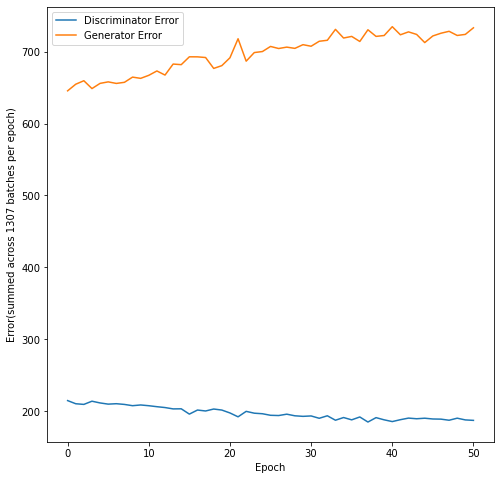

In [59]:
fig = plt.gcf()
fig.set_size_inches(8,8)
plt.plot(depocherr)
plt.plot(gepocherr)
plt.xlabel('Epoch')
plt.ylabel('Error(summed across 1307 batches per epoch)')
plt.legend(['Discriminator Error', 'Generator Error'])
plt.show()

KeyboardInterrupt: 

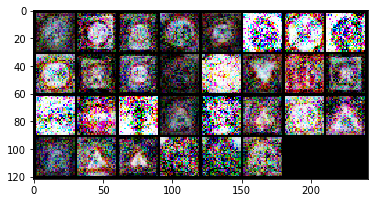

In [60]:
def show(img):
    npimg = img.detach().cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)), interpolation='nearest')
    display.display(plt.gcf())
    display.clear_output(wait=True)

from time import sleep
from IPython import display

label_arr = [i for i in range(30)]
while(True):
    z = Variable(Tensor(np.random.normal(0, 1, (30, 100))))
    label = Variable(LongTensor(label_arr))
    gen_imgs = generator(z,label)
    show(make_grid(gen_imgs.data))
    sleep(4)
